In [1]:
import tensorflow as tf

#physical_devices = tf.config.list_physical_devices('GPU')
#tf.config.set_visible_devices(physical_devices[1:],'GPU')

tf.executing_eagerly()
print(tf.executing_eagerly())

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import math
import random
import time
import functools

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras import datasets, Input, layers, models, Model, losses
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, LSTM
from IPython import display
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

True


In [2]:
physical_devices = tf.config.list_physical_devices('GPU') 
for gpu_instance in physical_devices: 
    tf.config.experimental.set_memory_growth(gpu_instance, True)

tf.device('/GPU:1')
tf.config.experimental.list_physical_devices('GPU')

strategy = tf.distribute.MirroredStrategy()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


# Input data stream

In [3]:
input_params = data = pd.read_table('input_data/condition.txt', header = None)

datasetNo = int(input_params.values[5,2])
n_epochs = int(input_params.values[10,2])
batch_size = int(input_params.values[11,2])
LR =float(input_params.values[12,2])
Lv1_latent_dim = int(input_params.values[13,2])
stride1 = int(input_params.values[14,2])
stride2 = int(input_params.values[15,2])
stride3 = int(input_params.values[16,2])
C1 = int(input_params.values[17,2])
C2 = int(input_params.values[18,2])
C3 = int(input_params.values[19,2])
C4 = int(input_params.values[20,2])
C5 = int(input_params.values[21,2])
alpha = int(input_params.values[22,2])

num_param = int(input_params.values[1,2])
num_time = int(input_params.values[2,2])
num_time_to = int(input_params.values[27,2])
num_node = int(input_params.values[3,2])
num_var = int(input_params.values[4,2])

epoch_read = int(input_params.values[25,2])
epoch_latent = int(input_params.values[26,2])

print('num_param : ', num_param)
print('num_time : ', num_time)
print('num_node : ', num_node)
print('num_var : ', num_var)
print(' ')
print('datasetNo : ', datasetNo)
print('Lv1_epochs : ', n_epochs)
print('Lv1_batch_size : ', batch_size)
print('Lv1_LearningRate : ', LR)
print('Lv1_latent_dim : ', Lv1_latent_dim)

num_param :  10
num_time :  800
num_node :  100
num_var :  1
 
datasetNo :  1
Lv1_epochs :  500000
Lv1_batch_size :  1
Lv1_LearningRate :  0.0002
Lv1_latent_dim :  128


In [4]:
data_save = np.zeros((num_var, num_node,num_param*num_time))
data = np.zeros((num_node,num_param*num_time))

if datasetNo == 1:
    data = pd.read_csv('input_data/FOM_u_sorted.csv', header = None)
    print(data.shape)
    #print(data)
    data_save[0,0:num_node,:]=data.values[0:num_node,:]

if datasetNo == 2:
    del(data)
    data = pd.read_csv('input_data/FOM_v_sorted.csv', header = None)
    print(data.shape)
    data_save[0,0:num_node,:]=data.values[0:num_node,:]

if datasetNo == 3:
    del(data)
    data = pd.read_csv('input_data/FOM_x_sorted.csv', header = None)
    print(data.shape)
    data_save[0,0:num_node,:]=data.values[0:num_node,:]

if datasetNo == 4:
    del(data)
    data = pd.read_csv('input_data/FOM_y_sorted.csv', header = None)
    print(data.shape)
    data_save[0,0:num_node,:]=data.values[0:num_node,:]
    del(data)


# Data_save shape : (num_var, num_node, num_time x num_param)

print(data_save.shape)
print(len(np.transpose(data_save)))

data=data_save

(14300, 8000)
(1, 100, 8000)
8000


In [5]:
# validate
data.shape

(1, 100, 8000)

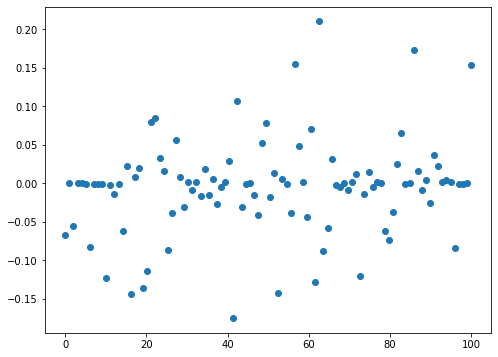

In [6]:
x_axis = np.linspace(0,num_node,num_node)
plt.scatter(x_axis, data[0,:,0])

## FOM data type : FOM_data = np.array[param, time, node, var]

In [7]:
FOM_data = np.zeros((num_param, num_node, num_time))

for i in range(num_var):
    for j in range(num_node):
        for k in range(num_param):
            for l in range(num_time):
                temp = l+k*num_time
                #print(l, k, temp)
                FOM_data[k,j,l]=data[i,j,temp]
                
FOM_data.shape

FOM_data_temp = np.zeros((num_param, num_node, num_time))
FOM_data_temp = FOM_data
del FOM_data
num_time = num_time_to
FOM_data = np.zeros((num_param, num_node, num_time))

FOM_data[:,:,0:num_time] = FOM_data_temp[:,:,0:num_time]
del FOM_data_temp

#del data

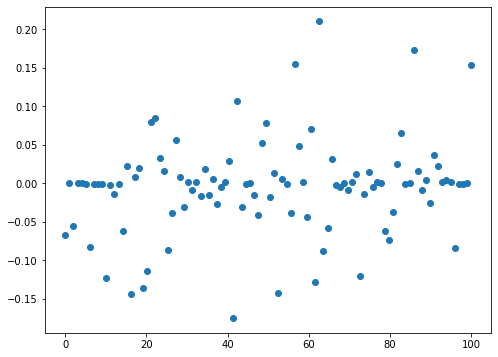

In [8]:
plt.scatter(x_axis, FOM_data[0,:,0])

## Scale data to [0,1]

In [9]:
maximum = np.amax(FOM_data)
minimum = np.amin(FOM_data)
mean = np.mean(FOM_data)
AT = maximum-minimum

print(maximum)
print(minimum)
print(mean)
print(AT)

1.8047008785
-2.14637945807875
1.4747403298542849e-15
3.95108033657875


In [10]:
FOM_data = FOM_data-mean
FOM_data = FOM_data/AT
min_FOM = np.min(FOM_data)
FOM_data = FOM_data-min_FOM

print(np.max(FOM_data))
print(np.min(FOM_data))

1.0
0.0


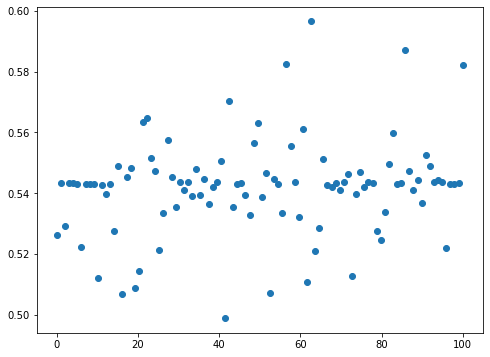

In [11]:
plt.scatter(x_axis, FOM_data[0,:,0])

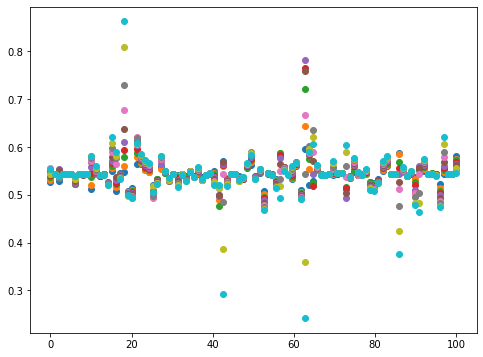

In [12]:
for i in range(num_param):
    plt.scatter(x_axis, FOM_data[i,:,0])

# Level 1, SVAE (spatial VAE)

In [13]:
Lv1_input = np.zeros((num_param,num_node, num_time))
# Lv1_input = (num_param x num_time, num_node, num_var)

Lv1_input = FOM_data#.reshape(-1, num_node, num_var)
    
Lv1_input.shape
del FOM_data
# Lv1_input is elongated w.r.t. param, 1,2,3,4,..../param change/1,2,3,4,.....

In [14]:
#validate

Lv1_input[9,0,0]
Lv1_input_shape_decoder = Lv1_input.shape[1]

In [15]:
Lv1_input_shape = Lv1_input.shape[1:]

In [16]:
print(Lv1_input.shape)
print(Lv1_input_shape)

(10, 100, 800)
(100, 800)


# Encoder

In [17]:

def encoder():
    x_input=layers.Input(shape=Lv1_input_shape)
    #x=layers.ZeroPadding1D(2)(x_input)
    
    x=layers.Conv1D(C1, 5, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(x_input)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)
    
    x=layers.Conv1D(C2, 5, strides=stride2, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)   
    
    x=layers.Conv1D(C3, 5, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)
    
    """
    x=layers.Conv1D(C4, 5, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)
    
    x=layers.Conv1D(C5, 5, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)
    
    x=layers.Conv1D(C4, 5, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)
    
    x=layers.Conv1D(C5, 5, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    x=layers.LeakyReLU(0.2)(x)
    x=layers.Dropout(0.3)(x)"""
    
    ################################################################################################0
    #x=layers.Conv2D(1, 5, strides=1, padding='same', kernel_initializer='glorot_uniform')(x)
    #x=layers.BatchNormalization()(x)
    #x=layers.LeakyReLU(0.2)(x)
    #x=layers.Dropout(0.3)(x)
    ################################################################################################0
    
    x=layers.Flatten()(x)
    
    #mu=layers.Dense(Lv1_latent_dim, kernel_initializer='glorot_uniform')(x)
    #var=layers.Dense(Lv1_latent_dim, kernel_initializer='glorot_uniform')(x)
    #var=layers.Activation(tf.nn.softplus)(var) # var > 0
    
    #eps = tf.random.normal(shape=[Lv1_latent_dim], mean=0.0, stddev=1.0)
    z = layers.Dense(Lv1_latent_dim)(x)
    
    en_coder = tf.keras.models.Model(x_input, [z], name="ENCODER")
    return en_coder

Encoder=encoder()
Encoder.summary()
#tf.keras.utils.plot_model(Encoder, show_shapes=True)

Model: "ENCODER"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100, 800)]        0         
_________________________________________________________________
conv1d (Conv1D)              (None, 100, 256)          1024256   
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100, 256)          0         
_________________________________________________________________
dropout (Dropout)            (None, 100, 256)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 100, 512)          655872    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 100, 512)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 100, 512)          0   

# Decoder

In [18]:
print(Lv1_latent_dim)
print(Lv1_input_shape_decoder)
print(Lv1_input_shape)
print(Lv1_input.shape[0])
print(int(Lv1_input.shape[1]/4)*int(Lv1_input.shape[2]/4)*Lv1_latent_dim)

128
100
(100, 800)
10
640000


In [19]:
strides = stride1*stride2*stride3

In [20]:
def decoder():
    z_input=layers.Input(shape=(Lv1_latent_dim))
    
    z=layers.Dense(int(Lv1_input.shape[1]/strides)*int(Lv1_input.shape[2]/strides)*num_var, kernel_initializer='glorot_uniform')(z_input)
    z=layers.LeakyReLU(alpha=0.3)(z)
    
    z=layers.Reshape([int(Lv1_input.shape[1]/strides),int(Lv1_input.shape[2]/strides)])(z)
    
    """
    z=layers.Conv1DTranspose(C5, 4, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)
    
    z=layers.Conv1DTranspose(C4, 4, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)
    
    z=layers.Conv1DTranspose(C5, 4, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)
    
    z=layers.Conv1DTranspose(C4, 4, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)"""
    
    z=layers.Conv1DTranspose(C3, 4, strides=stride1, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)
    
    z=layers.Conv1DTranspose(C2, 4, strides=stride2, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)
    
    z=layers.Conv1DTranspose(C1, 4, strides=stride3, padding='same', kernel_initializer='glorot_uniform')(z)
    #z=layers.BatchNormalization()(z)
    z=layers.LeakyReLU(alpha=0.3)(z)
    z=layers.Dropout(0.3)(z)    
    
    
    ## Changed Dense(1, ...) to Dense(num_var, ....)
    #z_mu=layers.Dense(num_time, kernel_initializer='glorot_uniform')(z)
    #mu_prime=layers.Activation('tanh')(z_mu)
    
    ## Changed Dense(1, ...) to Dense(num_var, ....)
    #z_var=layers.Dense(num_time, kernel_initializer='glorot_uniform')(z)
    #var_prime=layers.Activation(tf.nn.softplus)(z_var) # var > 0
    ## I guess the 
    
    z = layers.Dense(num_time)(z)
    
    de_coder = tf.keras.models.Model(z_input, [z], name="DECODER")
    return de_coder

Decoder=decoder()
Decoder.summary()
#tf.keras.utils.plot_model(Decoder, show_shapes=True)

Model: "DECODER"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128)]             0         
_________________________________________________________________
dense_1 (Dense)              (None, 80000)             10320000  
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 80000)             0         
_________________________________________________________________
reshape (Reshape)            (None, 100, 800)          0         
_________________________________________________________________
conv1d_transpose (Conv1DTran (None, 100, 1024)         3277824   
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 100, 1024)         0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 100, 1024)         0   

# loss computation

In [21]:
def compute_loss(mu, var, mu_prime, var_prime, real_img, beta):
    
    reconstruction_error = tf.math.reduce_mean(tf.math.reduce_sum((0.5*tf.math.log(var_prime) + tf.math.square(real_img - mu_prime)/(2*var_prime)), 1))
    
    KL_divergence = tf.math.reduce_mean(0.5 * tf.math.reduce_sum((tf.math.square(mu) + var - tf.math.log(var) - 1), 1))
    
    VAE_loss = reconstruction_error + beta * KL_divergence # L(X0)+L(X1)+L(X2)
    
    mu_a = mu[1:num_param-1,:]
    mu_b = (mu[0:num_param-2,:]+mu[2:num_param,:])/2
    var_a = var[1:num_param-1,:]
    var_b = (var[0:num_param-2,:]+var[2:num_param,:])/4

    loss_constraint = tf.math.reduce_mean(0.5 * tf.math.reduce_sum((var_a/var_b + tf.math.square(mu_b - mu_a)/var_b - 1 + tf.math.log(var_b/var_a)),1))
    
    loss = VAE_loss + alpha * loss_constraint
    
    return loss

# VAE

In [22]:
class VAE(tf.keras.Model):
    def __init__(self, latent_dim, ENCODER, DECODER):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        self.ENCODER = ENCODER
        self.DECODER = DECODER
        
    def compile(self, opt, loss):
        super(VAE, self).compile()
        self.opt = opt
        self.loss = loss

    def train_step(self, real_img):
        if isinstance(data, tuple):
            real_img = real_img[0]
            
        with tf.GradientTape() as tape:
            # encoding
            latent_space = self.ENCODER(real_img, training=True)
            
            # decoding
            fake_img = self.DECODER(latent_space, training=True)
            
            # loss calculation
            loss = self.loss(real_img, fake_img)
            
        gradients = tape.gradient(loss, self.trainable_variables)
        self.opt.apply_gradients(zip(gradients, self.trainable_variables))
        return {"loss": loss}


# Save Model

In [23]:
class SaveModel(tf.keras.callbacks.Callback):
    def __init__(self, num_iter=n_epochs, latent_dim=Lv1_latent_dim):
        self.num_iter = num_iter
        self.latent_dim = Lv1_latent_dim
        
    def on_epoch_end(self, epoch, logs=None):
        if((epoch+1)%5000==0):
            if((epoch+1)%5000==0):          
                filename1 = 'Lv1_networks/decoder_%d.h5' % (epoch+1)
                filename2 = 'Lv1_networks/encoder_%d.h5' % (epoch+1)
                
                Decoder.save(filename1)
                Encoder.save(filename2)

In [24]:
Lv1_input.shape
print(type(Lv1_input))

<class 'numpy.ndarray'>


# Warm up

In [25]:
beta = K.variable(0.)
N_t = int(n_epochs * 0.25)

class WarmUp(tf.keras.callbacks.Callback):
    def __init__(self, beta):
        self.beta = beta
        
    def on_epoch_begin(self, epoch, logs=None):
        if epoch < N_t:
            K.set_value(self.beta, epoch / N_t)
        else:
            K.set_value(self.beta, 1)


In [26]:
Lv1_input.shape

(10, 100, 800)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=LR, beta_1=0.9, beta_2=0.99)

cbk1 = SaveModel(num_iter=n_epochs,latent_dim=Lv1_latent_dim)
cbk2 = WarmUp(beta)

#with strategy.scope():
vae = VAE(latent_dim=Lv1_latent_dim, ENCODER=Encoder, DECODER=Decoder)
vae.compile(opt=opt, loss=losses.MeanSquaredError())

vae.fit(Lv1_input, batch_size=batch_size, epochs=n_epochs, callbacks=[cbk1])
#vae.fit(Lv1_input, batch_size=batch_size, epochs=n_epochs, callbacks=[cbk1, cbk2])
end = time.time()

print(end-start)

Epoch 1/500000
10/10 [==============================] - 519s 12ms/step - loss: 0.2847
Epoch 2/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.1882
Epoch 3/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0963
Epoch 4/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0569
Epoch 5/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0377
Epoch 6/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0312
Epoch 7/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0431
Epoch 8/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0330
Epoch 9/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0276
Epoch 10/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0265
Epoch 11/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0208
Epoch 12/500000
10/10 [==============================] - 0s 11ms/step - 

10/10 [==============================] - 0s 12ms/step - loss: 0.0078
Epoch 98/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0086
Epoch 99/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0057
Epoch 100/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0059
Epoch 101/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0057
Epoch 102/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0061
Epoch 103/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0059
Epoch 104/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0059
Epoch 105/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0052
Epoch 106/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0049
Epoch 107/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0059
Epoch 108/500000
10/10 [==============================] - 0s 12ms/step - 

10/10 [==============================] - 0s 12ms/step - loss: 0.0045
Epoch 193/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0046
Epoch 194/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0050
Epoch 195/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0057
Epoch 196/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0080
Epoch 197/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0074
Epoch 198/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0059
Epoch 199/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0054
Epoch 200/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0046
Epoch 201/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0052
Epoch 202/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0041
Epoch 203/500000
10/10 [==============================] - 0s 11ms/step 

10/10 [==============================] - 0s 12ms/step - loss: 0.0022
Epoch 288/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0019
Epoch 289/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0018
Epoch 290/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0018
Epoch 291/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0017
Epoch 292/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0019
Epoch 293/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0019
Epoch 294/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0022
Epoch 295/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0018
Epoch 296/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0018
Epoch 297/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 298/500000
10/10 [==============================] - 0s 11ms/step 

10/10 [==============================] - 0s 11ms/step - loss: 0.0015
Epoch 383/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0015
Epoch 384/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 385/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 386/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0017
Epoch 387/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0020
Epoch 388/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0017
Epoch 389/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0989
Epoch 390/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0353
Epoch 391/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0196
Epoch 392/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0116
Epoch 393/500000
10/10 [==============================] - 0s 12ms/step 

10/10 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 478/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0012
Epoch 479/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 480/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 481/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0012
Epoch 482/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0012
Epoch 483/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 484/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 485/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 486/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0012
Epoch 487/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 488/500000
10/10 [==============================] - 0s 11ms/step 

10/10 [==============================] - 0s 11ms/step - loss: 0.0027
Epoch 573/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0030
Epoch 574/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0027
Epoch 575/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0029
Epoch 576/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0033
Epoch 577/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0025
Epoch 578/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0028
Epoch 579/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0023
Epoch 580/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0028
Epoch 581/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0022
Epoch 582/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0026
Epoch 583/500000
10/10 [==============================] - 0s 11ms/step 

10/10 [==============================] - 0s 11ms/step - loss: 0.0054
Epoch 668/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0029
Epoch 669/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0029
Epoch 670/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0027
Epoch 671/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0023
Epoch 672/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0021
Epoch 673/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0016
Epoch 674/500000
10/10 [==============================] - 0s 12ms/step - loss: 0.0015
Epoch 675/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 676/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 677/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0015
Epoch 678/500000
10/10 [==============================] - 0s 11ms/step 

10/10 [==============================] - 0s 11ms/step - loss: 9.8495e-04
Epoch 762/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 763/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1785e-04
Epoch 764/500000
10/10 [==============================] - 0s 10ms/step - loss: 0.0011
Epoch 765/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5728e-04
Epoch 766/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 767/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0011
Epoch 768/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6404e-04
Epoch 769/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 770/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 771/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 772/500000
10/10 [==============================]

10/10 [==============================] - 0s 11ms/step - loss: 9.8792e-04
Epoch 855/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0011
Epoch 856/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0013
Epoch 857/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 858/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5199e-04
Epoch 859/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 860/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9139e-04
Epoch 861/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2310e-04
Epoch 862/500000
10/10 [==============================] - 0s 11ms/step - loss: 0.0010
Epoch 863/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1103e-04
Epoch 864/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6854e-04
Epoch 865/500000
10/10 [=======================

10/10 [==============================] - 0s 11ms/step - loss: 7.7863e-04
Epoch 946/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5802e-04
Epoch 947/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3884e-04
Epoch 948/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7228e-04
Epoch 949/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1628e-04
Epoch 950/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0774e-04
Epoch 951/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9855e-04
Epoch 952/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6753e-04
Epoch 953/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3236e-04
Epoch 954/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7058e-04
Epoch 955/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0015e-04
Epoch 956/500000
10/10 [===

Epoch 1036/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6456e-04
Epoch 1037/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9886e-04
Epoch 1038/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8295e-04
Epoch 1039/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4435e-04
Epoch 1040/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4516e-04
Epoch 1041/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2929e-04
Epoch 1042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8769e-04
Epoch 1043/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9837e-04
Epoch 1044/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0532e-04
Epoch 1045/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6871e-04
Epoch 1046/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8183e-04

10/10 [==============================] - 0s 11ms/step - loss: 5.3012e-04
Epoch 1127/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.5204e-04
Epoch 1128/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.5096e-04
Epoch 1129/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9841e-04
Epoch 1130/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0335e-04
Epoch 1131/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9369e-04
Epoch 1132/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7484e-04
Epoch 1133/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9160e-04
Epoch 1134/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.6322e-04
Epoch 1135/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.3204e-04
Epoch 1136/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.2777e-04
Epoch 1137/500000

10/10 [==============================] - 0s 11ms/step - loss: 3.4677e-04
Epoch 1217/500000
10/10 [==============================] - 0s 12ms/step - loss: 3.8629e-04
Epoch 1218/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.2582e-04
Epoch 1219/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.0746e-04
Epoch 1220/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.4103e-04
Epoch 1221/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6507e-04
Epoch 1222/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8783e-04
Epoch 1223/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.2505e-04
Epoch 1224/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.2772e-04
Epoch 1225/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.1616e-04
Epoch 1226/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.6924e-04
Epoch 1227/500000

10/10 [==============================] - 0s 11ms/step - loss: 3.7790e-04
Epoch 1307/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.9974e-04
Epoch 1308/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.1310e-04
Epoch 1309/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.8231e-04
Epoch 1310/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.6245e-04
Epoch 1311/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.5748e-04
Epoch 1312/500000
10/10 [==============================] - 0s 12ms/step - loss: 3.5829e-04
Epoch 1313/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.3633e-04
Epoch 1314/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.6344e-04
Epoch 1315/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6088e-04
Epoch 1316/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.8300e-04
Epoch 1317/500000

10/10 [==============================] - 0s 11ms/step - loss: 2.6018e-04
Epoch 1397/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.8863e-04
Epoch 1398/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.4314e-04
Epoch 1399/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.4969e-04
Epoch 1400/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.5039e-04
Epoch 1401/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.0004e-04
Epoch 1402/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.0438e-04
Epoch 1403/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.2857e-04
Epoch 1404/500000
10/10 [==============================] - 0s 12ms/step - loss: 3.3047e-04
Epoch 1405/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.0343e-04
Epoch 1406/500000
10/10 [==============================] - 0s 11ms/step - loss: 3.0400e-04
Epoch 1407/500000

10/10 [==============================] - 0s 11ms/step - loss: 2.4990e-04
Epoch 1487/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.3191e-04
Epoch 1488/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.3404e-04
Epoch 1489/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.4873e-04
Epoch 1490/500000
10/10 [==============================] - 0s 10ms/step - loss: 2.2964e-04
Epoch 1491/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.3055e-04
Epoch 1492/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.3957e-04
Epoch 1493/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.2667e-04
Epoch 1494/500000
10/10 [==============================] - 0s 12ms/step - loss: 2.4939e-04
Epoch 1495/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.9688e-04
Epoch 1496/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.4973e-04
Epoch 1497/500000

10/10 [==============================] - 0s 12ms/step - loss: 2.0104e-04
Epoch 1577/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.2618e-04
Epoch 1578/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.8395e-04
Epoch 1579/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.0513e-04
Epoch 1580/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.1835e-04
Epoch 1581/500000
10/10 [==============================] - 0s 12ms/step - loss: 2.0259e-04
Epoch 1582/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.3524e-04
Epoch 1583/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.8447e-04
Epoch 1584/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.9455e-04
Epoch 1585/500000
10/10 [==============================] - 0s 12ms/step - loss: 2.1308e-04
Epoch 1586/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.7543e-04
Epoch 1587/500000

10/10 [==============================] - 0s 12ms/step - loss: 3.2734e-04
Epoch 1667/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.7407e-04
Epoch 1668/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.6848e-04
Epoch 1669/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.4374e-04
Epoch 1670/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.2532e-04
Epoch 1671/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.8354e-04
Epoch 1672/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.7347e-04
Epoch 1673/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.9848e-04
Epoch 1674/500000
10/10 [==============================] - 0s 12ms/step - loss: 2.0989e-04
Epoch 1675/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.0325e-04
Epoch 1676/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.7509e-04
Epoch 1677/500000

10/10 [==============================] - 0s 12ms/step - loss: 1.5611e-04
Epoch 1757/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4056e-04
Epoch 1758/500000
10/10 [==============================] - 0s 11ms/step - loss: 2.5824e-04
Epoch 1759/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.7609e-04
Epoch 1760/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.5481e-04
Epoch 1761/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4537e-04
Epoch 1762/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.5889e-04
Epoch 1763/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.5966e-04
Epoch 1764/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.6266e-04
Epoch 1765/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.6284e-04
Epoch 1766/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4343e-04
Epoch 1767/500000

10/10 [==============================] - 0s 12ms/step - loss: 1.7063e-04
Epoch 1847/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4045e-04
Epoch 1848/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3558e-04
Epoch 1849/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3347e-04
Epoch 1850/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1597e-04
Epoch 1851/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3628e-04
Epoch 1852/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2942e-04
Epoch 1853/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2839e-04
Epoch 1854/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1261e-04
Epoch 1855/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3354e-04
Epoch 1856/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1748e-04
Epoch 1857/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0584e-04
Epoch 1937/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.5449e-04
Epoch 1938/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.5969e-04
Epoch 1939/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3295e-04
Epoch 1940/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1469e-04
Epoch 1941/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3772e-04
Epoch 1942/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3084e-04
Epoch 1943/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4239e-04
Epoch 1944/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2791e-04
Epoch 1945/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3966e-04
Epoch 1946/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.2322e-04
Epoch 1947/500000

10/10 [==============================] - 0s 10ms/step - loss: 1.2755e-04
Epoch 2027/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.4580e-04
Epoch 2028/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.3899e-04
Epoch 2029/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.3299e-04
Epoch 2030/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2631e-04
Epoch 2031/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1005e-04
Epoch 2032/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.2008e-04
Epoch 2033/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1058e-04
Epoch 2034/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1171e-04
Epoch 2035/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2747e-04
Epoch 2036/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2017e-04
Epoch 2037/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.2592e-04
Epoch 2117/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3923e-04
Epoch 2118/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3116e-04
Epoch 2119/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3215e-04
Epoch 2120/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1465e-04
Epoch 2121/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4123e-04
Epoch 2122/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.3845e-04
Epoch 2123/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1431e-04
Epoch 2124/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3891e-04
Epoch 2125/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1712e-04
Epoch 2126/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2526e-04
Epoch 2127/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.8726e-05
Epoch 2207/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4585e-05
Epoch 2208/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0560e-04
Epoch 2209/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7007e-05
Epoch 2210/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1071e-04
Epoch 2211/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2990e-05
Epoch 2212/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0568e-04
Epoch 2213/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1911e-04
Epoch 2214/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1012e-04
Epoch 2215/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0388e-04
Epoch 2216/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.2772e-04
Epoch 2217/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.1309e-04
Epoch 2297/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2075e-04
Epoch 2298/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0799e-04
Epoch 2299/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0718e-04
Epoch 2300/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3417e-04
Epoch 2301/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0936e-04
Epoch 2302/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0518e-05
Epoch 2303/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2650e-05
Epoch 2304/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0864e-04
Epoch 2305/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0069e-04
Epoch 2306/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1219e-04
Epoch 2307/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.5215e-04
Epoch 2387/500000
10/10 [==============================] - 0s 10ms/step - loss: 1.2357e-04
Epoch 2388/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3284e-04
Epoch 2389/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8340e-05
Epoch 2390/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3626e-04
Epoch 2391/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0522e-04
Epoch 2392/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1137e-04
Epoch 2393/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2166e-04
Epoch 2394/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0624e-04
Epoch 2395/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7073e-05
Epoch 2396/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0622e-04
Epoch 2397/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0623e-04
Epoch 2477/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8563e-05
Epoch 2478/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8926e-05
Epoch 2479/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.6736e-05
Epoch 2480/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9863e-05
Epoch 2481/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5675e-05
Epoch 2482/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0115e-04
Epoch 2483/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0079e-04
Epoch 2484/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1978e-04
Epoch 2485/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4242e-05
Epoch 2486/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1321e-04
Epoch 2487/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0113e-04
Epoch 2567/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1164e-04
Epoch 2568/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1498e-04
Epoch 2569/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2799e-04
Epoch 2570/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2150e-04
Epoch 2571/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0814e-04
Epoch 2572/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1155e-04
Epoch 2573/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2641e-04
Epoch 2574/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1473e-04
Epoch 2575/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0863e-04
Epoch 2576/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7428e-05
Epoch 2577/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.3030e-05
Epoch 2657/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3814e-05
Epoch 2658/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3835e-05
Epoch 2659/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.1827e-05
Epoch 2660/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8352e-05
Epoch 2661/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3647e-05
Epoch 2662/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0166e-04
Epoch 2663/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0127e-04
Epoch 2664/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.9117e-05
Epoch 2665/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9006e-05
Epoch 2666/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0154e-05
Epoch 2667/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.0025e-05
Epoch 2747/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.9580e-05
Epoch 2748/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1275e-05
Epoch 2749/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6715e-05
Epoch 2750/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.1522e-05
Epoch 2751/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1155e-05
Epoch 2752/500000
10/10 [==============================] - 0s 10ms/step - loss: 8.9704e-05
Epoch 2753/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2154e-04
Epoch 2754/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2118e-04
Epoch 2755/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0522e-04
Epoch 2756/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2191e-04
Epoch 2757/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.0905e-05
Epoch 2837/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6672e-05
Epoch 2838/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.4219e-04
Epoch 2839/500000
10/10 [==============================] - 0s 10ms/step - loss: 1.0980e-04
Epoch 2840/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0677e-04
Epoch 2841/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0221e-04
Epoch 2842/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.5864e-05
Epoch 2843/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9116e-05
Epoch 2844/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1345e-05
Epoch 2845/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.2378e-05
Epoch 2846/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7490e-05
Epoch 2847/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.3259e-05
Epoch 2927/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.2381e-05
Epoch 2928/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7442e-05
Epoch 2929/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4690e-05
Epoch 2930/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6393e-05
Epoch 2931/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7143e-05
Epoch 2932/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1098e-05
Epoch 2933/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8211e-05
Epoch 2934/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5532e-05
Epoch 2935/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9678e-05
Epoch 2936/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7208e-05
Epoch 2937/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0213e-04
Epoch 3017/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2675e-04
Epoch 3018/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.4124e-04
Epoch 3019/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0895e-04
Epoch 3020/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.6865e-05
Epoch 3021/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.8249e-05
Epoch 3022/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.3533e-05
Epoch 3023/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.1700e-04
Epoch 3024/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0241e-04
Epoch 3025/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0636e-04
Epoch 3026/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.9523e-05
Epoch 3027/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.5375e-05
Epoch 3107/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.7108e-05
Epoch 3108/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0758e-04
Epoch 3109/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2836e-04
Epoch 3110/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1077e-04
Epoch 3111/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5165e-05
Epoch 3112/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1358e-04
Epoch 3113/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.7109e-05
Epoch 3114/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.8685e-05
Epoch 3115/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9211e-05
Epoch 3116/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6915e-05
Epoch 3117/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.0398e-05
Epoch 3197/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2184e-05
Epoch 3198/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1997e-05
Epoch 3199/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6153e-05
Epoch 3200/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4848e-05
Epoch 3201/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0269e-05
Epoch 3202/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7881e-05
Epoch 3203/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3336e-05
Epoch 3204/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6275e-05
Epoch 3205/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5906e-05
Epoch 3206/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6134e-05
Epoch 3207/500000

10/10 [==============================] - 0s 12ms/step - loss: 8.9611e-05
Epoch 3287/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.2978e-05
Epoch 3288/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6932e-05
Epoch 3289/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0356e-05
Epoch 3290/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8919e-05
Epoch 3291/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6112e-05
Epoch 3292/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9854e-05
Epoch 3293/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7676e-05
Epoch 3294/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8046e-05
Epoch 3295/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1550e-05
Epoch 3296/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4900e-05
Epoch 3297/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.0421e-05
Epoch 3377/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0487e-04
Epoch 3378/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.4229e-05
Epoch 3379/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7724e-05
Epoch 3380/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1989e-05
Epoch 3381/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0055e-04
Epoch 3382/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4077e-05
Epoch 3383/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7973e-05
Epoch 3384/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6251e-05
Epoch 3385/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0138e-05
Epoch 3386/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.5715e-05
Epoch 3387/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.4759e-05
Epoch 3467/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.2085e-05
Epoch 3468/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7631e-05
Epoch 3469/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5052e-05
Epoch 3470/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.0446e-05
Epoch 3471/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8100e-05
Epoch 3472/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0612e-05
Epoch 3473/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8913e-05
Epoch 3474/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3842e-05
Epoch 3475/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6319e-05
Epoch 3476/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5941e-05
Epoch 3477/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.9585e-05
Epoch 3557/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1398e-05
Epoch 3558/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3297e-04
Epoch 3559/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0129e-04
Epoch 3560/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0791e-04
Epoch 3561/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.9855e-05
Epoch 3562/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9837e-05
Epoch 3563/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6395e-05
Epoch 3564/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0994e-04
Epoch 3565/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.0226e-05
Epoch 3566/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4016e-05
Epoch 3567/500000

10/10 [==============================] - 0s 12ms/step - loss: 1.1092e-04
Epoch 3647/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0625e-04
Epoch 3648/500000
10/10 [==============================] - 0s 10ms/step - loss: 9.1311e-05
Epoch 3649/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9411e-05
Epoch 3650/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3561e-04
Epoch 3651/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3926e-05
Epoch 3652/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.4831e-05
Epoch 3653/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4025e-05
Epoch 3654/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8809e-05
Epoch 3655/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8902e-05
Epoch 3656/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9506e-05
Epoch 3657/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.9040e-05
Epoch 3737/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.0320e-05
Epoch 3738/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1487e-05
Epoch 3739/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5659e-05
Epoch 3740/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0740e-05
Epoch 3741/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7427e-05
Epoch 3742/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.8931e-05
Epoch 3743/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1028e-05
Epoch 3744/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2934e-05
Epoch 3745/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4288e-05
Epoch 3746/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.4827e-05
Epoch 3747/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.1149e-04
Epoch 3827/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5088e-05
Epoch 3828/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0007e-05
Epoch 3829/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5716e-05
Epoch 3830/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3659e-05
Epoch 3831/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1386e-05
Epoch 3832/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4882e-05
Epoch 3833/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4324e-05
Epoch 3834/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1817e-04
Epoch 3835/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.3177e-04
Epoch 3836/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3045e-05
Epoch 3837/500000

10/10 [==============================] - 0s 12ms/step - loss: 8.1161e-05
Epoch 3917/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4458e-05
Epoch 3918/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2985e-05
Epoch 3919/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0610e-05
Epoch 3920/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2699e-05
Epoch 3921/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7438e-05
Epoch 3922/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1950e-05
Epoch 3923/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2017e-05
Epoch 3924/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1696e-05
Epoch 3925/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6049e-05
Epoch 3926/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0942e-05
Epoch 3927/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.3717e-05
Epoch 4007/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.9675e-05
Epoch 4008/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8757e-05
Epoch 4009/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1325e-05
Epoch 4010/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8752e-05
Epoch 4011/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8524e-05
Epoch 4012/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9474e-05
Epoch 4013/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8878e-05
Epoch 4014/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6830e-05
Epoch 4015/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2486e-05
Epoch 4016/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4201e-05
Epoch 4017/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.3298e-05
Epoch 4097/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4901e-05
Epoch 4098/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9078e-05
Epoch 4099/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2174e-05
Epoch 4100/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3408e-05
Epoch 4101/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0516e-05
Epoch 4102/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5311e-05
Epoch 4103/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9132e-05
Epoch 4104/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9624e-05
Epoch 4105/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7228e-05
Epoch 4106/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3798e-05
Epoch 4107/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0288e-04
Epoch 4187/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1146e-04
Epoch 4188/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6605e-05
Epoch 4189/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2022e-05
Epoch 4190/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5959e-05
Epoch 4191/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2748e-05
Epoch 4192/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8709e-05
Epoch 4193/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2311e-05
Epoch 4194/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6326e-05
Epoch 4195/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5580e-05
Epoch 4196/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3396e-05
Epoch 4197/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.2205e-05
Epoch 4277/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3773e-05
Epoch 4278/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4996e-05
Epoch 4279/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1913e-05
Epoch 4280/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3475e-05
Epoch 4281/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1835e-05
Epoch 4282/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3730e-05
Epoch 4283/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3124e-05
Epoch 4284/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8212e-05
Epoch 4285/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7007e-05
Epoch 4286/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0952e-05
Epoch 4287/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.6122e-05
Epoch 4367/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0562e-05
Epoch 4368/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7028e-05
Epoch 4369/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3933e-05
Epoch 4370/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0282e-05
Epoch 4371/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3374e-05
Epoch 4372/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7108e-05
Epoch 4373/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3053e-05
Epoch 4374/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8897e-05
Epoch 4375/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4741e-05
Epoch 4376/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4850e-05
Epoch 4377/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.9217e-05
Epoch 4457/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6878e-05
Epoch 4458/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8818e-05
Epoch 4459/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8021e-05
Epoch 4460/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9585e-05
Epoch 4461/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5754e-05
Epoch 4462/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1930e-05
Epoch 4463/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9888e-05
Epoch 4464/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7413e-05
Epoch 4465/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0704e-05
Epoch 4466/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5850e-05
Epoch 4467/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.4968e-05
Epoch 4547/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8937e-05
Epoch 4548/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6329e-05
Epoch 4549/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.3173e-05
Epoch 4550/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2884e-05
Epoch 4551/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5046e-05
Epoch 4552/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5681e-05
Epoch 4553/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2272e-05
Epoch 4554/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6196e-05
Epoch 4555/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5328e-05
Epoch 4556/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0658e-05
Epoch 4557/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.5877e-05
Epoch 4637/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.7482e-05
Epoch 4638/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9373e-05
Epoch 4639/500000
10/10 [==============================] - 0s 10ms/step - loss: 8.9151e-05
Epoch 4640/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2602e-05
Epoch 4641/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0142e-05
Epoch 4642/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5402e-05
Epoch 4643/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0069e-05
Epoch 4644/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3491e-05
Epoch 4645/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3761e-05
Epoch 4646/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7929e-05
Epoch 4647/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.6642e-05
Epoch 4727/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3524e-05
Epoch 4728/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7189e-05
Epoch 4729/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0433e-05
Epoch 4730/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0592e-05
Epoch 4731/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9614e-05
Epoch 4732/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.2611e-05
Epoch 4733/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4912e-05
Epoch 4734/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8785e-05
Epoch 4735/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0764e-05
Epoch 4736/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7355e-05
Epoch 4737/500000

10/10 [==============================] - 0s 10ms/step - loss: 7.7470e-05
Epoch 4817/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7001e-05
Epoch 4818/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7642e-05
Epoch 4819/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9128e-05
Epoch 4820/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2404e-05
Epoch 4821/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4177e-05
Epoch 4822/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4337e-05
Epoch 4823/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2946e-05
Epoch 4824/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7795e-05
Epoch 4825/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6021e-05
Epoch 4826/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0184e-05
Epoch 4827/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.4170e-05
Epoch 4907/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9737e-05
Epoch 4908/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5593e-05
Epoch 4909/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1024e-05
Epoch 4910/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9982e-05
Epoch 4911/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7182e-05
Epoch 4912/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6376e-05
Epoch 4913/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9126e-05
Epoch 4914/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0894e-05
Epoch 4915/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4640e-05
Epoch 4916/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6726e-05
Epoch 4917/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.7674e-05
Epoch 4997/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7908e-05
Epoch 4998/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9533e-05
Epoch 4999/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8915e-05
Epoch 5000/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4402e-05
Epoch 5001/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2868e-05
Epoch 5002/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4587e-05
Epoch 5003/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8831e-05
Epoch 5004/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3452e-05
Epoch 5005/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3920e-05
Epoch 5006/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4597e-05
Epoch 5007/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.6617e-05
Epoch 5083/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8390e-05
Epoch 5084/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5238e-05
Epoch 5085/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9969e-05
Epoch 5086/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4147e-05
Epoch 5087/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9647e-05
Epoch 5088/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0672e-05
Epoch 5089/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5624e-05
Epoch 5090/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.7207e-05
Epoch 5091/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6796e-05
Epoch 5092/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1622e-04
Epoch 5093/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.5944e-05
Epoch 5173/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.8831e-05
Epoch 5174/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8224e-05
Epoch 5175/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9645e-05
Epoch 5176/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8874e-05
Epoch 5177/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9095e-05
Epoch 5178/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5385e-05
Epoch 5179/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3714e-05
Epoch 5180/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1554e-05
Epoch 5181/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5146e-05
Epoch 5182/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8384e-05
Epoch 5183/500000

10/10 [==============================] - 0s 11ms/step - loss: 9.4744e-05
Epoch 5263/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0479e-04
Epoch 5264/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4949e-05
Epoch 5265/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6703e-05
Epoch 5266/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5369e-05
Epoch 5267/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4550e-05
Epoch 5268/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1093e-05
Epoch 5269/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7782e-05
Epoch 5270/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7796e-05
Epoch 5271/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0603e-05
Epoch 5272/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0338e-05
Epoch 5273/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.2333e-05
Epoch 5353/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3239e-05
Epoch 5354/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5063e-05
Epoch 5355/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9225e-05
Epoch 5356/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5620e-05
Epoch 5357/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7789e-05
Epoch 5358/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0938e-05
Epoch 5359/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8776e-05
Epoch 5360/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7173e-05
Epoch 5361/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8302e-05
Epoch 5362/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4916e-05
Epoch 5363/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.6580e-05
Epoch 5443/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.5583e-05
Epoch 5444/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6755e-05
Epoch 5445/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3793e-05
Epoch 5446/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1980e-05
Epoch 5447/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3268e-05
Epoch 5448/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5762e-05
Epoch 5449/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0034e-05
Epoch 5450/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6351e-05
Epoch 5451/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4965e-05
Epoch 5452/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.6964e-05
Epoch 5453/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.6016e-05
Epoch 5533/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8624e-05
Epoch 5534/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5778e-05
Epoch 5535/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5285e-05
Epoch 5536/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1574e-05
Epoch 5537/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5194e-05
Epoch 5538/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6422e-05
Epoch 5539/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6586e-05
Epoch 5540/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2681e-05
Epoch 5541/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7953e-05
Epoch 5542/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4575e-05
Epoch 5543/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.0888e-05
Epoch 5623/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9960e-05
Epoch 5624/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9816e-05
Epoch 5625/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1989e-05
Epoch 5626/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7262e-05
Epoch 5627/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1266e-05
Epoch 5628/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9261e-05
Epoch 5629/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9957e-05
Epoch 5630/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1416e-05
Epoch 5631/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9523e-05
Epoch 5632/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2653e-05
Epoch 5633/500000

10/10 [==============================] - 0s 12ms/step - loss: 8.6486e-05
Epoch 5713/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1683e-05
Epoch 5714/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3977e-05
Epoch 5715/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.6759e-05
Epoch 5716/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7702e-05
Epoch 5717/500000
10/10 [==============================] - 0s 10ms/step - loss: 9.7905e-05
Epoch 5718/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2624e-05
Epoch 5719/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0193e-05
Epoch 5720/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0492e-05
Epoch 5721/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.2122e-04
Epoch 5722/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0428e-04
Epoch 5723/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.9945e-05
Epoch 5803/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1028e-05
Epoch 5804/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8031e-05
Epoch 5805/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1286e-05
Epoch 5806/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1656e-05
Epoch 5807/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4827e-05
Epoch 5808/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7954e-05
Epoch 5809/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1511e-05
Epoch 5810/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5407e-05
Epoch 5811/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.0933e-05
Epoch 5812/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9324e-05
Epoch 5813/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.9762e-05
Epoch 5893/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2060e-05
Epoch 5894/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.3099e-05
Epoch 5895/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8713e-05
Epoch 5896/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6445e-05
Epoch 5897/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8860e-05
Epoch 5898/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4113e-05
Epoch 5899/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6561e-05
Epoch 5900/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3509e-05
Epoch 5901/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8059e-05
Epoch 5902/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8947e-05
Epoch 5903/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.6569e-05
Epoch 5983/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1215e-05
Epoch 5984/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0765e-05
Epoch 5985/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2719e-05
Epoch 5986/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6787e-05
Epoch 5987/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3654e-05
Epoch 5988/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1392e-05
Epoch 5989/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6010e-05
Epoch 5990/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0311e-05
Epoch 5991/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2932e-05
Epoch 5992/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3766e-05
Epoch 5993/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.0958e-05
Epoch 6073/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.6741e-05
Epoch 6074/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0323e-04
Epoch 6075/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3464e-05
Epoch 6076/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0227e-04
Epoch 6077/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4673e-05
Epoch 6078/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7267e-05
Epoch 6079/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1899e-05
Epoch 6080/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2218e-05
Epoch 6081/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0340e-05
Epoch 6082/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7419e-05
Epoch 6083/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.4445e-05
Epoch 6163/500000
10/10 [==============================] - 0s 10ms/step - loss: 7.7276e-05
Epoch 6164/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1898e-05
Epoch 6165/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7412e-05
Epoch 6166/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8264e-05
Epoch 6167/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3267e-05
Epoch 6168/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9240e-05
Epoch 6169/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8275e-05
Epoch 6170/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8726e-05
Epoch 6171/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3075e-05
Epoch 6172/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4424e-05
Epoch 6173/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.7244e-05
Epoch 6253/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0484e-05
Epoch 6254/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2546e-05
Epoch 6255/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8884e-05
Epoch 6256/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3164e-05
Epoch 6257/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0365e-04
Epoch 6258/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8869e-05
Epoch 6259/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8986e-05
Epoch 6260/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7460e-05
Epoch 6261/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2385e-05
Epoch 6262/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1020e-05
Epoch 6263/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.0466e-05
Epoch 6343/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5580e-05
Epoch 6344/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7511e-05
Epoch 6345/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6843e-05
Epoch 6346/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8855e-05
Epoch 6347/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7828e-05
Epoch 6348/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6815e-05
Epoch 6349/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1605e-05
Epoch 6350/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0817e-05
Epoch 6351/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7761e-05
Epoch 6352/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6619e-05
Epoch 6353/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.7124e-05
Epoch 6433/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7513e-05
Epoch 6434/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1690e-05
Epoch 6435/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8582e-05
Epoch 6436/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2988e-05
Epoch 6437/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1334e-05
Epoch 6438/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0590e-05
Epoch 6439/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8935e-05
Epoch 6440/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5904e-05
Epoch 6441/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4644e-05
Epoch 6442/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6129e-05
Epoch 6443/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.8226e-05
Epoch 6523/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7184e-05
Epoch 6524/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7523e-05
Epoch 6525/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7645e-05
Epoch 6526/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9787e-05
Epoch 6527/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5072e-05
Epoch 6528/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8098e-05
Epoch 6529/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9347e-05
Epoch 6530/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8923e-05
Epoch 6531/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4739e-05
Epoch 6532/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4780e-05
Epoch 6533/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.5184e-05
Epoch 6613/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9168e-05
Epoch 6614/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6153e-05
Epoch 6615/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2236e-05
Epoch 6616/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.3603e-05
Epoch 6617/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5059e-05
Epoch 6618/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7194e-05
Epoch 6619/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5890e-05
Epoch 6620/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9704e-05
Epoch 6621/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8366e-05
Epoch 6622/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4891e-05
Epoch 6623/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.9318e-05
Epoch 6703/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8247e-05
Epoch 6704/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5546e-05
Epoch 6705/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5751e-05
Epoch 6706/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3161e-05
Epoch 6707/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7610e-05
Epoch 6708/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9568e-05
Epoch 6709/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4306e-05
Epoch 6710/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9916e-05
Epoch 6711/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2292e-05
Epoch 6712/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8515e-05
Epoch 6713/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.7439e-05
Epoch 6793/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2174e-05
Epoch 6794/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2120e-05
Epoch 6795/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5760e-05
Epoch 6796/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1142e-05
Epoch 6797/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5005e-05
Epoch 6798/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1427e-05
Epoch 6799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8818e-05
Epoch 6800/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0652e-05
Epoch 6801/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3887e-05
Epoch 6802/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3414e-05
Epoch 6803/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.2505e-05
Epoch 6883/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5761e-05
Epoch 6884/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4237e-05
Epoch 6885/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3557e-05
Epoch 6886/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7715e-05
Epoch 6887/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9728e-05
Epoch 6888/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8481e-05
Epoch 6889/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7080e-05
Epoch 6890/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6398e-05
Epoch 6891/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3922e-05
Epoch 6892/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4758e-05
Epoch 6893/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.6015e-05
Epoch 6973/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1791e-05
Epoch 6974/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5293e-05
Epoch 6975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8638e-05
Epoch 6976/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4975e-05
Epoch 6977/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4239e-05
Epoch 6978/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0936e-04
Epoch 6979/500000
10/10 [==============================] - 0s 10ms/step - loss: 9.9468e-05
Epoch 6980/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7561e-05
Epoch 6981/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8152e-05
Epoch 6982/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9668e-05
Epoch 6983/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.1988e-05
Epoch 7063/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0953e-05
Epoch 7064/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5821e-05
Epoch 7065/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9395e-05
Epoch 7066/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9908e-05
Epoch 7067/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3685e-05
Epoch 7068/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6695e-05
Epoch 7069/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7751e-05
Epoch 7070/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0614e-05
Epoch 7071/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3356e-05
Epoch 7072/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3965e-05
Epoch 7073/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.3059e-05
Epoch 7153/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4966e-05
Epoch 7154/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9052e-05
Epoch 7155/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6699e-05
Epoch 7156/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6741e-05
Epoch 7157/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8107e-05
Epoch 7158/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8963e-05
Epoch 7159/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4110e-05
Epoch 7160/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4419e-05
Epoch 7161/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7531e-05
Epoch 7162/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6275e-05
Epoch 7163/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.5513e-05
Epoch 7243/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8723e-05
Epoch 7244/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5922e-05
Epoch 7245/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4919e-05
Epoch 7246/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5445e-05
Epoch 7247/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8742e-05
Epoch 7248/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5628e-05
Epoch 7249/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6884e-05
Epoch 7250/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3844e-05
Epoch 7251/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9717e-05
Epoch 7252/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8554e-05
Epoch 7253/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.7109e-05
Epoch 7333/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4974e-05
Epoch 7334/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3943e-05
Epoch 7335/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7734e-05
Epoch 7336/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3381e-05
Epoch 7337/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4807e-05
Epoch 7338/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9448e-05
Epoch 7339/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9341e-05
Epoch 7340/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0152e-05
Epoch 7341/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7395e-05
Epoch 7342/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5385e-05
Epoch 7343/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.3517e-05
Epoch 7423/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7596e-05
Epoch 7424/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0417e-05
Epoch 7425/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9839e-05
Epoch 7426/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.1700e-05
Epoch 7427/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4183e-05
Epoch 7428/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0876e-05
Epoch 7429/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5922e-05
Epoch 7430/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4446e-05
Epoch 7431/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1467e-05
Epoch 7432/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4995e-05
Epoch 7433/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.4581e-05
Epoch 7513/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5199e-05
Epoch 7514/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0522e-05
Epoch 7515/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3295e-05
Epoch 7516/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7733e-05
Epoch 7517/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1608e-05
Epoch 7518/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0187e-05
Epoch 7519/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0920e-05
Epoch 7520/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8648e-05
Epoch 7521/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8814e-05
Epoch 7522/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8693e-05
Epoch 7523/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.1882e-05
Epoch 7603/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4833e-05
Epoch 7604/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6366e-05
Epoch 7605/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7125e-05
Epoch 7606/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3201e-05
Epoch 7607/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7946e-05
Epoch 7608/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0784e-05
Epoch 7609/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0967e-05
Epoch 7610/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9164e-05
Epoch 7611/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9161e-05
Epoch 7612/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4351e-05
Epoch 7613/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.3970e-05
Epoch 7693/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9374e-05
Epoch 7694/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1145e-05
Epoch 7695/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7689e-05
Epoch 7696/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3616e-05
Epoch 7697/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4395e-05
Epoch 7698/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6766e-05
Epoch 7699/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.6515e-05
Epoch 7700/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4040e-05
Epoch 7701/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0849e-05
Epoch 7702/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3476e-05
Epoch 7703/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.0537e-05
Epoch 7783/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3974e-05
Epoch 7784/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8087e-05
Epoch 7785/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0133e-05
Epoch 7786/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9555e-05
Epoch 7787/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9570e-05
Epoch 7788/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1883e-05
Epoch 7789/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1681e-05
Epoch 7790/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3942e-05
Epoch 7791/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8343e-05
Epoch 7792/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1065e-05
Epoch 7793/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.8778e-05
Epoch 7873/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1061e-05
Epoch 7874/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4080e-05
Epoch 7875/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8568e-05
Epoch 7876/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7858e-05
Epoch 7877/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6098e-05
Epoch 7878/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6132e-05
Epoch 7879/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3259e-05
Epoch 7880/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1257e-05
Epoch 7881/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2645e-05
Epoch 7882/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0190e-05
Epoch 7883/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.4821e-05
Epoch 7963/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0877e-05
Epoch 7964/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5818e-05
Epoch 7965/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6745e-05
Epoch 7966/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2288e-05
Epoch 7967/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3923e-05
Epoch 7968/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5524e-05
Epoch 7969/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3073e-05
Epoch 7970/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8175e-05
Epoch 7971/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1362e-05
Epoch 7972/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2618e-05
Epoch 7973/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.5522e-05
Epoch 8053/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4004e-05
Epoch 8054/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5702e-05
Epoch 8055/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1440e-05
Epoch 8056/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3342e-05
Epoch 8057/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3920e-05
Epoch 8058/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7393e-05
Epoch 8059/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5511e-05
Epoch 8060/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9431e-05
Epoch 8061/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5144e-05
Epoch 8062/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8063e-05
Epoch 8063/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.6390e-05
Epoch 8143/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7091e-05
Epoch 8144/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3911e-05
Epoch 8145/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3636e-05
Epoch 8146/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9709e-05
Epoch 8147/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5860e-05
Epoch 8148/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9378e-05
Epoch 8149/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2977e-05
Epoch 8150/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3976e-05
Epoch 8151/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5909e-05
Epoch 8152/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2037e-05
Epoch 8153/500000

10/10 [==============================] - 0s 12ms/step - loss: 7.2443e-05
Epoch 8233/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7478e-05
Epoch 8234/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3048e-05
Epoch 8235/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9084e-05
Epoch 8236/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3979e-05
Epoch 8237/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7628e-05
Epoch 8238/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0055e-05
Epoch 8239/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3703e-05
Epoch 8240/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1402e-05
Epoch 8241/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1332e-05
Epoch 8242/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8222e-05
Epoch 8243/500000

10/10 [==============================] - 0s 10ms/step - loss: 7.7670e-05
Epoch 8323/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5307e-05
Epoch 8324/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3161e-05
Epoch 8325/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4964e-05
Epoch 8326/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2028e-05
Epoch 8327/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9567e-05
Epoch 8328/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4218e-05
Epoch 8329/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2135e-05
Epoch 8330/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3199e-05
Epoch 8331/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9393e-05
Epoch 8332/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9203e-05
Epoch 8333/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.4653e-05
Epoch 8413/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6506e-05
Epoch 8414/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7219e-05
Epoch 8415/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5605e-05
Epoch 8416/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3712e-05
Epoch 8417/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8061e-05
Epoch 8418/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.5388e-05
Epoch 8419/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0530e-05
Epoch 8420/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3726e-05
Epoch 8421/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5452e-05
Epoch 8422/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3821e-05
Epoch 8423/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.4275e-05
Epoch 8503/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6711e-05
Epoch 8504/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3061e-05
Epoch 8505/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2857e-05
Epoch 8506/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4968e-05
Epoch 8507/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4632e-05
Epoch 8508/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9771e-05
Epoch 8509/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8635e-05
Epoch 8510/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4832e-05
Epoch 8511/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1077e-05
Epoch 8512/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7177e-05
Epoch 8513/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.4747e-05
Epoch 8593/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7023e-05
Epoch 8594/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1695e-05
Epoch 8595/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1738e-05
Epoch 8596/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4041e-05
Epoch 8597/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1221e-05
Epoch 8598/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7822e-05
Epoch 8599/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9109e-05
Epoch 8600/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5959e-05
Epoch 8601/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5385e-05
Epoch 8602/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9864e-05
Epoch 8603/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.0562e-05
Epoch 8683/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7878e-05
Epoch 8684/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5787e-05
Epoch 8685/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9801e-05
Epoch 8686/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4032e-05
Epoch 8687/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5238e-05
Epoch 8688/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0187e-05
Epoch 8689/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0433e-05
Epoch 8690/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9153e-05
Epoch 8691/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6253e-05
Epoch 8692/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2102e-05
Epoch 8693/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.6367e-05
Epoch 8773/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4592e-05
Epoch 8774/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5460e-05
Epoch 8775/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7226e-05
Epoch 8776/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4915e-05
Epoch 8777/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5807e-05
Epoch 8778/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6971e-05
Epoch 8779/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9222e-05
Epoch 8780/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2405e-05
Epoch 8781/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1095e-05
Epoch 8782/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1748e-05
Epoch 8783/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.0490e-05
Epoch 8863/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6516e-05
Epoch 8864/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3704e-05
Epoch 8865/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5341e-05
Epoch 8866/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2110e-05
Epoch 8867/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1732e-05
Epoch 8868/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6428e-05
Epoch 8869/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4641e-05
Epoch 8870/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1412e-05
Epoch 8871/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8383e-05
Epoch 8872/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4756e-05
Epoch 8873/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.5664e-05
Epoch 8953/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6036e-05
Epoch 8954/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5031e-05
Epoch 8955/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6997e-05
Epoch 8956/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3733e-05
Epoch 8957/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9851e-05
Epoch 8958/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7935e-05
Epoch 8959/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3542e-05
Epoch 8960/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9750e-05
Epoch 8961/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6448e-05
Epoch 8962/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6231e-05
Epoch 8963/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.8444e-05
Epoch 9043/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7737e-05
Epoch 9044/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8914e-05
Epoch 9045/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7776e-05
Epoch 9046/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6158e-05
Epoch 9047/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2884e-05
Epoch 9048/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4394e-05
Epoch 9049/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3472e-05
Epoch 9050/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9345e-05
Epoch 9051/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1369e-05
Epoch 9052/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5539e-05
Epoch 9053/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.4713e-05
Epoch 9133/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9621e-05
Epoch 9134/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4432e-05
Epoch 9135/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1493e-05
Epoch 9136/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5080e-05
Epoch 9137/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2032e-05
Epoch 9138/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0247e-05
Epoch 9139/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5397e-05
Epoch 9140/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0824e-05
Epoch 9141/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8021e-05
Epoch 9142/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1140e-05
Epoch 9143/500000

10/10 [==============================] - 0s 12ms/step - loss: 6.2436e-05
Epoch 9223/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5807e-05
Epoch 9224/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1232e-05
Epoch 9225/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9206e-05
Epoch 9226/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6300e-05
Epoch 9227/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3342e-05
Epoch 9228/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2992e-05
Epoch 9229/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9846e-05
Epoch 9230/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2411e-05
Epoch 9231/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0266e-05
Epoch 9232/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4505e-05
Epoch 9233/500000

10/10 [==============================] - 0s 11ms/step - loss: 1.0534e-04
Epoch 9313/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9975e-05
Epoch 9314/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2319e-05
Epoch 9315/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0940e-05
Epoch 9316/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7997e-05
Epoch 9317/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8062e-05
Epoch 9318/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8234e-05
Epoch 9319/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5568e-05
Epoch 9320/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3755e-05
Epoch 9321/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7831e-05
Epoch 9322/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4854e-05
Epoch 9323/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.4399e-05
Epoch 9403/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9132e-05
Epoch 9404/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0714e-05
Epoch 9405/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7093e-05
Epoch 9406/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9253e-05
Epoch 9407/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9162e-05
Epoch 9408/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4365e-05
Epoch 9409/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1358e-05
Epoch 9410/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6839e-05
Epoch 9411/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3721e-05
Epoch 9412/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9003e-05
Epoch 9413/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.4735e-05
Epoch 9493/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3395e-05
Epoch 9494/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6604e-05
Epoch 9495/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1228e-05
Epoch 9496/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3934e-05
Epoch 9497/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4809e-05
Epoch 9498/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6784e-05
Epoch 9499/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3237e-05
Epoch 9500/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3643e-05
Epoch 9501/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4012e-05
Epoch 9502/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9668e-05
Epoch 9503/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.2794e-05
Epoch 9583/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5307e-05
Epoch 9584/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6879e-05
Epoch 9585/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4928e-05
Epoch 9586/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1556e-05
Epoch 9587/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8355e-05
Epoch 9588/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1565e-05
Epoch 9589/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8530e-05
Epoch 9590/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9760e-05
Epoch 9591/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7555e-05
Epoch 9592/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9242e-05
Epoch 9593/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.1962e-05
Epoch 9673/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5956e-05
Epoch 9674/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0889e-05
Epoch 9675/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0954e-05
Epoch 9676/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9250e-05
Epoch 9677/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8819e-05
Epoch 9678/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1307e-05
Epoch 9679/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3480e-05
Epoch 9680/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1649e-05
Epoch 9681/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0309e-05
Epoch 9682/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4009e-05
Epoch 9683/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.2268e-05
Epoch 9763/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8583e-05
Epoch 9764/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3119e-05
Epoch 9765/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8464e-05
Epoch 9766/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8095e-05
Epoch 9767/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3458e-05
Epoch 9768/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5693e-05
Epoch 9769/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7405e-05
Epoch 9770/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5281e-05
Epoch 9771/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5349e-05
Epoch 9772/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2008e-05
Epoch 9773/500000

10/10 [==============================] - 0s 11ms/step - loss: 6.8927e-05
Epoch 9853/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8295e-05
Epoch 9854/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9625e-05
Epoch 9855/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2216e-05
Epoch 9856/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1310e-05
Epoch 9857/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3429e-05
Epoch 9858/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9779e-05
Epoch 9859/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5449e-05
Epoch 9860/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8329e-05
Epoch 9861/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4869e-05
Epoch 9862/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8594e-05
Epoch 9863/500000

10/10 [==============================] - 0s 11ms/step - loss: 5.7169e-05
Epoch 9943/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6823e-05
Epoch 9944/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3623e-05
Epoch 9945/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0109e-05
Epoch 9946/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2669e-05
Epoch 9947/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0165e-05
Epoch 9948/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2390e-05
Epoch 9949/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4507e-05
Epoch 9950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7621e-05
Epoch 9951/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1156e-05
Epoch 9952/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8333e-05
Epoch 9953/500000

10/10 [==============================] - 0s 11ms/step - loss: 7.1714e-05
Epoch 10029/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6741e-05
Epoch 10030/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2030e-05
Epoch 10031/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5426e-05
Epoch 10032/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1948e-05
Epoch 10033/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8013e-05
Epoch 10034/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.6813e-05
Epoch 10035/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6945e-05
Epoch 10036/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2584e-05
Epoch 10037/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0338e-05
Epoch 10038/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8211e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8906e-05
Epoch 10118/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1828e-05
Epoch 10119/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9953e-05
Epoch 10120/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7375e-05
Epoch 10121/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5377e-05
Epoch 10122/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3552e-05
Epoch 10123/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2713e-05
Epoch 10124/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4323e-05
Epoch 10125/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3761e-05
Epoch 10126/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9768e-05
Epoch 10127/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7592e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5454e-05
Epoch 10207/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5987e-05
Epoch 10208/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2630e-05
Epoch 10209/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9115e-05
Epoch 10210/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6681e-05
Epoch 10211/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6265e-05
Epoch 10212/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6009e-05
Epoch 10213/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1469e-05
Epoch 10214/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2088e-05
Epoch 10215/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9131e-05
Epoch 10216/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6106e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.4571e-05
Epoch 10296/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8144e-05
Epoch 10297/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9871e-05
Epoch 10298/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5824e-05
Epoch 10299/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5977e-05
Epoch 10300/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2041e-05
Epoch 10301/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2373e-05
Epoch 10302/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1714e-05
Epoch 10303/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9898e-05
Epoch 10304/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4882e-05
Epoch 10305/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2851e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2404e-05
Epoch 10385/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2302e-05
Epoch 10386/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7604e-05
Epoch 10387/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3131e-05
Epoch 10388/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0013e-04
Epoch 10389/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.8404e-05
Epoch 10390/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.2636e-05
Epoch 10391/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3390e-05
Epoch 10392/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.1418e-05
Epoch 10393/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9059e-05
Epoch 10394/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0343e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5443e-05
Epoch 10474/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5576e-05
Epoch 10475/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7893e-05
Epoch 10476/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6907e-05
Epoch 10477/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2904e-05
Epoch 10478/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1235e-05
Epoch 10479/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2191e-05
Epoch 10480/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0671e-05
Epoch 10481/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3511e-05
Epoch 10482/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9145e-05
Epoch 10483/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4155e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 7.0193e-05
Epoch 10563/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5578e-05
Epoch 10564/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7887e-05
Epoch 10565/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6947e-05
Epoch 10566/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.9203e-05
Epoch 10567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6754e-05
Epoch 10568/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3027e-05
Epoch 10569/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2825e-05
Epoch 10570/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5854e-05
Epoch 10571/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6863e-05
Epoch 10572/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1679e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0492e-05
Epoch 10652/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0849e-05
Epoch 10653/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1752e-05
Epoch 10654/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2531e-05
Epoch 10655/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5427e-05
Epoch 10656/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4895e-05
Epoch 10657/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2064e-05
Epoch 10658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6773e-05
Epoch 10659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6314e-05
Epoch 10660/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6048e-05
Epoch 10661/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0647e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5182e-05
Epoch 10741/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6096e-05
Epoch 10742/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8624e-05
Epoch 10743/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3633e-05
Epoch 10744/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2352e-05
Epoch 10745/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0139e-05
Epoch 10746/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3894e-05
Epoch 10747/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6258e-05
Epoch 10748/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1005e-05
Epoch 10749/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1207e-05
Epoch 10750/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7596e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8534e-05
Epoch 10830/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9636e-05
Epoch 10831/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0371e-05
Epoch 10832/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1200e-05
Epoch 10833/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1971e-05
Epoch 10834/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4381e-05
Epoch 10835/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6039e-05
Epoch 10836/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8258e-05
Epoch 10837/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2798e-05
Epoch 10838/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7833e-05
Epoch 10839/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2893e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1635e-05
Epoch 10919/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8710e-05
Epoch 10920/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5785e-05
Epoch 10921/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6699e-05
Epoch 10922/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0803e-05
Epoch 10923/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2217e-05
Epoch 10924/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8943e-05
Epoch 10925/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0897e-05
Epoch 10926/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2734e-05
Epoch 10927/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5427e-05
Epoch 10928/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6612e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 7.0683e-05
Epoch 11008/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5232e-05
Epoch 11009/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2717e-05
Epoch 11010/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8169e-05
Epoch 11011/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1457e-05
Epoch 11012/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6193e-05
Epoch 11013/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3684e-05
Epoch 11014/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0938e-05
Epoch 11015/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8266e-05
Epoch 11016/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3617e-05
Epoch 11017/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4491e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 8.1018e-05
Epoch 11097/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0523e-05
Epoch 11098/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8330e-05
Epoch 11099/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7080e-05
Epoch 11100/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0398e-05
Epoch 11101/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4394e-05
Epoch 11102/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5844e-05
Epoch 11103/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0604e-05
Epoch 11104/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8235e-05
Epoch 11105/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3367e-05
Epoch 11106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5905e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.9817e-05
Epoch 11186/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4378e-05
Epoch 11187/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7408e-05
Epoch 11188/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6911e-05
Epoch 11189/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2430e-05
Epoch 11190/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8808e-05
Epoch 11191/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1112e-05
Epoch 11192/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1093e-05
Epoch 11193/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0467e-05
Epoch 11194/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2431e-05
Epoch 11195/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.2433e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.7619e-05
Epoch 11275/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1779e-05
Epoch 11276/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2743e-05
Epoch 11277/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8751e-05
Epoch 11278/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7799e-05
Epoch 11279/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8872e-05
Epoch 11280/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0688e-05
Epoch 11281/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9158e-05
Epoch 11282/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3501e-05
Epoch 11283/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3603e-05
Epoch 11284/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0248e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.2342e-05
Epoch 11364/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1602e-05
Epoch 11365/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2192e-05
Epoch 11366/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4931e-05
Epoch 11367/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1965e-05
Epoch 11368/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6995e-05
Epoch 11369/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0355e-05
Epoch 11370/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4139e-05
Epoch 11371/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5462e-05
Epoch 11372/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8682e-05
Epoch 11373/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1532e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.4309e-05
Epoch 11453/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2752e-05
Epoch 11454/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1292e-05
Epoch 11455/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9308e-05
Epoch 11456/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3488e-05
Epoch 11457/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3554e-05
Epoch 11458/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7596e-05
Epoch 11459/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7099e-05
Epoch 11460/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4973e-05
Epoch 11461/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9980e-05
Epoch 11462/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2895e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 8.5312e-05
Epoch 11542/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4526e-05
Epoch 11543/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5257e-05
Epoch 11544/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4343e-05
Epoch 11545/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4425e-05
Epoch 11546/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9913e-05
Epoch 11547/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1829e-05
Epoch 11548/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8928e-05
Epoch 11549/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7038e-05
Epoch 11550/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4956e-05
Epoch 11551/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1996e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.8758e-05
Epoch 11631/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7764e-05
Epoch 11632/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8908e-05
Epoch 11633/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1511e-05
Epoch 11634/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5044e-05
Epoch 11635/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1177e-05
Epoch 11636/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2822e-05
Epoch 11637/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1146e-05
Epoch 11638/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.5349e-05
Epoch 11639/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4349e-05
Epoch 11640/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7376e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.6096e-05
Epoch 11720/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5264e-05
Epoch 11721/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4216e-05
Epoch 11722/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0005e-05
Epoch 11723/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0024e-05
Epoch 11724/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6271e-05
Epoch 11725/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5492e-05
Epoch 11726/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2826e-05
Epoch 11727/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3292e-05
Epoch 11728/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5376e-05
Epoch 11729/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2971e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.8964e-05
Epoch 11809/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3818e-05
Epoch 11810/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4025e-05
Epoch 11811/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0763e-05
Epoch 11812/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2244e-05
Epoch 11813/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9028e-05
Epoch 11814/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4726e-05
Epoch 11815/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9416e-05
Epoch 11816/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5862e-05
Epoch 11817/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5504e-05
Epoch 11818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6720e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.9958e-05
Epoch 11898/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7644e-05
Epoch 11899/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3664e-05
Epoch 11900/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2617e-05
Epoch 11901/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4425e-05
Epoch 11902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8879e-05
Epoch 11903/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5823e-05
Epoch 11904/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3370e-05
Epoch 11905/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0184e-05
Epoch 11906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8851e-05
Epoch 11907/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9658e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.1377e-05
Epoch 11987/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4409e-05
Epoch 11988/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3213e-05
Epoch 11989/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4364e-05
Epoch 11990/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6111e-05
Epoch 11991/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5591e-05
Epoch 11992/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2897e-05
Epoch 11993/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2882e-05
Epoch 11994/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4233e-05
Epoch 11995/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2890e-05
Epoch 11996/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1680e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8801e-05
Epoch 12076/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6938e-05
Epoch 12077/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9295e-05
Epoch 12078/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2391e-05
Epoch 12079/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7826e-05
Epoch 12080/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1810e-05
Epoch 12081/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2769e-05
Epoch 12082/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5300e-05
Epoch 12083/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7705e-05
Epoch 12084/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1340e-05
Epoch 12085/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8033e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5087e-05
Epoch 12165/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2946e-05
Epoch 12166/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6565e-05
Epoch 12167/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6318e-05
Epoch 12168/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2281e-05
Epoch 12169/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6179e-05
Epoch 12170/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0828e-05
Epoch 12171/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3693e-05
Epoch 12172/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7584e-05
Epoch 12173/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0023e-05
Epoch 12174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6131e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.9335e-05
Epoch 12254/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5940e-05
Epoch 12255/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7823e-05
Epoch 12256/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4439e-05
Epoch 12257/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9128e-05
Epoch 12258/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3794e-05
Epoch 12259/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5105e-05
Epoch 12260/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8467e-05
Epoch 12261/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3957e-05
Epoch 12262/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2631e-05
Epoch 12263/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4367e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.9666e-05
Epoch 12343/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1321e-05
Epoch 12344/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4432e-05
Epoch 12345/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.2888e-05
Epoch 12346/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1414e-05
Epoch 12347/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1898e-05
Epoch 12348/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2616e-05
Epoch 12349/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2464e-05
Epoch 12350/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0196e-05
Epoch 12351/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6912e-05
Epoch 12352/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2255e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2540e-05
Epoch 12432/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3082e-05
Epoch 12433/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4039e-05
Epoch 12434/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2992e-05
Epoch 12435/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3794e-05
Epoch 12436/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0455e-05
Epoch 12437/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7024e-05
Epoch 12438/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2288e-05
Epoch 12439/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4593e-05
Epoch 12440/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6438e-05
Epoch 12441/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4855e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8064e-05
Epoch 12521/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4861e-05
Epoch 12522/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2423e-05
Epoch 12523/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8512e-05
Epoch 12524/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7429e-05
Epoch 12525/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9136e-05
Epoch 12526/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4402e-05
Epoch 12527/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5900e-05
Epoch 12528/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6183e-05
Epoch 12529/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8417e-05
Epoch 12530/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2326e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0634e-05
Epoch 12610/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4397e-05
Epoch 12611/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1261e-05
Epoch 12612/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0723e-05
Epoch 12613/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2285e-05
Epoch 12614/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9245e-05
Epoch 12615/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.9401e-05
Epoch 12616/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8238e-05
Epoch 12617/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9519e-05
Epoch 12618/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4478e-05
Epoch 12619/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2973e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.7289e-05
Epoch 12699/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7184e-05
Epoch 12700/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1107e-05
Epoch 12701/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6955e-05
Epoch 12702/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8107e-05
Epoch 12703/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7204e-05
Epoch 12704/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4473e-05
Epoch 12705/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9443e-05
Epoch 12706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9777e-05
Epoch 12707/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6890e-05
Epoch 12708/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2112e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.7463e-05
Epoch 12788/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0099e-05
Epoch 12789/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9389e-05
Epoch 12790/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2497e-05
Epoch 12791/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3921e-05
Epoch 12792/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2911e-05
Epoch 12793/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2635e-05
Epoch 12794/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3194e-05
Epoch 12795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8252e-05
Epoch 12796/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2222e-05
Epoch 12797/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8069e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.0957e-05
Epoch 12877/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9849e-05
Epoch 12878/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0486e-05
Epoch 12879/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7288e-05
Epoch 12880/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5763e-05
Epoch 12881/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9897e-05
Epoch 12882/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3140e-05
Epoch 12883/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1547e-05
Epoch 12884/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5566e-05
Epoch 12885/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8661e-05
Epoch 12886/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7907e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.9780e-05
Epoch 12966/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9060e-05
Epoch 12967/500000
10/10 [==============================] - 0s 10ms/step - loss: 7.1333e-05
Epoch 12968/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5875e-05
Epoch 12969/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4893e-05
Epoch 12970/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7872e-05
Epoch 12971/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2058e-05
Epoch 12972/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9412e-05
Epoch 12973/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6196e-05
Epoch 12974/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2477e-05
Epoch 12975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2555e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.0621e-05
Epoch 13055/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8680e-05
Epoch 13056/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5156e-05
Epoch 13057/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5057e-05
Epoch 13058/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2872e-05
Epoch 13059/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5791e-05
Epoch 13060/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3820e-05
Epoch 13061/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6867e-05
Epoch 13062/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6414e-05
Epoch 13063/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4898e-05
Epoch 13064/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9452e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.0822e-05
Epoch 13144/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3561e-05
Epoch 13145/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2744e-05
Epoch 13146/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2277e-05
Epoch 13147/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0609e-05
Epoch 13148/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6197e-05
Epoch 13149/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6631e-05
Epoch 13150/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8180e-05
Epoch 13151/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2402e-05
Epoch 13152/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4396e-05
Epoch 13153/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9869e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5977e-05
Epoch 13233/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4547e-05
Epoch 13234/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0772e-05
Epoch 13235/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9530e-05
Epoch 13236/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1611e-05
Epoch 13237/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5127e-05
Epoch 13238/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4199e-05
Epoch 13239/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4548e-05
Epoch 13240/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2575e-05
Epoch 13241/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4363e-05
Epoch 13242/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4959e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1990e-05
Epoch 13322/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8020e-05
Epoch 13323/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0445e-05
Epoch 13324/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6215e-05
Epoch 13325/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4699e-05
Epoch 13326/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1373e-05
Epoch 13327/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6365e-05
Epoch 13328/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3580e-05
Epoch 13329/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0322e-05
Epoch 13330/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7962e-05
Epoch 13331/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6771e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.9599e-05
Epoch 13411/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0616e-05
Epoch 13412/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.5384e-05
Epoch 13413/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1566e-05
Epoch 13414/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4307e-05
Epoch 13415/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5295e-05
Epoch 13416/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2114e-05
Epoch 13417/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8128e-05
Epoch 13418/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6993e-05
Epoch 13419/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3530e-05
Epoch 13420/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2136e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.8463e-05
Epoch 13500/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3341e-05
Epoch 13501/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5645e-05
Epoch 13502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7335e-05
Epoch 13503/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0359e-05
Epoch 13504/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0990e-05
Epoch 13505/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8570e-05
Epoch 13506/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9957e-05
Epoch 13507/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9069e-05
Epoch 13508/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1217e-05
Epoch 13509/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2665e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.2997e-05
Epoch 13589/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4691e-05
Epoch 13590/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9440e-05
Epoch 13591/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5668e-05
Epoch 13592/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9947e-05
Epoch 13593/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0976e-05
Epoch 13594/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0773e-05
Epoch 13595/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9057e-05
Epoch 13596/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7804e-05
Epoch 13597/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9202e-05
Epoch 13598/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6963e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8991e-05
Epoch 13678/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6392e-05
Epoch 13679/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3690e-05
Epoch 13680/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.4541e-05
Epoch 13681/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4876e-05
Epoch 13682/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1271e-05
Epoch 13683/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8246e-05
Epoch 13684/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4286e-05
Epoch 13685/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7619e-05
Epoch 13686/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6946e-05
Epoch 13687/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0706e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.7125e-05
Epoch 13767/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2801e-05
Epoch 13768/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8998e-05
Epoch 13769/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5418e-05
Epoch 13770/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5258e-05
Epoch 13771/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0329e-05
Epoch 13772/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4464e-05
Epoch 13773/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9259e-05
Epoch 13774/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3675e-05
Epoch 13775/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6266e-05
Epoch 13776/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8705e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1086e-05
Epoch 13856/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1279e-05
Epoch 13857/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1010e-05
Epoch 13858/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4541e-05
Epoch 13859/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8951e-05
Epoch 13860/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2732e-05
Epoch 13861/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6759e-05
Epoch 13862/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2769e-05
Epoch 13863/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3923e-05
Epoch 13864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8310e-05
Epoch 13865/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4704e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.9204e-05
Epoch 13945/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7311e-05
Epoch 13946/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7694e-05
Epoch 13947/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0270e-05
Epoch 13948/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8477e-05
Epoch 13949/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6421e-05
Epoch 13950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9626e-05
Epoch 13951/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8132e-05
Epoch 13952/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4610e-05
Epoch 13953/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0933e-05
Epoch 13954/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2708e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0080e-05
Epoch 14034/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4552e-05
Epoch 14035/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1082e-05
Epoch 14036/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1966e-05
Epoch 14037/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1277e-05
Epoch 14038/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8982e-05
Epoch 14039/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4914e-05
Epoch 14040/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0743e-05
Epoch 14041/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7126e-05
Epoch 14042/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3781e-05
Epoch 14043/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4468e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.4807e-05
Epoch 14123/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5732e-05
Epoch 14124/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4927e-05
Epoch 14125/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3379e-05
Epoch 14126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3870e-05
Epoch 14127/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5541e-05
Epoch 14128/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0926e-05
Epoch 14129/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2735e-05
Epoch 14130/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5421e-05
Epoch 14131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7021e-05
Epoch 14132/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3268e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 8.6361e-05
Epoch 14212/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9056e-05
Epoch 14213/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8191e-05
Epoch 14214/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3336e-05
Epoch 14215/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0099e-05
Epoch 14216/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6873e-05
Epoch 14217/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6671e-05
Epoch 14218/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6291e-05
Epoch 14219/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3097e-05
Epoch 14220/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0206e-04
Epoch 14221/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0480e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.9054e-05
Epoch 14301/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7174e-05
Epoch 14302/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4776e-05
Epoch 14303/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2487e-05
Epoch 14304/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1861e-05
Epoch 14305/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3583e-05
Epoch 14306/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4734e-05
Epoch 14307/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6567e-05
Epoch 14308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9042e-05
Epoch 14309/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9635e-05
Epoch 14310/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5660e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.6605e-05
Epoch 14390/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0962e-05
Epoch 14391/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3475e-05
Epoch 14392/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3518e-05
Epoch 14393/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3929e-05
Epoch 14394/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5189e-05
Epoch 14395/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5774e-05
Epoch 14396/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7420e-05
Epoch 14397/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3767e-05
Epoch 14398/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.4717e-05
Epoch 14399/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1745e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.9522e-05
Epoch 14479/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3187e-05
Epoch 14480/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5455e-05
Epoch 14481/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5924e-05
Epoch 14482/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2580e-05
Epoch 14483/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5846e-05
Epoch 14484/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6708e-05
Epoch 14485/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7602e-05
Epoch 14486/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6456e-05
Epoch 14487/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8105e-05
Epoch 14488/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9664e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1859e-05
Epoch 14568/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4762e-05
Epoch 14569/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3625e-05
Epoch 14570/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8218e-05
Epoch 14571/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6584e-05
Epoch 14572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9896e-05
Epoch 14573/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7430e-05
Epoch 14574/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2179e-05
Epoch 14575/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5494e-05
Epoch 14576/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2288e-05
Epoch 14577/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7778e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.4022e-05
Epoch 14657/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2877e-05
Epoch 14658/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2529e-05
Epoch 14659/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9056e-05
Epoch 14660/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1552e-05
Epoch 14661/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7601e-05
Epoch 14662/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2398e-05
Epoch 14663/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2383e-05
Epoch 14664/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2735e-05
Epoch 14665/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7828e-05
Epoch 14666/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0712e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0325e-05
Epoch 14746/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7743e-05
Epoch 14747/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0657e-05
Epoch 14748/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3628e-05
Epoch 14749/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1466e-05
Epoch 14750/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4470e-05
Epoch 14751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7957e-05
Epoch 14752/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6777e-05
Epoch 14753/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2796e-05
Epoch 14754/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9258e-05
Epoch 14755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8745e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 8.5426e-05
Epoch 14835/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0985e-05
Epoch 14836/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1434e-05
Epoch 14837/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4025e-05
Epoch 14838/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6480e-05
Epoch 14839/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8577e-05
Epoch 14840/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6219e-05
Epoch 14841/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3026e-05
Epoch 14842/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3828e-05
Epoch 14843/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.2087e-05
Epoch 14844/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3011e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0734e-05
Epoch 14924/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5264e-05
Epoch 14925/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6571e-05
Epoch 14926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7279e-05
Epoch 14927/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2719e-05
Epoch 14928/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8063e-05
Epoch 14929/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1709e-05
Epoch 14930/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9884e-05
Epoch 14931/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0215e-05
Epoch 14932/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3080e-05
Epoch 14933/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6195e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.4649e-05
Epoch 15009/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1524e-05
Epoch 15010/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0793e-05
Epoch 15011/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1864e-05
Epoch 15012/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9619e-05
Epoch 15013/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5380e-05
Epoch 15014/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6259e-05
Epoch 15015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9576e-05
Epoch 15016/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8307e-05
Epoch 15017/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1633e-05
Epoch 15018/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0469e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.2004e-05
Epoch 15098/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9915e-05
Epoch 15099/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2878e-05
Epoch 15100/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1142e-05
Epoch 15101/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5235e-05
Epoch 15102/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9244e-05
Epoch 15103/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7338e-05
Epoch 15104/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3256e-05
Epoch 15105/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.1624e-05
Epoch 15106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3304e-05
Epoch 15107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1824e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2604e-05
Epoch 15187/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1949e-05
Epoch 15188/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7453e-05
Epoch 15189/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1369e-05
Epoch 15190/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3236e-05
Epoch 15191/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9814e-05
Epoch 15192/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5224e-05
Epoch 15193/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7868e-05
Epoch 15194/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1699e-05
Epoch 15195/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6326e-05
Epoch 15196/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1409e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.4064e-05
Epoch 15276/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6084e-05
Epoch 15277/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6902e-05
Epoch 15278/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4706e-05
Epoch 15279/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3130e-05
Epoch 15280/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7790e-05
Epoch 15281/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2396e-05
Epoch 15282/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0265e-05
Epoch 15283/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8795e-05
Epoch 15284/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0523e-05
Epoch 15285/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5498e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2002e-05
Epoch 15365/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8561e-05
Epoch 15366/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8773e-05
Epoch 15367/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0784e-05
Epoch 15368/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1907e-05
Epoch 15369/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1955e-05
Epoch 15370/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7393e-05
Epoch 15371/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4696e-05
Epoch 15372/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2715e-05
Epoch 15373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9484e-05
Epoch 15374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9021e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.2971e-05
Epoch 15454/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3024e-05
Epoch 15455/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6636e-05
Epoch 15456/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2140e-05
Epoch 15457/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6061e-05
Epoch 15458/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6974e-05
Epoch 15459/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4857e-05
Epoch 15460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7426e-05
Epoch 15461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3256e-05
Epoch 15462/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4133e-05
Epoch 15463/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2949e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0497e-05
Epoch 15543/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7082e-05
Epoch 15544/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2596e-05
Epoch 15545/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1075e-05
Epoch 15546/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2548e-05
Epoch 15547/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3634e-05
Epoch 15548/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8813e-05
Epoch 15549/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0164e-05
Epoch 15550/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3486e-05
Epoch 15551/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1054e-05
Epoch 15552/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6696e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.0589e-05
Epoch 15632/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5189e-05
Epoch 15633/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8546e-05
Epoch 15634/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1468e-05
Epoch 15635/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0357e-05
Epoch 15636/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8760e-05
Epoch 15637/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0068e-05
Epoch 15638/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0617e-05
Epoch 15639/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4591e-05
Epoch 15640/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0894e-05
Epoch 15641/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7716e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.0219e-05
Epoch 15721/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7274e-05
Epoch 15722/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6426e-05
Epoch 15723/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2977e-05
Epoch 15724/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9841e-05
Epoch 15725/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2456e-05
Epoch 15726/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7323e-05
Epoch 15727/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1331e-05
Epoch 15728/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8475e-05
Epoch 15729/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5326e-05
Epoch 15730/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1631e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.4896e-05
Epoch 15810/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9323e-05
Epoch 15811/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3854e-05
Epoch 15812/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7455e-05
Epoch 15813/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4066e-05
Epoch 15814/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3905e-05
Epoch 15815/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8377e-05
Epoch 15816/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1682e-05
Epoch 15817/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3562e-05
Epoch 15818/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7439e-05
Epoch 15819/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8657e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5901e-05
Epoch 15899/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1544e-05
Epoch 15900/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3040e-05
Epoch 15901/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1120e-05
Epoch 15902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9475e-05
Epoch 15903/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9034e-05
Epoch 15904/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6635e-05
Epoch 15905/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5147e-05
Epoch 15906/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1589e-05
Epoch 15907/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6555e-05
Epoch 15908/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1961e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.6403e-05
Epoch 15988/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9632e-05
Epoch 15989/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6661e-05
Epoch 15990/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4646e-05
Epoch 15991/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2778e-05
Epoch 15992/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0209e-05
Epoch 15993/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1875e-05
Epoch 15994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6654e-05
Epoch 15995/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3716e-05
Epoch 15996/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4593e-05
Epoch 15997/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4224e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2582e-05
Epoch 16077/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9425e-05
Epoch 16078/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9388e-05
Epoch 16079/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9427e-05
Epoch 16080/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9744e-05
Epoch 16081/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4209e-05
Epoch 16082/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4986e-05
Epoch 16083/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3567e-05
Epoch 16084/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4565e-05
Epoch 16085/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0134e-05
Epoch 16086/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5094e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5629e-05
Epoch 16166/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3658e-05
Epoch 16167/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1653e-05
Epoch 16168/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8406e-05
Epoch 16169/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0794e-05
Epoch 16170/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8140e-05
Epoch 16171/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5941e-05
Epoch 16172/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7932e-05
Epoch 16173/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7340e-05
Epoch 16174/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9935e-05
Epoch 16175/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9377e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1136e-05
Epoch 16255/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5137e-05
Epoch 16256/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6951e-05
Epoch 16257/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0106e-05
Epoch 16258/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5023e-05
Epoch 16259/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8553e-05
Epoch 16260/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1193e-05
Epoch 16261/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0733e-05
Epoch 16262/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0626e-05
Epoch 16263/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3122e-05
Epoch 16264/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8232e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.3223e-05
Epoch 16344/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1422e-05
Epoch 16345/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1027e-05
Epoch 16346/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7372e-05
Epoch 16347/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3984e-05
Epoch 16348/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5494e-05
Epoch 16349/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7061e-05
Epoch 16350/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8065e-05
Epoch 16351/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7870e-05
Epoch 16352/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7028e-05
Epoch 16353/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8729e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.8768e-05
Epoch 16433/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8430e-05
Epoch 16434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7678e-05
Epoch 16435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6008e-05
Epoch 16436/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2957e-05
Epoch 16437/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2440e-05
Epoch 16438/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0143e-05
Epoch 16439/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9152e-05
Epoch 16440/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5261e-05
Epoch 16441/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9602e-05
Epoch 16442/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8107e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0138e-05
Epoch 16522/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1952e-05
Epoch 16523/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2841e-05
Epoch 16524/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9637e-05
Epoch 16525/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0392e-05
Epoch 16526/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9452e-05
Epoch 16527/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.9468e-05
Epoch 16528/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5966e-05
Epoch 16529/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8739e-05
Epoch 16530/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3948e-05
Epoch 16531/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3715e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.9008e-05
Epoch 16611/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0686e-05
Epoch 16612/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4248e-05
Epoch 16613/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6979e-05
Epoch 16614/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0551e-05
Epoch 16615/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9373e-05
Epoch 16616/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9241e-05
Epoch 16617/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7299e-05
Epoch 16618/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.8822e-05
Epoch 16619/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4463e-05
Epoch 16620/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6843e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.3000e-05
Epoch 16700/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3188e-05
Epoch 16701/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1669e-05
Epoch 16702/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4701e-05
Epoch 16703/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3968e-05
Epoch 16704/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7013e-05
Epoch 16705/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2128e-05
Epoch 16706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9781e-05
Epoch 16707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7866e-05
Epoch 16708/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8171e-05
Epoch 16709/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3135e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1020e-05
Epoch 16789/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8994e-05
Epoch 16790/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3012e-05
Epoch 16791/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7804e-05
Epoch 16792/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5541e-05
Epoch 16793/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5416e-05
Epoch 16794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6061e-05
Epoch 16795/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2768e-05
Epoch 16796/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0768e-05
Epoch 16797/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7222e-05
Epoch 16798/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6819e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.4310e-05
Epoch 16878/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6376e-05
Epoch 16879/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.2963e-05
Epoch 16880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5012e-05
Epoch 16881/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7532e-05
Epoch 16882/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9710e-05
Epoch 16883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8882e-05
Epoch 16884/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6424e-05
Epoch 16885/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5714e-05
Epoch 16886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9103e-05
Epoch 16887/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5372e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8307e-05
Epoch 16967/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7082e-05
Epoch 16968/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5624e-05
Epoch 16969/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1266e-05
Epoch 16970/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1860e-05
Epoch 16971/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4303e-05
Epoch 16972/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5489e-05
Epoch 16973/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4391e-05
Epoch 16974/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9950e-05
Epoch 16975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2652e-05
Epoch 16976/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4054e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.1426e-05
Epoch 17056/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1299e-05
Epoch 17057/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8769e-05
Epoch 17058/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1698e-05
Epoch 17059/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4218e-05
Epoch 17060/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5465e-05
Epoch 17061/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3444e-05
Epoch 17062/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6548e-05
Epoch 17063/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5883e-05
Epoch 17064/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6000e-05
Epoch 17065/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7265e-05
Epoch 1

10/10 [==============================] - 0s 10ms/step - loss: 6.5534e-05
Epoch 17145/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3146e-05
Epoch 17146/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0315e-05
Epoch 17147/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1942e-05
Epoch 17148/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2252e-05
Epoch 17149/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4647e-05
Epoch 17150/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4248e-05
Epoch 17151/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6315e-05
Epoch 17152/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5615e-05
Epoch 17153/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1767e-05
Epoch 17154/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5499e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1634e-05
Epoch 17234/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4748e-05
Epoch 17235/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8637e-05
Epoch 17236/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4804e-05
Epoch 17237/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8621e-05
Epoch 17238/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9131e-05
Epoch 17239/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8646e-05
Epoch 17240/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5244e-05
Epoch 17241/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1923e-05
Epoch 17242/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9526e-05
Epoch 17243/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0950e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.9559e-05
Epoch 17323/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9368e-05
Epoch 17324/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9209e-05
Epoch 17325/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6637e-05
Epoch 17326/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6324e-05
Epoch 17327/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0961e-05
Epoch 17328/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.7549e-05
Epoch 17329/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3710e-05
Epoch 17330/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3331e-05
Epoch 17331/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1913e-05
Epoch 17332/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1194e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.8713e-05
Epoch 17412/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0520e-05
Epoch 17413/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1770e-05
Epoch 17414/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1071e-05
Epoch 17415/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7750e-05
Epoch 17416/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1596e-05
Epoch 17417/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8657e-05
Epoch 17418/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2476e-05
Epoch 17419/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6033e-05
Epoch 17420/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8334e-05
Epoch 17421/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3214e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 7.6329e-05
Epoch 17501/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1599e-05
Epoch 17502/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7681e-05
Epoch 17503/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.7201e-05
Epoch 17504/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2706e-05
Epoch 17505/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6091e-05
Epoch 17506/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0784e-05
Epoch 17507/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2576e-05
Epoch 17508/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9701e-05
Epoch 17509/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4454e-05
Epoch 17510/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5578e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0804e-05
Epoch 17590/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4294e-05
Epoch 17591/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2215e-05
Epoch 17592/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8378e-05
Epoch 17593/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7612e-05
Epoch 17594/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9145e-05
Epoch 17595/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9649e-05
Epoch 17596/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3819e-05
Epoch 17597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6130e-05
Epoch 17598/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5807e-05
Epoch 17599/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9267e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.1225e-05
Epoch 17679/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5917e-05
Epoch 17680/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6169e-05
Epoch 17681/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8896e-05
Epoch 17682/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5317e-05
Epoch 17683/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4485e-05
Epoch 17684/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9492e-05
Epoch 17685/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4251e-05
Epoch 17686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5015e-05
Epoch 17687/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7100e-05
Epoch 17688/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9792e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.8247e-05
Epoch 17768/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0124e-05
Epoch 17769/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2785e-05
Epoch 17770/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6312e-05
Epoch 17771/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5949e-05
Epoch 17772/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4502e-05
Epoch 17773/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9430e-05
Epoch 17774/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3112e-05
Epoch 17775/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8055e-05
Epoch 17776/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8390e-05
Epoch 17777/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9723e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.7771e-05
Epoch 17857/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4504e-05
Epoch 17858/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7429e-05
Epoch 17859/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6514e-05
Epoch 17860/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5222e-05
Epoch 17861/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9874e-05
Epoch 17862/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2209e-05
Epoch 17863/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4056e-05
Epoch 17864/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2483e-05
Epoch 17865/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7010e-05
Epoch 17866/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5733e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.9857e-05
Epoch 17946/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5244e-05
Epoch 17947/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3961e-05
Epoch 17948/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0707e-05
Epoch 17949/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.0142e-05
Epoch 17950/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2393e-05
Epoch 17951/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8281e-05
Epoch 17952/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0459e-05
Epoch 17953/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1343e-05
Epoch 17954/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6473e-05
Epoch 17955/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2504e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0692e-05
Epoch 18035/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5732e-05
Epoch 18036/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1797e-05
Epoch 18037/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6873e-05
Epoch 18038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8600e-05
Epoch 18039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4650e-05
Epoch 18040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7487e-05
Epoch 18041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8839e-05
Epoch 18042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6538e-05
Epoch 18043/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9381e-05
Epoch 18044/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2906e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.5480e-05
Epoch 18124/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3416e-05
Epoch 18125/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7601e-05
Epoch 18126/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4066e-05
Epoch 18127/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1622e-05
Epoch 18128/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1856e-05
Epoch 18129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9090e-05
Epoch 18130/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9275e-05
Epoch 18131/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8655e-05
Epoch 18132/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.0911e-05
Epoch 18133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9746e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 7.7441e-05
Epoch 18213/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2719e-05
Epoch 18214/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1338e-05
Epoch 18215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8689e-05
Epoch 18216/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7426e-05
Epoch 18217/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6486e-05
Epoch 18218/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8512e-05
Epoch 18219/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4296e-05
Epoch 18220/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7367e-05
Epoch 18221/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0537e-05
Epoch 18222/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8184e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 7.0053e-05
Epoch 18302/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0514e-05
Epoch 18303/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1331e-05
Epoch 18304/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8877e-05
Epoch 18305/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9089e-05
Epoch 18306/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6917e-05
Epoch 18307/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2202e-05
Epoch 18308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8303e-05
Epoch 18309/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2476e-05
Epoch 18310/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2459e-05
Epoch 18311/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3890e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.8476e-05
Epoch 18391/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7526e-05
Epoch 18392/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6283e-05
Epoch 18393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9134e-05
Epoch 18394/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6395e-05
Epoch 18395/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3088e-05
Epoch 18396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7796e-05
Epoch 18397/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1898e-05
Epoch 18398/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4113e-05
Epoch 18399/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6281e-05
Epoch 18400/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6068e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.7347e-05
Epoch 18480/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0978e-05
Epoch 18481/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1244e-05
Epoch 18482/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5545e-05
Epoch 18483/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1275e-05
Epoch 18484/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6514e-05
Epoch 18485/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8858e-05
Epoch 18486/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7138e-05
Epoch 18487/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3551e-05
Epoch 18488/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9927e-05
Epoch 18489/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0483e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.6301e-05
Epoch 18569/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5604e-05
Epoch 18570/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3617e-05
Epoch 18571/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9412e-05
Epoch 18572/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8717e-05
Epoch 18573/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1766e-05
Epoch 18574/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6230e-05
Epoch 18575/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8435e-05
Epoch 18576/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3591e-05
Epoch 18577/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2225e-05
Epoch 18578/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2396e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.9318e-05
Epoch 18658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9246e-05
Epoch 18659/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1225e-05
Epoch 18660/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0066e-05
Epoch 18661/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9090e-05
Epoch 18662/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0564e-05
Epoch 18663/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9519e-05
Epoch 18664/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3401e-05
Epoch 18665/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5540e-05
Epoch 18666/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0483e-05
Epoch 18667/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7485e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.3020e-05
Epoch 18747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9762e-05
Epoch 18748/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2487e-05
Epoch 18749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6279e-05
Epoch 18750/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9903e-05
Epoch 18751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7867e-05
Epoch 18752/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1844e-05
Epoch 18753/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1851e-05
Epoch 18754/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9520e-05
Epoch 18755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9834e-05
Epoch 18756/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3410e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.2254e-05
Epoch 18836/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1413e-05
Epoch 18837/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0422e-05
Epoch 18838/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0167e-05
Epoch 18839/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7164e-05
Epoch 18840/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8194e-05
Epoch 18841/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8779e-05
Epoch 18842/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8607e-05
Epoch 18843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4805e-05
Epoch 18844/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9918e-05
Epoch 18845/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2288e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.0861e-05
Epoch 18925/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9544e-05
Epoch 18926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5581e-05
Epoch 18927/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5822e-05
Epoch 18928/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7260e-05
Epoch 18929/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9745e-05
Epoch 18930/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0417e-05
Epoch 18931/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5746e-05
Epoch 18932/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1288e-05
Epoch 18933/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5422e-05
Epoch 18934/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9690e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 7.1755e-05
Epoch 19014/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5299e-05
Epoch 19015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8293e-05
Epoch 19016/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7287e-05
Epoch 19017/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2961e-05
Epoch 19018/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2349e-05
Epoch 19019/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2682e-05
Epoch 19020/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3240e-05
Epoch 19021/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0739e-05
Epoch 19022/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1530e-05
Epoch 19023/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8848e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8456e-05
Epoch 19103/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5800e-05
Epoch 19104/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7861e-05
Epoch 19105/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7181e-05
Epoch 19106/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6305e-05
Epoch 19107/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8281e-05
Epoch 19108/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5130e-05
Epoch 19109/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5631e-05
Epoch 19110/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.2101e-05
Epoch 19111/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4086e-05
Epoch 19112/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5062e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.8200e-05
Epoch 19192/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9234e-05
Epoch 19193/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0270e-05
Epoch 19194/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1229e-05
Epoch 19195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4622e-05
Epoch 19196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7630e-05
Epoch 19197/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2020e-05
Epoch 19198/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0374e-05
Epoch 19199/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1146e-05
Epoch 19200/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3115e-05
Epoch 19201/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7589e-05
Epoch 1

10/10 [==============================] - 0s 13ms/step - loss: 6.1171e-05
Epoch 19281/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8319e-05
Epoch 19282/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2704e-05
Epoch 19283/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1215e-05
Epoch 19284/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5813e-05
Epoch 19285/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0357e-05
Epoch 19286/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9341e-05
Epoch 19287/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4284e-05
Epoch 19288/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3086e-05
Epoch 19289/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5317e-05
Epoch 19290/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4517e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 6.8998e-05
Epoch 19370/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1641e-05
Epoch 19371/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9234e-05
Epoch 19372/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7450e-05
Epoch 19373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9356e-05
Epoch 19374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8304e-05
Epoch 19375/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4939e-05
Epoch 19376/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7539e-05
Epoch 19377/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9154e-05
Epoch 19378/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8003e-05
Epoch 19379/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8588e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.3691e-05
Epoch 19459/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9601e-05
Epoch 19460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5975e-05
Epoch 19461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5198e-05
Epoch 19462/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1543e-05
Epoch 19463/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3770e-05
Epoch 19464/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7988e-05
Epoch 19465/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5958e-05
Epoch 19466/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1112e-05
Epoch 19467/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4358e-05
Epoch 19468/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7327e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.5567e-05
Epoch 19548/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6447e-05
Epoch 19549/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8246e-05
Epoch 19550/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1137e-05
Epoch 19551/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0556e-05
Epoch 19552/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1443e-05
Epoch 19553/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2053e-05
Epoch 19554/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4947e-05
Epoch 19555/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.7947e-05
Epoch 19556/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4033e-05
Epoch 19557/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8937e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.4945e-05
Epoch 19637/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3556e-05
Epoch 19638/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4616e-05
Epoch 19639/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0269e-05
Epoch 19640/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2299e-05
Epoch 19641/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5137e-05
Epoch 19642/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3321e-05
Epoch 19643/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2482e-05
Epoch 19644/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0712e-05
Epoch 19645/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9543e-05
Epoch 19646/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5342e-05
Epoch 1

10/10 [==============================] - 0s 12ms/step - loss: 5.8993e-05
Epoch 19726/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9742e-05
Epoch 19727/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0972e-05
Epoch 19728/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9433e-05
Epoch 19729/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5434e-05
Epoch 19730/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1993e-05
Epoch 19731/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2171e-05
Epoch 19732/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1394e-05
Epoch 19733/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8891e-05
Epoch 19734/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5411e-05
Epoch 19735/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2068e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 6.4806e-05
Epoch 19815/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7772e-05
Epoch 19816/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0683e-05
Epoch 19817/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2482e-05
Epoch 19818/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4544e-05
Epoch 19819/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2784e-05
Epoch 19820/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9630e-05
Epoch 19821/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4473e-05
Epoch 19822/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0683e-05
Epoch 19823/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1763e-05
Epoch 19824/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2373e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.4934e-05
Epoch 19904/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4712e-05
Epoch 19905/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8904e-05
Epoch 19906/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1708e-05
Epoch 19907/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3371e-05
Epoch 19908/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5825e-05
Epoch 19909/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9232e-05
Epoch 19910/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7973e-05
Epoch 19911/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9403e-05
Epoch 19912/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7255e-05
Epoch 19913/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1384e-05
Epoch 1

10/10 [==============================] - 0s 11ms/step - loss: 5.4189e-05
Epoch 19993/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2448e-05
Epoch 19994/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5795e-05
Epoch 19995/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4363e-05
Epoch 19996/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6007e-05
Epoch 19997/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7322e-05
Epoch 19998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3851e-05
Epoch 19999/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8117e-05
Epoch 20000/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8246e-05
Epoch 20001/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3277e-05
Epoch 20002/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6741e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0471e-05
Epoch 20078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8655e-05
Epoch 20079/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1310e-05
Epoch 20080/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2096e-05
Epoch 20081/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3543e-05
Epoch 20082/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3808e-05
Epoch 20083/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6077e-05
Epoch 20084/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9862e-05
Epoch 20085/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7945e-05
Epoch 20086/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1332e-05
Epoch 20087/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2296e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.2019e-05
Epoch 20167/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8782e-05
Epoch 20168/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2646e-05
Epoch 20169/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3790e-05
Epoch 20170/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0355e-05
Epoch 20171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9873e-05
Epoch 20172/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2913e-05
Epoch 20173/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1048e-05
Epoch 20174/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5774e-05
Epoch 20175/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4831e-05
Epoch 20176/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7977e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.6470e-05
Epoch 20256/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5260e-05
Epoch 20257/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1345e-05
Epoch 20258/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2362e-05
Epoch 20259/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4101e-05
Epoch 20260/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2549e-05
Epoch 20261/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0380e-05
Epoch 20262/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1427e-05
Epoch 20263/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3200e-05
Epoch 20264/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5551e-05
Epoch 20265/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5314e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.3020e-05
Epoch 20345/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2954e-05
Epoch 20346/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7411e-05
Epoch 20347/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6655e-05
Epoch 20348/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7711e-05
Epoch 20349/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7328e-05
Epoch 20350/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1549e-05
Epoch 20351/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6477e-05
Epoch 20352/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1412e-05
Epoch 20353/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.5850e-05
Epoch 20354/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5509e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0604e-05
Epoch 20434/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2892e-05
Epoch 20435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5319e-05
Epoch 20436/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7425e-05
Epoch 20437/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3909e-05
Epoch 20438/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7793e-05
Epoch 20439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7489e-05
Epoch 20440/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4938e-05
Epoch 20441/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9304e-05
Epoch 20442/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7346e-05
Epoch 20443/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0154e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7584e-05
Epoch 20523/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7839e-05
Epoch 20524/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0846e-05
Epoch 20525/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7788e-05
Epoch 20526/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.0588e-05
Epoch 20527/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2868e-05
Epoch 20528/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1538e-05
Epoch 20529/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2018e-05
Epoch 20530/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7595e-05
Epoch 20531/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9209e-05
Epoch 20532/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8631e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.7734e-05
Epoch 20612/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2384e-05
Epoch 20613/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5823e-05
Epoch 20614/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1232e-05
Epoch 20615/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4715e-05
Epoch 20616/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8138e-05
Epoch 20617/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0507e-05
Epoch 20618/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0277e-05
Epoch 20619/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5925e-05
Epoch 20620/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7749e-05
Epoch 20621/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8473e-05
Epoch 2

10/10 [==============================] - 0s 10ms/step - loss: 5.8647e-05
Epoch 20701/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8331e-05
Epoch 20702/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3262e-05
Epoch 20703/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1840e-05
Epoch 20704/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9929e-05
Epoch 20705/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6633e-05
Epoch 20706/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7171e-05
Epoch 20707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8548e-05
Epoch 20708/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8860e-05
Epoch 20709/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0849e-05
Epoch 20710/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4980e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.2323e-05
Epoch 20790/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1803e-05
Epoch 20791/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1187e-05
Epoch 20792/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9432e-05
Epoch 20793/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1542e-05
Epoch 20794/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6464e-05
Epoch 20795/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5257e-05
Epoch 20796/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4898e-05
Epoch 20797/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3109e-05
Epoch 20798/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0401e-05
Epoch 20799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6641e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0966e-05
Epoch 20879/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3605e-05
Epoch 20880/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8672e-05
Epoch 20881/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.7957e-05
Epoch 20882/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3906e-05
Epoch 20883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8050e-05
Epoch 20884/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8918e-05
Epoch 20885/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7104e-05
Epoch 20886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8091e-05
Epoch 20887/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9696e-05
Epoch 20888/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6583e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.4752e-05
Epoch 20968/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4041e-05
Epoch 20969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8014e-05
Epoch 20970/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4065e-05
Epoch 20971/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0347e-05
Epoch 20972/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5510e-05
Epoch 20973/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1037e-05
Epoch 20974/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6470e-05
Epoch 20975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2002e-05
Epoch 20976/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5243e-05
Epoch 20977/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6693e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.3504e-05
Epoch 21057/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1403e-05
Epoch 21058/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4830e-05
Epoch 21059/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0025e-05
Epoch 21060/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8495e-05
Epoch 21061/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9932e-05
Epoch 21062/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8959e-05
Epoch 21063/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3165e-05
Epoch 21064/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6143e-05
Epoch 21065/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1376e-05
Epoch 21066/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1411e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6731e-05
Epoch 21146/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5990e-05
Epoch 21147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6603e-05
Epoch 21148/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7278e-05
Epoch 21149/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3577e-05
Epoch 21150/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0795e-05
Epoch 21151/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2604e-05
Epoch 21152/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8037e-05
Epoch 21153/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9677e-05
Epoch 21154/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8992e-05
Epoch 21155/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0475e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.6779e-05
Epoch 21235/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5489e-05
Epoch 21236/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7706e-05
Epoch 21237/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0484e-05
Epoch 21238/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5864e-05
Epoch 21239/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7271e-05
Epoch 21240/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7951e-05
Epoch 21241/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1688e-05
Epoch 21242/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6974e-05
Epoch 21243/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1876e-05
Epoch 21244/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5742e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5486e-05
Epoch 21324/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8743e-05
Epoch 21325/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2548e-05
Epoch 21326/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7937e-05
Epoch 21327/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8018e-05
Epoch 21328/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6171e-05
Epoch 21329/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9259e-05
Epoch 21330/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1105e-05
Epoch 21331/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0161e-05
Epoch 21332/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9121e-05
Epoch 21333/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5614e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7940e-05
Epoch 21413/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8560e-05
Epoch 21414/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1941e-05
Epoch 21415/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4910e-05
Epoch 21416/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9021e-05
Epoch 21417/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1003e-05
Epoch 21418/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7235e-05
Epoch 21419/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6876e-05
Epoch 21420/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0099e-05
Epoch 21421/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2519e-05
Epoch 21422/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9283e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.4203e-05
Epoch 21502/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9397e-05
Epoch 21503/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1772e-05
Epoch 21504/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2127e-05
Epoch 21505/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2954e-05
Epoch 21506/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6620e-05
Epoch 21507/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7973e-05
Epoch 21508/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3657e-05
Epoch 21509/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7802e-05
Epoch 21510/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6356e-05
Epoch 21511/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0506e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.0530e-05
Epoch 21591/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8415e-05
Epoch 21592/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2990e-05
Epoch 21593/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5529e-05
Epoch 21594/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6075e-05
Epoch 21595/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8472e-05
Epoch 21596/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7270e-05
Epoch 21597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8751e-05
Epoch 21598/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8036e-05
Epoch 21599/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9552e-05
Epoch 21600/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8912e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.3032e-05
Epoch 21680/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3313e-05
Epoch 21681/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9101e-05
Epoch 21682/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5974e-05
Epoch 21683/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1272e-05
Epoch 21684/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5190e-05
Epoch 21685/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6764e-05
Epoch 21686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7979e-05
Epoch 21687/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1415e-05
Epoch 21688/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8204e-05
Epoch 21689/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1412e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.6318e-05
Epoch 21769/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3504e-05
Epoch 21770/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5245e-05
Epoch 21771/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2400e-05
Epoch 21772/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5399e-05
Epoch 21773/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2612e-05
Epoch 21774/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0675e-05
Epoch 21775/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1676e-05
Epoch 21776/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.7952e-05
Epoch 21777/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7848e-05
Epoch 21778/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0050e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.6391e-05
Epoch 21858/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0911e-05
Epoch 21859/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6759e-05
Epoch 21860/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9611e-05
Epoch 21861/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6068e-05
Epoch 21862/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8229e-05
Epoch 21863/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0867e-05
Epoch 21864/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5560e-05
Epoch 21865/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9277e-05
Epoch 21866/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5120e-05
Epoch 21867/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8264e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.2034e-05
Epoch 21947/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7416e-05
Epoch 21948/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4277e-05
Epoch 21949/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3771e-05
Epoch 21950/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1455e-05
Epoch 21951/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9690e-05
Epoch 21952/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0225e-05
Epoch 21953/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2540e-05
Epoch 21954/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1049e-05
Epoch 21955/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3286e-05
Epoch 21956/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7941e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.3203e-05
Epoch 22036/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4466e-05
Epoch 22037/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9768e-05
Epoch 22038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8841e-05
Epoch 22039/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5978e-05
Epoch 22040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5242e-05
Epoch 22041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7045e-05
Epoch 22042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8702e-05
Epoch 22043/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8193e-05
Epoch 22044/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7762e-05
Epoch 22045/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1035e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.9392e-05
Epoch 22125/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6697e-05
Epoch 22126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2646e-05
Epoch 22127/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9442e-05
Epoch 22128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9535e-05
Epoch 22129/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1932e-05
Epoch 22130/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3521e-05
Epoch 22131/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1401e-05
Epoch 22132/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0251e-05
Epoch 22133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8548e-05
Epoch 22134/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2132e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5129e-05
Epoch 22214/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1518e-05
Epoch 22215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9153e-05
Epoch 22216/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2961e-05
Epoch 22217/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8576e-05
Epoch 22218/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4178e-05
Epoch 22219/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4366e-05
Epoch 22220/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0211e-05
Epoch 22221/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8996e-05
Epoch 22222/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0399e-05
Epoch 22223/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4274e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.8599e-05
Epoch 22303/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8555e-05
Epoch 22304/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3768e-05
Epoch 22305/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8236e-05
Epoch 22306/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7846e-05
Epoch 22307/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5371e-05
Epoch 22308/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4407e-05
Epoch 22309/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7645e-05
Epoch 22310/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4496e-05
Epoch 22311/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6280e-05
Epoch 22312/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0553e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.7925e-05
Epoch 22392/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7409e-05
Epoch 22393/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4826e-05
Epoch 22394/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6199e-05
Epoch 22395/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4145e-05
Epoch 22396/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0012e-05
Epoch 22397/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0095e-05
Epoch 22398/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3913e-05
Epoch 22399/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4591e-05
Epoch 22400/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6438e-05
Epoch 22401/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8684e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8083e-05
Epoch 22481/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3820e-05
Epoch 22482/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0973e-05
Epoch 22483/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2570e-05
Epoch 22484/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3663e-05
Epoch 22485/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9839e-05
Epoch 22486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7634e-05
Epoch 22487/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5660e-05
Epoch 22488/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6550e-05
Epoch 22489/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6647e-05
Epoch 22490/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4899e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.0959e-05
Epoch 22570/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5184e-05
Epoch 22571/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2466e-05
Epoch 22572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9082e-05
Epoch 22573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9231e-05
Epoch 22574/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6213e-05
Epoch 22575/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4312e-05
Epoch 22576/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7871e-05
Epoch 22577/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1382e-05
Epoch 22578/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6707e-05
Epoch 22579/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3197e-05
Epoch 2

10/10 [==============================] - 0s 13ms/step - loss: 5.8906e-05
Epoch 22659/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8567e-05
Epoch 22660/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3930e-05
Epoch 22661/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6859e-05
Epoch 22662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3759e-05
Epoch 22663/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2143e-05
Epoch 22664/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0731e-05
Epoch 22665/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8634e-05
Epoch 22666/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4172e-05
Epoch 22667/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2628e-05
Epoch 22668/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9199e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.5651e-05
Epoch 22748/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9867e-05
Epoch 22749/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3543e-05
Epoch 22750/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4311e-05
Epoch 22751/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6995e-05
Epoch 22752/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8482e-05
Epoch 22753/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6211e-05
Epoch 22754/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5128e-05
Epoch 22755/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7162e-05
Epoch 22756/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8238e-05
Epoch 22757/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7041e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.8652e-05
Epoch 22837/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5683e-05
Epoch 22838/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.2233e-05
Epoch 22839/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7244e-05
Epoch 22840/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9859e-05
Epoch 22841/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7104e-05
Epoch 22842/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5014e-05
Epoch 22843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9001e-05
Epoch 22844/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1352e-05
Epoch 22845/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7863e-05
Epoch 22846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4095e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6094e-05
Epoch 22926/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6381e-05
Epoch 22927/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8510e-05
Epoch 22928/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6339e-05
Epoch 22929/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6857e-05
Epoch 22930/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9266e-05
Epoch 22931/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7809e-05
Epoch 22932/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9864e-05
Epoch 22933/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5672e-05
Epoch 22934/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5981e-05
Epoch 22935/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3774e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.8017e-05
Epoch 23015/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6399e-05
Epoch 23016/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1041e-05
Epoch 23017/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2042e-05
Epoch 23018/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7263e-05
Epoch 23019/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2821e-05
Epoch 23020/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4655e-05
Epoch 23021/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7507e-05
Epoch 23022/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7217e-05
Epoch 23023/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2537e-05
Epoch 23024/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4016e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.1319e-05
Epoch 23104/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6603e-05
Epoch 23105/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9377e-05
Epoch 23106/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1523e-05
Epoch 23107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7627e-05
Epoch 23108/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5471e-05
Epoch 23109/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8251e-05
Epoch 23110/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1579e-05
Epoch 23111/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7917e-05
Epoch 23112/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3315e-05
Epoch 23113/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1540e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.3569e-05
Epoch 23193/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1008e-05
Epoch 23194/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9642e-05
Epoch 23195/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9250e-05
Epoch 23196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7165e-05
Epoch 23197/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3035e-05
Epoch 23198/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5555e-05
Epoch 23199/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0084e-05
Epoch 23200/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1120e-05
Epoch 23201/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5444e-05
Epoch 23202/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6339e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5092e-05
Epoch 23282/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2031e-05
Epoch 23283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6293e-05
Epoch 23284/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7862e-05
Epoch 23285/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0175e-05
Epoch 23286/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4442e-05
Epoch 23287/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9728e-05
Epoch 23288/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0523e-05
Epoch 23289/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8314e-05
Epoch 23290/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6464e-05
Epoch 23291/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.0983e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8396e-05
Epoch 23371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6413e-05
Epoch 23372/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2290e-05
Epoch 23373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4203e-05
Epoch 23374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7004e-05
Epoch 23375/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5838e-05
Epoch 23376/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4793e-05
Epoch 23377/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8113e-05
Epoch 23378/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1959e-05
Epoch 23379/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2638e-05
Epoch 23380/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0928e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9976e-05
Epoch 23460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9079e-05
Epoch 23461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6229e-05
Epoch 23462/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6947e-05
Epoch 23463/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4724e-05
Epoch 23464/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9162e-05
Epoch 23465/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8375e-05
Epoch 23466/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6693e-05
Epoch 23467/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9429e-05
Epoch 23468/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5212e-05
Epoch 23469/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5162e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.1370e-05
Epoch 23549/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8387e-05
Epoch 23550/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9353e-05
Epoch 23551/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9377e-05
Epoch 23552/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5879e-05
Epoch 23553/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3878e-05
Epoch 23554/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3609e-05
Epoch 23555/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1704e-05
Epoch 23556/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5634e-05
Epoch 23557/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2168e-05
Epoch 23558/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8246e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.0831e-05
Epoch 23638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8790e-05
Epoch 23639/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0767e-05
Epoch 23640/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7710e-05
Epoch 23641/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7463e-05
Epoch 23642/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2204e-05
Epoch 23643/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2400e-05
Epoch 23644/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0474e-05
Epoch 23645/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0308e-05
Epoch 23646/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2164e-05
Epoch 23647/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4839e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.7681e-05
Epoch 23727/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3828e-05
Epoch 23728/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0416e-05
Epoch 23729/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2158e-05
Epoch 23730/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9826e-05
Epoch 23731/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5727e-05
Epoch 23732/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8383e-05
Epoch 23733/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6717e-05
Epoch 23734/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3133e-05
Epoch 23735/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4473e-05
Epoch 23736/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2807e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.3866e-05
Epoch 23816/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0174e-05
Epoch 23817/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3928e-05
Epoch 23818/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8554e-05
Epoch 23819/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6764e-05
Epoch 23820/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2777e-05
Epoch 23821/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7456e-05
Epoch 23822/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4122e-05
Epoch 23823/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1188e-05
Epoch 23824/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6065e-05
Epoch 23825/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6110e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.8481e-05
Epoch 23905/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9181e-05
Epoch 23906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5751e-05
Epoch 23907/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5158e-05
Epoch 23908/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6337e-05
Epoch 23909/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5418e-05
Epoch 23910/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5052e-05
Epoch 23911/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5216e-05
Epoch 23912/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0658e-05
Epoch 23913/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7769e-05
Epoch 23914/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0337e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.5536e-05
Epoch 23994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7443e-05
Epoch 23995/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5944e-05
Epoch 23996/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9186e-05
Epoch 23997/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2421e-05
Epoch 23998/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3830e-05
Epoch 23999/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3193e-05
Epoch 24000/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1732e-05
Epoch 24001/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7916e-05
Epoch 24002/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9160e-05
Epoch 24003/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7936e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.1963e-05
Epoch 24083/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8497e-05
Epoch 24084/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7890e-05
Epoch 24085/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6076e-05
Epoch 24086/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5384e-05
Epoch 24087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8500e-05
Epoch 24088/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4452e-05
Epoch 24089/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4185e-05
Epoch 24090/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5708e-05
Epoch 24091/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4584e-05
Epoch 24092/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2392e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9800e-05
Epoch 24172/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6190e-05
Epoch 24173/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4268e-05
Epoch 24174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5523e-05
Epoch 24175/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4301e-05
Epoch 24176/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9763e-05
Epoch 24177/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5718e-05
Epoch 24178/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8117e-05
Epoch 24179/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3955e-05
Epoch 24180/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8710e-05
Epoch 24181/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5551e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5294e-05
Epoch 24261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9828e-05
Epoch 24262/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6073e-05
Epoch 24263/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2670e-05
Epoch 24264/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6364e-05
Epoch 24265/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7694e-05
Epoch 24266/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7000e-05
Epoch 24267/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6058e-05
Epoch 24268/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5567e-05
Epoch 24269/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0594e-05
Epoch 24270/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6835e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6922e-05
Epoch 24350/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3886e-05
Epoch 24351/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3263e-05
Epoch 24352/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5176e-05
Epoch 24353/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8564e-05
Epoch 24354/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6752e-05
Epoch 24355/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1617e-05
Epoch 24356/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4293e-05
Epoch 24357/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4249e-05
Epoch 24358/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1929e-05
Epoch 24359/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.8791e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9120e-05
Epoch 24439/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3825e-05
Epoch 24440/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9859e-05
Epoch 24441/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2692e-05
Epoch 24442/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2923e-05
Epoch 24443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7504e-05
Epoch 24444/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3761e-05
Epoch 24445/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2126e-05
Epoch 24446/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4950e-05
Epoch 24447/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8209e-05
Epoch 24448/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1152e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.1415e-05
Epoch 24528/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2431e-05
Epoch 24529/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9673e-05
Epoch 24530/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7685e-05
Epoch 24531/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6699e-05
Epoch 24532/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8649e-05
Epoch 24533/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2859e-05
Epoch 24534/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0584e-05
Epoch 24535/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8733e-05
Epoch 24536/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2708e-05
Epoch 24537/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4268e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.8021e-05
Epoch 24617/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3916e-05
Epoch 24618/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3987e-05
Epoch 24619/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9363e-05
Epoch 24620/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0634e-05
Epoch 24621/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7193e-05
Epoch 24622/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5295e-05
Epoch 24623/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4391e-05
Epoch 24624/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2585e-05
Epoch 24625/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1720e-05
Epoch 24626/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4578e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.4096e-05
Epoch 24706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9170e-05
Epoch 24707/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6024e-05
Epoch 24708/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6910e-05
Epoch 24709/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1796e-05
Epoch 24710/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0579e-05
Epoch 24711/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3497e-05
Epoch 24712/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2209e-05
Epoch 24713/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5589e-05
Epoch 24714/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8412e-05
Epoch 24715/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0356e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.4953e-05
Epoch 24795/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8950e-05
Epoch 24796/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2242e-05
Epoch 24797/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3173e-05
Epoch 24798/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9444e-05
Epoch 24799/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9579e-05
Epoch 24800/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1304e-05
Epoch 24801/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6766e-05
Epoch 24802/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1067e-05
Epoch 24803/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9054e-05
Epoch 24804/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3013e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.1863e-05
Epoch 24884/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1693e-05
Epoch 24885/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7974e-05
Epoch 24886/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8204e-05
Epoch 24887/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1545e-05
Epoch 24888/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8058e-05
Epoch 24889/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3568e-05
Epoch 24890/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6967e-05
Epoch 24891/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3022e-05
Epoch 24892/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3972e-05
Epoch 24893/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4988e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.5278e-05
Epoch 24973/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.5140e-05
Epoch 24974/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5696e-05
Epoch 24975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0465e-05
Epoch 24976/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1159e-05
Epoch 24977/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5315e-05
Epoch 24978/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2772e-05
Epoch 24979/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4264e-05
Epoch 24980/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6368e-05
Epoch 24981/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8954e-05
Epoch 24982/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5612e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.3322e-05
Epoch 25058/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3541e-05
Epoch 25059/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5765e-05
Epoch 25060/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6048e-05
Epoch 25061/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4672e-05
Epoch 25062/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2347e-05
Epoch 25063/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5476e-05
Epoch 25064/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0087e-05
Epoch 25065/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5596e-05
Epoch 25066/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8532e-05
Epoch 25067/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4517e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.8246e-05
Epoch 25147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6456e-05
Epoch 25148/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.6330e-05
Epoch 25149/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1582e-05
Epoch 25150/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5804e-05
Epoch 25151/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3812e-05
Epoch 25152/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3959e-05
Epoch 25153/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8645e-05
Epoch 25154/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0934e-05
Epoch 25155/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7183e-05
Epoch 25156/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4161e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8502e-05
Epoch 25236/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8843e-05
Epoch 25237/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3786e-05
Epoch 25238/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7096e-05
Epoch 25239/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9078e-05
Epoch 25240/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7767e-05
Epoch 25241/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7397e-05
Epoch 25242/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5336e-05
Epoch 25243/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6481e-05
Epoch 25244/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0871e-05
Epoch 25245/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1959e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.6053e-05
Epoch 25325/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0701e-05
Epoch 25326/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4396e-05
Epoch 25327/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5822e-05
Epoch 25328/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2441e-05
Epoch 25329/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8100e-05
Epoch 25330/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2691e-05
Epoch 25331/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7740e-05
Epoch 25332/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.3192e-05
Epoch 25333/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8500e-05
Epoch 25334/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.3044e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6402e-05
Epoch 25414/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9831e-05
Epoch 25415/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7156e-05
Epoch 25416/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1116e-05
Epoch 25417/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1416e-05
Epoch 25418/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4210e-05
Epoch 25419/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6718e-05
Epoch 25420/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7050e-05
Epoch 25421/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1380e-05
Epoch 25422/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9653e-05
Epoch 25423/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7015e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7616e-05
Epoch 25503/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5239e-05
Epoch 25504/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5306e-05
Epoch 25505/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2959e-05
Epoch 25506/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.2215e-05
Epoch 25507/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7138e-05
Epoch 25508/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0707e-05
Epoch 25509/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3321e-05
Epoch 25510/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5864e-05
Epoch 25511/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0317e-05
Epoch 25512/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2759e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6562e-05
Epoch 25592/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7805e-05
Epoch 25593/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2369e-05
Epoch 25594/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3389e-05
Epoch 25595/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6905e-05
Epoch 25596/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6896e-05
Epoch 25597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6426e-05
Epoch 25598/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4607e-05
Epoch 25599/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9122e-05
Epoch 25600/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1829e-05
Epoch 25601/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9401e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9773e-05
Epoch 25681/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5849e-05
Epoch 25682/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0121e-05
Epoch 25683/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9894e-05
Epoch 25684/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4942e-05
Epoch 25685/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9655e-05
Epoch 25686/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9666e-05
Epoch 25687/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2689e-05
Epoch 25688/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2734e-05
Epoch 25689/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7870e-05
Epoch 25690/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9011e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.0262e-05
Epoch 25770/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5065e-05
Epoch 25771/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6213e-05
Epoch 25772/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4792e-05
Epoch 25773/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6566e-05
Epoch 25774/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3848e-05
Epoch 25775/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5728e-05
Epoch 25776/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8628e-05
Epoch 25777/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4084e-05
Epoch 25778/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3158e-05
Epoch 25779/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2499e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.8100e-05
Epoch 25859/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9868e-05
Epoch 25860/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4969e-05
Epoch 25861/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8388e-05
Epoch 25862/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6354e-05
Epoch 25863/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7169e-05
Epoch 25864/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1421e-05
Epoch 25865/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1221e-05
Epoch 25866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7041e-05
Epoch 25867/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3757e-05
Epoch 25868/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7143e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.8391e-05
Epoch 25948/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0734e-05
Epoch 25949/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0862e-05
Epoch 25950/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8702e-05
Epoch 25951/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1310e-05
Epoch 25952/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8822e-05
Epoch 25953/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7944e-05
Epoch 25954/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9194e-05
Epoch 25955/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0283e-05
Epoch 25956/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8065e-05
Epoch 25957/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6924e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.4862e-05
Epoch 26037/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7957e-05
Epoch 26038/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7826e-05
Epoch 26039/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5093e-05
Epoch 26040/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6125e-05
Epoch 26041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8941e-05
Epoch 26042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9895e-05
Epoch 26043/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2978e-05
Epoch 26044/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1113e-05
Epoch 26045/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8923e-05
Epoch 26046/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8651e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7569e-05
Epoch 26126/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7653e-05
Epoch 26127/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8855e-05
Epoch 26128/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0447e-05
Epoch 26129/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5834e-05
Epoch 26130/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4340e-05
Epoch 26131/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6678e-05
Epoch 26132/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0539e-05
Epoch 26133/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7983e-05
Epoch 26134/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0909e-05
Epoch 26135/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5207e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.5433e-05
Epoch 26215/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5975e-05
Epoch 26216/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5723e-05
Epoch 26217/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5296e-05
Epoch 26218/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0207e-05
Epoch 26219/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8584e-05
Epoch 26220/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3402e-05
Epoch 26221/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7495e-05
Epoch 26222/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6668e-05
Epoch 26223/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5159e-05
Epoch 26224/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2999e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.6247e-05
Epoch 26304/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5678e-05
Epoch 26305/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3164e-05
Epoch 26306/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6721e-05
Epoch 26307/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2469e-05
Epoch 26308/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4083e-05
Epoch 26309/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1597e-05
Epoch 26310/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4589e-05
Epoch 26311/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3348e-05
Epoch 26312/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9545e-05
Epoch 26313/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5883e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 7.5018e-05
Epoch 26393/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6979e-05
Epoch 26394/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6481e-05
Epoch 26395/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0014e-04
Epoch 26396/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4708e-05
Epoch 26397/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1546e-05
Epoch 26398/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7455e-05
Epoch 26399/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8259e-05
Epoch 26400/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4205e-05
Epoch 26401/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9097e-05
Epoch 26402/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1722e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.8183e-05
Epoch 26482/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9655e-05
Epoch 26483/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7542e-05
Epoch 26484/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1549e-05
Epoch 26485/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5090e-05
Epoch 26486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5531e-05
Epoch 26487/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5066e-05
Epoch 26488/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6661e-05
Epoch 26489/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3798e-05
Epoch 26490/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6198e-05
Epoch 26491/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2992e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6553e-05
Epoch 26571/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2686e-05
Epoch 26572/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9346e-05
Epoch 26573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7503e-05
Epoch 26574/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6960e-05
Epoch 26575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6419e-05
Epoch 26576/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4100e-05
Epoch 26577/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2902e-05
Epoch 26578/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4652e-05
Epoch 26579/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6006e-05
Epoch 26580/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6310e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.9099e-05
Epoch 26660/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2051e-05
Epoch 26661/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0274e-05
Epoch 26662/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9522e-05
Epoch 26663/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1488e-05
Epoch 26664/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1473e-05
Epoch 26665/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1445e-05
Epoch 26666/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8063e-05
Epoch 26667/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2983e-05
Epoch 26668/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3542e-05
Epoch 26669/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8405e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.3110e-05
Epoch 26749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6306e-05
Epoch 26750/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5016e-05
Epoch 26751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5875e-05
Epoch 26752/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7996e-05
Epoch 26753/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8388e-05
Epoch 26754/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7872e-05
Epoch 26755/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6612e-05
Epoch 26756/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8089e-05
Epoch 26757/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1858e-05
Epoch 26758/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3445e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.4854e-05
Epoch 26838/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0169e-05
Epoch 26839/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8571e-05
Epoch 26840/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0978e-05
Epoch 26841/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7851e-05
Epoch 26842/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0832e-05
Epoch 26843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4634e-05
Epoch 26844/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4332e-05
Epoch 26845/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2758e-05
Epoch 26846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4902e-05
Epoch 26847/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4627e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9892e-05
Epoch 26927/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5084e-05
Epoch 26928/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2906e-05
Epoch 26929/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7277e-05
Epoch 26930/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1008e-05
Epoch 26931/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9474e-05
Epoch 26932/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2867e-05
Epoch 26933/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.2251e-05
Epoch 26934/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8736e-05
Epoch 26935/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6772e-05
Epoch 26936/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0966e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0105e-05
Epoch 27016/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4803e-05
Epoch 27017/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2290e-05
Epoch 27018/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8870e-05
Epoch 27019/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3107e-05
Epoch 27020/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4638e-05
Epoch 27021/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9987e-05
Epoch 27022/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0151e-05
Epoch 27023/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7430e-05
Epoch 27024/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8871e-05
Epoch 27025/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4796e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0905e-05
Epoch 27105/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2465e-05
Epoch 27106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0764e-05
Epoch 27107/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2144e-05
Epoch 27108/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3014e-05
Epoch 27109/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3894e-05
Epoch 27110/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3666e-05
Epoch 27111/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8203e-05
Epoch 27112/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7670e-05
Epoch 27113/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4668e-05
Epoch 27114/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9372e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8322e-05
Epoch 27194/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7742e-05
Epoch 27195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8046e-05
Epoch 27196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5238e-05
Epoch 27197/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4938e-05
Epoch 27198/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9167e-05
Epoch 27199/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3895e-05
Epoch 27200/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5105e-05
Epoch 27201/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1256e-05
Epoch 27202/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5748e-05
Epoch 27203/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1081e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7425e-05
Epoch 27283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9979e-05
Epoch 27284/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1146e-05
Epoch 27285/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2896e-05
Epoch 27286/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8186e-05
Epoch 27287/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0419e-05
Epoch 27288/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0494e-05
Epoch 27289/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4062e-05
Epoch 27290/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6885e-05
Epoch 27291/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4217e-05
Epoch 27292/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0983e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.9898e-05
Epoch 27372/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6106e-05
Epoch 27373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6203e-05
Epoch 27374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9186e-05
Epoch 27375/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6785e-05
Epoch 27376/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0099e-05
Epoch 27377/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6873e-05
Epoch 27378/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4399e-05
Epoch 27379/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1319e-05
Epoch 27380/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3266e-05
Epoch 27381/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0229e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.2374e-05
Epoch 27461/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1552e-05
Epoch 27462/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6182e-05
Epoch 27463/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0130e-05
Epoch 27464/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4966e-05
Epoch 27465/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5607e-05
Epoch 27466/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0745e-05
Epoch 27467/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0601e-05
Epoch 27468/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5437e-05
Epoch 27469/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0043e-05
Epoch 27470/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2069e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 7.8743e-05
Epoch 27550/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.3656e-05
Epoch 27551/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4791e-05
Epoch 27552/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8634e-05
Epoch 27553/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3326e-05
Epoch 27554/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6823e-05
Epoch 27555/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1108e-05
Epoch 27556/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5292e-05
Epoch 27557/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4931e-05
Epoch 27558/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4445e-05
Epoch 27559/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9479e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.5951e-05
Epoch 27639/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4124e-05
Epoch 27640/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4992e-05
Epoch 27641/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4467e-05
Epoch 27642/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2307e-05
Epoch 27643/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9787e-05
Epoch 27644/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3268e-05
Epoch 27645/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6247e-05
Epoch 27646/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2492e-05
Epoch 27647/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3675e-05
Epoch 27648/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7604e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.1912e-05
Epoch 27728/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8849e-05
Epoch 27729/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5761e-05
Epoch 27730/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2654e-05
Epoch 27731/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6691e-05
Epoch 27732/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8776e-05
Epoch 27733/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1198e-05
Epoch 27734/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2593e-05
Epoch 27735/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3034e-05
Epoch 27736/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6252e-05
Epoch 27737/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0599e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.4985e-05
Epoch 27817/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9850e-05
Epoch 27818/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0229e-05
Epoch 27819/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7040e-05
Epoch 27820/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9605e-05
Epoch 27821/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5294e-05
Epoch 27822/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1144e-05
Epoch 27823/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6678e-05
Epoch 27824/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7295e-05
Epoch 27825/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2103e-05
Epoch 27826/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6458e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6065e-05
Epoch 27906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3025e-05
Epoch 27907/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1315e-05
Epoch 27908/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0964e-05
Epoch 27909/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7901e-05
Epoch 27910/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7278e-05
Epoch 27911/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0062e-05
Epoch 27912/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7878e-05
Epoch 27913/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1766e-05
Epoch 27914/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1150e-05
Epoch 27915/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1300e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.2959e-05
Epoch 27995/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7877e-05
Epoch 27996/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9428e-05
Epoch 27997/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9675e-05
Epoch 27998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6489e-05
Epoch 27999/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1113e-05
Epoch 28000/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3865e-05
Epoch 28001/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5302e-05
Epoch 28002/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1826e-05
Epoch 28003/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0196e-05
Epoch 28004/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5062e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 7.0973e-05
Epoch 28084/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9463e-05
Epoch 28085/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9291e-05
Epoch 28086/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0382e-05
Epoch 28087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7846e-05
Epoch 28088/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4111e-05
Epoch 28089/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8029e-05
Epoch 28090/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2274e-05
Epoch 28091/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5881e-05
Epoch 28092/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2195e-05
Epoch 28093/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6898e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5818e-05
Epoch 28173/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2907e-05
Epoch 28174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7537e-05
Epoch 28175/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6414e-05
Epoch 28176/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2105e-05
Epoch 28177/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9295e-05
Epoch 28178/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5199e-05
Epoch 28179/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6746e-05
Epoch 28180/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8895e-05
Epoch 28181/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6190e-05
Epoch 28182/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2085e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.0455e-05
Epoch 28262/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2071e-05
Epoch 28263/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9377e-05
Epoch 28264/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8654e-05
Epoch 28265/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2503e-05
Epoch 28266/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4965e-05
Epoch 28267/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9366e-05
Epoch 28268/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4741e-05
Epoch 28269/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9576e-05
Epoch 28270/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7274e-05
Epoch 28271/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0354e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.6458e-05
Epoch 28351/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7256e-05
Epoch 28352/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9750e-05
Epoch 28353/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3237e-05
Epoch 28354/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4109e-05
Epoch 28355/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7888e-05
Epoch 28356/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8794e-05
Epoch 28357/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8786e-05
Epoch 28358/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7920e-05
Epoch 28359/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6161e-05
Epoch 28360/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0032e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.5502e-05
Epoch 28440/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1028e-05
Epoch 28441/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3301e-05
Epoch 28442/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8115e-05
Epoch 28443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8774e-05
Epoch 28444/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5768e-05
Epoch 28445/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8153e-05
Epoch 28446/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8076e-05
Epoch 28447/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5384e-05
Epoch 28448/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2996e-05
Epoch 28449/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8915e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.4076e-05
Epoch 28529/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9042e-05
Epoch 28530/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2211e-05
Epoch 28531/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7432e-05
Epoch 28532/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3096e-05
Epoch 28533/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7425e-05
Epoch 28534/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0776e-05
Epoch 28535/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8174e-05
Epoch 28536/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2964e-05
Epoch 28537/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5158e-05
Epoch 28538/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4309e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.2980e-05
Epoch 28618/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4254e-05
Epoch 28619/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5390e-05
Epoch 28620/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8522e-05
Epoch 28621/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0016e-05
Epoch 28622/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0113e-05
Epoch 28623/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7092e-05
Epoch 28624/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7254e-05
Epoch 28625/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5429e-05
Epoch 28626/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0161e-05
Epoch 28627/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5008e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.8318e-05
Epoch 28707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5288e-05
Epoch 28708/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7018e-05
Epoch 28709/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5516e-05
Epoch 28710/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8714e-05
Epoch 28711/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4259e-05
Epoch 28712/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8215e-05
Epoch 28713/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6189e-05
Epoch 28714/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5802e-05
Epoch 28715/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5137e-05
Epoch 28716/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4949e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5444e-05
Epoch 28796/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6634e-05
Epoch 28797/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7001e-05
Epoch 28798/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2609e-05
Epoch 28799/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1528e-05
Epoch 28800/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9482e-05
Epoch 28801/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3944e-05
Epoch 28802/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6913e-05
Epoch 28803/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6784e-05
Epoch 28804/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9120e-05
Epoch 28805/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3446e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.2802e-05
Epoch 28885/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0613e-05
Epoch 28886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6881e-05
Epoch 28887/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7166e-05
Epoch 28888/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9414e-05
Epoch 28889/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7586e-05
Epoch 28890/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5931e-05
Epoch 28891/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6485e-05
Epoch 28892/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5746e-05
Epoch 28893/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4788e-05
Epoch 28894/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7155e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8049e-05
Epoch 28974/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8986e-05
Epoch 28975/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3086e-05
Epoch 28976/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0865e-05
Epoch 28977/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6508e-05
Epoch 28978/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0265e-05
Epoch 28979/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9317e-05
Epoch 28980/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4958e-05
Epoch 28981/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7682e-05
Epoch 28982/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4817e-05
Epoch 28983/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7562e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.4872e-05
Epoch 29063/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1397e-05
Epoch 29064/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5538e-05
Epoch 29065/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8821e-05
Epoch 29066/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6241e-05
Epoch 29067/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8602e-05
Epoch 29068/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3980e-05
Epoch 29069/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3543e-05
Epoch 29070/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4956e-05
Epoch 29071/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5459e-05
Epoch 29072/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6959e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.5046e-05
Epoch 29152/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5645e-05
Epoch 29153/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6727e-05
Epoch 29154/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4534e-05
Epoch 29155/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4207e-05
Epoch 29156/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8113e-05
Epoch 29157/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6741e-05
Epoch 29158/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4307e-05
Epoch 29159/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4451e-05
Epoch 29160/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5623e-05
Epoch 29161/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4029e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.8058e-05
Epoch 29241/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4628e-05
Epoch 29242/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3014e-05
Epoch 29243/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4912e-05
Epoch 29244/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1822e-05
Epoch 29245/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4224e-05
Epoch 29246/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1316e-05
Epoch 29247/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6903e-05
Epoch 29248/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3929e-05
Epoch 29249/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.4991e-05
Epoch 29250/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6730e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 1.0020e-04
Epoch 29330/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0041e-05
Epoch 29331/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8646e-05
Epoch 29332/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3993e-05
Epoch 29333/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2528e-05
Epoch 29334/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0979e-05
Epoch 29335/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.4619e-05
Epoch 29336/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.8555e-05
Epoch 29337/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6675e-05
Epoch 29338/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1924e-05
Epoch 29339/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8000e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 6.2234e-05
Epoch 29419/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5168e-05
Epoch 29420/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.9517e-05
Epoch 29421/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6172e-05
Epoch 29422/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9368e-05
Epoch 29423/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0762e-05
Epoch 29424/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7092e-05
Epoch 29425/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4066e-05
Epoch 29426/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9683e-05
Epoch 29427/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9391e-05
Epoch 29428/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7525e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.6916e-05
Epoch 29508/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0964e-05
Epoch 29509/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9451e-05
Epoch 29510/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9838e-05
Epoch 29511/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7819e-05
Epoch 29512/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4794e-05
Epoch 29513/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8324e-05
Epoch 29514/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0873e-05
Epoch 29515/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2342e-05
Epoch 29516/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8775e-05
Epoch 29517/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8968e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.9962e-05
Epoch 29597/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0692e-05
Epoch 29598/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7585e-05
Epoch 29599/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6731e-05
Epoch 29600/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9085e-05
Epoch 29601/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9502e-05
Epoch 29602/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6499e-05
Epoch 29603/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5215e-05
Epoch 29604/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5738e-05
Epoch 29605/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6486e-05
Epoch 29606/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5683e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7285e-05
Epoch 29686/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3031e-05
Epoch 29687/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1212e-05
Epoch 29688/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0573e-05
Epoch 29689/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4972e-05
Epoch 29690/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5864e-05
Epoch 29691/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3498e-05
Epoch 29692/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5821e-05
Epoch 29693/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5479e-05
Epoch 29694/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6378e-05
Epoch 29695/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9261e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.7611e-05
Epoch 29775/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9563e-05
Epoch 29776/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8729e-05
Epoch 29777/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0419e-05
Epoch 29778/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8627e-05
Epoch 29779/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5493e-05
Epoch 29780/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8087e-05
Epoch 29781/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3287e-05
Epoch 29782/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9677e-05
Epoch 29783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6975e-05
Epoch 29784/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1399e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 5.6485e-05
Epoch 29864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8800e-05
Epoch 29865/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4479e-05
Epoch 29866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7617e-05
Epoch 29867/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5457e-05
Epoch 29868/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3035e-05
Epoch 29869/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5742e-05
Epoch 29870/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6660e-05
Epoch 29871/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3652e-05
Epoch 29872/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7101e-05
Epoch 29873/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0392e-05
Epoch 2

10/10 [==============================] - 0s 11ms/step - loss: 6.9966e-05
Epoch 29953/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8909e-05
Epoch 29954/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4753e-05
Epoch 29955/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3786e-05
Epoch 29956/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0752e-05
Epoch 29957/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5741e-05
Epoch 29958/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3574e-05
Epoch 29959/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0199e-05
Epoch 29960/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9466e-05
Epoch 29961/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6936e-05
Epoch 29962/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0622e-05
Epoch 2

10/10 [==============================] - 0s 12ms/step - loss: 5.6523e-05
Epoch 30038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5448e-05
Epoch 30039/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6656e-05
Epoch 30040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1958e-05
Epoch 30041/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5392e-05
Epoch 30042/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3909e-05
Epoch 30043/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2493e-05
Epoch 30044/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2515e-05
Epoch 30045/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6625e-05
Epoch 30046/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9230e-05
Epoch 30047/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5717e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.2152e-05
Epoch 30127/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6856e-05
Epoch 30128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2579e-05
Epoch 30129/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2369e-05
Epoch 30130/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1937e-05
Epoch 30131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5442e-05
Epoch 30132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8237e-05
Epoch 30133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9834e-05
Epoch 30134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5937e-05
Epoch 30135/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3710e-05
Epoch 30136/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1877e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 7.1428e-05
Epoch 30216/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5434e-05
Epoch 30217/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0498e-05
Epoch 30218/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1948e-05
Epoch 30219/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2215e-05
Epoch 30220/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7524e-05
Epoch 30221/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2677e-05
Epoch 30222/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7783e-05
Epoch 30223/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1517e-05
Epoch 30224/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3516e-05
Epoch 30225/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8258e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 6.1024e-05
Epoch 30305/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0248e-05
Epoch 30306/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5805e-05
Epoch 30307/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7258e-05
Epoch 30308/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2574e-05
Epoch 30309/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8992e-05
Epoch 30310/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2002e-05
Epoch 30311/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5146e-05
Epoch 30312/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3222e-05
Epoch 30313/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3399e-05
Epoch 30314/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5039e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 6.1002e-05
Epoch 30394/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3843e-05
Epoch 30395/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8335e-05
Epoch 30396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4874e-05
Epoch 30397/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4580e-05
Epoch 30398/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8717e-05
Epoch 30399/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7946e-05
Epoch 30400/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7420e-05
Epoch 30401/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6675e-05
Epoch 30402/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1033e-05
Epoch 30403/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0825e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 6.4561e-05
Epoch 30483/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7552e-05
Epoch 30484/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9706e-05
Epoch 30485/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8646e-05
Epoch 30486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6599e-05
Epoch 30487/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1866e-05
Epoch 30488/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2526e-05
Epoch 30489/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2629e-05
Epoch 30490/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1860e-05
Epoch 30491/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0472e-05
Epoch 30492/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0911e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 6.1342e-05
Epoch 30572/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1457e-05
Epoch 30573/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3633e-05
Epoch 30574/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0104e-05
Epoch 30575/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2236e-05
Epoch 30576/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4426e-05
Epoch 30577/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3764e-05
Epoch 30578/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3339e-05
Epoch 30579/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3863e-05
Epoch 30580/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6539e-05
Epoch 30581/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2886e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.4487e-05
Epoch 30661/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1977e-05
Epoch 30662/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5136e-05
Epoch 30663/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5023e-05
Epoch 30664/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4606e-05
Epoch 30665/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2727e-05
Epoch 30666/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5159e-05
Epoch 30667/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9441e-05
Epoch 30668/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9822e-05
Epoch 30669/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3166e-05
Epoch 30670/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8776e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 6.0236e-05
Epoch 30750/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9450e-05
Epoch 30751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5586e-05
Epoch 30752/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5433e-05
Epoch 30753/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5465e-05
Epoch 30754/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6111e-05
Epoch 30755/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9966e-05
Epoch 30756/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4785e-05
Epoch 30757/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6390e-05
Epoch 30758/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9738e-05
Epoch 30759/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1708e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 5.5743e-05
Epoch 30839/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4166e-05
Epoch 30840/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9320e-05
Epoch 30841/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6140e-05
Epoch 30842/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8624e-05
Epoch 30843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6150e-05
Epoch 30844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6456e-05
Epoch 30845/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9936e-05
Epoch 30846/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8277e-05
Epoch 30847/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9467e-05
Epoch 30848/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1555e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 5.9770e-05
Epoch 30928/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6665e-05
Epoch 30929/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0171e-05
Epoch 30930/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9784e-05
Epoch 30931/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2808e-05
Epoch 30932/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.5240e-05
Epoch 30933/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7950e-05
Epoch 30934/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5282e-05
Epoch 30935/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3469e-05
Epoch 30936/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5307e-05
Epoch 30937/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8165e-05
Epoch 3

10/10 [==============================] - 0s 11ms/step - loss: 6.2138e-05
Epoch 31017/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8903e-05
Epoch 31018/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9892e-05
Epoch 31019/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3970e-05
Epoch 31020/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2989e-05
Epoch 31021/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5146e-05
Epoch 31022/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5020e-05
Epoch 31023/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1553e-05
Epoch 31024/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5988e-05
Epoch 31025/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2783e-05
Epoch 31026/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3542e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 6.0729e-05
Epoch 31106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0543e-05
Epoch 31107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8891e-05
Epoch 31108/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5743e-05
Epoch 31109/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9317e-05
Epoch 31110/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3994e-05
Epoch 31111/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7489e-05
Epoch 31112/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3927e-05
Epoch 31113/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5245e-05
Epoch 31114/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2814e-05
Epoch 31115/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8539e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.4094e-05
Epoch 31195/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5531e-05
Epoch 31196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6017e-05
Epoch 31197/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9977e-05
Epoch 31198/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4756e-05
Epoch 31199/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3822e-05
Epoch 31200/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9518e-05
Epoch 31201/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9793e-05
Epoch 31202/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8112e-05
Epoch 31203/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8308e-05
Epoch 31204/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2820e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.6898e-05
Epoch 31284/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2391e-05
Epoch 31285/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5509e-05
Epoch 31286/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8313e-05
Epoch 31287/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0393e-05
Epoch 31288/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8825e-05
Epoch 31289/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9110e-05
Epoch 31290/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1282e-05
Epoch 31291/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3119e-05
Epoch 31292/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3211e-05
Epoch 31293/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2177e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1855e-05
Epoch 31373/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0881e-05
Epoch 31374/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0973e-05
Epoch 31375/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1891e-05
Epoch 31376/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7415e-05
Epoch 31377/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6866e-05
Epoch 31378/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3150e-05
Epoch 31379/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3312e-05
Epoch 31380/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7877e-05
Epoch 31381/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6233e-05
Epoch 31382/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6821e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3274e-05
Epoch 31462/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5169e-05
Epoch 31463/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7982e-05
Epoch 31464/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4238e-05
Epoch 31465/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3153e-05
Epoch 31466/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0793e-05
Epoch 31467/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7141e-05
Epoch 31468/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4639e-05
Epoch 31469/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6499e-05
Epoch 31470/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1511e-05
Epoch 31471/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4206e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 7.0515e-05
Epoch 31551/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2273e-05
Epoch 31552/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8126e-05
Epoch 31553/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2428e-05
Epoch 31554/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1970e-05
Epoch 31555/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3104e-05
Epoch 31556/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1128e-05
Epoch 31557/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.5495e-05
Epoch 31558/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4862e-05
Epoch 31559/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6319e-05
Epoch 31560/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8830e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 7.2675e-05
Epoch 31640/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1630e-05
Epoch 31641/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6805e-05
Epoch 31642/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8767e-05
Epoch 31643/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3958e-05
Epoch 31644/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5030e-05
Epoch 31645/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9016e-05
Epoch 31646/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4192e-05
Epoch 31647/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3295e-05
Epoch 31648/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0240e-05
Epoch 31649/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1972e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.6922e-05
Epoch 31729/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5560e-05
Epoch 31730/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6375e-05
Epoch 31731/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5243e-05
Epoch 31732/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9914e-05
Epoch 31733/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5581e-05
Epoch 31734/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8243e-05
Epoch 31735/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6525e-05
Epoch 31736/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7559e-05
Epoch 31737/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0440e-05
Epoch 31738/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0807e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0868e-05
Epoch 31818/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4762e-05
Epoch 31819/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3291e-05
Epoch 31820/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4842e-05
Epoch 31821/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0282e-05
Epoch 31822/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8067e-05
Epoch 31823/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2068e-05
Epoch 31824/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1596e-05
Epoch 31825/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6133e-05
Epoch 31826/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4543e-05
Epoch 31827/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3873e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3525e-05
Epoch 31907/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0453e-05
Epoch 31908/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0574e-05
Epoch 31909/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6004e-05
Epoch 31910/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5539e-05
Epoch 31911/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1266e-05
Epoch 31912/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2255e-05
Epoch 31913/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3270e-05
Epoch 31914/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1809e-05
Epoch 31915/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5740e-05
Epoch 31916/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8399e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0994e-05
Epoch 31996/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6375e-05
Epoch 31997/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0456e-05
Epoch 31998/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9314e-05
Epoch 31999/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7533e-05
Epoch 32000/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.8053e-05
Epoch 32001/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4114e-05
Epoch 32002/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9178e-05
Epoch 32003/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0078e-05
Epoch 32004/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7961e-05
Epoch 32005/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5555e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7173e-05
Epoch 32085/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7182e-05
Epoch 32086/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5155e-05
Epoch 32087/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9579e-05
Epoch 32088/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0904e-05
Epoch 32089/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7183e-05
Epoch 32090/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8857e-05
Epoch 32091/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5491e-05
Epoch 32092/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8949e-05
Epoch 32093/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9656e-05
Epoch 32094/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3433e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 8.0593e-05
Epoch 32174/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2144e-05
Epoch 32175/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.9741e-05
Epoch 32176/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6613e-05
Epoch 32177/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4079e-05
Epoch 32178/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5132e-05
Epoch 32179/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9581e-05
Epoch 32180/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0198e-05
Epoch 32181/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2027e-05
Epoch 32182/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9301e-05
Epoch 32183/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3300e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.2890e-05
Epoch 32263/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1533e-05
Epoch 32264/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3423e-05
Epoch 32265/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5134e-05
Epoch 32266/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6348e-05
Epoch 32267/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5956e-05
Epoch 32268/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3525e-05
Epoch 32269/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8025e-05
Epoch 32270/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7434e-05
Epoch 32271/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5859e-05
Epoch 32272/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1161e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.8437e-05
Epoch 32352/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3154e-05
Epoch 32353/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3401e-05
Epoch 32354/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4758e-05
Epoch 32355/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8475e-05
Epoch 32356/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6267e-05
Epoch 32357/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5523e-05
Epoch 32358/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2842e-05
Epoch 32359/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2056e-05
Epoch 32360/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4862e-05
Epoch 32361/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7437e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.5557e-05
Epoch 32441/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4037e-05
Epoch 32442/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6151e-05
Epoch 32443/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9380e-05
Epoch 32444/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6443e-05
Epoch 32445/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9259e-05
Epoch 32446/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3788e-05
Epoch 32447/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2235e-05
Epoch 32448/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6124e-05
Epoch 32449/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8840e-05
Epoch 32450/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9821e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9662e-05
Epoch 32530/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0403e-05
Epoch 32531/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5144e-05
Epoch 32532/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9518e-05
Epoch 32533/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0262e-05
Epoch 32534/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6800e-05
Epoch 32535/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0149e-05
Epoch 32536/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2391e-05
Epoch 32537/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3941e-05
Epoch 32538/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4665e-05
Epoch 32539/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3375e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9924e-05
Epoch 32619/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4172e-05
Epoch 32620/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2373e-05
Epoch 32621/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2294e-05
Epoch 32622/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0246e-05
Epoch 32623/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5095e-05
Epoch 32624/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9836e-05
Epoch 32625/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4891e-05
Epoch 32626/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3493e-05
Epoch 32627/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3997e-05
Epoch 32628/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4348e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1368e-05
Epoch 32708/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5661e-05
Epoch 32709/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3298e-05
Epoch 32710/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4444e-05
Epoch 32711/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5327e-05
Epoch 32712/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2186e-05
Epoch 32713/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5268e-05
Epoch 32714/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6542e-05
Epoch 32715/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8871e-05
Epoch 32716/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2833e-05
Epoch 32717/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9085e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.2454e-05
Epoch 32797/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8265e-05
Epoch 32798/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5944e-05
Epoch 32799/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3596e-05
Epoch 32800/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8735e-05
Epoch 32801/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8065e-05
Epoch 32802/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2288e-05
Epoch 32803/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7921e-05
Epoch 32804/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6662e-05
Epoch 32805/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5409e-05
Epoch 32806/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6514e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.7761e-05
Epoch 32886/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2114e-05
Epoch 32887/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8866e-05
Epoch 32888/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8631e-05
Epoch 32889/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1811e-05
Epoch 32890/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6219e-05
Epoch 32891/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7118e-05
Epoch 32892/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3366e-05
Epoch 32893/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8564e-05
Epoch 32894/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0715e-05
Epoch 32895/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8261e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.4067e-05
Epoch 32975/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7826e-05
Epoch 32976/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3278e-05
Epoch 32977/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6542e-05
Epoch 32978/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5383e-05
Epoch 32979/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6197e-05
Epoch 32980/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2059e-05
Epoch 32981/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0028e-05
Epoch 32982/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5072e-05
Epoch 32983/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5505e-05
Epoch 32984/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9498e-05
Epoch 3

Epoch 33063/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5183e-05
Epoch 33064/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3398e-05
Epoch 33065/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4825e-05
Epoch 33066/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1486e-05
Epoch 33067/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3717e-05
Epoch 33068/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5757e-05
Epoch 33069/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5583e-05
Epoch 33070/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9259e-05
Epoch 33071/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2667e-05
Epoch 33072/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2574e-05
Epoch 33073/500000
10/10 [==============================] - 0s 12ms/step - loss:

10/10 [==============================] - 0s 13ms/step - loss: 6.8108e-05
Epoch 33153/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3813e-05
Epoch 33154/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2547e-05
Epoch 33155/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1050e-05
Epoch 33156/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4819e-05
Epoch 33157/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2772e-05
Epoch 33158/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9176e-05
Epoch 33159/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5658e-05
Epoch 33160/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8481e-05
Epoch 33161/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7778e-05
Epoch 33162/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5046e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.4987e-05
Epoch 33242/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6012e-05
Epoch 33243/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9100e-05
Epoch 33244/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8656e-05
Epoch 33245/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.6631e-05
Epoch 33246/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2936e-05
Epoch 33247/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9689e-05
Epoch 33248/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3006e-05
Epoch 33249/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7059e-05
Epoch 33250/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0013e-05
Epoch 33251/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2238e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.9002e-05
Epoch 33331/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3061e-05
Epoch 33332/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5230e-05
Epoch 33333/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5824e-05
Epoch 33334/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7008e-05
Epoch 33335/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1821e-05
Epoch 33336/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5598e-05
Epoch 33337/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3060e-05
Epoch 33338/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6836e-05
Epoch 33339/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7133e-05
Epoch 33340/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7492e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.6934e-05
Epoch 33420/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5926e-05
Epoch 33421/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3347e-05
Epoch 33422/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1979e-05
Epoch 33423/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6942e-05
Epoch 33424/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8170e-05
Epoch 33425/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6826e-05
Epoch 33426/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8546e-05
Epoch 33427/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3515e-05
Epoch 33428/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7301e-05
Epoch 33429/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2857e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 5.4379e-05
Epoch 33509/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5413e-05
Epoch 33510/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4262e-05
Epoch 33511/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8733e-05
Epoch 33512/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4232e-05
Epoch 33513/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3342e-05
Epoch 33514/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1328e-05
Epoch 33515/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3660e-05
Epoch 33516/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9611e-05
Epoch 33517/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8326e-05
Epoch 33518/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5265e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.6904e-05
Epoch 33598/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.9768e-05
Epoch 33599/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7686e-05
Epoch 33600/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6686e-05
Epoch 33601/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0225e-05
Epoch 33602/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5737e-05
Epoch 33603/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9986e-05
Epoch 33604/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8466e-05
Epoch 33605/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8195e-05
Epoch 33606/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6389e-05
Epoch 33607/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5306e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.0022e-05
Epoch 33687/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3347e-05
Epoch 33688/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3689e-05
Epoch 33689/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2674e-05
Epoch 33690/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3779e-05
Epoch 33691/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1514e-05
Epoch 33692/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3218e-05
Epoch 33693/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9022e-05
Epoch 33694/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9511e-05
Epoch 33695/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7220e-05
Epoch 33696/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4940e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 7.1394e-05
Epoch 33776/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3350e-05
Epoch 33777/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2246e-05
Epoch 33778/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8954e-05
Epoch 33779/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5177e-05
Epoch 33780/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9568e-05
Epoch 33781/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3194e-05
Epoch 33782/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7960e-05
Epoch 33783/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2389e-05
Epoch 33784/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2046e-05
Epoch 33785/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2730e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7078e-05
Epoch 33865/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3570e-05
Epoch 33866/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1782e-05
Epoch 33867/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3635e-05
Epoch 33868/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2492e-05
Epoch 33869/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9036e-05
Epoch 33870/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9690e-05
Epoch 33871/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4778e-05
Epoch 33872/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7366e-05
Epoch 33873/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2778e-05
Epoch 33874/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.7097e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.5790e-05
Epoch 33954/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4290e-05
Epoch 33955/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1117e-05
Epoch 33956/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2916e-05
Epoch 33957/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0043e-05
Epoch 33958/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5743e-05
Epoch 33959/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7566e-05
Epoch 33960/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4516e-05
Epoch 33961/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5283e-05
Epoch 33962/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.3370e-05
Epoch 33963/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.9012e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 6.0091e-05
Epoch 34043/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6093e-05
Epoch 34044/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3806e-05
Epoch 34045/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4734e-05
Epoch 34046/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1450e-05
Epoch 34047/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8551e-05
Epoch 34048/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9979e-05
Epoch 34049/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0500e-05
Epoch 34050/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2433e-05
Epoch 34051/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0362e-05
Epoch 34052/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7414e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0014e-05
Epoch 34132/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8657e-05
Epoch 34133/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2749e-05
Epoch 34134/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9046e-05
Epoch 34135/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3553e-05
Epoch 34136/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9093e-05
Epoch 34137/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0962e-05
Epoch 34138/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3949e-05
Epoch 34139/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4242e-05
Epoch 34140/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1523e-05
Epoch 34141/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7516e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7131e-05
Epoch 34221/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8025e-05
Epoch 34222/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.4130e-05
Epoch 34223/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7061e-05
Epoch 34224/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2575e-05
Epoch 34225/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6294e-05
Epoch 34226/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7439e-05
Epoch 34227/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7891e-05
Epoch 34228/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1909e-05
Epoch 34229/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0962e-05
Epoch 34230/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2560e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9464e-05
Epoch 34310/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4442e-05
Epoch 34311/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4667e-05
Epoch 34312/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1947e-05
Epoch 34313/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5831e-05
Epoch 34314/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0370e-05
Epoch 34315/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5360e-05
Epoch 34316/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2411e-05
Epoch 34317/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4446e-05
Epoch 34318/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7788e-05
Epoch 34319/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3690e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.4618e-05
Epoch 34399/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5829e-05
Epoch 34400/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4587e-05
Epoch 34401/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4946e-05
Epoch 34402/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2830e-05
Epoch 34403/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.4883e-05
Epoch 34404/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1143e-05
Epoch 34405/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2236e-05
Epoch 34406/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5604e-05
Epoch 34407/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0024e-05
Epoch 34408/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2850e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.3950e-05
Epoch 34488/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7856e-05
Epoch 34489/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5901e-05
Epoch 34490/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6991e-05
Epoch 34491/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3141e-05
Epoch 34492/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6334e-05
Epoch 34493/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2649e-05
Epoch 34494/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8590e-05
Epoch 34495/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7005e-05
Epoch 34496/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7321e-05
Epoch 34497/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8275e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 6.4788e-05
Epoch 34577/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.9238e-05
Epoch 34578/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3198e-05
Epoch 34579/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.4394e-05
Epoch 34580/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5913e-05
Epoch 34581/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.4905e-05
Epoch 34582/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.5716e-05
Epoch 34583/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8236e-05
Epoch 34584/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.4456e-05
Epoch 34585/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.5660e-05
Epoch 34586/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.8851e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.9992e-05
Epoch 34666/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5584e-05
Epoch 34667/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5844e-05
Epoch 34668/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8356e-05
Epoch 34669/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6163e-05
Epoch 34670/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2395e-05
Epoch 34671/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4469e-05
Epoch 34672/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3577e-05
Epoch 34673/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2598e-05
Epoch 34674/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8367e-05
Epoch 34675/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0328e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.3697e-05
Epoch 34755/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9095e-05
Epoch 34756/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0902e-05
Epoch 34757/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7301e-05
Epoch 34758/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6274e-05
Epoch 34759/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8750e-05
Epoch 34760/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8607e-05
Epoch 34761/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7630e-05
Epoch 34762/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1465e-05
Epoch 34763/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7454e-05
Epoch 34764/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1355e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.6668e-05
Epoch 34844/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1765e-05
Epoch 34845/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0598e-05
Epoch 34846/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4035e-05
Epoch 34847/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7567e-05
Epoch 34848/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4723e-05
Epoch 34849/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1276e-05
Epoch 34850/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4753e-05
Epoch 34851/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4865e-05
Epoch 34852/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7645e-05
Epoch 34853/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8737e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 7.1302e-05
Epoch 34933/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6088e-05
Epoch 34934/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7789e-05
Epoch 34935/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1917e-05
Epoch 34936/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2734e-05
Epoch 34937/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0329e-05
Epoch 34938/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5870e-05
Epoch 34939/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7943e-05
Epoch 34940/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5872e-05
Epoch 34941/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7349e-05
Epoch 34942/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5129e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.2103e-05
Epoch 35018/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8519e-05
Epoch 35019/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4788e-05
Epoch 35020/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0292e-05
Epoch 35021/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6172e-05
Epoch 35022/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6894e-05
Epoch 35023/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4895e-05
Epoch 35024/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2174e-05
Epoch 35025/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0679e-05
Epoch 35026/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7164e-05
Epoch 35027/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7839e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.8501e-05
Epoch 35107/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9211e-05
Epoch 35108/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1161e-05
Epoch 35109/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1669e-05
Epoch 35110/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9817e-05
Epoch 35111/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1559e-05
Epoch 35112/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4220e-05
Epoch 35113/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9736e-05
Epoch 35114/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0747e-05
Epoch 35115/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3735e-05
Epoch 35116/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0381e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7472e-05
Epoch 35196/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9591e-05
Epoch 35197/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8975e-05
Epoch 35198/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5388e-05
Epoch 35199/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3388e-05
Epoch 35200/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5863e-05
Epoch 35201/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5396e-05
Epoch 35202/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8154e-05
Epoch 35203/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1117e-05
Epoch 35204/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3758e-05
Epoch 35205/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6706e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 6.1365e-05
Epoch 35285/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1217e-05
Epoch 35286/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6465e-05
Epoch 35287/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9818e-05
Epoch 35288/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5805e-05
Epoch 35289/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2007e-05
Epoch 35290/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5635e-05
Epoch 35291/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3497e-05
Epoch 35292/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5076e-05
Epoch 35293/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8561e-05
Epoch 35294/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7122e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 7.1128e-05
Epoch 35374/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5037e-05
Epoch 35375/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9993e-05
Epoch 35376/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0777e-05
Epoch 35377/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.4270e-05
Epoch 35378/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5627e-05
Epoch 35379/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9851e-05
Epoch 35380/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2432e-05
Epoch 35381/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0338e-05
Epoch 35382/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3814e-05
Epoch 35383/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5151e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.2007e-05
Epoch 35463/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8641e-05
Epoch 35464/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0031e-05
Epoch 35465/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4825e-05
Epoch 35466/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1471e-05
Epoch 35467/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4297e-05
Epoch 35468/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1602e-05
Epoch 35469/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6800e-05
Epoch 35470/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1037e-05
Epoch 35471/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0120e-05
Epoch 35472/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4437e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.1610e-05
Epoch 35552/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4954e-05
Epoch 35553/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5281e-05
Epoch 35554/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3699e-05
Epoch 35555/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5486e-05
Epoch 35556/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5738e-05
Epoch 35557/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7962e-05
Epoch 35558/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1950e-05
Epoch 35559/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2555e-05
Epoch 35560/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3001e-05
Epoch 35561/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2273e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1601e-05
Epoch 35641/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5831e-05
Epoch 35642/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0185e-05
Epoch 35643/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0602e-05
Epoch 35644/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8446e-05
Epoch 35645/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2392e-05
Epoch 35646/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5921e-05
Epoch 35647/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1849e-05
Epoch 35648/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2968e-05
Epoch 35649/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9542e-05
Epoch 35650/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0568e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.8198e-05
Epoch 35730/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.1499e-05
Epoch 35731/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0042e-05
Epoch 35732/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8917e-05
Epoch 35733/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3065e-05
Epoch 35734/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8205e-05
Epoch 35735/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3796e-05
Epoch 35736/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.7969e-05
Epoch 35737/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6297e-05
Epoch 35738/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1284e-05
Epoch 35739/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2134e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 9.0460e-05
Epoch 35819/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5550e-05
Epoch 35820/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3375e-05
Epoch 35821/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6122e-05
Epoch 35822/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.9563e-05
Epoch 35823/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9118e-05
Epoch 35824/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7770e-05
Epoch 35825/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9356e-05
Epoch 35826/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2477e-05
Epoch 35827/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3060e-05
Epoch 35828/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3733e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1626e-05
Epoch 35908/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0015e-05
Epoch 35909/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5642e-05
Epoch 35910/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5741e-05
Epoch 35911/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3912e-05
Epoch 35912/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8259e-05
Epoch 35913/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4489e-05
Epoch 35914/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9614e-05
Epoch 35915/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2055e-05
Epoch 35916/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6059e-05
Epoch 35917/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.1872e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.4098e-05
Epoch 35997/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9787e-05
Epoch 35998/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2889e-05
Epoch 35999/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1556e-05
Epoch 36000/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6723e-05
Epoch 36001/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5836e-05
Epoch 36002/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9599e-05
Epoch 36003/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6873e-05
Epoch 36004/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6443e-05
Epoch 36005/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6184e-05
Epoch 36006/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9947e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.4444e-05
Epoch 36086/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2930e-05
Epoch 36087/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5660e-05
Epoch 36088/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4174e-05
Epoch 36089/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3753e-05
Epoch 36090/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1537e-05
Epoch 36091/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3345e-05
Epoch 36092/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9248e-05
Epoch 36093/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6421e-05
Epoch 36094/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5088e-05
Epoch 36095/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4964e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1386e-05
Epoch 36175/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2851e-05
Epoch 36176/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1670e-05
Epoch 36177/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3433e-05
Epoch 36178/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7770e-05
Epoch 36179/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8149e-05
Epoch 36180/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4897e-05
Epoch 36181/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2295e-05
Epoch 36182/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5921e-05
Epoch 36183/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4801e-05
Epoch 36184/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2112e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9197e-05
Epoch 36264/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6997e-05
Epoch 36265/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.4840e-05
Epoch 36266/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6835e-05
Epoch 36267/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1441e-05
Epoch 36268/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5938e-05
Epoch 36269/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6540e-05
Epoch 36270/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2409e-05
Epoch 36271/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7635e-05
Epoch 36272/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6838e-05
Epoch 36273/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6725e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 8.1425e-05
Epoch 36353/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2971e-05
Epoch 36354/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2159e-05
Epoch 36355/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8134e-05
Epoch 36356/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6363e-05
Epoch 36357/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1577e-05
Epoch 36358/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3683e-05
Epoch 36359/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1979e-05
Epoch 36360/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4042e-05
Epoch 36361/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8927e-05
Epoch 36362/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8943e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7506e-05
Epoch 36442/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8177e-05
Epoch 36443/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6895e-05
Epoch 36444/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2068e-05
Epoch 36445/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4606e-05
Epoch 36446/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0575e-05
Epoch 36447/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7784e-05
Epoch 36448/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2515e-05
Epoch 36449/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9151e-05
Epoch 36450/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1418e-05
Epoch 36451/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0995e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3100e-05
Epoch 36531/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4681e-05
Epoch 36532/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1585e-05
Epoch 36533/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5545e-05
Epoch 36534/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2868e-05
Epoch 36535/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6860e-05
Epoch 36536/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4666e-05
Epoch 36537/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0520e-05
Epoch 36538/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0503e-05
Epoch 36539/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0574e-05
Epoch 36540/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3016e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 5.9633e-05
Epoch 36620/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5602e-05
Epoch 36621/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0893e-05
Epoch 36622/500000
10/10 [==============================] - 0s 14ms/step - loss: 4.8504e-05
Epoch 36623/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5004e-05
Epoch 36624/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8278e-05
Epoch 36625/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3065e-05
Epoch 36626/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2408e-05
Epoch 36627/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1988e-05
Epoch 36628/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4179e-05
Epoch 36629/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3820e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.2629e-05
Epoch 36709/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4117e-05
Epoch 36710/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5407e-05
Epoch 36711/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2368e-05
Epoch 36712/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6316e-05
Epoch 36713/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2026e-05
Epoch 36714/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2579e-05
Epoch 36715/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4110e-05
Epoch 36716/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6271e-05
Epoch 36717/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3790e-05
Epoch 36718/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7718e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 5.2036e-05
Epoch 36798/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3691e-05
Epoch 36799/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3681e-05
Epoch 36800/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4675e-05
Epoch 36801/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5793e-05
Epoch 36802/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2248e-05
Epoch 36803/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8287e-05
Epoch 36804/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5194e-05
Epoch 36805/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3361e-05
Epoch 36806/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8091e-05
Epoch 36807/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4434e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 6.0738e-05
Epoch 36887/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5952e-05
Epoch 36888/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7921e-05
Epoch 36889/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3549e-05
Epoch 36890/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6640e-05
Epoch 36891/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4070e-05
Epoch 36892/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2413e-05
Epoch 36893/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6943e-05
Epoch 36894/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6267e-05
Epoch 36895/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3581e-05
Epoch 36896/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4430e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 5.6963e-05
Epoch 36976/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8809e-05
Epoch 36977/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2452e-05
Epoch 36978/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2568e-05
Epoch 36979/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6295e-05
Epoch 36980/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0751e-05
Epoch 36981/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5863e-05
Epoch 36982/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4802e-05
Epoch 36983/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1830e-05
Epoch 36984/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2174e-05
Epoch 36985/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5631e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.7120e-05
Epoch 37065/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5187e-05
Epoch 37066/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3036e-05
Epoch 37067/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6482e-05
Epoch 37068/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.1024e-05
Epoch 37069/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3376e-05
Epoch 37070/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4704e-05
Epoch 37071/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7404e-05
Epoch 37072/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3988e-05
Epoch 37073/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3309e-05
Epoch 37074/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3367e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.8665e-05
Epoch 37154/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7375e-05
Epoch 37155/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8509e-05
Epoch 37156/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7965e-05
Epoch 37157/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.8918e-05
Epoch 37158/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4325e-05
Epoch 37159/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5413e-05
Epoch 37160/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8688e-05
Epoch 37161/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6671e-05
Epoch 37162/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7400e-05
Epoch 37163/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6786e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1225e-05
Epoch 37243/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3933e-05
Epoch 37244/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0724e-05
Epoch 37245/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6097e-05
Epoch 37246/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5706e-05
Epoch 37247/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7147e-05
Epoch 37248/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8389e-05
Epoch 37249/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2616e-05
Epoch 37250/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0957e-05
Epoch 37251/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2260e-05
Epoch 37252/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3395e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.4597e-05
Epoch 37332/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0239e-05
Epoch 37333/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0200e-05
Epoch 37334/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0149e-05
Epoch 37335/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1869e-05
Epoch 37336/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6508e-05
Epoch 37337/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.3223e-05
Epoch 37338/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1308e-05
Epoch 37339/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5492e-05
Epoch 37340/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7783e-05
Epoch 37341/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3033e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.5325e-05
Epoch 37421/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7147e-05
Epoch 37422/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2390e-05
Epoch 37423/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6125e-05
Epoch 37424/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6108e-05
Epoch 37425/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6630e-05
Epoch 37426/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4500e-05
Epoch 37427/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7148e-05
Epoch 37428/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6032e-05
Epoch 37429/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4880e-05
Epoch 37430/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9564e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3823e-05
Epoch 37510/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.7835e-05
Epoch 37511/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.6181e-05
Epoch 37512/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3908e-05
Epoch 37513/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4357e-05
Epoch 37514/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6756e-05
Epoch 37515/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2472e-05
Epoch 37516/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1727e-05
Epoch 37517/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2869e-05
Epoch 37518/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0973e-05
Epoch 37519/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8266e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.8869e-05
Epoch 37599/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6962e-05
Epoch 37600/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2087e-05
Epoch 37601/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9474e-05
Epoch 37602/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2004e-05
Epoch 37603/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9472e-05
Epoch 37604/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9532e-05
Epoch 37605/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5879e-05
Epoch 37606/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3947e-05
Epoch 37607/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7227e-05
Epoch 37608/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6082e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3569e-05
Epoch 37688/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7700e-05
Epoch 37689/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5113e-05
Epoch 37690/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0578e-05
Epoch 37691/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9416e-05
Epoch 37692/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5214e-05
Epoch 37693/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6805e-05
Epoch 37694/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7412e-05
Epoch 37695/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2229e-05
Epoch 37696/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5878e-05
Epoch 37697/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6804e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9633e-05
Epoch 37777/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8747e-05
Epoch 37778/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9765e-05
Epoch 37779/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7563e-05
Epoch 37780/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5300e-05
Epoch 37781/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6685e-05
Epoch 37782/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6822e-05
Epoch 37783/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1677e-05
Epoch 37784/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6767e-05
Epoch 37785/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9182e-05
Epoch 37786/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8839e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.5579e-05
Epoch 37866/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.3393e-05
Epoch 37867/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2468e-05
Epoch 37868/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6994e-05
Epoch 37869/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3052e-05
Epoch 37870/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.5463e-05
Epoch 37871/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.7944e-05
Epoch 37872/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6453e-05
Epoch 37873/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3432e-05
Epoch 37874/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5457e-05
Epoch 37875/500000
10/10 [==============================] - ETA: 0s - loss: 6.2298e-0 - 0s 13ms/ste

Epoch 37954/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6747e-05
Epoch 37955/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9107e-05
Epoch 37956/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5266e-05
Epoch 37957/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9125e-05
Epoch 37958/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5376e-05
Epoch 37959/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4990e-05
Epoch 37960/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8374e-05
Epoch 37961/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4948e-05
Epoch 37962/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5751e-05
Epoch 37963/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5400e-05
Epoch 37964/500000
10/10 [==============================] - 0s 13ms/step - loss:

10/10 [==============================] - 0s 13ms/step - loss: 5.5306e-05
Epoch 38044/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3764e-05
Epoch 38045/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0852e-05
Epoch 38046/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9081e-05
Epoch 38047/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2545e-05
Epoch 38048/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6639e-05
Epoch 38049/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0091e-05
Epoch 38050/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4695e-05
Epoch 38051/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7297e-05
Epoch 38052/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2738e-05
Epoch 38053/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.6608e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.3128e-05
Epoch 38133/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3538e-05
Epoch 38134/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4764e-05
Epoch 38135/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5997e-05
Epoch 38136/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8660e-05
Epoch 38137/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5697e-05
Epoch 38138/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8944e-05
Epoch 38139/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1325e-05
Epoch 38140/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0038e-05
Epoch 38141/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2096e-05
Epoch 38142/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2097e-05
Epoch 3

10/10 [==============================] - 0s 14ms/step - loss: 5.7495e-05
Epoch 38222/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0155e-05
Epoch 38223/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4721e-05
Epoch 38224/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7208e-05
Epoch 38225/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7565e-05
Epoch 38226/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1725e-05
Epoch 38227/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5682e-05
Epoch 38228/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6971e-05
Epoch 38229/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8644e-05
Epoch 38230/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1908e-05
Epoch 38231/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0523e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.2840e-05
Epoch 38311/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2184e-05
Epoch 38312/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7109e-05
Epoch 38313/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7009e-05
Epoch 38314/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8321e-05
Epoch 38315/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3464e-05
Epoch 38316/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7877e-05
Epoch 38317/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2203e-05
Epoch 38318/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0678e-05
Epoch 38319/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4835e-05
Epoch 38320/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0562e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.8441e-05
Epoch 38400/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5121e-05
Epoch 38401/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6644e-05
Epoch 38402/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2072e-05
Epoch 38403/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3262e-05
Epoch 38404/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7899e-05
Epoch 38405/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4625e-05
Epoch 38406/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1904e-05
Epoch 38407/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1528e-05
Epoch 38408/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0067e-05
Epoch 38409/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6564e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0323e-05
Epoch 38489/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1058e-05
Epoch 38490/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4760e-05
Epoch 38491/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7168e-05
Epoch 38492/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9497e-05
Epoch 38493/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3900e-05
Epoch 38494/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1116e-05
Epoch 38495/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1210e-05
Epoch 38496/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1778e-05
Epoch 38497/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3092e-05
Epoch 38498/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3481e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7330e-05
Epoch 38578/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1643e-05
Epoch 38579/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5262e-05
Epoch 38580/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5994e-05
Epoch 38581/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0119e-05
Epoch 38582/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2204e-05
Epoch 38583/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2133e-05
Epoch 38584/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0042e-05
Epoch 38585/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6028e-05
Epoch 38586/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7366e-05
Epoch 38587/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0761e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.2680e-05
Epoch 38667/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0421e-05
Epoch 38668/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6092e-05
Epoch 38669/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9073e-05
Epoch 38670/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5686e-05
Epoch 38671/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5521e-05
Epoch 38672/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6911e-05
Epoch 38673/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2599e-05
Epoch 38674/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.9947e-05
Epoch 38675/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.4802e-05
Epoch 38676/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.9519e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.8925e-05
Epoch 38756/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4097e-05
Epoch 38757/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7481e-05
Epoch 38758/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8420e-05
Epoch 38759/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3233e-05
Epoch 38760/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7459e-05
Epoch 38761/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7165e-05
Epoch 38762/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7487e-05
Epoch 38763/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7941e-05
Epoch 38764/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5770e-05
Epoch 38765/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7539e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.1191e-05
Epoch 38845/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7700e-05
Epoch 38846/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7957e-05
Epoch 38847/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9426e-05
Epoch 38848/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5339e-05
Epoch 38849/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2461e-05
Epoch 38850/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0061e-05
Epoch 38851/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4366e-05
Epoch 38852/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2159e-05
Epoch 38853/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8865e-05
Epoch 38854/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9222e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0676e-05
Epoch 38934/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7250e-05
Epoch 38935/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0205e-05
Epoch 38936/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5809e-05
Epoch 38937/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6304e-05
Epoch 38938/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8219e-05
Epoch 38939/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5161e-05
Epoch 38940/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9005e-05
Epoch 38941/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0602e-05
Epoch 38942/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7401e-05
Epoch 38943/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7506e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0917e-05
Epoch 39023/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1275e-05
Epoch 39024/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.1455e-05
Epoch 39025/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8267e-05
Epoch 39026/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7347e-05
Epoch 39027/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9326e-05
Epoch 39028/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0370e-05
Epoch 39029/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0262e-05
Epoch 39030/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2185e-05
Epoch 39031/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4855e-05
Epoch 39032/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6248e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9028e-05
Epoch 39112/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3794e-05
Epoch 39113/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7231e-05
Epoch 39114/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1539e-05
Epoch 39115/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7679e-05
Epoch 39116/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1050e-05
Epoch 39117/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1468e-05
Epoch 39118/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3623e-05
Epoch 39119/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1112e-05
Epoch 39120/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9733e-05
Epoch 39121/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5921e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.7416e-05
Epoch 39201/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3287e-05
Epoch 39202/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2998e-05
Epoch 39203/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5360e-05
Epoch 39204/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5206e-05
Epoch 39205/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0358e-05
Epoch 39206/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0625e-05
Epoch 39207/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1752e-05
Epoch 39208/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3432e-05
Epoch 39209/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9533e-05
Epoch 39210/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9025e-05
Epoch 3

10/10 [==============================] - 0s 12ms/step - loss: 6.5467e-05
Epoch 39290/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.7552e-05
Epoch 39291/500000
10/10 [==============================] - 0s 14ms/step - loss: 7.3116e-05
Epoch 39292/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.0112e-04
Epoch 39293/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.0410e-04
Epoch 39294/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.5189e-05
Epoch 39295/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0890e-04
Epoch 39296/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.0096e-05
Epoch 39297/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.7893e-05
Epoch 39298/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7215e-05
Epoch 39299/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.5607e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.0939e-05
Epoch 39379/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3718e-05
Epoch 39380/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8642e-05
Epoch 39381/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2173e-05
Epoch 39382/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6112e-05
Epoch 39383/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1401e-05
Epoch 39384/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6088e-05
Epoch 39385/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3531e-05
Epoch 39386/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7369e-05
Epoch 39387/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4990e-05
Epoch 39388/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6057e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3826e-05
Epoch 39468/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.6557e-05
Epoch 39469/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3406e-05
Epoch 39470/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8365e-05
Epoch 39471/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2923e-05
Epoch 39472/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1922e-05
Epoch 39473/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3516e-05
Epoch 39474/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9159e-05
Epoch 39475/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4453e-05
Epoch 39476/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4659e-05
Epoch 39477/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7865e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.5465e-05
Epoch 39557/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4365e-05
Epoch 39558/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7290e-05
Epoch 39559/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5824e-05
Epoch 39560/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4026e-05
Epoch 39561/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2535e-05
Epoch 39562/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4631e-05
Epoch 39563/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9690e-05
Epoch 39564/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4102e-05
Epoch 39565/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3305e-05
Epoch 39566/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4396e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 6.2100e-05
Epoch 39646/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0722e-05
Epoch 39647/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0011e-05
Epoch 39648/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0345e-05
Epoch 39649/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9260e-05
Epoch 39650/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6175e-05
Epoch 39651/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0770e-05
Epoch 39652/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5267e-05
Epoch 39653/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9549e-05
Epoch 39654/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3739e-05
Epoch 39655/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4286e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.3385e-05
Epoch 39735/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4065e-05
Epoch 39736/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1715e-05
Epoch 39737/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2879e-05
Epoch 39738/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7279e-05
Epoch 39739/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2248e-05
Epoch 39740/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6483e-05
Epoch 39741/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0595e-05
Epoch 39742/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1678e-05
Epoch 39743/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9399e-05
Epoch 39744/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.7775e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 7.4501e-05
Epoch 39824/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.9624e-05
Epoch 39825/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5827e-05
Epoch 39826/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9512e-05
Epoch 39827/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8811e-05
Epoch 39828/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6247e-05
Epoch 39829/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6417e-05
Epoch 39830/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9832e-05
Epoch 39831/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0192e-05
Epoch 39832/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5291e-05
Epoch 39833/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6310e-05
Epoch 3

10/10 [==============================] - 0s 13ms/step - loss: 5.9781e-05
Epoch 39913/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1216e-05
Epoch 39914/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5129e-05
Epoch 39915/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3941e-05
Epoch 39916/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5902e-05
Epoch 39917/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3103e-05
Epoch 39918/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0619e-05
Epoch 39919/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0245e-05
Epoch 39920/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4632e-05
Epoch 39921/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5576e-05
Epoch 39922/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5370e-05
Epoch 3

Epoch 40001/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.8277e-05
Epoch 40002/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2380e-05
Epoch 40003/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3454e-05
Epoch 40004/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8254e-05
Epoch 40005/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2669e-05
Epoch 40006/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2416e-05
Epoch 40007/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2338e-05
Epoch 40008/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4613e-05
Epoch 40009/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6114e-05
Epoch 40010/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8353e-05
Epoch 40011/500000
10/10 [==============================] - 0s 13ms/step - loss:

10/10 [==============================] - 0s 13ms/step - loss: 5.5188e-05
Epoch 40089/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0417e-05
Epoch 40090/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0339e-05
Epoch 40091/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7485e-05
Epoch 40092/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4689e-05
Epoch 40093/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2647e-05
Epoch 40094/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.8909e-05
Epoch 40095/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4541e-05
Epoch 40096/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3624e-05
Epoch 40097/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4284e-05
Epoch 40098/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3887e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.5454e-05
Epoch 40178/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9601e-05
Epoch 40179/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.3832e-05
Epoch 40180/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4786e-05
Epoch 40181/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7088e-05
Epoch 40182/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3103e-05
Epoch 40183/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2534e-05
Epoch 40184/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4513e-05
Epoch 40185/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7843e-05
Epoch 40186/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5489e-05
Epoch 40187/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4300e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.2406e-05
Epoch 40267/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1888e-05
Epoch 40268/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5290e-05
Epoch 40269/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4435e-05
Epoch 40270/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6990e-05
Epoch 40271/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4771e-05
Epoch 40272/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0412e-05
Epoch 40273/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4873e-05
Epoch 40274/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0725e-05
Epoch 40275/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7625e-05
Epoch 40276/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3595e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.4346e-05
Epoch 40356/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1281e-05
Epoch 40357/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4634e-05
Epoch 40358/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4589e-05
Epoch 40359/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3304e-05
Epoch 40360/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6547e-05
Epoch 40361/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3990e-05
Epoch 40362/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8333e-05
Epoch 40363/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3355e-05
Epoch 40364/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8776e-05
Epoch 40365/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4211e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.1649e-05
Epoch 40445/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6308e-05
Epoch 40446/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0371e-05
Epoch 40447/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1495e-05
Epoch 40448/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8883e-05
Epoch 40449/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4592e-05
Epoch 40450/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3186e-05
Epoch 40451/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1818e-05
Epoch 40452/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5913e-05
Epoch 40453/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8997e-05
Epoch 40454/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0837e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.7154e-05
Epoch 40534/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3627e-05
Epoch 40535/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5387e-05
Epoch 40536/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4219e-05
Epoch 40537/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4272e-05
Epoch 40538/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3073e-05
Epoch 40539/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4462e-05
Epoch 40540/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6755e-05
Epoch 40541/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4252e-05
Epoch 40542/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4018e-05
Epoch 40543/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8282e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 8.3444e-05
Epoch 40623/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.1628e-05
Epoch 40624/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2423e-05
Epoch 40625/500000
10/10 [==============================] - 0s 14ms/step - loss: 7.0402e-05
Epoch 40626/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5791e-05
Epoch 40627/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7692e-05
Epoch 40628/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7784e-05
Epoch 40629/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3970e-05
Epoch 40630/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0710e-05
Epoch 40631/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3380e-05
Epoch 40632/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7898e-05
Epoch 4

10/10 [==============================] - 0s 14ms/step - loss: 5.2106e-05
Epoch 40712/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3213e-05
Epoch 40713/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3331e-05
Epoch 40714/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6759e-05
Epoch 40715/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0051e-05
Epoch 40716/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5517e-05
Epoch 40717/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0529e-05
Epoch 40718/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0070e-05
Epoch 40719/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6256e-05
Epoch 40720/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6793e-05
Epoch 40721/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1391e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.6125e-05
Epoch 40801/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0868e-05
Epoch 40802/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0761e-05
Epoch 40803/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8818e-05
Epoch 40804/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6089e-05
Epoch 40805/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7969e-05
Epoch 40806/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5515e-05
Epoch 40807/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2499e-05
Epoch 40808/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4867e-05
Epoch 40809/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1057e-05
Epoch 40810/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0614e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.5005e-05
Epoch 40890/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8703e-05
Epoch 40891/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8950e-05
Epoch 40892/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9844e-05
Epoch 40893/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3231e-05
Epoch 40894/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7048e-05
Epoch 40895/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2990e-05
Epoch 40896/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6923e-05
Epoch 40897/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4178e-05
Epoch 40898/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5331e-05
Epoch 40899/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6974e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.9431e-05
Epoch 40979/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0218e-05
Epoch 40980/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8523e-05
Epoch 40981/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7693e-05
Epoch 40982/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1929e-05
Epoch 40983/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5709e-05
Epoch 40984/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5963e-05
Epoch 40985/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1397e-05
Epoch 40986/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4408e-05
Epoch 40987/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0596e-05
Epoch 40988/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5529e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.4217e-05
Epoch 41068/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6502e-05
Epoch 41069/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3927e-05
Epoch 41070/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5585e-05
Epoch 41071/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4965e-05
Epoch 41072/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9647e-05
Epoch 41073/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3704e-05
Epoch 41074/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0209e-05
Epoch 41075/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5660e-05
Epoch 41076/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6445e-05
Epoch 41077/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9928e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.4591e-05
Epoch 41157/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4221e-05
Epoch 41158/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0570e-05
Epoch 41159/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3062e-05
Epoch 41160/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2485e-05
Epoch 41161/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2305e-05
Epoch 41162/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5084e-05
Epoch 41163/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6095e-05
Epoch 41164/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9369e-05
Epoch 41165/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7942e-05
Epoch 41166/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3007e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.8938e-05
Epoch 41246/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7532e-05
Epoch 41247/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.0799e-05
Epoch 41248/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.2501e-05
Epoch 41249/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9816e-05
Epoch 41250/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2533e-05
Epoch 41251/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9780e-05
Epoch 41252/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.8462e-05
Epoch 41253/500000
10/10 [==============================] - 0s 15ms/step - loss: 6.9411e-05
Epoch 41254/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7256e-05
Epoch 41255/500000
10/10 [==============================] - 0s 15ms/step - loss: 6.4345e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.7147e-05
Epoch 41335/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4419e-05
Epoch 41336/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9274e-05
Epoch 41337/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5143e-05
Epoch 41338/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9482e-05
Epoch 41339/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7587e-05
Epoch 41340/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3240e-05
Epoch 41341/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2694e-05
Epoch 41342/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0771e-05
Epoch 41343/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0616e-05
Epoch 41344/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1827e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 1.0420e-04
Epoch 41424/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.3420e-04
Epoch 41425/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.2801e-04
Epoch 41426/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.5077e-05
Epoch 41427/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.1246e-05
Epoch 41428/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.6747e-05
Epoch 41429/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.2876e-05
Epoch 41430/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.2563e-05
Epoch 41431/500000
10/10 [==============================] - 0s 14ms/step - loss: 1.1133e-04
Epoch 41432/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.5173e-05
Epoch 41433/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.0432e-04
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.9302e-05
Epoch 41513/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2206e-05
Epoch 41514/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3117e-05
Epoch 41515/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7749e-05
Epoch 41516/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1940e-05
Epoch 41517/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2456e-05
Epoch 41518/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8508e-05
Epoch 41519/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4145e-05
Epoch 41520/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4330e-05
Epoch 41521/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1852e-05
Epoch 41522/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3546e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.1317e-05
Epoch 41602/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9719e-05
Epoch 41603/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9558e-05
Epoch 41604/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5031e-05
Epoch 41605/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8296e-05
Epoch 41606/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5889e-05
Epoch 41607/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5522e-05
Epoch 41608/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8321e-05
Epoch 41609/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0476e-05
Epoch 41610/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7165e-05
Epoch 41611/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5422e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.7577e-05
Epoch 41691/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8247e-05
Epoch 41692/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5965e-05
Epoch 41693/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4677e-05
Epoch 41694/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9137e-05
Epoch 41695/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.8691e-05
Epoch 41696/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.4476e-05
Epoch 41697/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2175e-05
Epoch 41698/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5984e-05
Epoch 41699/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.0358e-05
Epoch 41700/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6821e-05
Epoch 4

10/10 [==============================] - 0s 14ms/step - loss: 5.0957e-05
Epoch 41780/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6818e-05
Epoch 41781/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9775e-05
Epoch 41782/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1857e-05
Epoch 41783/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1291e-05
Epoch 41784/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2617e-05
Epoch 41785/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3455e-05
Epoch 41786/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0941e-05
Epoch 41787/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0415e-05
Epoch 41788/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8295e-05
Epoch 41789/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0282e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.9275e-05
Epoch 41869/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6384e-05
Epoch 41870/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6192e-05
Epoch 41871/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0834e-05
Epoch 41872/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3787e-05
Epoch 41873/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3907e-05
Epoch 41874/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6406e-05
Epoch 41875/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3722e-05
Epoch 41876/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7624e-05
Epoch 41877/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5835e-05
Epoch 41878/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5279e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.4545e-05
Epoch 41958/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8777e-05
Epoch 41959/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6524e-05
Epoch 41960/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5440e-05
Epoch 41961/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3079e-05
Epoch 41962/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1871e-05
Epoch 41963/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3325e-05
Epoch 41964/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4410e-05
Epoch 41965/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4312e-05
Epoch 41966/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6963e-05
Epoch 41967/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4400e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 8.4752e-05
Epoch 42047/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9887e-05
Epoch 42048/500000
10/10 [==============================] - 0s 14ms/step - loss: 8.7369e-05
Epoch 42049/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.1012e-04
Epoch 42050/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.1780e-05
Epoch 42051/500000
10/10 [==============================] - 0s 13ms/step - loss: 1.1837e-04
Epoch 42052/500000
10/10 [==============================] - 0s 13ms/step - loss: 8.0188e-05
Epoch 42053/500000
10/10 [==============================] - 0s 14ms/step - loss: 9.4003e-05
Epoch 42054/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5865e-05
Epoch 42055/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.4169e-05
Epoch 42056/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2781e-05
Epoch 4

10/10 [==============================] - 0s 14ms/step - loss: 5.8388e-05
Epoch 42136/500000
10/10 [==============================] - 0s 14ms/step - loss: 7.0940e-05
Epoch 42137/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4938e-05
Epoch 42138/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9171e-05
Epoch 42139/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.3063e-05
Epoch 42140/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6593e-05
Epoch 42141/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9793e-05
Epoch 42142/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8535e-05
Epoch 42143/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5346e-05
Epoch 42144/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4312e-05
Epoch 42145/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6605e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 7.0057e-05
Epoch 42225/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9649e-05
Epoch 42226/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5348e-05
Epoch 42227/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2511e-05
Epoch 42228/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2653e-05
Epoch 42229/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5984e-05
Epoch 42230/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0377e-05
Epoch 42231/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1298e-05
Epoch 42232/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8784e-05
Epoch 42233/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3407e-05
Epoch 42234/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9795e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.4433e-05
Epoch 42314/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4087e-05
Epoch 42315/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8656e-05
Epoch 42316/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4292e-05
Epoch 42317/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5930e-05
Epoch 42318/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3180e-05
Epoch 42319/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8374e-05
Epoch 42320/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5327e-05
Epoch 42321/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5086e-05
Epoch 42322/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2258e-05
Epoch 42323/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9279e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.6478e-05
Epoch 42403/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4969e-05
Epoch 42404/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2901e-05
Epoch 42405/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8019e-05
Epoch 42406/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0585e-05
Epoch 42407/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8990e-05
Epoch 42408/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8124e-05
Epoch 42409/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9024e-05
Epoch 42410/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5756e-05
Epoch 42411/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4445e-05
Epoch 42412/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0669e-05
Epoch 4

Epoch 42491/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6367e-05
Epoch 42492/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0451e-05
Epoch 42493/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6104e-05
Epoch 42494/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2935e-05
Epoch 42495/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1943e-05
Epoch 42496/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2912e-05
Epoch 42497/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6606e-05
Epoch 42498/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3613e-05
Epoch 42499/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5630e-05
Epoch 42500/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0833e-05
Epoch 42501/500000
10/10 [==============================] - 0s 13ms/step - loss:

10/10 [==============================] - 0s 13ms/step - loss: 5.5060e-05
Epoch 42581/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8684e-05
Epoch 42582/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5676e-05
Epoch 42583/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7471e-05
Epoch 42584/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0676e-05
Epoch 42585/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5137e-05
Epoch 42586/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7798e-05
Epoch 42587/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0817e-05
Epoch 42588/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2083e-05
Epoch 42589/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9373e-05
Epoch 42590/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5796e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.2220e-05
Epoch 42670/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6346e-05
Epoch 42671/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2953e-05
Epoch 42672/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2046e-05
Epoch 42673/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9983e-05
Epoch 42674/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3975e-05
Epoch 42675/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3176e-05
Epoch 42676/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0897e-05
Epoch 42677/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0144e-05
Epoch 42678/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5836e-05
Epoch 42679/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9847e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.2282e-05
Epoch 42759/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6080e-05
Epoch 42760/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7583e-05
Epoch 42761/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5839e-05
Epoch 42762/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3466e-05
Epoch 42763/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5241e-05
Epoch 42764/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1939e-05
Epoch 42765/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2431e-05
Epoch 42766/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4302e-05
Epoch 42767/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6929e-05
Epoch 42768/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7992e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 7.6882e-05
Epoch 42848/500000
10/10 [==============================] - 0s 13ms/step - loss: 9.0609e-05
Epoch 42849/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1342e-05
Epoch 42850/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.7975e-05
Epoch 42851/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9182e-05
Epoch 42852/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1488e-05
Epoch 42853/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5031e-05
Epoch 42854/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3841e-05
Epoch 42855/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6905e-05
Epoch 42856/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9307e-05
Epoch 42857/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6297e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.5811e-05
Epoch 42937/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6044e-05
Epoch 42938/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6234e-05
Epoch 42939/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8428e-05
Epoch 42940/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4131e-05
Epoch 42941/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9417e-05
Epoch 42942/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5982e-05
Epoch 42943/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7941e-05
Epoch 42944/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4017e-05
Epoch 42945/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6091e-05
Epoch 42946/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7307e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.0951e-05
Epoch 43026/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5268e-05
Epoch 43027/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3579e-05
Epoch 43028/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6036e-05
Epoch 43029/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7106e-05
Epoch 43030/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8366e-05
Epoch 43031/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6323e-05
Epoch 43032/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5802e-05
Epoch 43033/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9486e-05
Epoch 43034/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2713e-05
Epoch 43035/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3318e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.5547e-05
Epoch 43115/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.5907e-05
Epoch 43116/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5055e-05
Epoch 43117/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4666e-05
Epoch 43118/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5097e-05
Epoch 43119/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3774e-05
Epoch 43120/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5012e-05
Epoch 43121/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9557e-05
Epoch 43122/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3874e-05
Epoch 43123/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5811e-05
Epoch 43124/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5905e-05
Epoch 4

10/10 [==============================] - 0s 14ms/step - loss: 5.5894e-05
Epoch 43204/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4775e-05
Epoch 43205/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3026e-05
Epoch 43206/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5459e-05
Epoch 43207/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1974e-05
Epoch 43208/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.8256e-05
Epoch 43209/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6032e-05
Epoch 43210/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4785e-05
Epoch 43211/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8104e-05
Epoch 43212/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9636e-05
Epoch 43213/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1333e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.5553e-05
Epoch 43293/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6196e-05
Epoch 43294/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1114e-05
Epoch 43295/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1484e-05
Epoch 43296/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1303e-05
Epoch 43297/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0800e-05
Epoch 43298/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4992e-05
Epoch 43299/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2055e-05
Epoch 43300/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2972e-05
Epoch 43301/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1133e-05
Epoch 43302/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8914e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.7980e-05
Epoch 43382/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6885e-05
Epoch 43383/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9536e-05
Epoch 43384/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3083e-05
Epoch 43385/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4632e-05
Epoch 43386/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0209e-05
Epoch 43387/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3585e-05
Epoch 43388/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0338e-05
Epoch 43389/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9351e-05
Epoch 43390/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6180e-05
Epoch 43391/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9644e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.8324e-05
Epoch 43471/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5437e-05
Epoch 43472/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1595e-05
Epoch 43473/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3829e-05
Epoch 43474/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2127e-05
Epoch 43475/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4101e-05
Epoch 43476/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3940e-05
Epoch 43477/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6894e-05
Epoch 43478/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5827e-05
Epoch 43479/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2690e-05
Epoch 43480/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6761e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.0394e-05
Epoch 43560/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4687e-05
Epoch 43561/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3729e-05
Epoch 43562/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1867e-05
Epoch 43563/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1821e-05
Epoch 43564/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3309e-05
Epoch 43565/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1972e-05
Epoch 43566/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7427e-05
Epoch 43567/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3780e-05
Epoch 43568/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4013e-05
Epoch 43569/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2272e-05
Epoch 4

Epoch 43648/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9850e-05
Epoch 43649/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1124e-05
Epoch 43650/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5853e-05
Epoch 43651/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6504e-05
Epoch 43652/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6140e-05
Epoch 43653/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6924e-05
Epoch 43654/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0205e-05
Epoch 43655/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3759e-05
Epoch 43656/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8422e-05
Epoch 43657/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7593e-05
Epoch 43658/500000
10/10 [==============================] - 0s 13ms/step - loss:

10/10 [==============================] - 0s 13ms/step - loss: 5.7996e-05
Epoch 43738/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9450e-05
Epoch 43739/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4197e-05
Epoch 43740/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5821e-05
Epoch 43741/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5751e-05
Epoch 43742/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5257e-05
Epoch 43743/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8493e-05
Epoch 43744/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6791e-05
Epoch 43745/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1447e-05
Epoch 43746/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7778e-05
Epoch 43747/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5334e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 4.6747e-05
Epoch 43827/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4721e-05
Epoch 43828/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2273e-05
Epoch 43829/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5502e-05
Epoch 43830/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8937e-05
Epoch 43831/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4604e-05
Epoch 43832/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4735e-05
Epoch 43833/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2333e-05
Epoch 43834/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3006e-05
Epoch 43835/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5182e-05
Epoch 43836/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1374e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.6638e-05
Epoch 43916/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2386e-05
Epoch 43917/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6417e-05
Epoch 43918/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7849e-05
Epoch 43919/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8235e-05
Epoch 43920/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1197e-05
Epoch 43921/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7046e-05
Epoch 43922/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8797e-05
Epoch 43923/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5172e-05
Epoch 43924/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7443e-05
Epoch 43925/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0505e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.8034e-05
Epoch 44005/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7167e-05
Epoch 44006/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7817e-05
Epoch 44007/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7759e-05
Epoch 44008/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3326e-05
Epoch 44009/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6341e-05
Epoch 44010/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8648e-05
Epoch 44011/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7390e-05
Epoch 44012/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6210e-05
Epoch 44013/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4597e-05
Epoch 44014/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3928e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.9317e-05
Epoch 44094/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5654e-05
Epoch 44095/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0302e-05
Epoch 44096/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2211e-05
Epoch 44097/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2803e-05
Epoch 44098/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2912e-05
Epoch 44099/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.9685e-05
Epoch 44100/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8663e-05
Epoch 44101/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2769e-05
Epoch 44102/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8136e-05
Epoch 44103/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0275e-05
Epoch 4

10/10 [==============================] - 0s 14ms/step - loss: 5.3727e-05
Epoch 44183/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3721e-05
Epoch 44184/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4739e-05
Epoch 44185/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4522e-05
Epoch 44186/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8156e-05
Epoch 44187/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3899e-05
Epoch 44188/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3381e-05
Epoch 44189/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0831e-05
Epoch 44190/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7214e-05
Epoch 44191/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1356e-05
Epoch 44192/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6238e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 6.5298e-05
Epoch 44272/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6836e-05
Epoch 44273/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.5497e-05
Epoch 44274/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3265e-05
Epoch 44275/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2184e-05
Epoch 44276/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7573e-05
Epoch 44277/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6071e-05
Epoch 44278/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3465e-05
Epoch 44279/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7602e-05
Epoch 44280/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1158e-05
Epoch 44281/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7662e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.7181e-05
Epoch 44361/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6808e-05
Epoch 44362/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3191e-05
Epoch 44363/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2955e-05
Epoch 44364/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7065e-05
Epoch 44365/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3878e-05
Epoch 44366/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4176e-05
Epoch 44367/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0972e-05
Epoch 44368/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5841e-05
Epoch 44369/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2062e-05
Epoch 44370/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9450e-05
Epoch 4

10/10 [==============================] - 0s 13ms/step - loss: 5.7982e-05
Epoch 44450/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4707e-05
Epoch 44451/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6607e-05
Epoch 44452/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2551e-05
Epoch 44453/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4076e-05
Epoch 44454/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0916e-05
Epoch 44455/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9019e-05
Epoch 44456/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4562e-05
Epoch 44457/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1837e-05
Epoch 44458/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6978e-05
Epoch 44459/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5183e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.1947e-05
Epoch 44539/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8221e-05
Epoch 44540/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5851e-05
Epoch 44541/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8514e-05
Epoch 44542/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9660e-05
Epoch 44543/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4254e-05
Epoch 44544/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8879e-05
Epoch 44545/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3939e-05
Epoch 44546/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.6127e-05
Epoch 44547/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1385e-05
Epoch 44548/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1126e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.6595e-05
Epoch 44628/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7380e-05
Epoch 44629/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4938e-05
Epoch 44630/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3283e-05
Epoch 44631/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6672e-05
Epoch 44632/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0468e-05
Epoch 44633/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5554e-05
Epoch 44634/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2427e-05
Epoch 44635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5798e-05
Epoch 44636/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5843e-05
Epoch 44637/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7130e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.8391e-05
Epoch 44717/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2163e-05
Epoch 44718/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4831e-05
Epoch 44719/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2421e-05
Epoch 44720/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1524e-05
Epoch 44721/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8617e-05
Epoch 44722/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3209e-05
Epoch 44723/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8884e-05
Epoch 44724/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5895e-05
Epoch 44725/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6267e-05
Epoch 44726/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4557e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.0618e-05
Epoch 44806/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2979e-05
Epoch 44807/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7305e-05
Epoch 44808/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3882e-05
Epoch 44809/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3683e-05
Epoch 44810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7589e-05
Epoch 44811/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7109e-05
Epoch 44812/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0641e-05
Epoch 44813/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2499e-05
Epoch 44814/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8330e-05
Epoch 44815/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0037e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.9001e-05
Epoch 44895/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2436e-05
Epoch 44896/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9201e-05
Epoch 44897/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5166e-05
Epoch 44898/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7836e-05
Epoch 44899/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6233e-05
Epoch 44900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6947e-05
Epoch 44901/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2162e-05
Epoch 44902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7450e-05
Epoch 44903/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0750e-05
Epoch 44904/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9215e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.3203e-05
Epoch 44984/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2690e-05
Epoch 44985/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4290e-05
Epoch 44986/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0978e-05
Epoch 44987/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4407e-05
Epoch 44988/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7950e-05
Epoch 44989/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4264e-05
Epoch 44990/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0533e-05
Epoch 44991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8581e-05
Epoch 44992/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4755e-05
Epoch 44993/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4971e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.5227e-05
Epoch 45069/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8431e-05
Epoch 45070/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8206e-05
Epoch 45071/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0970e-05
Epoch 45072/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9705e-05
Epoch 45073/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4551e-05
Epoch 45074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1673e-05
Epoch 45075/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5574e-05
Epoch 45076/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5996e-05
Epoch 45077/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6336e-05
Epoch 45078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9284e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.1668e-05
Epoch 45158/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8449e-05
Epoch 45159/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3926e-05
Epoch 45160/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5133e-05
Epoch 45161/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8874e-05
Epoch 45162/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0763e-05
Epoch 45163/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1906e-05
Epoch 45164/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6705e-05
Epoch 45165/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1839e-05
Epoch 45166/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2293e-05
Epoch 45167/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5483e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5298e-05
Epoch 45247/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2582e-05
Epoch 45248/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3511e-05
Epoch 45249/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7823e-05
Epoch 45250/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9849e-05
Epoch 45251/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0472e-05
Epoch 45252/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2097e-05
Epoch 45253/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1244e-05
Epoch 45254/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9041e-05
Epoch 45255/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9338e-05
Epoch 45256/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1554e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.4510e-05
Epoch 45336/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8649e-05
Epoch 45337/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7647e-05
Epoch 45338/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6224e-05
Epoch 45339/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6612e-05
Epoch 45340/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3377e-05
Epoch 45341/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3124e-05
Epoch 45342/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2601e-05
Epoch 45343/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0370e-05
Epoch 45344/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3849e-05
Epoch 45345/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8348e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.7619e-05
Epoch 45425/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1581e-05
Epoch 45426/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5411e-05
Epoch 45427/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5911e-05
Epoch 45428/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8461e-05
Epoch 45429/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0321e-05
Epoch 45430/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7259e-05
Epoch 45431/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9301e-05
Epoch 45432/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1867e-05
Epoch 45433/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6086e-05
Epoch 45434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9561e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 7.0720e-05
Epoch 45514/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8870e-05
Epoch 45515/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4449e-05
Epoch 45516/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7782e-05
Epoch 45517/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0943e-05
Epoch 45518/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6727e-05
Epoch 45519/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0944e-05
Epoch 45520/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5724e-05
Epoch 45521/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7337e-05
Epoch 45522/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1373e-05
Epoch 45523/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0468e-04
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.5678e-05
Epoch 45603/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6896e-05
Epoch 45604/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3423e-05
Epoch 45605/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0003e-05
Epoch 45606/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6465e-05
Epoch 45607/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4111e-05
Epoch 45608/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2390e-05
Epoch 45609/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8600e-05
Epoch 45610/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9836e-05
Epoch 45611/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1607e-05
Epoch 45612/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6775e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 7.0280e-05
Epoch 45692/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6192e-05
Epoch 45693/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3818e-05
Epoch 45694/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9677e-05
Epoch 45695/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0722e-05
Epoch 45696/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1140e-05
Epoch 45697/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9125e-05
Epoch 45698/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5778e-05
Epoch 45699/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.7440e-05
Epoch 45700/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1060e-05
Epoch 45701/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5359e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 7.2933e-05
Epoch 45781/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2867e-05
Epoch 45782/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6261e-05
Epoch 45783/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8435e-05
Epoch 45784/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9389e-05
Epoch 45785/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2295e-05
Epoch 45786/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1028e-05
Epoch 45787/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2589e-05
Epoch 45788/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0063e-05
Epoch 45789/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3776e-05
Epoch 45790/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6298e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.3567e-05
Epoch 45870/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0434e-05
Epoch 45871/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6031e-05
Epoch 45872/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5117e-05
Epoch 45873/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0142e-05
Epoch 45874/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0749e-05
Epoch 45875/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0223e-05
Epoch 45876/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2450e-05
Epoch 45877/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2156e-05
Epoch 45878/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2848e-05
Epoch 45879/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3690e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.1464e-05
Epoch 45959/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8181e-05
Epoch 45960/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9939e-05
Epoch 45961/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5768e-05
Epoch 45962/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4169e-05
Epoch 45963/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4951e-05
Epoch 45964/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2204e-05
Epoch 45965/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0838e-05
Epoch 45966/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7158e-05
Epoch 45967/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3074e-05
Epoch 45968/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3605e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.8526e-05
Epoch 46048/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1536e-05
Epoch 46049/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3250e-05
Epoch 46050/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5754e-05
Epoch 46051/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5211e-05
Epoch 46052/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5694e-05
Epoch 46053/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6125e-05
Epoch 46054/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0689e-05
Epoch 46055/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0384e-05
Epoch 46056/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3634e-05
Epoch 46057/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4700e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.3443e-05
Epoch 46137/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2592e-05
Epoch 46138/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4558e-05
Epoch 46139/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2677e-05
Epoch 46140/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7092e-05
Epoch 46141/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5287e-05
Epoch 46142/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0824e-05
Epoch 46143/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4977e-05
Epoch 46144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7756e-05
Epoch 46145/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8377e-05
Epoch 46146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6304e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5298e-05
Epoch 46226/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1676e-05
Epoch 46227/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5073e-05
Epoch 46228/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8948e-05
Epoch 46229/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1492e-05
Epoch 46230/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5224e-05
Epoch 46231/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6567e-05
Epoch 46232/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6907e-05
Epoch 46233/500000
10/10 [==============================] - 0s 10ms/step - loss: 7.3338e-05
Epoch 46234/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5783e-05
Epoch 46235/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3476e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.8735e-05
Epoch 46315/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0120e-05
Epoch 46316/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0850e-05
Epoch 46317/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9482e-05
Epoch 46318/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0889e-05
Epoch 46319/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6100e-05
Epoch 46320/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1530e-05
Epoch 46321/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6872e-05
Epoch 46322/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7356e-05
Epoch 46323/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9536e-05
Epoch 46324/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7540e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 7.4414e-05
Epoch 46404/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0552e-05
Epoch 46405/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4368e-05
Epoch 46406/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9129e-05
Epoch 46407/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2379e-05
Epoch 46408/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7110e-05
Epoch 46409/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7933e-05
Epoch 46410/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7426e-05
Epoch 46411/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9943e-05
Epoch 46412/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1081e-05
Epoch 46413/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5594e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 1.2704e-04
Epoch 46493/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1890e-05
Epoch 46494/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5240e-05
Epoch 46495/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0731e-05
Epoch 46496/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5884e-05
Epoch 46497/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7557e-05
Epoch 46498/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2455e-05
Epoch 46499/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0574e-05
Epoch 46500/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7907e-05
Epoch 46501/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0491e-05
Epoch 46502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4214e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5285e-05
Epoch 46582/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0593e-05
Epoch 46583/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8253e-05
Epoch 46584/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2632e-05
Epoch 46585/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4922e-05
Epoch 46586/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6094e-05
Epoch 46587/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6384e-05
Epoch 46588/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4409e-05
Epoch 46589/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0179e-05
Epoch 46590/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5923e-05
Epoch 46591/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5198e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.6428e-05
Epoch 46671/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8333e-05
Epoch 46672/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5726e-05
Epoch 46673/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2223e-05
Epoch 46674/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2853e-05
Epoch 46675/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0005e-05
Epoch 46676/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5221e-05
Epoch 46677/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3489e-05
Epoch 46678/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6226e-05
Epoch 46679/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4020e-05
Epoch 46680/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4508e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.6232e-05
Epoch 46760/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1233e-05
Epoch 46761/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0297e-05
Epoch 46762/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9150e-05
Epoch 46763/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6438e-05
Epoch 46764/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8565e-05
Epoch 46765/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3182e-05
Epoch 46766/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7182e-05
Epoch 46767/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7048e-05
Epoch 46768/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2395e-05
Epoch 46769/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4139e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.7884e-05
Epoch 46849/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6332e-05
Epoch 46850/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0876e-05
Epoch 46851/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9477e-05
Epoch 46852/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4487e-05
Epoch 46853/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3724e-05
Epoch 46854/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1403e-05
Epoch 46855/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1990e-05
Epoch 46856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5708e-05
Epoch 46857/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.5829e-05
Epoch 46858/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1492e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.3486e-05
Epoch 46938/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9550e-05
Epoch 46939/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9784e-05
Epoch 46940/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7684e-05
Epoch 46941/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5524e-05
Epoch 46942/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9586e-05
Epoch 46943/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5869e-05
Epoch 46944/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0983e-05
Epoch 46945/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5241e-05
Epoch 46946/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6217e-05
Epoch 46947/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5323e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.4097e-05
Epoch 47027/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9462e-05
Epoch 47028/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5055e-05
Epoch 47029/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8058e-05
Epoch 47030/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5235e-05
Epoch 47031/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9037e-05
Epoch 47032/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6851e-05
Epoch 47033/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4164e-05
Epoch 47034/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3906e-05
Epoch 47035/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7114e-05
Epoch 47036/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8636e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.5044e-05
Epoch 47116/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0993e-05
Epoch 47117/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3611e-05
Epoch 47118/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9769e-05
Epoch 47119/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3976e-05
Epoch 47120/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8446e-05
Epoch 47121/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5816e-05
Epoch 47122/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3186e-05
Epoch 47123/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8348e-05
Epoch 47124/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1913e-05
Epoch 47125/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7430e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.8275e-05
Epoch 47205/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6877e-05
Epoch 47206/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4302e-05
Epoch 47207/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8584e-05
Epoch 47208/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4025e-05
Epoch 47209/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5710e-05
Epoch 47210/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6720e-05
Epoch 47211/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4768e-05
Epoch 47212/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4120e-05
Epoch 47213/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4827e-05
Epoch 47214/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6492e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.2830e-05
Epoch 47294/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7702e-05
Epoch 47295/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0301e-05
Epoch 47296/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8877e-05
Epoch 47297/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4003e-05
Epoch 47298/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7831e-05
Epoch 47299/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1640e-05
Epoch 47300/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7512e-05
Epoch 47301/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6332e-05
Epoch 47302/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8100e-05
Epoch 47303/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1319e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.3302e-05
Epoch 47383/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4037e-05
Epoch 47384/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7087e-05
Epoch 47385/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2365e-05
Epoch 47386/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7643e-05
Epoch 47387/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1583e-05
Epoch 47388/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5009e-05
Epoch 47389/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7174e-05
Epoch 47390/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0632e-05
Epoch 47391/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4595e-05
Epoch 47392/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0431e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.8310e-05
Epoch 47472/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0552e-05
Epoch 47473/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7968e-05
Epoch 47474/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5819e-05
Epoch 47475/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1374e-05
Epoch 47476/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9246e-05
Epoch 47477/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0876e-05
Epoch 47478/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6870e-05
Epoch 47479/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7107e-05
Epoch 47480/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4634e-05
Epoch 47481/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9122e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.3596e-05
Epoch 47561/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2740e-05
Epoch 47562/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3785e-05
Epoch 47563/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6132e-05
Epoch 47564/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5605e-05
Epoch 47565/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9618e-05
Epoch 47566/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5457e-05
Epoch 47567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0824e-05
Epoch 47568/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8270e-05
Epoch 47569/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4244e-05
Epoch 47570/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6209e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 7.0913e-05
Epoch 47650/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8068e-05
Epoch 47651/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7438e-05
Epoch 47652/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5646e-05
Epoch 47653/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5631e-05
Epoch 47654/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7138e-05
Epoch 47655/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7916e-05
Epoch 47656/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7690e-05
Epoch 47657/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5819e-05
Epoch 47658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8163e-05
Epoch 47659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8921e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.1435e-05
Epoch 47739/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4922e-05
Epoch 47740/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5643e-05
Epoch 47741/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9290e-05
Epoch 47742/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.0620e-05
Epoch 47743/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9339e-05
Epoch 47744/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1004e-05
Epoch 47745/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4808e-05
Epoch 47746/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6608e-05
Epoch 47747/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0699e-05
Epoch 47748/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4067e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.4155e-05
Epoch 47828/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4962e-05
Epoch 47829/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3478e-05
Epoch 47830/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3482e-05
Epoch 47831/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1940e-05
Epoch 47832/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3112e-05
Epoch 47833/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2672e-05
Epoch 47834/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4144e-05
Epoch 47835/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4543e-05
Epoch 47836/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7411e-05
Epoch 47837/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7592e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.9727e-05
Epoch 47917/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5916e-05
Epoch 47918/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5841e-05
Epoch 47919/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0651e-05
Epoch 47920/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3449e-05
Epoch 47921/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1888e-05
Epoch 47922/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5814e-05
Epoch 47923/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3316e-05
Epoch 47924/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0860e-05
Epoch 47925/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0895e-05
Epoch 47926/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0329e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.4925e-05
Epoch 48006/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2747e-05
Epoch 48007/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6655e-05
Epoch 48008/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6876e-05
Epoch 48009/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6753e-05
Epoch 48010/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4731e-05
Epoch 48011/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1049e-05
Epoch 48012/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3019e-05
Epoch 48013/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1947e-05
Epoch 48014/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0349e-05
Epoch 48015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3595e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.3837e-05
Epoch 48095/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0124e-05
Epoch 48096/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0305e-05
Epoch 48097/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3070e-05
Epoch 48098/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3457e-05
Epoch 48099/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6853e-05
Epoch 48100/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8305e-05
Epoch 48101/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3307e-05
Epoch 48102/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8130e-05
Epoch 48103/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6648e-05
Epoch 48104/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4889e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.0411e-05
Epoch 48184/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8371e-05
Epoch 48185/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6264e-05
Epoch 48186/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4804e-05
Epoch 48187/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7360e-05
Epoch 48188/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8819e-05
Epoch 48189/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0309e-05
Epoch 48190/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7029e-05
Epoch 48191/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4846e-05
Epoch 48192/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6993e-05
Epoch 48193/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0882e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.6262e-05
Epoch 48273/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2104e-05
Epoch 48274/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1938e-05
Epoch 48275/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0287e-05
Epoch 48276/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9643e-05
Epoch 48277/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3650e-05
Epoch 48278/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4402e-05
Epoch 48279/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8646e-05
Epoch 48280/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0805e-05
Epoch 48281/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7464e-05
Epoch 48282/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9920e-05
Epoch 4

10/10 [==============================] - 0s 10ms/step - loss: 5.7141e-05
Epoch 48362/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3661e-05
Epoch 48363/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4019e-05
Epoch 48364/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8776e-05
Epoch 48365/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2277e-05
Epoch 48366/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9453e-05
Epoch 48367/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1917e-05
Epoch 48368/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8671e-05
Epoch 48369/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7135e-05
Epoch 48370/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5276e-05
Epoch 48371/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8537e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.3429e-05
Epoch 48451/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3666e-05
Epoch 48452/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3921e-05
Epoch 48453/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9603e-05
Epoch 48454/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6221e-05
Epoch 48455/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4701e-05
Epoch 48456/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9959e-05
Epoch 48457/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2990e-05
Epoch 48458/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2464e-05
Epoch 48459/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5601e-05
Epoch 48460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2513e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.3164e-05
Epoch 48540/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6152e-05
Epoch 48541/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5230e-05
Epoch 48542/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4659e-05
Epoch 48543/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9836e-05
Epoch 48544/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2673e-05
Epoch 48545/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3274e-05
Epoch 48546/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5560e-05
Epoch 48547/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5414e-05
Epoch 48548/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9006e-05
Epoch 48549/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8278e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5986e-05
Epoch 48629/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7321e-05
Epoch 48630/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7099e-05
Epoch 48631/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8368e-05
Epoch 48632/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0892e-05
Epoch 48633/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3400e-05
Epoch 48634/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9885e-05
Epoch 48635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3141e-05
Epoch 48636/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2626e-05
Epoch 48637/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8138e-05
Epoch 48638/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7355e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.8886e-05
Epoch 48718/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9404e-05
Epoch 48719/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3033e-05
Epoch 48720/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4131e-05
Epoch 48721/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1965e-05
Epoch 48722/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9197e-05
Epoch 48723/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5059e-05
Epoch 48724/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3509e-05
Epoch 48725/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6821e-05
Epoch 48726/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7097e-05
Epoch 48727/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0086e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.9294e-05
Epoch 48807/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0188e-05
Epoch 48808/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1197e-05
Epoch 48809/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1331e-05
Epoch 48810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8548e-05
Epoch 48811/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8934e-05
Epoch 48812/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9479e-05
Epoch 48813/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4618e-05
Epoch 48814/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0712e-05
Epoch 48815/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5078e-05
Epoch 48816/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1208e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.8633e-05
Epoch 48896/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1673e-05
Epoch 48897/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2814e-05
Epoch 48898/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7244e-05
Epoch 48899/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4542e-05
Epoch 48900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2512e-05
Epoch 48901/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2158e-05
Epoch 48902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5888e-05
Epoch 48903/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7443e-05
Epoch 48904/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4161e-05
Epoch 48905/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1516e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5595e-05
Epoch 48985/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4764e-05
Epoch 48986/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7824e-05
Epoch 48987/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6956e-05
Epoch 48988/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4160e-05
Epoch 48989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3386e-05
Epoch 48990/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3559e-05
Epoch 48991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0537e-05
Epoch 48992/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3400e-05
Epoch 48993/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0486e-05
Epoch 48994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1222e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.5770e-05
Epoch 49074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8150e-05
Epoch 49075/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0995e-05
Epoch 49076/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5098e-05
Epoch 49077/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3132e-05
Epoch 49078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3407e-05
Epoch 49079/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2462e-05
Epoch 49080/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4918e-05
Epoch 49081/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3367e-05
Epoch 49082/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4843e-05
Epoch 49083/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3185e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.4353e-05
Epoch 49163/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1445e-05
Epoch 49164/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6288e-05
Epoch 49165/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4079e-05
Epoch 49166/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8698e-05
Epoch 49167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5166e-05
Epoch 49168/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.5053e-05
Epoch 49169/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4842e-05
Epoch 49170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8037e-05
Epoch 49171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7094e-05
Epoch 49172/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4364e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.5171e-05
Epoch 49252/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0984e-05
Epoch 49253/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7953e-05
Epoch 49254/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0213e-05
Epoch 49255/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3816e-05
Epoch 49256/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6808e-05
Epoch 49257/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8228e-05
Epoch 49258/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8030e-05
Epoch 49259/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2858e-05
Epoch 49260/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2363e-05
Epoch 49261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3627e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.4378e-05
Epoch 49341/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2889e-05
Epoch 49342/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8718e-05
Epoch 49343/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3874e-05
Epoch 49344/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0645e-05
Epoch 49345/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3539e-05
Epoch 49346/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4141e-05
Epoch 49347/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1327e-05
Epoch 49348/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4107e-05
Epoch 49349/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4629e-05
Epoch 49350/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1276e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.3560e-05
Epoch 49430/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2708e-05
Epoch 49431/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6996e-05
Epoch 49432/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8336e-05
Epoch 49433/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5701e-05
Epoch 49434/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2961e-05
Epoch 49435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2782e-05
Epoch 49436/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1522e-05
Epoch 49437/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2893e-05
Epoch 49438/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7861e-05
Epoch 49439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5898e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 7.2392e-05
Epoch 49519/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.2115e-05
Epoch 49520/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.7390e-05
Epoch 49521/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4544e-05
Epoch 49522/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4343e-05
Epoch 49523/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2083e-05
Epoch 49524/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1627e-05
Epoch 49525/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7864e-05
Epoch 49526/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8011e-05
Epoch 49527/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6494e-05
Epoch 49528/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6820e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.2006e-05
Epoch 49608/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1586e-05
Epoch 49609/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3434e-05
Epoch 49610/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2181e-05
Epoch 49611/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6878e-05
Epoch 49612/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6468e-05
Epoch 49613/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9142e-05
Epoch 49614/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9885e-05
Epoch 49615/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0939e-05
Epoch 49616/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9871e-05
Epoch 49617/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7163e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.2546e-05
Epoch 49697/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3944e-05
Epoch 49698/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3729e-05
Epoch 49699/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1420e-05
Epoch 49700/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1473e-05
Epoch 49701/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1462e-05
Epoch 49702/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4993e-05
Epoch 49703/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2583e-05
Epoch 49704/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2232e-05
Epoch 49705/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2753e-05
Epoch 49706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3746e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 5.5488e-05
Epoch 49786/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6897e-05
Epoch 49787/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1992e-05
Epoch 49788/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2742e-05
Epoch 49789/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8431e-05
Epoch 49790/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2942e-05
Epoch 49791/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5926e-05
Epoch 49792/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4616e-05
Epoch 49793/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5497e-05
Epoch 49794/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2964e-05
Epoch 49795/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9895e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 5.3129e-05
Epoch 49875/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5966e-05
Epoch 49876/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2939e-05
Epoch 49877/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5198e-05
Epoch 49878/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4119e-05
Epoch 49879/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8048e-05
Epoch 49880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7628e-05
Epoch 49881/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9263e-05
Epoch 49882/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1411e-05
Epoch 49883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8729e-05
Epoch 49884/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6578e-05
Epoch 4

10/10 [==============================] - 0s 12ms/step - loss: 6.4791e-05
Epoch 49964/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7280e-05
Epoch 49965/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5107e-05
Epoch 49966/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1890e-05
Epoch 49967/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8540e-05
Epoch 49968/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4312e-05
Epoch 49969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4765e-05
Epoch 49970/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9670e-05
Epoch 49971/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5029e-05
Epoch 49972/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0399e-05
Epoch 49973/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5965e-05
Epoch 4

10/10 [==============================] - 0s 11ms/step - loss: 6.0644e-05
Epoch 50049/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4770e-05
Epoch 50050/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9476e-05
Epoch 50051/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7151e-05
Epoch 50052/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9755e-05
Epoch 50053/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7470e-05
Epoch 50054/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5652e-05
Epoch 50055/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4482e-05
Epoch 50056/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4234e-05
Epoch 50057/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3855e-05
Epoch 50058/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3904e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.6718e-05
Epoch 50138/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6994e-05
Epoch 50139/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6852e-05
Epoch 50140/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4296e-05
Epoch 50141/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8676e-05
Epoch 50142/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3849e-05
Epoch 50143/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1810e-05
Epoch 50144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5257e-05
Epoch 50145/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2443e-05
Epoch 50146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6107e-05
Epoch 50147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8818e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.9513e-05
Epoch 50227/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8092e-05
Epoch 50228/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5046e-05
Epoch 50229/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3212e-05
Epoch 50230/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4489e-05
Epoch 50231/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2542e-05
Epoch 50232/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0061e-05
Epoch 50233/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6200e-05
Epoch 50234/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5429e-05
Epoch 50235/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2403e-05
Epoch 50236/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6103e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.4915e-05
Epoch 50316/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5387e-05
Epoch 50317/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6270e-05
Epoch 50318/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5853e-05
Epoch 50319/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7095e-05
Epoch 50320/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5037e-05
Epoch 50321/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0731e-05
Epoch 50322/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6157e-05
Epoch 50323/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8010e-05
Epoch 50324/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2457e-05
Epoch 50325/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3317e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 6.7804e-05
Epoch 50405/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1600e-05
Epoch 50406/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9199e-05
Epoch 50407/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8010e-05
Epoch 50408/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7606e-05
Epoch 50409/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7649e-05
Epoch 50410/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3613e-05
Epoch 50411/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1710e-05
Epoch 50412/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5944e-05
Epoch 50413/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9168e-05
Epoch 50414/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4606e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.5738e-05
Epoch 50494/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3801e-05
Epoch 50495/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6898e-05
Epoch 50496/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5438e-05
Epoch 50497/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6703e-05
Epoch 50498/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5221e-05
Epoch 50499/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2084e-05
Epoch 50500/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8262e-05
Epoch 50501/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4467e-05
Epoch 50502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3780e-05
Epoch 50503/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1769e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.5045e-05
Epoch 50583/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6576e-05
Epoch 50584/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0570e-05
Epoch 50585/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1887e-05
Epoch 50586/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6684e-05
Epoch 50587/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5776e-05
Epoch 50588/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6787e-05
Epoch 50589/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1160e-05
Epoch 50590/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6150e-05
Epoch 50591/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3532e-05
Epoch 50592/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7883e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.1972e-05
Epoch 50672/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4391e-05
Epoch 50673/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0740e-05
Epoch 50674/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2814e-05
Epoch 50675/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0594e-05
Epoch 50676/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2178e-05
Epoch 50677/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3370e-05
Epoch 50678/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3388e-05
Epoch 50679/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8439e-05
Epoch 50680/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2024e-05
Epoch 50681/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5363e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.4325e-05
Epoch 50761/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1219e-05
Epoch 50762/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4010e-05
Epoch 50763/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5711e-05
Epoch 50764/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3924e-05
Epoch 50765/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8589e-05
Epoch 50766/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6519e-05
Epoch 50767/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6538e-05
Epoch 50768/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6077e-05
Epoch 50769/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5184e-05
Epoch 50770/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5358e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.6575e-05
Epoch 50850/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3043e-05
Epoch 50851/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5370e-05
Epoch 50852/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1622e-05
Epoch 50853/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1091e-05
Epoch 50854/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8744e-05
Epoch 50855/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0152e-05
Epoch 50856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4736e-05
Epoch 50857/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8818e-05
Epoch 50858/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5362e-05
Epoch 50859/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8903e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.0852e-05
Epoch 50939/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4361e-05
Epoch 50940/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6636e-05
Epoch 50941/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4056e-05
Epoch 50942/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7183e-05
Epoch 50943/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9381e-05
Epoch 50944/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8598e-05
Epoch 50945/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0924e-05
Epoch 50946/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1283e-05
Epoch 50947/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1979e-05
Epoch 50948/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2117e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.2543e-05
Epoch 51028/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4308e-05
Epoch 51029/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4390e-05
Epoch 51030/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3125e-05
Epoch 51031/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4034e-05
Epoch 51032/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7462e-05
Epoch 51033/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4684e-05
Epoch 51034/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2153e-05
Epoch 51035/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7177e-05
Epoch 51036/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1662e-05
Epoch 51037/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3041e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.2290e-05
Epoch 51117/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9813e-05
Epoch 51118/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4877e-05
Epoch 51119/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2951e-05
Epoch 51120/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8429e-05
Epoch 51121/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6470e-05
Epoch 51122/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7768e-05
Epoch 51123/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5478e-05
Epoch 51124/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1577e-05
Epoch 51125/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6757e-05
Epoch 51126/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5217e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.5190e-05
Epoch 51206/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6266e-05
Epoch 51207/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8742e-05
Epoch 51208/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6548e-05
Epoch 51209/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6171e-05
Epoch 51210/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4858e-05
Epoch 51211/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3426e-05
Epoch 51212/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0357e-05
Epoch 51213/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0362e-05
Epoch 51214/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9890e-05
Epoch 51215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1624e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.6919e-05
Epoch 51295/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4247e-05
Epoch 51296/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3615e-05
Epoch 51297/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2952e-05
Epoch 51298/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3360e-05
Epoch 51299/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9912e-05
Epoch 51300/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5751e-05
Epoch 51301/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7821e-05
Epoch 51302/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2052e-05
Epoch 51303/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5593e-05
Epoch 51304/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5085e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.0864e-05
Epoch 51384/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6296e-05
Epoch 51385/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3352e-05
Epoch 51386/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5716e-05
Epoch 51387/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6294e-05
Epoch 51388/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0671e-05
Epoch 51389/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7471e-05
Epoch 51390/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6364e-05
Epoch 51391/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1872e-05
Epoch 51392/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0772e-05
Epoch 51393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2262e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.2762e-05
Epoch 51473/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3983e-05
Epoch 51474/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6991e-05
Epoch 51475/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5898e-05
Epoch 51476/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4828e-05
Epoch 51477/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6802e-05
Epoch 51478/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1365e-05
Epoch 51479/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6045e-05
Epoch 51480/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9920e-05
Epoch 51481/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4217e-05
Epoch 51482/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2499e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.3959e-05
Epoch 51562/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6462e-05
Epoch 51563/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0410e-05
Epoch 51564/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2183e-05
Epoch 51565/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7010e-05
Epoch 51566/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3445e-05
Epoch 51567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2992e-05
Epoch 51568/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3626e-05
Epoch 51569/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3958e-05
Epoch 51570/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7621e-05
Epoch 51571/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4989e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.7541e-05
Epoch 51651/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5874e-05
Epoch 51652/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5875e-05
Epoch 51653/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6856e-05
Epoch 51654/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4511e-05
Epoch 51655/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3436e-05
Epoch 51656/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7721e-05
Epoch 51657/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6815e-05
Epoch 51658/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.9592e-05
Epoch 51659/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8925e-05
Epoch 51660/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0342e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.8236e-05
Epoch 51740/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0043e-05
Epoch 51741/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2480e-05
Epoch 51742/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3762e-05
Epoch 51743/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6365e-05
Epoch 51744/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1578e-05
Epoch 51745/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7510e-05
Epoch 51746/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7054e-05
Epoch 51747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4451e-05
Epoch 51748/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2408e-05
Epoch 51749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8739e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.9738e-05
Epoch 51829/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5106e-05
Epoch 51830/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7746e-05
Epoch 51831/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0518e-05
Epoch 51832/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3321e-05
Epoch 51833/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1022e-05
Epoch 51834/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0938e-05
Epoch 51835/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0593e-05
Epoch 51836/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6345e-05
Epoch 51837/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5945e-05
Epoch 51838/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0481e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.8792e-05
Epoch 51918/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6038e-05
Epoch 51919/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2890e-05
Epoch 51920/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8110e-05
Epoch 51921/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5149e-05
Epoch 51922/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8502e-05
Epoch 51923/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8235e-05
Epoch 51924/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8572e-05
Epoch 51925/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9274e-05
Epoch 51926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2513e-05
Epoch 51927/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3715e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.0600e-05
Epoch 52007/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0850e-05
Epoch 52008/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3904e-05
Epoch 52009/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4935e-05
Epoch 52010/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7044e-05
Epoch 52011/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7834e-05
Epoch 52012/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5357e-05
Epoch 52013/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9133e-05
Epoch 52014/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4898e-05
Epoch 52015/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9604e-05
Epoch 52016/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3392e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.7605e-05
Epoch 52096/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6392e-05
Epoch 52097/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3595e-05
Epoch 52098/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9116e-05
Epoch 52099/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4731e-05
Epoch 52100/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9553e-05
Epoch 52101/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6008e-05
Epoch 52102/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6187e-05
Epoch 52103/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8072e-05
Epoch 52104/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7507e-05
Epoch 52105/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6676e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.4412e-05
Epoch 52185/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5948e-05
Epoch 52186/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2300e-05
Epoch 52187/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3588e-05
Epoch 52188/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3495e-05
Epoch 52189/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2839e-05
Epoch 52190/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6218e-05
Epoch 52191/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6128e-05
Epoch 52192/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4315e-05
Epoch 52193/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3409e-05
Epoch 52194/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1633e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.4673e-05
Epoch 52274/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2850e-05
Epoch 52275/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2004e-05
Epoch 52276/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7325e-05
Epoch 52277/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4369e-05
Epoch 52278/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2027e-05
Epoch 52279/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6687e-05
Epoch 52280/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6469e-05
Epoch 52281/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1045e-05
Epoch 52282/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5882e-05
Epoch 52283/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0990e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.9342e-05
Epoch 52363/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2917e-05
Epoch 52364/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8756e-05
Epoch 52365/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1111e-05
Epoch 52366/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5422e-05
Epoch 52367/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.9072e-05
Epoch 52368/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1970e-05
Epoch 52369/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8874e-05
Epoch 52370/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0873e-05
Epoch 52371/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4605e-05
Epoch 52372/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1012e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.7222e-05
Epoch 52452/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2929e-05
Epoch 52453/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0177e-05
Epoch 52454/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8424e-05
Epoch 52455/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7421e-05
Epoch 52456/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8633e-05
Epoch 52457/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1040e-05
Epoch 52458/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0619e-05
Epoch 52459/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8742e-05
Epoch 52460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6017e-05
Epoch 52461/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6497e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.5287e-05
Epoch 52541/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9783e-05
Epoch 52542/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1137e-05
Epoch 52543/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4226e-05
Epoch 52544/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3638e-05
Epoch 52545/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6428e-05
Epoch 52546/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8029e-05
Epoch 52547/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9495e-05
Epoch 52548/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0109e-05
Epoch 52549/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0530e-05
Epoch 52550/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5306e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 6.1368e-05
Epoch 52630/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6601e-05
Epoch 52631/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7303e-05
Epoch 52632/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7503e-05
Epoch 52633/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2964e-05
Epoch 52634/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2474e-05
Epoch 52635/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4520e-05
Epoch 52636/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1953e-05
Epoch 52637/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1262e-05
Epoch 52638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6307e-05
Epoch 52639/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1671e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.3712e-05
Epoch 52719/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1784e-05
Epoch 52720/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4194e-05
Epoch 52721/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7042e-05
Epoch 52722/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0881e-05
Epoch 52723/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8948e-05
Epoch 52724/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1851e-05
Epoch 52725/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2376e-05
Epoch 52726/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8580e-05
Epoch 52727/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3125e-05
Epoch 52728/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2932e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.1474e-05
Epoch 52808/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2490e-05
Epoch 52809/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1307e-05
Epoch 52810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6141e-05
Epoch 52811/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7380e-05
Epoch 52812/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5104e-05
Epoch 52813/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9673e-05
Epoch 52814/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2311e-05
Epoch 52815/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2979e-05
Epoch 52816/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1933e-05
Epoch 52817/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7502e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 7.0472e-05
Epoch 52897/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9124e-05
Epoch 52898/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8842e-05
Epoch 52899/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1395e-05
Epoch 52900/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2842e-05
Epoch 52901/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2952e-05
Epoch 52902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0824e-05
Epoch 52903/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0939e-05
Epoch 52904/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0094e-05
Epoch 52905/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1558e-05
Epoch 52906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7384e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 6.3519e-05
Epoch 52986/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7089e-05
Epoch 52987/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7233e-05
Epoch 52988/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4179e-05
Epoch 52989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6524e-05
Epoch 52990/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7242e-05
Epoch 52991/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0240e-05
Epoch 52992/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1473e-05
Epoch 52993/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5721e-05
Epoch 52994/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5900e-05
Epoch 52995/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1534e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.2506e-05
Epoch 53075/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4288e-05
Epoch 53076/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3503e-05
Epoch 53077/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5819e-05
Epoch 53078/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4269e-05
Epoch 53079/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0273e-05
Epoch 53080/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8829e-05
Epoch 53081/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2859e-05
Epoch 53082/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2893e-05
Epoch 53083/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3089e-05
Epoch 53084/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3290e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 4.7994e-05
Epoch 53164/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0621e-05
Epoch 53165/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9405e-05
Epoch 53166/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4843e-05
Epoch 53167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8592e-05
Epoch 53168/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6146e-05
Epoch 53169/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9307e-05
Epoch 53170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5751e-05
Epoch 53171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5024e-05
Epoch 53172/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0411e-05
Epoch 53173/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4863e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.7828e-05
Epoch 53253/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9603e-05
Epoch 53254/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8111e-05
Epoch 53255/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5137e-05
Epoch 53256/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8290e-05
Epoch 53257/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5134e-05
Epoch 53258/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4576e-05
Epoch 53259/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5381e-05
Epoch 53260/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5762e-05
Epoch 53261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7208e-05
Epoch 53262/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1041e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 6.8947e-05
Epoch 53342/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9314e-05
Epoch 53343/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2410e-05
Epoch 53344/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.1911e-05
Epoch 53345/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1760e-05
Epoch 53346/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6464e-05
Epoch 53347/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8689e-05
Epoch 53348/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8738e-05
Epoch 53349/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6252e-05
Epoch 53350/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8677e-05
Epoch 53351/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5153e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.0078e-05
Epoch 53431/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6884e-05
Epoch 53432/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2491e-05
Epoch 53433/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3432e-05
Epoch 53434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2995e-05
Epoch 53435/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4654e-05
Epoch 53436/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2127e-05
Epoch 53437/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5634e-05
Epoch 53438/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9285e-05
Epoch 53439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8263e-05
Epoch 53440/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7368e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.1249e-05
Epoch 53520/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1432e-05
Epoch 53521/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4127e-05
Epoch 53522/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4238e-05
Epoch 53523/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3269e-05
Epoch 53524/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7277e-05
Epoch 53525/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2926e-05
Epoch 53526/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0999e-05
Epoch 53527/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7521e-05
Epoch 53528/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1987e-05
Epoch 53529/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7411e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.4988e-05
Epoch 53609/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5817e-05
Epoch 53610/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9543e-05
Epoch 53611/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6082e-05
Epoch 53612/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3147e-05
Epoch 53613/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5437e-05
Epoch 53614/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5515e-05
Epoch 53615/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3958e-05
Epoch 53616/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0072e-05
Epoch 53617/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6841e-05
Epoch 53618/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5794e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.6257e-05
Epoch 53698/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9689e-05
Epoch 53699/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4574e-05
Epoch 53700/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0816e-05
Epoch 53701/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3359e-05
Epoch 53702/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6909e-05
Epoch 53703/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5148e-05
Epoch 53704/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4388e-05
Epoch 53705/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4971e-05
Epoch 53706/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3120e-05
Epoch 53707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2802e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.8971e-05
Epoch 53787/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8145e-05
Epoch 53788/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0818e-05
Epoch 53789/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8343e-05
Epoch 53790/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3273e-05
Epoch 53791/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5556e-05
Epoch 53792/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0385e-05
Epoch 53793/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7683e-05
Epoch 53794/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3192e-05
Epoch 53795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8085e-05
Epoch 53796/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1910e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.3360e-05
Epoch 53876/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1511e-05
Epoch 53877/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9684e-05
Epoch 53878/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8268e-05
Epoch 53879/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7829e-05
Epoch 53880/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8208e-05
Epoch 53881/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0298e-05
Epoch 53882/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3583e-05
Epoch 53883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8026e-05
Epoch 53884/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4200e-05
Epoch 53885/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5648e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.8830e-05
Epoch 53965/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3405e-05
Epoch 53966/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5962e-05
Epoch 53967/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7171e-05
Epoch 53968/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1025e-05
Epoch 53969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3304e-05
Epoch 53970/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4598e-05
Epoch 53971/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0190e-05
Epoch 53972/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9228e-05
Epoch 53973/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2460e-05
Epoch 53974/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5655e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.6540e-05
Epoch 54054/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6468e-05
Epoch 54055/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5668e-05
Epoch 54056/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2216e-05
Epoch 54057/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5190e-05
Epoch 54058/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8318e-05
Epoch 54059/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1203e-05
Epoch 54060/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5954e-05
Epoch 54061/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8991e-05
Epoch 54062/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3189e-05
Epoch 54063/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4304e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 6.2615e-05
Epoch 54143/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9614e-05
Epoch 54144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4493e-05
Epoch 54145/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7732e-05
Epoch 54146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8799e-05
Epoch 54147/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5391e-05
Epoch 54148/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6978e-05
Epoch 54149/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5289e-05
Epoch 54150/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0752e-05
Epoch 54151/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1228e-05
Epoch 54152/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9432e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.7160e-05
Epoch 54232/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2772e-05
Epoch 54233/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7059e-05
Epoch 54234/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5291e-05
Epoch 54235/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7398e-05
Epoch 54236/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6192e-05
Epoch 54237/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8660e-05
Epoch 54238/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0448e-05
Epoch 54239/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3590e-05
Epoch 54240/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9230e-05
Epoch 54241/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7636e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 4.8339e-05
Epoch 54321/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3232e-05
Epoch 54322/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3573e-05
Epoch 54323/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7242e-05
Epoch 54324/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8770e-05
Epoch 54325/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4453e-05
Epoch 54326/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9448e-05
Epoch 54327/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8145e-05
Epoch 54328/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5321e-05
Epoch 54329/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5144e-05
Epoch 54330/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3752e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.5565e-05
Epoch 54410/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3106e-05
Epoch 54411/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2953e-05
Epoch 54412/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3188e-05
Epoch 54413/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2551e-05
Epoch 54414/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8269e-05
Epoch 54415/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1281e-05
Epoch 54416/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2468e-05
Epoch 54417/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3968e-05
Epoch 54418/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0025e-05
Epoch 54419/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8435e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.5498e-05
Epoch 54499/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3322e-05
Epoch 54500/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7089e-05
Epoch 54501/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2191e-05
Epoch 54502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3747e-05
Epoch 54503/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0125e-05
Epoch 54504/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1555e-05
Epoch 54505/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3507e-05
Epoch 54506/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2489e-05
Epoch 54507/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4415e-05
Epoch 54508/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5895e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.3546e-05
Epoch 54588/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1733e-05
Epoch 54589/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5180e-05
Epoch 54590/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7432e-05
Epoch 54591/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4660e-05
Epoch 54592/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6380e-05
Epoch 54593/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0575e-05
Epoch 54594/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9388e-05
Epoch 54595/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9115e-05
Epoch 54596/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7654e-05
Epoch 54597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4775e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.8924e-05
Epoch 54677/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3272e-05
Epoch 54678/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7705e-05
Epoch 54679/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3274e-05
Epoch 54680/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1693e-05
Epoch 54681/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1903e-05
Epoch 54682/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5424e-05
Epoch 54683/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1000e-05
Epoch 54684/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1286e-05
Epoch 54685/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5569e-05
Epoch 54686/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5085e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.2484e-05
Epoch 54766/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4151e-05
Epoch 54767/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1803e-05
Epoch 54768/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7504e-05
Epoch 54769/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3504e-05
Epoch 54770/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8559e-05
Epoch 54771/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9307e-05
Epoch 54772/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7096e-05
Epoch 54773/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7639e-05
Epoch 54774/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8548e-05
Epoch 54775/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5796e-05
Epoch 5

10/10 [==============================] - 0s 11ms/step - loss: 5.3551e-05
Epoch 54855/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7561e-05
Epoch 54856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4511e-05
Epoch 54857/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0181e-05
Epoch 54858/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6672e-05
Epoch 54859/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9347e-05
Epoch 54860/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3902e-05
Epoch 54861/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8677e-05
Epoch 54862/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7229e-05
Epoch 54863/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2796e-05
Epoch 54864/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0914e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 5.8123e-05
Epoch 54944/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3492e-05
Epoch 54945/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4890e-05
Epoch 54946/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3808e-05
Epoch 54947/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4471e-05
Epoch 54948/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3233e-05
Epoch 54949/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2430e-05
Epoch 54950/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6050e-05
Epoch 54951/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2558e-05
Epoch 54952/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5752e-05
Epoch 54953/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1537e-05
Epoch 5

10/10 [==============================] - 0s 12ms/step - loss: 8.0645e-05
Epoch 55029/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6258e-05
Epoch 55030/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5191e-05
Epoch 55031/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1265e-05
Epoch 55032/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9914e-05
Epoch 55033/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9373e-05
Epoch 55034/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9102e-05
Epoch 55035/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3297e-05
Epoch 55036/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7261e-05
Epoch 55037/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1369e-05
Epoch 55038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3245e-05
Epoch 5

10/10 [==============================] - 0s 7ms/step - loss: 5.5778e-05
Epoch 55118/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1949e-05
Epoch 55119/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9676e-05
Epoch 55120/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0328e-05
Epoch 55121/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9783e-05
Epoch 55122/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2709e-05
Epoch 55123/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0711e-05
Epoch 55124/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6383e-05
Epoch 55125/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4762e-05
Epoch 55126/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4655e-05
Epoch 55127/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1409e-05
Epoch 55128/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0627e-05
Epoch 55208/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5140e-05
Epoch 55209/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2060e-05
Epoch 55210/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4326e-05
Epoch 55211/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2792e-05
Epoch 55212/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0201e-05
Epoch 55213/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4610e-05
Epoch 55214/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4736e-05
Epoch 55215/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7945e-05
Epoch 55216/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5065e-05
Epoch 55217/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3065e-05
Epoch 55218/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0815e-05
Epoch 55298/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4668e-05
Epoch 55299/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5938e-05
Epoch 55300/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9914e-05
Epoch 55301/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9213e-05
Epoch 55302/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8701e-05
Epoch 55303/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1307e-05
Epoch 55304/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4185e-05
Epoch 55305/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6424e-05
Epoch 55306/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1391e-05
Epoch 55307/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9042e-05
Epoch 55308/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3117e-05
Epoch 55388/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5043e-05
Epoch 55389/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4306e-05
Epoch 55390/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4273e-05
Epoch 55391/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3444e-05
Epoch 55392/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0442e-05
Epoch 55393/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7474e-05
Epoch 55394/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9399e-05
Epoch 55395/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1684e-05
Epoch 55396/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5777e-05
Epoch 55397/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0206e-05
Epoch 55398/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6720e-05
Epoch 55478/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1802e-05
Epoch 55479/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4127e-05
Epoch 55480/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3171e-05
Epoch 55481/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8145e-05
Epoch 55482/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5729e-05
Epoch 55483/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8802e-05
Epoch 55484/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0152e-05
Epoch 55485/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1094e-05
Epoch 55486/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2826e-05
Epoch 55487/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9071e-05
Epoch 55488/500000

10/10 [==============================] - 0s 8ms/step - loss: 8.1030e-05
Epoch 55567/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1260e-05
Epoch 55568/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5493e-05
Epoch 55569/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.5480e-05
Epoch 55570/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9803e-05
Epoch 55571/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.7892e-05
Epoch 55572/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8444e-05
Epoch 55573/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9837e-05
Epoch 55574/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8600e-05
Epoch 55575/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9117e-05
Epoch 55576/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3657e-05
Epoch 55577/500000

Epoch 55656/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8878e-05
Epoch 55657/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.3005e-05
Epoch 55658/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.9137e-05
Epoch 55659/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5868e-05
Epoch 55660/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2069e-05
Epoch 55661/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0330e-05
Epoch 55662/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0507e-05
Epoch 55663/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6831e-05
Epoch 55664/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1008e-05
Epoch 55665/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1246e-05
Epoch 55666/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0667e-05

10/10 [==============================] - 0s 7ms/step - loss: 6.0587e-05
Epoch 55747/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4352e-05
Epoch 55748/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4773e-05
Epoch 55749/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5476e-05
Epoch 55750/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6694e-05
Epoch 55751/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9890e-05
Epoch 55752/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1973e-05
Epoch 55753/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5196e-05
Epoch 55754/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2184e-05
Epoch 55755/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3220e-05
Epoch 55756/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1099e-05
Epoch 55757/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0407e-05
Epoch 55837/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5367e-05
Epoch 55838/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2024e-05
Epoch 55839/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5105e-05
Epoch 55840/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9010e-05
Epoch 55841/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8927e-05
Epoch 55842/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2940e-05
Epoch 55843/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6361e-05
Epoch 55844/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7730e-05
Epoch 55845/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9984e-05
Epoch 55846/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4747e-05
Epoch 55847/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7383e-05
Epoch 55927/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9915e-05
Epoch 55928/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8970e-05
Epoch 55929/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8715e-05
Epoch 55930/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3523e-05
Epoch 55931/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6730e-05
Epoch 55932/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0549e-05
Epoch 55933/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1835e-05
Epoch 55934/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9870e-05
Epoch 55935/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0074e-05
Epoch 55936/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4262e-05
Epoch 55937/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4391e-05
Epoch 56017/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4387e-05
Epoch 56018/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6219e-05
Epoch 56019/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9971e-05
Epoch 56020/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8846e-05
Epoch 56021/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1869e-05
Epoch 56022/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9425e-05
Epoch 56023/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2469e-05
Epoch 56024/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5235e-05
Epoch 56025/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7570e-05
Epoch 56026/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6218e-05
Epoch 56027/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2761e-05
Epoch 56107/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5334e-05
Epoch 56108/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5884e-05
Epoch 56109/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4200e-05
Epoch 56110/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.4347e-05
Epoch 56111/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8171e-05
Epoch 56112/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6916e-05
Epoch 56113/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7665e-05
Epoch 56114/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8555e-05
Epoch 56115/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6666e-05
Epoch 56116/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1596e-05
Epoch 56117/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8564e-05
Epoch 56197/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8219e-05
Epoch 56198/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5876e-05
Epoch 56199/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5354e-05
Epoch 56200/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4820e-05
Epoch 56201/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8750e-05
Epoch 56202/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7698e-05
Epoch 56203/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5130e-05
Epoch 56204/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0595e-05
Epoch 56205/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8185e-05
Epoch 56206/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3131e-05
Epoch 56207/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9863e-05
Epoch 56287/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8874e-05
Epoch 56288/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7861e-05
Epoch 56289/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5414e-05
Epoch 56290/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4284e-05
Epoch 56291/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6860e-05
Epoch 56292/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2079e-05
Epoch 56293/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9837e-05
Epoch 56294/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5479e-05
Epoch 56295/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1892e-05
Epoch 56296/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8356e-05
Epoch 56297/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4419e-05
Epoch 56377/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5895e-05
Epoch 56378/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0412e-05
Epoch 56379/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4707e-05
Epoch 56380/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7345e-05
Epoch 56381/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0968e-05
Epoch 56382/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4281e-05
Epoch 56383/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8191e-05
Epoch 56384/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1905e-05
Epoch 56385/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4618e-05
Epoch 56386/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3935e-05
Epoch 56387/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3850e-05
Epoch 56467/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3517e-05
Epoch 56468/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2303e-05
Epoch 56469/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8092e-05
Epoch 56470/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3133e-05
Epoch 56471/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1921e-05
Epoch 56472/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2562e-05
Epoch 56473/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6124e-05
Epoch 56474/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4289e-05
Epoch 56475/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3046e-05
Epoch 56476/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4165e-05
Epoch 56477/500000

Epoch 56556/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1064e-05
Epoch 56557/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1364e-05
Epoch 56558/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4060e-05
Epoch 56559/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1419e-05
Epoch 56560/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2199e-05
Epoch 56561/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4327e-05
Epoch 56562/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4598e-05
Epoch 56563/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3324e-05
Epoch 56564/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2338e-05
Epoch 56565/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1498e-05
Epoch 56566/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0853e-05

10/10 [==============================] - 0s 8ms/step - loss: 5.5200e-05
Epoch 56647/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2089e-05
Epoch 56648/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1641e-05
Epoch 56649/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6967e-05
Epoch 56650/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1473e-05
Epoch 56651/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8685e-05
Epoch 56652/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7080e-05
Epoch 56653/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1659e-05
Epoch 56654/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6194e-05
Epoch 56655/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7661e-05
Epoch 56656/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1987e-05
Epoch 56657/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.3757e-05
Epoch 56737/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9474e-05
Epoch 56738/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4069e-05
Epoch 56739/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8603e-05
Epoch 56740/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8124e-05
Epoch 56741/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9487e-05
Epoch 56742/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6673e-05
Epoch 56743/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9920e-05
Epoch 56744/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7812e-05
Epoch 56745/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0527e-05
Epoch 56746/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1026e-05
Epoch 56747/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8552e-05
Epoch 56827/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3912e-05
Epoch 56828/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3120e-05
Epoch 56829/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3499e-05
Epoch 56830/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1260e-05
Epoch 56831/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0207e-05
Epoch 56832/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9746e-05
Epoch 56833/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4782e-05
Epoch 56834/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6594e-05
Epoch 56835/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2232e-05
Epoch 56836/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0514e-05
Epoch 56837/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9321e-05
Epoch 56917/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7326e-05
Epoch 56918/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9984e-05
Epoch 56919/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7627e-05
Epoch 56920/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7442e-05
Epoch 56921/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4034e-05
Epoch 56922/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6992e-05
Epoch 56923/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3781e-05
Epoch 56924/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3432e-05
Epoch 56925/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2569e-05
Epoch 56926/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7808e-05
Epoch 56927/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.1348e-05
Epoch 57007/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9914e-05
Epoch 57008/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8906e-05
Epoch 57009/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2360e-05
Epoch 57010/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6691e-05
Epoch 57011/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0450e-05
Epoch 57012/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6268e-05
Epoch 57013/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8486e-05
Epoch 57014/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1232e-05
Epoch 57015/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7742e-05
Epoch 57016/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0630e-05
Epoch 57017/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3633e-05
Epoch 57097/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5460e-05
Epoch 57098/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5215e-05
Epoch 57099/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4780e-05
Epoch 57100/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2869e-05
Epoch 57101/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1588e-05
Epoch 57102/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3749e-05
Epoch 57103/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0288e-05
Epoch 57104/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4160e-05
Epoch 57105/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1015e-05
Epoch 57106/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0382e-05
Epoch 57107/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.2459e-05
Epoch 57187/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8130e-05
Epoch 57188/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2174e-05
Epoch 57189/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5097e-05
Epoch 57190/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.3998e-05
Epoch 57191/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5832e-05
Epoch 57192/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8034e-05
Epoch 57193/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0552e-05
Epoch 57194/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4158e-05
Epoch 57195/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8123e-05
Epoch 57196/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1829e-05
Epoch 57197/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2433e-05
Epoch 57277/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3540e-05
Epoch 57278/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7091e-05
Epoch 57279/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1146e-05
Epoch 57280/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9130e-05
Epoch 57281/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1480e-05
Epoch 57282/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1109e-05
Epoch 57283/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1123e-05
Epoch 57284/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1836e-05
Epoch 57285/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1703e-05
Epoch 57286/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2345e-05
Epoch 57287/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.7451e-05
Epoch 57367/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9000e-05
Epoch 57368/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0191e-05
Epoch 57369/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4831e-05
Epoch 57370/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8336e-05
Epoch 57371/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2258e-05
Epoch 57372/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1525e-05
Epoch 57373/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8155e-05
Epoch 57374/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9984e-05
Epoch 57375/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1373e-05
Epoch 57376/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2958e-05
Epoch 57377/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4296e-05
Epoch 57457/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6297e-05
Epoch 57458/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8086e-05
Epoch 57459/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2753e-05
Epoch 57460/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4926e-05
Epoch 57461/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6533e-05
Epoch 57462/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1657e-05
Epoch 57463/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5540e-05
Epoch 57464/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8152e-05
Epoch 57465/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3443e-05
Epoch 57466/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8392e-05
Epoch 57467/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1155e-05
Epoch 57547/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4397e-05
Epoch 57548/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9916e-05
Epoch 57549/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4179e-05
Epoch 57550/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4140e-05
Epoch 57551/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3694e-05
Epoch 57552/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9916e-05
Epoch 57553/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4815e-05
Epoch 57554/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3562e-05
Epoch 57555/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1507e-05
Epoch 57556/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7995e-05
Epoch 57557/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4202e-05
Epoch 57637/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6777e-05
Epoch 57638/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5147e-05
Epoch 57639/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4134e-05
Epoch 57640/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9337e-05
Epoch 57641/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4284e-05
Epoch 57642/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3047e-05
Epoch 57643/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4931e-05
Epoch 57644/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3570e-05
Epoch 57645/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7843e-05
Epoch 57646/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2090e-05
Epoch 57647/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4957e-05
Epoch 57727/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5234e-05
Epoch 57728/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1100e-05
Epoch 57729/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1876e-05
Epoch 57730/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4384e-05
Epoch 57731/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2208e-05
Epoch 57732/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4688e-05
Epoch 57733/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3050e-05
Epoch 57734/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6383e-05
Epoch 57735/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2097e-05
Epoch 57736/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6090e-05
Epoch 57737/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5524e-05
Epoch 57817/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7630e-05
Epoch 57818/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3812e-05
Epoch 57819/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2547e-05
Epoch 57820/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7177e-05
Epoch 57821/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5613e-05
Epoch 57822/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8994e-05
Epoch 57823/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3880e-05
Epoch 57824/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4515e-05
Epoch 57825/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2059e-05
Epoch 57826/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2799e-05
Epoch 57827/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8119e-05
Epoch 57907/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1481e-05
Epoch 57908/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4912e-05
Epoch 57909/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4451e-05
Epoch 57910/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4037e-05
Epoch 57911/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2797e-05
Epoch 57912/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0183e-05
Epoch 57913/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1958e-05
Epoch 57914/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3590e-05
Epoch 57915/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6034e-05
Epoch 57916/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1653e-05
Epoch 57917/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6122e-05
Epoch 57997/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9583e-05
Epoch 57998/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8467e-05
Epoch 57999/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3549e-05
Epoch 58000/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6008e-05
Epoch 58001/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4752e-05
Epoch 58002/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7747e-05
Epoch 58003/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8937e-05
Epoch 58004/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4115e-05
Epoch 58005/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6843e-05
Epoch 58006/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2758e-05
Epoch 58007/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.2445e-05
Epoch 58087/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2656e-05
Epoch 58088/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7341e-05
Epoch 58089/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6302e-05
Epoch 58090/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0664e-05
Epoch 58091/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7059e-05
Epoch 58092/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1163e-05
Epoch 58093/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6828e-05
Epoch 58094/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3101e-05
Epoch 58095/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9888e-05
Epoch 58096/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8924e-05
Epoch 58097/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4499e-05
Epoch 58177/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5435e-05
Epoch 58178/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2214e-05
Epoch 58179/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9654e-05
Epoch 58180/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8528e-05
Epoch 58181/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5524e-05
Epoch 58182/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3355e-05
Epoch 58183/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1507e-05
Epoch 58184/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9392e-05
Epoch 58185/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1653e-05
Epoch 58186/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2922e-05
Epoch 58187/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.3444e-05
Epoch 58267/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.6321e-05
Epoch 58268/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1147e-05
Epoch 58269/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.1772e-05
Epoch 58270/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6036e-05
Epoch 58271/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6737e-05
Epoch 58272/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8745e-05
Epoch 58273/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6261e-05
Epoch 58274/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5758e-05
Epoch 58275/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3326e-05
Epoch 58276/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0421e-05
Epoch 58277/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7359e-05
Epoch 58357/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1383e-05
Epoch 58358/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7728e-05
Epoch 58359/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6871e-05
Epoch 58360/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9187e-05
Epoch 58361/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2859e-05
Epoch 58362/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7037e-05
Epoch 58363/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2364e-05
Epoch 58364/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4062e-05
Epoch 58365/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0516e-05
Epoch 58366/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1450e-05
Epoch 58367/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4012e-05
Epoch 58447/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3669e-05
Epoch 58448/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3612e-05
Epoch 58449/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0928e-05
Epoch 58450/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3385e-05
Epoch 58451/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3243e-05
Epoch 58452/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8109e-05
Epoch 58453/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1294e-05
Epoch 58454/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0589e-05
Epoch 58455/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4224e-05
Epoch 58456/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5301e-05
Epoch 58457/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6833e-05
Epoch 58537/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5874e-05
Epoch 58538/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2173e-05
Epoch 58539/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8396e-05
Epoch 58540/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1056e-05
Epoch 58541/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0018e-05
Epoch 58542/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9097e-05
Epoch 58543/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1254e-05
Epoch 58544/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8625e-05
Epoch 58545/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4201e-05
Epoch 58546/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4795e-05
Epoch 58547/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6632e-05
Epoch 58627/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8944e-05
Epoch 58628/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0721e-05
Epoch 58629/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3930e-05
Epoch 58630/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4192e-05
Epoch 58631/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5116e-05
Epoch 58632/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4732e-05
Epoch 58633/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1499e-05
Epoch 58634/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2697e-05
Epoch 58635/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6972e-05
Epoch 58636/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9141e-05
Epoch 58637/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5446e-05
Epoch 58717/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1466e-05
Epoch 58718/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0449e-05
Epoch 58719/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0100e-05
Epoch 58720/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4078e-05
Epoch 58721/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8318e-05
Epoch 58722/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0110e-05
Epoch 58723/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1687e-05
Epoch 58724/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5198e-05
Epoch 58725/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0059e-05
Epoch 58726/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5820e-05
Epoch 58727/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0538e-05
Epoch 58807/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0721e-05
Epoch 58808/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1576e-05
Epoch 58809/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0467e-05
Epoch 58810/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1695e-05
Epoch 58811/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5668e-05
Epoch 58812/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7962e-05
Epoch 58813/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2497e-05
Epoch 58814/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2854e-05
Epoch 58815/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3539e-05
Epoch 58816/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4262e-05
Epoch 58817/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.3130e-05
Epoch 58897/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6204e-05
Epoch 58898/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8223e-05
Epoch 58899/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0916e-05
Epoch 58900/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2776e-05
Epoch 58901/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1113e-05
Epoch 58902/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.6315e-05
Epoch 58903/500000
10/10 [==============================] - 0s 6ms/step - loss: 8.8632e-05
Epoch 58904/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.7468e-05
Epoch 58905/500000
10/10 [==============================] - ETA: 0s - loss: 1.1115e-0 - 0s 7ms/step - loss: 1.0857e-04
Epoch 58906/500000
10/10 [==============================] - 0s 7ms/step - loss: 9

10/10 [==============================] - 0s 7ms/step - loss: 5.1921e-05
Epoch 58986/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1016e-05
Epoch 58987/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1533e-05
Epoch 58988/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3954e-05
Epoch 58989/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0535e-05
Epoch 58990/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4219e-05
Epoch 58991/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1215e-05
Epoch 58992/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1975e-05
Epoch 58993/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3281e-05
Epoch 58994/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0505e-05
Epoch 58995/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9324e-05
Epoch 58996/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2396e-05
Epoch 59076/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0084e-05
Epoch 59077/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4844e-05
Epoch 59078/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6639e-05
Epoch 59079/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3018e-05
Epoch 59080/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3837e-05
Epoch 59081/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8208e-05
Epoch 59082/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.5486e-05
Epoch 59083/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1445e-05
Epoch 59084/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4693e-05
Epoch 59085/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4835e-05
Epoch 59086/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9337e-05
Epoch 59166/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1169e-05
Epoch 59167/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4997e-05
Epoch 59168/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9314e-05
Epoch 59169/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3461e-05
Epoch 59170/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9488e-05
Epoch 59171/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2596e-05
Epoch 59172/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4622e-05
Epoch 59173/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6357e-05
Epoch 59174/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2618e-05
Epoch 59175/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6306e-05
Epoch 59176/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4105e-05
Epoch 59256/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1906e-05
Epoch 59257/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4080e-05
Epoch 59258/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5741e-05
Epoch 59259/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2273e-05
Epoch 59260/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7969e-05
Epoch 59261/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8147e-05
Epoch 59262/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8451e-05
Epoch 59263/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6600e-05
Epoch 59264/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5723e-05
Epoch 59265/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4490e-05
Epoch 59266/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4752e-05
Epoch 59346/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6591e-05
Epoch 59347/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9240e-05
Epoch 59348/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7828e-05
Epoch 59349/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7895e-05
Epoch 59350/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5050e-05
Epoch 59351/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3326e-05
Epoch 59352/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8577e-05
Epoch 59353/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2653e-05
Epoch 59354/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3730e-05
Epoch 59355/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2619e-05
Epoch 59356/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1102e-05
Epoch 59436/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2355e-05
Epoch 59437/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9829e-05
Epoch 59438/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4833e-05
Epoch 59439/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8961e-05
Epoch 59440/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9863e-05
Epoch 59441/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7239e-05
Epoch 59442/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1274e-05
Epoch 59443/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8099e-05
Epoch 59444/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3318e-05
Epoch 59445/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1752e-05
Epoch 59446/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0977e-05
Epoch 59526/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4706e-05
Epoch 59527/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6130e-05
Epoch 59528/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5818e-05
Epoch 59529/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2151e-05
Epoch 59530/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3747e-05
Epoch 59531/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0329e-05
Epoch 59532/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2049e-05
Epoch 59533/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4797e-05
Epoch 59534/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0330e-05
Epoch 59535/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4373e-05
Epoch 59536/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9227e-05
Epoch 59616/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6194e-05
Epoch 59617/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3607e-05
Epoch 59618/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0830e-05
Epoch 59619/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9827e-05
Epoch 59620/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.7291e-05
Epoch 59621/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9424e-05
Epoch 59622/500000
10/10 [==============================] - 0s 7ms/step - loss: 9.0188e-05
Epoch 59623/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2706e-05
Epoch 59624/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.4320e-05
Epoch 59625/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6700e-05
Epoch 59626/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4878e-05
Epoch 59706/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9318e-05
Epoch 59707/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2894e-05
Epoch 59708/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4037e-05
Epoch 59709/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1601e-05
Epoch 59710/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1929e-05
Epoch 59711/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8594e-05
Epoch 59712/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6735e-05
Epoch 59713/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8527e-05
Epoch 59714/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8872e-05
Epoch 59715/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9912e-05
Epoch 59716/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4775e-05
Epoch 59796/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4151e-05
Epoch 59797/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0749e-05
Epoch 59798/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6586e-05
Epoch 59799/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0576e-05
Epoch 59800/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8570e-05
Epoch 59801/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9109e-05
Epoch 59802/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5784e-05
Epoch 59803/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3330e-05
Epoch 59804/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.0467e-05
Epoch 59805/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4753e-05
Epoch 59806/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0320e-05
Epoch 59886/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1347e-05
Epoch 59887/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3646e-05
Epoch 59888/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2649e-05
Epoch 59889/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4904e-05
Epoch 59890/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0682e-05
Epoch 59891/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2909e-05
Epoch 59892/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3746e-05
Epoch 59893/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3858e-05
Epoch 59894/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0719e-05
Epoch 59895/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3472e-05
Epoch 59896/500000

Epoch 59975/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1418e-05
Epoch 59976/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1532e-05
Epoch 59977/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7085e-05
Epoch 59978/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9162e-05
Epoch 59979/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3944e-05
Epoch 59980/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4622e-05
Epoch 59981/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1303e-05
Epoch 59982/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4646e-05
Epoch 59983/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3889e-05
Epoch 59984/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8948e-05
Epoch 59985/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7874e-05

10/10 [==============================] - 0s 7ms/step - loss: 5.5319e-05
Epoch 60062/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2572e-05
Epoch 60063/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1992e-05
Epoch 60064/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5735e-05
Epoch 60065/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5278e-05
Epoch 60066/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4403e-05
Epoch 60067/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1570e-05
Epoch 60068/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5224e-05
Epoch 60069/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6446e-05
Epoch 60070/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7990e-05
Epoch 60071/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7260e-05
Epoch 60072/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.4013e-05
Epoch 60152/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7940e-05
Epoch 60153/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2429e-05
Epoch 60154/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7378e-05
Epoch 60155/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8118e-05
Epoch 60156/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5989e-05
Epoch 60157/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3223e-05
Epoch 60158/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0837e-05
Epoch 60159/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5919e-05
Epoch 60160/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5272e-05
Epoch 60161/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7666e-05
Epoch 60162/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0795e-05
Epoch 60242/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7845e-05
Epoch 60243/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4971e-05
Epoch 60244/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2616e-05
Epoch 60245/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5969e-05
Epoch 60246/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8542e-05
Epoch 60247/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9152e-05
Epoch 60248/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9737e-05
Epoch 60249/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1149e-05
Epoch 60250/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8454e-05
Epoch 60251/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4143e-05
Epoch 60252/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2037e-05
Epoch 60332/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5167e-05
Epoch 60333/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4234e-05
Epoch 60334/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6424e-05
Epoch 60335/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2135e-05
Epoch 60336/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7170e-05
Epoch 60337/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2430e-05
Epoch 60338/500000
10/10 [==============================] - 0s 7ms/step - loss: 8.6378e-05
Epoch 60339/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.3221e-05
Epoch 60340/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5170e-05
Epoch 60341/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.3098e-05
Epoch 60342/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5694e-05
Epoch 60422/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2970e-05
Epoch 60423/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0472e-05
Epoch 60424/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5003e-05
Epoch 60425/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0863e-05
Epoch 60426/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1152e-05
Epoch 60427/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0688e-05
Epoch 60428/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2625e-05
Epoch 60429/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4051e-05
Epoch 60430/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5324e-05
Epoch 60431/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9229e-05
Epoch 60432/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4741e-05
Epoch 60512/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1577e-05
Epoch 60513/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5041e-05
Epoch 60514/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1977e-05
Epoch 60515/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8696e-05
Epoch 60516/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3586e-05
Epoch 60517/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2219e-05
Epoch 60518/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5759e-05
Epoch 60519/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9229e-05
Epoch 60520/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8595e-05
Epoch 60521/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5496e-05
Epoch 60522/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5565e-05
Epoch 60602/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5796e-05
Epoch 60603/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6863e-05
Epoch 60604/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2829e-05
Epoch 60605/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0227e-05
Epoch 60606/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8950e-05
Epoch 60607/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7122e-05
Epoch 60608/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6215e-05
Epoch 60609/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6132e-05
Epoch 60610/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1332e-05
Epoch 60611/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8334e-05
Epoch 60612/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8288e-05
Epoch 60692/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5726e-05
Epoch 60693/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8789e-05
Epoch 60694/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1818e-05
Epoch 60695/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4901e-05
Epoch 60696/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9258e-05
Epoch 60697/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1584e-05
Epoch 60698/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3180e-05
Epoch 60699/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8370e-05
Epoch 60700/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3382e-05
Epoch 60701/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4907e-05
Epoch 60702/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5258e-05
Epoch 60782/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3377e-05
Epoch 60783/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5478e-05
Epoch 60784/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3723e-05
Epoch 60785/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2265e-05
Epoch 60786/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4383e-05
Epoch 60787/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4306e-05
Epoch 60788/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6607e-05
Epoch 60789/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4560e-05
Epoch 60790/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7184e-05
Epoch 60791/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0126e-05
Epoch 60792/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7646e-05
Epoch 60872/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4471e-05
Epoch 60873/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8487e-05
Epoch 60874/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7098e-05
Epoch 60875/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8381e-05
Epoch 60876/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6532e-05
Epoch 60877/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8871e-05
Epoch 60878/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5552e-05
Epoch 60879/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7843e-05
Epoch 60880/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1586e-05
Epoch 60881/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3581e-05
Epoch 60882/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7778e-05
Epoch 60962/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7898e-05
Epoch 60963/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9181e-05
Epoch 60964/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9499e-05
Epoch 60965/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4264e-05
Epoch 60966/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8540e-05
Epoch 60967/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3776e-05
Epoch 60968/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4050e-05
Epoch 60969/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3543e-05
Epoch 60970/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5466e-05
Epoch 60971/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0341e-05
Epoch 60972/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2233e-05
Epoch 61052/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5103e-05
Epoch 61053/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0694e-05
Epoch 61054/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3307e-05
Epoch 61055/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4026e-05
Epoch 61056/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3474e-05
Epoch 61057/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3910e-05
Epoch 61058/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3791e-05
Epoch 61059/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8991e-05
Epoch 61060/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7435e-05
Epoch 61061/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9464e-05
Epoch 61062/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3032e-05
Epoch 61142/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3950e-05
Epoch 61143/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2682e-05
Epoch 61144/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4392e-05
Epoch 61145/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8636e-05
Epoch 61146/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1424e-05
Epoch 61147/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9142e-05
Epoch 61148/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1442e-05
Epoch 61149/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6101e-05
Epoch 61150/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1321e-05
Epoch 61151/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4754e-05
Epoch 61152/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3035e-05
Epoch 61232/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3257e-05
Epoch 61233/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6027e-05
Epoch 61234/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0277e-05
Epoch 61235/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6632e-05
Epoch 61236/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6035e-05
Epoch 61237/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2331e-05
Epoch 61238/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7069e-05
Epoch 61239/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7896e-05
Epoch 61240/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4093e-05
Epoch 61241/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9822e-05
Epoch 61242/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1768e-05
Epoch 61322/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3972e-05
Epoch 61323/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2231e-05
Epoch 61324/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2654e-05
Epoch 61325/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5274e-05
Epoch 61326/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6937e-05
Epoch 61327/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6680e-05
Epoch 61328/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8210e-05
Epoch 61329/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7831e-05
Epoch 61330/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5528e-05
Epoch 61331/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2379e-05
Epoch 61332/500000

10/10 [==============================] - 0s 6ms/step - loss: 7.2473e-05
Epoch 61412/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2947e-05
Epoch 61413/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5524e-05
Epoch 61414/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6687e-05
Epoch 61415/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1714e-05
Epoch 61416/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0252e-05
Epoch 61417/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0648e-05
Epoch 61418/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7511e-05
Epoch 61419/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2388e-05
Epoch 61420/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1624e-05
Epoch 61421/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4289e-05
Epoch 61422/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4650e-05
Epoch 61502/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1445e-05
Epoch 61503/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4863e-05
Epoch 61504/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0306e-05
Epoch 61505/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5521e-05
Epoch 61506/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4258e-05
Epoch 61507/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7769e-05
Epoch 61508/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2199e-05
Epoch 61509/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5848e-05
Epoch 61510/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6744e-05
Epoch 61511/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5456e-05
Epoch 61512/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6577e-05
Epoch 61592/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8472e-05
Epoch 61593/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7266e-05
Epoch 61594/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0636e-05
Epoch 61595/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9120e-05
Epoch 61596/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4607e-05
Epoch 61597/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2697e-05
Epoch 61598/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0576e-05
Epoch 61599/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4051e-05
Epoch 61600/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2357e-05
Epoch 61601/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0582e-05
Epoch 61602/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9161e-05
Epoch 61682/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1455e-05
Epoch 61683/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1085e-05
Epoch 61684/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0129e-05
Epoch 61685/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0775e-05
Epoch 61686/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4578e-05
Epoch 61687/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1478e-05
Epoch 61688/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2613e-05
Epoch 61689/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8249e-05
Epoch 61690/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1809e-05
Epoch 61691/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8164e-05
Epoch 61692/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0238e-05
Epoch 61772/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3262e-05
Epoch 61773/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5566e-05
Epoch 61774/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9413e-05
Epoch 61775/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5446e-05
Epoch 61776/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7432e-05
Epoch 61777/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6491e-05
Epoch 61778/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2617e-05
Epoch 61779/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2514e-05
Epoch 61780/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5650e-05
Epoch 61781/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9479e-05
Epoch 61782/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1226e-05
Epoch 61862/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4131e-05
Epoch 61863/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6827e-05
Epoch 61864/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5763e-05
Epoch 61865/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4329e-05
Epoch 61866/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4005e-05
Epoch 61867/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7974e-05
Epoch 61868/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4386e-05
Epoch 61869/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3550e-05
Epoch 61870/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7772e-05
Epoch 61871/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9457e-05
Epoch 61872/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1064e-05
Epoch 61952/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2564e-05
Epoch 61953/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1915e-05
Epoch 61954/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4143e-05
Epoch 61955/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6430e-05
Epoch 61956/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1676e-05
Epoch 61957/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3199e-05
Epoch 61958/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0873e-05
Epoch 61959/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4226e-05
Epoch 61960/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0836e-05
Epoch 61961/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5351e-05
Epoch 61962/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9835e-05
Epoch 62042/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6468e-05
Epoch 62043/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8753e-05
Epoch 62044/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0748e-05
Epoch 62045/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4459e-05
Epoch 62046/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2206e-05
Epoch 62047/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8589e-05
Epoch 62048/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6466e-05
Epoch 62049/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3587e-05
Epoch 62050/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3758e-05
Epoch 62051/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1607e-05
Epoch 62052/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.4230e-05
Epoch 62132/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5140e-05
Epoch 62133/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3321e-05
Epoch 62134/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3280e-05
Epoch 62135/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6019e-05
Epoch 62136/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.4401e-05
Epoch 62137/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6077e-05
Epoch 62138/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5177e-05
Epoch 62139/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1534e-05
Epoch 62140/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5902e-05
Epoch 62141/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2223e-05
Epoch 62142/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4445e-05
Epoch 62222/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5851e-05
Epoch 62223/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8651e-05
Epoch 62224/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1355e-05
Epoch 62225/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5334e-05
Epoch 62226/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2115e-05
Epoch 62227/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4095e-05
Epoch 62228/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8304e-05
Epoch 62229/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4642e-05
Epoch 62230/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6727e-05
Epoch 62231/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1201e-05
Epoch 62232/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7688e-05
Epoch 62312/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2199e-05
Epoch 62313/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1472e-05
Epoch 62314/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4584e-05
Epoch 62315/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7113e-05
Epoch 62316/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4253e-05
Epoch 62317/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9129e-05
Epoch 62318/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3754e-05
Epoch 62319/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9349e-05
Epoch 62320/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5780e-05
Epoch 62321/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4706e-05
Epoch 62322/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8660e-05
Epoch 62402/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4683e-05
Epoch 62403/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9088e-05
Epoch 62404/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2148e-05
Epoch 62405/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3944e-05
Epoch 62406/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7257e-05
Epoch 62407/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5503e-05
Epoch 62408/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1283e-05
Epoch 62409/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5140e-05
Epoch 62410/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3794e-05
Epoch 62411/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1474e-05
Epoch 62412/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7318e-05
Epoch 62492/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1161e-05
Epoch 62493/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9569e-05
Epoch 62494/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4006e-05
Epoch 62495/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7327e-05
Epoch 62496/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2999e-05
Epoch 62497/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6895e-05
Epoch 62498/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8825e-05
Epoch 62499/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6739e-05
Epoch 62500/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8054e-05
Epoch 62501/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9776e-05
Epoch 62502/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8026e-05
Epoch 62582/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9015e-05
Epoch 62583/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3487e-05
Epoch 62584/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2763e-05
Epoch 62585/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9594e-05
Epoch 62586/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4253e-05
Epoch 62587/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2747e-05
Epoch 62588/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0173e-05
Epoch 62589/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1403e-05
Epoch 62590/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2154e-05
Epoch 62591/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2100e-05
Epoch 62592/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.1035e-05
Epoch 62672/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6508e-05
Epoch 62673/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9386e-05
Epoch 62674/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4536e-05
Epoch 62675/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9795e-05
Epoch 62676/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7546e-05
Epoch 62677/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0991e-05
Epoch 62678/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4499e-05
Epoch 62679/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9006e-05
Epoch 62680/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1733e-05
Epoch 62681/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9381e-05
Epoch 62682/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1257e-05
Epoch 62762/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5629e-05
Epoch 62763/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3681e-05
Epoch 62764/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4190e-05
Epoch 62765/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0476e-05
Epoch 62766/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8155e-05
Epoch 62767/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2074e-05
Epoch 62768/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2233e-05
Epoch 62769/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1971e-05
Epoch 62770/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0165e-05
Epoch 62771/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5281e-05
Epoch 62772/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2069e-05
Epoch 62852/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2374e-05
Epoch 62853/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9401e-05
Epoch 62854/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3991e-05
Epoch 62855/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6059e-05
Epoch 62856/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3314e-05
Epoch 62857/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2144e-05
Epoch 62858/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3455e-05
Epoch 62859/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2391e-05
Epoch 62860/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5841e-05
Epoch 62861/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4502e-05
Epoch 62862/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3676e-05
Epoch 62942/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6068e-05
Epoch 62943/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8969e-05
Epoch 62944/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2424e-05
Epoch 62945/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2800e-05
Epoch 62946/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1430e-05
Epoch 62947/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8286e-05
Epoch 62948/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5618e-05
Epoch 62949/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4204e-05
Epoch 62950/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6821e-05
Epoch 62951/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0766e-05
Epoch 62952/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0994e-05
Epoch 63032/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0648e-05
Epoch 63033/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7527e-05
Epoch 63034/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5644e-05
Epoch 63035/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3148e-05
Epoch 63036/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1514e-05
Epoch 63037/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5150e-05
Epoch 63038/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.5225e-05
Epoch 63039/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3605e-05
Epoch 63040/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.5365e-05
Epoch 63041/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.7687e-05
Epoch 63042/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4179e-05
Epoch 63122/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9123e-05
Epoch 63123/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4289e-05
Epoch 63124/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7259e-05
Epoch 63125/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1284e-05
Epoch 63126/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0846e-05
Epoch 63127/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5178e-05
Epoch 63128/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5723e-05
Epoch 63129/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0126e-05
Epoch 63130/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2114e-05
Epoch 63131/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0327e-05
Epoch 63132/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5050e-05
Epoch 63212/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0670e-05
Epoch 63213/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8014e-05
Epoch 63214/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2268e-05
Epoch 63215/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2579e-05
Epoch 63216/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3111e-05
Epoch 63217/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8106e-05
Epoch 63218/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3530e-05
Epoch 63219/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5321e-05
Epoch 63220/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6611e-05
Epoch 63221/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5166e-05
Epoch 63222/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2837e-05
Epoch 63302/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6105e-05
Epoch 63303/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7414e-05
Epoch 63304/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0304e-05
Epoch 63305/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7696e-05
Epoch 63306/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2519e-05
Epoch 63307/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.7643e-05
Epoch 63308/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6105e-05
Epoch 63309/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4586e-05
Epoch 63310/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4175e-05
Epoch 63311/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5786e-05
Epoch 63312/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7384e-05
Epoch 63392/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5771e-05
Epoch 63393/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8958e-05
Epoch 63394/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3580e-05
Epoch 63395/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5226e-05
Epoch 63396/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0157e-05
Epoch 63397/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0077e-05
Epoch 63398/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8688e-05
Epoch 63399/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5969e-05
Epoch 63400/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2247e-05
Epoch 63401/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1668e-05
Epoch 63402/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2688e-05
Epoch 63482/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1142e-05
Epoch 63483/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8928e-05
Epoch 63484/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3424e-05
Epoch 63485/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8245e-05
Epoch 63486/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4543e-05
Epoch 63487/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3808e-05
Epoch 63488/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7728e-05
Epoch 63489/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8416e-05
Epoch 63490/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1589e-05
Epoch 63491/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7932e-05
Epoch 63492/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2651e-05
Epoch 63572/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6410e-05
Epoch 63573/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6992e-05
Epoch 63574/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3263e-05
Epoch 63575/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4696e-05
Epoch 63576/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6451e-05
Epoch 63577/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3508e-05
Epoch 63578/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3795e-05
Epoch 63579/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7302e-05
Epoch 63580/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1947e-05
Epoch 63581/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0344e-05
Epoch 63582/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1810e-05
Epoch 63662/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2689e-05
Epoch 63663/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8268e-05
Epoch 63664/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.5205e-05
Epoch 63665/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7474e-05
Epoch 63666/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1469e-05
Epoch 63667/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7240e-05
Epoch 63668/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2628e-05
Epoch 63669/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4884e-05
Epoch 63670/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9725e-05
Epoch 63671/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3922e-05
Epoch 63672/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2003e-05
Epoch 63752/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1725e-05
Epoch 63753/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0748e-05
Epoch 63754/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4266e-05
Epoch 63755/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3341e-05
Epoch 63756/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9211e-05
Epoch 63757/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8651e-05
Epoch 63758/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6634e-05
Epoch 63759/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6885e-05
Epoch 63760/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1469e-05
Epoch 63761/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9162e-05
Epoch 63762/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3475e-05
Epoch 63842/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5214e-05
Epoch 63843/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4032e-05
Epoch 63844/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1264e-05
Epoch 63845/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5184e-05
Epoch 63846/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0750e-05
Epoch 63847/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1175e-05
Epoch 63848/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.4657e-05
Epoch 63849/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9456e-05
Epoch 63850/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7109e-05
Epoch 63851/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7859e-05
Epoch 63852/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8859e-05
Epoch 63932/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2711e-05
Epoch 63933/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8862e-05
Epoch 63934/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0914e-05
Epoch 63935/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3192e-05
Epoch 63936/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8316e-05
Epoch 63937/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5628e-05
Epoch 63938/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2399e-05
Epoch 63939/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0631e-05
Epoch 63940/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5489e-05
Epoch 63941/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5601e-05
Epoch 63942/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8530e-05
Epoch 64022/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0500e-05
Epoch 64023/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8113e-05
Epoch 64024/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7642e-05
Epoch 64025/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1419e-05
Epoch 64026/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2002e-05
Epoch 64027/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7088e-05
Epoch 64028/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1272e-05
Epoch 64029/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2539e-05
Epoch 64030/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6778e-05
Epoch 64031/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9156e-05
Epoch 64032/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9578e-05
Epoch 64112/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7509e-05
Epoch 64113/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1431e-05
Epoch 64114/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0427e-05
Epoch 64115/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5460e-05
Epoch 64116/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6319e-05
Epoch 64117/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8493e-05
Epoch 64118/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0234e-05
Epoch 64119/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9512e-05
Epoch 64120/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3258e-05
Epoch 64121/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5265e-05
Epoch 64122/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5889e-05
Epoch 64202/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1309e-05
Epoch 64203/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6333e-05
Epoch 64204/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7858e-05
Epoch 64205/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5159e-05
Epoch 64206/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5533e-05
Epoch 64207/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7989e-05
Epoch 64208/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0685e-05
Epoch 64209/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5784e-05
Epoch 64210/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3845e-05
Epoch 64211/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2544e-05
Epoch 64212/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8968e-05
Epoch 64292/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5177e-05
Epoch 64293/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6453e-05
Epoch 64294/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4674e-05
Epoch 64295/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9180e-05
Epoch 64296/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9092e-05
Epoch 64297/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9298e-05
Epoch 64298/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1861e-05
Epoch 64299/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8987e-05
Epoch 64300/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0859e-05
Epoch 64301/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1766e-05
Epoch 64302/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.6848e-05
Epoch 64382/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5920e-05
Epoch 64383/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8313e-05
Epoch 64384/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8638e-05
Epoch 64385/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3236e-05
Epoch 64386/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6137e-05
Epoch 64387/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5662e-05
Epoch 64388/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7719e-05
Epoch 64389/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0736e-05
Epoch 64390/500000
10/10 [==============================] - 0s 9ms/step - loss: 5.6303e-05
Epoch 64391/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6524e-05
Epoch 64392/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.5416e-05
Epoch 64472/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4777e-05
Epoch 64473/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4010e-05
Epoch 64474/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8741e-05
Epoch 64475/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2011e-05
Epoch 64476/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9873e-05
Epoch 64477/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6421e-05
Epoch 64478/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2612e-05
Epoch 64479/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3667e-05
Epoch 64480/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7163e-05
Epoch 64481/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1328e-05
Epoch 64482/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.3649e-05
Epoch 64562/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7610e-05
Epoch 64563/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5178e-05
Epoch 64564/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8294e-05
Epoch 64565/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8347e-05
Epoch 64566/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7237e-05
Epoch 64567/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0225e-05
Epoch 64568/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2548e-05
Epoch 64569/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2222e-05
Epoch 64570/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5961e-05
Epoch 64571/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4857e-05
Epoch 64572/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7374e-05
Epoch 64652/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9420e-05
Epoch 64653/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2704e-05
Epoch 64654/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0773e-05
Epoch 64655/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4739e-05
Epoch 64656/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4187e-05
Epoch 64657/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1692e-05
Epoch 64658/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6415e-05
Epoch 64659/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4397e-05
Epoch 64660/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8339e-05
Epoch 64661/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4813e-05
Epoch 64662/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5506e-05
Epoch 64742/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9484e-05
Epoch 64743/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5132e-05
Epoch 64744/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4973e-05
Epoch 64745/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4519e-05
Epoch 64746/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0527e-05
Epoch 64747/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5874e-05
Epoch 64748/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5179e-05
Epoch 64749/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9277e-05
Epoch 64750/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3579e-05
Epoch 64751/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6076e-05
Epoch 64752/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4677e-05
Epoch 64832/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0783e-05
Epoch 64833/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2748e-05
Epoch 64834/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1673e-05
Epoch 64835/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.3297e-05
Epoch 64836/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4295e-05
Epoch 64837/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6316e-05
Epoch 64838/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6624e-05
Epoch 64839/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2158e-05
Epoch 64840/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1664e-05
Epoch 64841/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0610e-05
Epoch 64842/500000

10/10 [==============================] - 0s 6ms/step - loss: 7.0993e-05
Epoch 64922/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9319e-05
Epoch 64923/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7644e-05
Epoch 64924/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3428e-05
Epoch 64925/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9109e-05
Epoch 64926/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7543e-05
Epoch 64927/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3631e-05
Epoch 64928/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1369e-05
Epoch 64929/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1205e-05
Epoch 64930/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9541e-05
Epoch 64931/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6470e-05
Epoch 64932/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8806e-05
Epoch 65008/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2773e-05
Epoch 65009/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8700e-05
Epoch 65010/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9863e-05
Epoch 65011/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1566e-05
Epoch 65012/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8841e-05
Epoch 65013/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6964e-05
Epoch 65014/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7386e-05
Epoch 65015/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1924e-05
Epoch 65016/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6386e-05
Epoch 65017/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1323e-05
Epoch 65018/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1006e-05
Epoch 65098/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2040e-05
Epoch 65099/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4934e-05
Epoch 65100/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8034e-05
Epoch 65101/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5147e-05
Epoch 65102/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0017e-05
Epoch 65103/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7888e-05
Epoch 65104/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6522e-05
Epoch 65105/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4375e-05
Epoch 65106/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3218e-05
Epoch 65107/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1861e-05
Epoch 65108/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3467e-05
Epoch 65187/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1182e-05
Epoch 65188/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3563e-05
Epoch 65189/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8351e-05
Epoch 65190/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8791e-05
Epoch 65191/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3031e-05
Epoch 65192/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4258e-05
Epoch 65193/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2966e-05
Epoch 65194/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3396e-05
Epoch 65195/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0713e-05
Epoch 65196/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5248e-05
Epoch 65197/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4294e-05
Epoch 65277/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2281e-05
Epoch 65278/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0933e-05
Epoch 65279/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9009e-05
Epoch 65280/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1558e-05
Epoch 65281/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6237e-05
Epoch 65282/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7874e-05
Epoch 65283/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0472e-05
Epoch 65284/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6861e-05
Epoch 65285/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0997e-05
Epoch 65286/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0541e-05
Epoch 65287/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1725e-05
Epoch 65367/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3326e-05
Epoch 65368/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2494e-05
Epoch 65369/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6127e-05
Epoch 65370/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6145e-05
Epoch 65371/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1359e-05
Epoch 65372/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1720e-05
Epoch 65373/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1401e-05
Epoch 65374/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7214e-05
Epoch 65375/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4864e-05
Epoch 65376/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1888e-05
Epoch 65377/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3094e-05
Epoch 65457/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5301e-05
Epoch 65458/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9514e-05
Epoch 65459/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0591e-05
Epoch 65460/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3872e-05
Epoch 65461/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2510e-05
Epoch 65462/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3602e-05
Epoch 65463/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2014e-05
Epoch 65464/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1449e-05
Epoch 65465/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1261e-05
Epoch 65466/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7117e-05
Epoch 65467/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6453e-05
Epoch 65547/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0246e-05
Epoch 65548/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0793e-05
Epoch 65549/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1262e-05
Epoch 65550/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3917e-05
Epoch 65551/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3082e-05
Epoch 65552/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6863e-05
Epoch 65553/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2579e-05
Epoch 65554/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7289e-05
Epoch 65555/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1358e-05
Epoch 65556/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8658e-05
Epoch 65557/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8518e-05
Epoch 65637/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4448e-05
Epoch 65638/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2520e-05
Epoch 65639/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2843e-05
Epoch 65640/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4492e-05
Epoch 65641/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7593e-05
Epoch 65642/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5265e-05
Epoch 65643/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9788e-05
Epoch 65644/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0824e-05
Epoch 65645/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0278e-05
Epoch 65646/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4911e-05
Epoch 65647/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6885e-05
Epoch 65727/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5717e-05
Epoch 65728/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8498e-05
Epoch 65729/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0368e-05
Epoch 65730/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8828e-05
Epoch 65731/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3614e-05
Epoch 65732/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2488e-05
Epoch 65733/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7805e-05
Epoch 65734/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8142e-05
Epoch 65735/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4450e-05
Epoch 65736/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6739e-05
Epoch 65737/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7074e-05
Epoch 65817/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9083e-05
Epoch 65818/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8502e-05
Epoch 65819/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2239e-05
Epoch 65820/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3708e-05
Epoch 65821/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8673e-05
Epoch 65822/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9435e-05
Epoch 65823/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0141e-05
Epoch 65824/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0392e-05
Epoch 65825/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8063e-05
Epoch 65826/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1670e-05
Epoch 65827/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3303e-05
Epoch 65907/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5523e-05
Epoch 65908/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4340e-05
Epoch 65909/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7515e-05
Epoch 65910/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0023e-05
Epoch 65911/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3042e-05
Epoch 65912/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2529e-05
Epoch 65913/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3973e-05
Epoch 65914/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8768e-05
Epoch 65915/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2728e-05
Epoch 65916/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7359e-05
Epoch 65917/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3870e-05
Epoch 65997/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7031e-05
Epoch 65998/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1530e-05
Epoch 65999/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1570e-05
Epoch 66000/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3507e-05
Epoch 66001/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3287e-05
Epoch 66002/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2754e-05
Epoch 66003/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2232e-05
Epoch 66004/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6665e-05
Epoch 66005/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7128e-05
Epoch 66006/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2530e-05
Epoch 66007/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.8057e-05
Epoch 66087/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8198e-05
Epoch 66088/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7521e-05
Epoch 66089/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9153e-05
Epoch 66090/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5080e-05
Epoch 66091/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3821e-05
Epoch 66092/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5992e-05
Epoch 66093/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1899e-05
Epoch 66094/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5735e-05
Epoch 66095/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1952e-05
Epoch 66096/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9881e-05
Epoch 66097/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9138e-05
Epoch 66177/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8207e-05
Epoch 66178/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2060e-05
Epoch 66179/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4659e-05
Epoch 66180/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8462e-05
Epoch 66181/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6107e-05
Epoch 66182/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2110e-05
Epoch 66183/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0882e-05
Epoch 66184/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0511e-05
Epoch 66185/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7706e-05
Epoch 66186/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3683e-05
Epoch 66187/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2077e-05
Epoch 66267/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3763e-05
Epoch 66268/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0777e-05
Epoch 66269/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6641e-05
Epoch 66270/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4740e-05
Epoch 66271/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9592e-05
Epoch 66272/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0894e-05
Epoch 66273/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1024e-05
Epoch 66274/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3011e-05
Epoch 66275/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8611e-05
Epoch 66276/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7311e-05
Epoch 66277/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2494e-05
Epoch 66357/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8725e-05
Epoch 66358/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2611e-05
Epoch 66359/500000
10/10 [==============================] - 0s 6ms/step - loss: 9.0698e-05
Epoch 66360/500000
10/10 [==============================] - 0s 7ms/step - loss: 8.2280e-05
Epoch 66361/500000
10/10 [==============================] - 0s 7ms/step - loss: 8.5345e-05
Epoch 66362/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9395e-05
Epoch 66363/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.7016e-05
Epoch 66364/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.1989e-05
Epoch 66365/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9173e-05
Epoch 66366/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0679e-05
Epoch 66367/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9296e-05
Epoch 66447/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7362e-05
Epoch 66448/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5192e-05
Epoch 66449/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1676e-05
Epoch 66450/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2471e-05
Epoch 66451/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4455e-05
Epoch 66452/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3827e-05
Epoch 66453/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2589e-05
Epoch 66454/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6001e-05
Epoch 66455/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5394e-05
Epoch 66456/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5925e-05
Epoch 66457/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6410e-05
Epoch 66537/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7939e-05
Epoch 66538/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9467e-05
Epoch 66539/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1314e-05
Epoch 66540/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2488e-05
Epoch 66541/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1756e-05
Epoch 66542/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1551e-05
Epoch 66543/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6320e-05
Epoch 66544/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9167e-05
Epoch 66545/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5639e-05
Epoch 66546/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8964e-05
Epoch 66547/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2510e-05
Epoch 66627/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7635e-05
Epoch 66628/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8052e-05
Epoch 66629/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5608e-05
Epoch 66630/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9107e-05
Epoch 66631/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8870e-05
Epoch 66632/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3304e-05
Epoch 66633/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0424e-05
Epoch 66634/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5760e-05
Epoch 66635/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9713e-05
Epoch 66636/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0564e-05
Epoch 66637/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6009e-05
Epoch 66717/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1129e-05
Epoch 66718/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7729e-05
Epoch 66719/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9323e-05
Epoch 66720/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3641e-05
Epoch 66721/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8372e-05
Epoch 66722/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2371e-05
Epoch 66723/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9775e-05
Epoch 66724/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2547e-05
Epoch 66725/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1982e-05
Epoch 66726/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2780e-05
Epoch 66727/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6398e-05
Epoch 66807/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1574e-05
Epoch 66808/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5272e-05
Epoch 66809/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5490e-05
Epoch 66810/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8711e-05
Epoch 66811/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8929e-05
Epoch 66812/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0523e-05
Epoch 66813/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3917e-05
Epoch 66814/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2220e-05
Epoch 66815/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1343e-05
Epoch 66816/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3352e-05
Epoch 66817/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0736e-05
Epoch 66897/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6740e-05
Epoch 66898/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2830e-05
Epoch 66899/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1617e-05
Epoch 66900/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4812e-05
Epoch 66901/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8810e-05
Epoch 66902/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4943e-05
Epoch 66903/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4337e-05
Epoch 66904/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4269e-05
Epoch 66905/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3065e-05
Epoch 66906/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7952e-05
Epoch 66907/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5036e-05
Epoch 66987/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5529e-05
Epoch 66988/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1527e-05
Epoch 66989/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0270e-05
Epoch 66990/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5066e-05
Epoch 66991/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5729e-05
Epoch 66992/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0474e-05
Epoch 66993/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0109e-05
Epoch 66994/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2697e-05
Epoch 66995/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4305e-05
Epoch 66996/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5584e-05
Epoch 66997/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1264e-05
Epoch 67077/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0145e-05
Epoch 67078/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2624e-05
Epoch 67079/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6516e-05
Epoch 67080/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9475e-05
Epoch 67081/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1486e-05
Epoch 67082/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3523e-05
Epoch 67083/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6070e-05
Epoch 67084/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4756e-05
Epoch 67085/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0674e-05
Epoch 67086/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1719e-05
Epoch 67087/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4424e-05
Epoch 67167/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6138e-05
Epoch 67168/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5772e-05
Epoch 67169/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3358e-05
Epoch 67170/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0099e-05
Epoch 67171/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3224e-05
Epoch 67172/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3569e-05
Epoch 67173/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3716e-05
Epoch 67174/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1174e-05
Epoch 67175/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1933e-05
Epoch 67176/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7996e-05
Epoch 67177/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5740e-05
Epoch 67257/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7547e-05
Epoch 67258/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7715e-05
Epoch 67259/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0692e-05
Epoch 67260/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5455e-05
Epoch 67261/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3168e-05
Epoch 67262/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7771e-05
Epoch 67263/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9174e-05
Epoch 67264/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6968e-05
Epoch 67265/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5474e-05
Epoch 67266/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4187e-05
Epoch 67267/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9901e-05
Epoch 67347/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2491e-05
Epoch 67348/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4051e-05
Epoch 67349/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9382e-05
Epoch 67350/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2210e-05
Epoch 67351/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1732e-05
Epoch 67352/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9977e-05
Epoch 67353/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6479e-05
Epoch 67354/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1346e-05
Epoch 67355/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5290e-05
Epoch 67356/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3102e-05
Epoch 67357/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.1390e-05
Epoch 67437/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0962e-05
Epoch 67438/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4367e-05
Epoch 67439/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4344e-05
Epoch 67440/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4054e-05
Epoch 67441/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7178e-05
Epoch 67442/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9839e-05
Epoch 67443/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1209e-05
Epoch 67444/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9186e-05
Epoch 67445/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2268e-05
Epoch 67446/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.6502e-05
Epoch 67447/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.5753e-05
Epoch 67527/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8030e-05
Epoch 67528/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4668e-05
Epoch 67529/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6105e-05
Epoch 67530/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2249e-05
Epoch 67531/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4698e-05
Epoch 67532/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4863e-05
Epoch 67533/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9334e-05
Epoch 67534/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1853e-05
Epoch 67535/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1470e-05
Epoch 67536/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0181e-05
Epoch 67537/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1583e-05
Epoch 67617/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0497e-05
Epoch 67618/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2446e-05
Epoch 67619/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6848e-05
Epoch 67620/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3318e-05
Epoch 67621/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1620e-05
Epoch 67622/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7443e-05
Epoch 67623/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1356e-05
Epoch 67624/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5655e-05
Epoch 67625/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7537e-05
Epoch 67626/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5492e-05
Epoch 67627/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0802e-05
Epoch 67707/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2114e-05
Epoch 67708/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0414e-05
Epoch 67709/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5661e-05
Epoch 67710/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8993e-05
Epoch 67711/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2850e-05
Epoch 67712/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4989e-05
Epoch 67713/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8982e-05
Epoch 67714/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5929e-05
Epoch 67715/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0389e-05
Epoch 67716/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4643e-05
Epoch 67717/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4108e-05
Epoch 67797/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1321e-05
Epoch 67798/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9873e-05
Epoch 67799/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5961e-05
Epoch 67800/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3843e-05
Epoch 67801/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9408e-05
Epoch 67802/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8771e-05
Epoch 67803/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0415e-05
Epoch 67804/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7537e-05
Epoch 67805/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7370e-05
Epoch 67806/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3042e-05
Epoch 67807/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3916e-05
Epoch 67887/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5547e-05
Epoch 67888/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7047e-05
Epoch 67889/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3662e-05
Epoch 67890/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0666e-05
Epoch 67891/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3270e-05
Epoch 67892/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6225e-05
Epoch 67893/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9056e-05
Epoch 67894/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3565e-05
Epoch 67895/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3520e-05
Epoch 67896/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0122e-05
Epoch 67897/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2007e-05
Epoch 67977/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9355e-05
Epoch 67978/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2585e-05
Epoch 67979/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2838e-05
Epoch 67980/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1669e-05
Epoch 67981/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8778e-05
Epoch 67982/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6281e-05
Epoch 67983/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3618e-05
Epoch 67984/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0161e-05
Epoch 67985/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0456e-05
Epoch 67986/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3095e-05
Epoch 67987/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2114e-05
Epoch 68067/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9183e-05
Epoch 68068/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5516e-05
Epoch 68069/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6013e-05
Epoch 68070/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7286e-05
Epoch 68071/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3825e-05
Epoch 68072/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5914e-05
Epoch 68073/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8733e-05
Epoch 68074/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8011e-05
Epoch 68075/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2775e-05
Epoch 68076/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1976e-05
Epoch 68077/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.9898e-05
Epoch 68157/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0342e-05
Epoch 68158/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9263e-05
Epoch 68159/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1710e-05
Epoch 68160/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5973e-05
Epoch 68161/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1801e-05
Epoch 68162/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4471e-05
Epoch 68163/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1864e-05
Epoch 68164/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0816e-05
Epoch 68165/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9410e-05
Epoch 68166/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.5210e-05
Epoch 68167/500000

10/10 [==============================] - 0s 6ms/step - loss: 7.2046e-05
Epoch 68247/500000
10/10 [==============================] - 0s 7ms/step - loss: 9.8650e-05
Epoch 68248/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9893e-05
Epoch 68249/500000
10/10 [==============================] - 0s 7ms/step - loss: 1.0119e-04
Epoch 68250/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.8939e-05
Epoch 68251/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0349e-05
Epoch 68252/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1517e-05
Epoch 68253/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5533e-05
Epoch 68254/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9204e-05
Epoch 68255/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9419e-05
Epoch 68256/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8026e-05
Epoch 68257/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5837e-05
Epoch 68337/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3402e-05
Epoch 68338/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4732e-05
Epoch 68339/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0565e-05
Epoch 68340/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.1898e-05
Epoch 68341/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3864e-05
Epoch 68342/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3147e-05
Epoch 68343/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0385e-05
Epoch 68344/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4361e-05
Epoch 68345/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2264e-05
Epoch 68346/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1103e-05
Epoch 68347/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1348e-05
Epoch 68427/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4306e-05
Epoch 68428/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0483e-05
Epoch 68429/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0068e-05
Epoch 68430/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2881e-05
Epoch 68431/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6555e-05
Epoch 68432/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4372e-05
Epoch 68433/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7995e-05
Epoch 68434/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2524e-05
Epoch 68435/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3509e-05
Epoch 68436/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5463e-05
Epoch 68437/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8090e-05
Epoch 68517/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0493e-05
Epoch 68518/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0809e-05
Epoch 68519/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8533e-05
Epoch 68520/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6968e-05
Epoch 68521/500000
10/10 [==============================] - 0s 5ms/step - loss: 6.6643e-05
Epoch 68522/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4512e-05
Epoch 68523/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8931e-05
Epoch 68524/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8670e-05
Epoch 68525/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1100e-05
Epoch 68526/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9331e-05
Epoch 68527/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2008e-05
Epoch 68607/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8876e-05
Epoch 68608/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5380e-05
Epoch 68609/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1758e-05
Epoch 68610/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6388e-05
Epoch 68611/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7194e-05
Epoch 68612/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3163e-05
Epoch 68613/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4000e-05
Epoch 68614/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1570e-05
Epoch 68615/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3780e-05
Epoch 68616/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5583e-05
Epoch 68617/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1162e-05
Epoch 68697/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3061e-05
Epoch 68698/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4719e-05
Epoch 68699/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8239e-05
Epoch 68700/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0482e-05
Epoch 68701/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1240e-05
Epoch 68702/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9993e-05
Epoch 68703/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5391e-05
Epoch 68704/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0700e-05
Epoch 68705/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6585e-05
Epoch 68706/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7246e-05
Epoch 68707/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4782e-05
Epoch 68787/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2379e-05
Epoch 68788/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1147e-05
Epoch 68789/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8443e-05
Epoch 68790/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3400e-05
Epoch 68791/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8454e-05
Epoch 68792/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4922e-05
Epoch 68793/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9141e-05
Epoch 68794/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3763e-05
Epoch 68795/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4709e-05
Epoch 68796/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7088e-05
Epoch 68797/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6518e-05
Epoch 68877/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9109e-05
Epoch 68878/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7419e-05
Epoch 68879/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6388e-05
Epoch 68880/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8353e-05
Epoch 68881/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9628e-05
Epoch 68882/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4236e-05
Epoch 68883/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9569e-05
Epoch 68884/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9564e-05
Epoch 68885/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0501e-05
Epoch 68886/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0709e-05
Epoch 68887/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2715e-05
Epoch 68967/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6508e-05
Epoch 68968/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6849e-05
Epoch 68969/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4099e-05
Epoch 68970/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4767e-05
Epoch 68971/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4062e-05
Epoch 68972/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7216e-05
Epoch 68973/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5225e-05
Epoch 68974/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1621e-05
Epoch 68975/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3909e-05
Epoch 68976/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3854e-05
Epoch 68977/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.5448e-05
Epoch 69057/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9948e-05
Epoch 69058/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1897e-05
Epoch 69059/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5422e-05
Epoch 69060/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9344e-05
Epoch 69061/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5256e-05
Epoch 69062/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9940e-05
Epoch 69063/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2121e-05
Epoch 69064/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0840e-05
Epoch 69065/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5532e-05
Epoch 69066/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1592e-05
Epoch 69067/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0652e-05
Epoch 69147/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0226e-05
Epoch 69148/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8746e-05
Epoch 69149/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6827e-05
Epoch 69150/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7208e-05
Epoch 69151/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8167e-05
Epoch 69152/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5113e-05
Epoch 69153/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7474e-05
Epoch 69154/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4696e-05
Epoch 69155/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2360e-05
Epoch 69156/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8327e-05
Epoch 69157/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8899e-05
Epoch 69237/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0648e-05
Epoch 69238/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4270e-05
Epoch 69239/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3502e-05
Epoch 69240/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6692e-05
Epoch 69241/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9794e-05
Epoch 69242/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4460e-05
Epoch 69243/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0737e-05
Epoch 69244/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1823e-05
Epoch 69245/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6736e-05
Epoch 69246/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8520e-05
Epoch 69247/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9481e-05
Epoch 69327/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2138e-05
Epoch 69328/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6208e-05
Epoch 69329/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2180e-05
Epoch 69330/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1753e-05
Epoch 69331/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5926e-05
Epoch 69332/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4379e-05
Epoch 69333/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1510e-05
Epoch 69334/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4023e-05
Epoch 69335/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.6064e-05
Epoch 69336/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5040e-05
Epoch 69337/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2486e-05
Epoch 69417/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4204e-05
Epoch 69418/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2156e-05
Epoch 69419/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5056e-05
Epoch 69420/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7408e-05
Epoch 69421/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5973e-05
Epoch 69422/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0703e-05
Epoch 69423/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4989e-05
Epoch 69424/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4888e-05
Epoch 69425/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4819e-05
Epoch 69426/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0314e-05
Epoch 69427/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.0311e-05
Epoch 69507/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1802e-05
Epoch 69508/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8283e-05
Epoch 69509/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8356e-05
Epoch 69510/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9569e-05
Epoch 69511/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2171e-05
Epoch 69512/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6621e-05
Epoch 69513/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4098e-05
Epoch 69514/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4315e-05
Epoch 69515/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0765e-05
Epoch 69516/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3808e-05
Epoch 69517/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.2332e-05
Epoch 69597/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5433e-05
Epoch 69598/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8381e-05
Epoch 69599/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1990e-05
Epoch 69600/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7077e-05
Epoch 69601/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5112e-05
Epoch 69602/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2227e-05
Epoch 69603/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1068e-05
Epoch 69604/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8315e-05
Epoch 69605/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9296e-05
Epoch 69606/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0587e-05
Epoch 69607/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4234e-05
Epoch 69687/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8855e-05
Epoch 69688/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1397e-05
Epoch 69689/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5327e-05
Epoch 69690/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9992e-05
Epoch 69691/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7941e-05
Epoch 69692/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7112e-05
Epoch 69693/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3297e-05
Epoch 69694/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2025e-05
Epoch 69695/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8028e-05
Epoch 69696/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6238e-05
Epoch 69697/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.9908e-05
Epoch 69777/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1335e-05
Epoch 69778/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7707e-05
Epoch 69779/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0359e-05
Epoch 69780/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1246e-05
Epoch 69781/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6215e-05
Epoch 69782/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8685e-05
Epoch 69783/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2859e-05
Epoch 69784/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3151e-05
Epoch 69785/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3906e-05
Epoch 69786/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4282e-05
Epoch 69787/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0840e-05
Epoch 69867/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1109e-05
Epoch 69868/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1609e-05
Epoch 69869/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8094e-05
Epoch 69870/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1850e-05
Epoch 69871/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4304e-05
Epoch 69872/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8695e-05
Epoch 69873/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6513e-05
Epoch 69874/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8398e-05
Epoch 69875/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6958e-05
Epoch 69876/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2502e-05
Epoch 69877/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9254e-05
Epoch 69957/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2282e-05
Epoch 69958/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2185e-05
Epoch 69959/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7041e-05
Epoch 69960/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3722e-05
Epoch 69961/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5973e-05
Epoch 69962/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7951e-05
Epoch 69963/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6002e-05
Epoch 69964/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8826e-05
Epoch 69965/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0923e-05
Epoch 69966/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2157e-05
Epoch 69967/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5233e-05
Epoch 70043/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6846e-05
Epoch 70044/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6591e-05
Epoch 70045/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4681e-05
Epoch 70046/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6209e-05
Epoch 70047/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0857e-05
Epoch 70048/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9033e-05
Epoch 70049/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0930e-05
Epoch 70050/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9634e-05
Epoch 70051/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5133e-05
Epoch 70052/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9975e-05
Epoch 70053/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3691e-05
Epoch 70133/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6158e-05
Epoch 70134/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0996e-05
Epoch 70135/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6308e-05
Epoch 70136/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0837e-05
Epoch 70137/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8421e-05
Epoch 70138/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7881e-05
Epoch 70139/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2274e-05
Epoch 70140/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2295e-05
Epoch 70141/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5145e-05
Epoch 70142/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7833e-05
Epoch 70143/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.1064e-05
Epoch 70223/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7332e-05
Epoch 70224/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3489e-05
Epoch 70225/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2979e-05
Epoch 70226/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2778e-05
Epoch 70227/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2934e-05
Epoch 70228/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4237e-05
Epoch 70229/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0680e-05
Epoch 70230/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0043e-05
Epoch 70231/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1441e-05
Epoch 70232/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2088e-05
Epoch 70233/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4045e-05
Epoch 70313/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6605e-05
Epoch 70314/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7769e-05
Epoch 70315/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2817e-05
Epoch 70316/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5276e-05
Epoch 70317/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8260e-05
Epoch 70318/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3860e-05
Epoch 70319/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9586e-05
Epoch 70320/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3460e-05
Epoch 70321/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3216e-05
Epoch 70322/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5312e-05
Epoch 70323/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7672e-05
Epoch 70403/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5483e-05
Epoch 70404/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3601e-05
Epoch 70405/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1831e-05
Epoch 70406/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9490e-05
Epoch 70407/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5764e-05
Epoch 70408/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2773e-05
Epoch 70409/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6754e-05
Epoch 70410/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8704e-05
Epoch 70411/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6568e-05
Epoch 70412/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1426e-05
Epoch 70413/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0075e-05
Epoch 70493/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1787e-05
Epoch 70494/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8856e-05
Epoch 70495/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9248e-05
Epoch 70496/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9792e-05
Epoch 70497/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3779e-05
Epoch 70498/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9630e-05
Epoch 70499/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1594e-05
Epoch 70500/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0103e-05
Epoch 70501/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4743e-05
Epoch 70502/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1723e-05
Epoch 70503/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0943e-05
Epoch 70583/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7623e-05
Epoch 70584/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7293e-05
Epoch 70585/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0319e-05
Epoch 70586/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7406e-05
Epoch 70587/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3266e-05
Epoch 70588/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3538e-05
Epoch 70589/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3493e-05
Epoch 70590/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8340e-05
Epoch 70591/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4097e-05
Epoch 70592/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2092e-05
Epoch 70593/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4710e-05
Epoch 70673/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4210e-05
Epoch 70674/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0834e-05
Epoch 70675/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4352e-05
Epoch 70676/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5439e-05
Epoch 70677/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2014e-05
Epoch 70678/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3758e-05
Epoch 70679/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5497e-05
Epoch 70680/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4126e-05
Epoch 70681/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9544e-05
Epoch 70682/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4941e-05
Epoch 70683/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9735e-05
Epoch 70763/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9263e-05
Epoch 70764/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5182e-05
Epoch 70765/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0054e-05
Epoch 70766/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1161e-05
Epoch 70767/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1090e-05
Epoch 70768/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7761e-05
Epoch 70769/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7208e-05
Epoch 70770/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9384e-05
Epoch 70771/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1583e-05
Epoch 70772/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4436e-05
Epoch 70773/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0160e-05
Epoch 70853/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0739e-05
Epoch 70854/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1328e-05
Epoch 70855/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6349e-05
Epoch 70856/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4446e-05
Epoch 70857/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6879e-05
Epoch 70858/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3914e-05
Epoch 70859/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3082e-05
Epoch 70860/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2271e-05
Epoch 70861/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4469e-05
Epoch 70862/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0557e-05
Epoch 70863/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.4493e-05
Epoch 70943/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.6240e-05
Epoch 70944/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9384e-05
Epoch 70945/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0137e-05
Epoch 70946/500000
10/10 [==============================] - 0s 5ms/step - loss: 6.2792e-05
Epoch 70947/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9222e-05
Epoch 70948/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6520e-05
Epoch 70949/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2150e-05
Epoch 70950/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9777e-05
Epoch 70951/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1488e-05
Epoch 70952/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9619e-05
Epoch 70953/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5964e-05
Epoch 71033/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2178e-05
Epoch 71034/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1047e-05
Epoch 71035/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7713e-05
Epoch 71036/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5780e-05
Epoch 71037/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0143e-05
Epoch 71038/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5002e-05
Epoch 71039/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8437e-05
Epoch 71040/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1517e-05
Epoch 71041/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6782e-05
Epoch 71042/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0544e-05
Epoch 71043/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8218e-05
Epoch 71123/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5947e-05
Epoch 71124/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5936e-05
Epoch 71125/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6534e-05
Epoch 71126/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2894e-05
Epoch 71127/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5088e-05
Epoch 71128/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5813e-05
Epoch 71129/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1551e-05
Epoch 71130/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5097e-05
Epoch 71131/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7026e-05
Epoch 71132/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6763e-05
Epoch 71133/500000

Epoch 71212/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1072e-05
Epoch 71213/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9625e-05
Epoch 71214/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2097e-05
Epoch 71215/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3277e-05
Epoch 71216/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4583e-05
Epoch 71217/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7100e-05
Epoch 71218/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5816e-05
Epoch 71219/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5083e-05
Epoch 71220/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3314e-05
Epoch 71221/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2474e-05
Epoch 71222/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3811e-05

10/10 [==============================] - 0s 6ms/step - loss: 5.6614e-05
Epoch 71303/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2571e-05
Epoch 71304/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.5447e-05
Epoch 71305/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2348e-05
Epoch 71306/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4024e-05
Epoch 71307/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.6340e-05
Epoch 71308/500000
10/10 [==============================] - 0s 6ms/step - loss: 8.8248e-05
Epoch 71309/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0378e-05
Epoch 71310/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1613e-05
Epoch 71311/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3145e-05
Epoch 71312/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2920e-05
Epoch 71313/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1838e-05
Epoch 71393/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5864e-05
Epoch 71394/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2825e-05
Epoch 71395/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3608e-05
Epoch 71396/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1807e-05
Epoch 71397/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5524e-05
Epoch 71398/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5087e-05
Epoch 71399/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7604e-05
Epoch 71400/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5034e-05
Epoch 71401/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5500e-05
Epoch 71402/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4641e-05
Epoch 71403/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.5978e-05
Epoch 71483/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2585e-05
Epoch 71484/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8836e-05
Epoch 71485/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8793e-05
Epoch 71486/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2380e-05
Epoch 71487/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9349e-05
Epoch 71488/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5945e-05
Epoch 71489/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3083e-05
Epoch 71490/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5224e-05
Epoch 71491/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9775e-05
Epoch 71492/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0782e-05
Epoch 71493/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5300e-05
Epoch 71573/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2710e-05
Epoch 71574/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8167e-05
Epoch 71575/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4791e-05
Epoch 71576/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0296e-05
Epoch 71577/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1507e-05
Epoch 71578/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0766e-05
Epoch 71579/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0827e-05
Epoch 71580/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8930e-05
Epoch 71581/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3262e-05
Epoch 71582/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4422e-05
Epoch 71583/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.3491e-05
Epoch 71663/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3141e-05
Epoch 71664/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9582e-05
Epoch 71665/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2401e-05
Epoch 71666/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1040e-05
Epoch 71667/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3857e-05
Epoch 71668/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5589e-05
Epoch 71669/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2753e-05
Epoch 71670/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6262e-05
Epoch 71671/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5747e-05
Epoch 71672/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4832e-05
Epoch 71673/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1697e-05
Epoch 71753/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0420e-05
Epoch 71754/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0851e-05
Epoch 71755/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6246e-05
Epoch 71756/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6413e-05
Epoch 71757/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4124e-05
Epoch 71758/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2026e-05
Epoch 71759/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6510e-05
Epoch 71760/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3546e-05
Epoch 71761/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7246e-05
Epoch 71762/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8669e-05
Epoch 71763/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1120e-05
Epoch 71843/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0904e-05
Epoch 71844/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5741e-05
Epoch 71845/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1948e-05
Epoch 71846/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9426e-05
Epoch 71847/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5658e-05
Epoch 71848/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9406e-05
Epoch 71849/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1026e-05
Epoch 71850/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2854e-05
Epoch 71851/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4638e-05
Epoch 71852/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8729e-05
Epoch 71853/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1345e-05
Epoch 71933/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0360e-05
Epoch 71934/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5692e-05
Epoch 71935/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3368e-05
Epoch 71936/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4264e-05
Epoch 71937/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0115e-05
Epoch 71938/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8868e-05
Epoch 71939/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5383e-05
Epoch 71940/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.5631e-05
Epoch 71941/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1363e-05
Epoch 71942/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9310e-05
Epoch 71943/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5053e-05
Epoch 72023/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2303e-05
Epoch 72024/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0536e-05
Epoch 72025/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9687e-05
Epoch 72026/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7977e-05
Epoch 72027/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5936e-05
Epoch 72028/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8091e-05
Epoch 72029/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1264e-05
Epoch 72030/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0253e-05
Epoch 72031/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7325e-05
Epoch 72032/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9199e-05
Epoch 72033/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7941e-05
Epoch 72113/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8771e-05
Epoch 72114/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6160e-05
Epoch 72115/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2146e-05
Epoch 72116/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5242e-05
Epoch 72117/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9015e-05
Epoch 72118/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8205e-05
Epoch 72119/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4505e-05
Epoch 72120/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3563e-05
Epoch 72121/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6219e-05
Epoch 72122/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5782e-05
Epoch 72123/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7382e-05
Epoch 72202/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5981e-05
Epoch 72203/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6389e-05
Epoch 72204/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6854e-05
Epoch 72205/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1059e-05
Epoch 72206/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4868e-05
Epoch 72207/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4452e-05
Epoch 72208/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5601e-05
Epoch 72209/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6792e-05
Epoch 72210/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5057e-05
Epoch 72211/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5744e-05
Epoch 72212/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.1224e-05
Epoch 72292/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9256e-05
Epoch 72293/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0604e-05
Epoch 72294/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9045e-05
Epoch 72295/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3403e-05
Epoch 72296/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1338e-05
Epoch 72297/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0975e-05
Epoch 72298/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1367e-05
Epoch 72299/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2788e-05
Epoch 72300/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3072e-05
Epoch 72301/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1850e-05
Epoch 72302/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0692e-05
Epoch 72382/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6057e-05
Epoch 72383/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.3213e-05
Epoch 72384/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2811e-05
Epoch 72385/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4151e-05
Epoch 72386/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4319e-05
Epoch 72387/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2169e-05
Epoch 72388/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5610e-05
Epoch 72389/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9258e-05
Epoch 72390/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4494e-05
Epoch 72391/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1846e-05
Epoch 72392/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4730e-05
Epoch 72472/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4157e-05
Epoch 72473/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6469e-05
Epoch 72474/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9557e-05
Epoch 72475/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9873e-05
Epoch 72476/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9558e-05
Epoch 72477/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5990e-05
Epoch 72478/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8033e-05
Epoch 72479/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7790e-05
Epoch 72480/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5251e-05
Epoch 72481/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2403e-05
Epoch 72482/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0692e-05
Epoch 72562/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2228e-05
Epoch 72563/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1415e-05
Epoch 72564/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0124e-05
Epoch 72565/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5526e-05
Epoch 72566/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2688e-05
Epoch 72567/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4056e-05
Epoch 72568/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3243e-05
Epoch 72569/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2210e-05
Epoch 72570/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1841e-05
Epoch 72571/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1204e-05
Epoch 72572/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.3941e-05
Epoch 72652/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.8162e-05
Epoch 72653/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.9809e-05
Epoch 72654/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0679e-05
Epoch 72655/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.2136e-05
Epoch 72656/500000
10/10 [==============================] - 0s 7ms/step - loss: 8.1943e-05
Epoch 72657/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4469e-05
Epoch 72658/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0543e-05
Epoch 72659/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2581e-05
Epoch 72660/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.3111e-05
Epoch 72661/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0050e-05
Epoch 72662/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.8161e-05
Epoch 72742/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3204e-05
Epoch 72743/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7544e-05
Epoch 72744/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0885e-05
Epoch 72745/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2426e-05
Epoch 72746/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8756e-05
Epoch 72747/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4752e-05
Epoch 72748/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6751e-05
Epoch 72749/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.0745e-05
Epoch 72750/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3818e-05
Epoch 72751/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0996e-05
Epoch 72752/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.9556e-05
Epoch 72832/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7564e-05
Epoch 72833/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2463e-05
Epoch 72834/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1048e-05
Epoch 72835/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2347e-05
Epoch 72836/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7457e-05
Epoch 72837/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0143e-05
Epoch 72838/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5218e-05
Epoch 72839/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7190e-05
Epoch 72840/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4297e-05
Epoch 72841/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8859e-05
Epoch 72842/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7022e-05
Epoch 72922/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2051e-05
Epoch 72923/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7761e-05
Epoch 72924/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4325e-05
Epoch 72925/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2367e-05
Epoch 72926/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3449e-05
Epoch 72927/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7016e-05
Epoch 72928/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2993e-05
Epoch 72929/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6870e-05
Epoch 72930/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7517e-05
Epoch 72931/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5161e-05
Epoch 72932/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.2543e-05
Epoch 73012/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7408e-05
Epoch 73013/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1557e-05
Epoch 73014/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0999e-05
Epoch 73015/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3483e-05
Epoch 73016/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4407e-05
Epoch 73017/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1748e-05
Epoch 73018/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1456e-05
Epoch 73019/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6853e-05
Epoch 73020/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9330e-05
Epoch 73021/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9328e-05
Epoch 73022/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5010e-05
Epoch 73102/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3903e-05
Epoch 73103/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1354e-05
Epoch 73104/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4077e-05
Epoch 73105/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9864e-05
Epoch 73106/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4212e-05
Epoch 73107/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7634e-05
Epoch 73108/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8178e-05
Epoch 73109/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3798e-05
Epoch 73110/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4960e-05
Epoch 73111/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2483e-05
Epoch 73112/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4290e-05
Epoch 73192/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5803e-05
Epoch 73193/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1413e-05
Epoch 73194/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5218e-05
Epoch 73195/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3801e-05
Epoch 73196/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8905e-05
Epoch 73197/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1724e-05
Epoch 73198/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9020e-05
Epoch 73199/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2304e-05
Epoch 73200/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8751e-05
Epoch 73201/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4591e-05
Epoch 73202/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2412e-05
Epoch 73282/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6679e-05
Epoch 73283/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3700e-05
Epoch 73284/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1216e-05
Epoch 73285/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4679e-05
Epoch 73286/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7192e-05
Epoch 73287/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8926e-05
Epoch 73288/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6615e-05
Epoch 73289/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8654e-05
Epoch 73290/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0151e-05
Epoch 73291/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0657e-05
Epoch 73292/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0587e-05
Epoch 73372/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4865e-05
Epoch 73373/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3707e-05
Epoch 73374/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3186e-05
Epoch 73375/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8148e-05
Epoch 73376/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8393e-05
Epoch 73377/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2117e-05
Epoch 73378/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5285e-05
Epoch 73379/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9106e-05
Epoch 73380/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5607e-05
Epoch 73381/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5979e-05
Epoch 73382/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3816e-05
Epoch 73462/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1747e-05
Epoch 73463/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3886e-05
Epoch 73464/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9437e-05
Epoch 73465/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6645e-05
Epoch 73466/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1120e-05
Epoch 73467/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4051e-05
Epoch 73468/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3905e-05
Epoch 73469/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5318e-05
Epoch 73470/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0344e-05
Epoch 73471/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9675e-05
Epoch 73472/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.4514e-05
Epoch 73552/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6062e-05
Epoch 73553/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3527e-05
Epoch 73554/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0563e-05
Epoch 73555/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2700e-05
Epoch 73556/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6373e-05
Epoch 73557/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8276e-05
Epoch 73558/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6666e-05
Epoch 73559/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5831e-05
Epoch 73560/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5058e-05
Epoch 73561/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9211e-05
Epoch 73562/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.7318e-05
Epoch 73642/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1395e-05
Epoch 73643/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1654e-05
Epoch 73644/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.4734e-05
Epoch 73645/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6784e-05
Epoch 73646/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0016e-05
Epoch 73647/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2620e-05
Epoch 73648/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1990e-05
Epoch 73649/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3298e-05
Epoch 73650/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5494e-05
Epoch 73651/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6356e-05
Epoch 73652/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8687e-05
Epoch 73732/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5852e-05
Epoch 73733/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0797e-05
Epoch 73734/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2621e-05
Epoch 73735/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5772e-05
Epoch 73736/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8326e-05
Epoch 73737/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2014e-05
Epoch 73738/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4786e-05
Epoch 73739/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4903e-05
Epoch 73740/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3726e-05
Epoch 73741/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7567e-05
Epoch 73742/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.9055e-05
Epoch 73822/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1948e-05
Epoch 73823/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5450e-05
Epoch 73824/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2167e-05
Epoch 73825/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3930e-05
Epoch 73826/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9529e-05
Epoch 73827/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7105e-05
Epoch 73828/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3342e-05
Epoch 73829/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1941e-05
Epoch 73830/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8657e-05
Epoch 73831/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8278e-05
Epoch 73832/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0591e-05
Epoch 73912/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1423e-05
Epoch 73913/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1882e-05
Epoch 73914/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9245e-05
Epoch 73915/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0806e-05
Epoch 73916/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6707e-05
Epoch 73917/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1748e-05
Epoch 73918/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0388e-05
Epoch 73919/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2688e-05
Epoch 73920/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1159e-05
Epoch 73921/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2677e-05
Epoch 73922/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5245e-05
Epoch 74002/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3222e-05
Epoch 74003/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3336e-05
Epoch 74004/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9926e-05
Epoch 74005/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8271e-05
Epoch 74006/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2527e-05
Epoch 74007/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0997e-05
Epoch 74008/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7698e-05
Epoch 74009/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2695e-05
Epoch 74010/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5020e-05
Epoch 74011/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2008e-05
Epoch 74012/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9978e-05
Epoch 74092/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1160e-05
Epoch 74093/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8129e-05
Epoch 74094/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8969e-05
Epoch 74095/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4237e-05
Epoch 74096/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2299e-05
Epoch 74097/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5242e-05
Epoch 74098/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5354e-05
Epoch 74099/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9148e-05
Epoch 74100/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4178e-05
Epoch 74101/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5646e-05
Epoch 74102/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4448e-05
Epoch 74182/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2450e-05
Epoch 74183/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7838e-05
Epoch 74184/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9712e-05
Epoch 74185/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4473e-05
Epoch 74186/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5547e-05
Epoch 74187/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5008e-05
Epoch 74188/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3344e-05
Epoch 74189/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4781e-05
Epoch 74190/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9015e-05
Epoch 74191/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5449e-05
Epoch 74192/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3834e-05
Epoch 74272/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2675e-05
Epoch 74273/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3863e-05
Epoch 74274/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3686e-05
Epoch 74275/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7683e-05
Epoch 74276/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5282e-05
Epoch 74277/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0922e-05
Epoch 74278/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5337e-05
Epoch 74279/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5527e-05
Epoch 74280/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2751e-05
Epoch 74281/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2608e-05
Epoch 74282/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0213e-05
Epoch 74362/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6708e-05
Epoch 74363/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3153e-05
Epoch 74364/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9748e-05
Epoch 74365/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5500e-05
Epoch 74366/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3213e-05
Epoch 74367/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4823e-05
Epoch 74368/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1346e-05
Epoch 74369/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6067e-05
Epoch 74370/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9078e-05
Epoch 74371/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2594e-05
Epoch 74372/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1490e-05
Epoch 74452/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8919e-05
Epoch 74453/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2704e-05
Epoch 74454/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2210e-05
Epoch 74455/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4433e-05
Epoch 74456/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4782e-05
Epoch 74457/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5494e-05
Epoch 74458/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3656e-05
Epoch 74459/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0610e-05
Epoch 74460/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9683e-05
Epoch 74461/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3769e-05
Epoch 74462/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6042e-05
Epoch 74542/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9994e-05
Epoch 74543/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6893e-05
Epoch 74544/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2157e-05
Epoch 74545/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2682e-05
Epoch 74546/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8620e-05
Epoch 74547/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4115e-05
Epoch 74548/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1828e-05
Epoch 74549/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4456e-05
Epoch 74550/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3935e-05
Epoch 74551/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8315e-05
Epoch 74552/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7986e-05
Epoch 74632/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0463e-05
Epoch 74633/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1674e-05
Epoch 74634/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3532e-05
Epoch 74635/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8086e-05
Epoch 74636/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1330e-05
Epoch 74637/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4642e-05
Epoch 74638/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4196e-05
Epoch 74639/500000
10/10 [==============================] - 0s 9ms/step - loss: 5.9455e-05
Epoch 74640/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0103e-05
Epoch 74641/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3160e-05
Epoch 74642/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7766e-05
Epoch 74722/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1167e-05
Epoch 74723/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9756e-05
Epoch 74724/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7153e-05
Epoch 74725/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.1470e-05
Epoch 74726/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3120e-05
Epoch 74727/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6375e-05
Epoch 74728/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4106e-05
Epoch 74729/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7424e-05
Epoch 74730/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8739e-05
Epoch 74731/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1609e-05
Epoch 74732/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0090e-05
Epoch 74812/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1106e-05
Epoch 74813/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3526e-05
Epoch 74814/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7050e-05
Epoch 74815/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2824e-05
Epoch 74816/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1256e-05
Epoch 74817/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1666e-05
Epoch 74818/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2426e-05
Epoch 74819/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3532e-05
Epoch 74820/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3384e-05
Epoch 74821/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3355e-05
Epoch 74822/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3059e-05
Epoch 74902/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5614e-05
Epoch 74903/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2712e-05
Epoch 74904/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6550e-05
Epoch 74905/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3067e-05
Epoch 74906/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3538e-05
Epoch 74907/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2122e-05
Epoch 74908/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2958e-05
Epoch 74909/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2480e-05
Epoch 74910/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9574e-05
Epoch 74911/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7927e-05
Epoch 74912/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2543e-05
Epoch 74992/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0900e-05
Epoch 74993/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1516e-05
Epoch 74994/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2943e-05
Epoch 74995/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5962e-05
Epoch 74996/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5109e-05
Epoch 74997/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5923e-05
Epoch 74998/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6857e-05
Epoch 74999/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0399e-05
Epoch 75000/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3335e-05
Epoch 75001/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3712e-05
Epoch 75002/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.3976e-05
Epoch 75078/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1105e-05
Epoch 75079/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3042e-05
Epoch 75080/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5371e-05
Epoch 75081/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7488e-05
Epoch 75082/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0583e-05
Epoch 75083/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8228e-05
Epoch 75084/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0506e-05
Epoch 75085/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9440e-05
Epoch 75086/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7395e-05
Epoch 75087/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2389e-05
Epoch 75088/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8237e-05
Epoch 75168/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3501e-05
Epoch 75169/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3155e-05
Epoch 75170/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0927e-05
Epoch 75171/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3883e-05
Epoch 75172/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4730e-05
Epoch 75173/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0127e-05
Epoch 75174/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1649e-05
Epoch 75175/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0660e-05
Epoch 75176/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7264e-05
Epoch 75177/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4750e-05
Epoch 75178/500000

10/10 [==============================] - 0s 8ms/step - loss: 6.0383e-05
Epoch 75258/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7965e-05
Epoch 75259/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4962e-05
Epoch 75260/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6584e-05
Epoch 75261/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3056e-05
Epoch 75262/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9350e-05
Epoch 75263/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2176e-05
Epoch 75264/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5493e-05
Epoch 75265/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4825e-05
Epoch 75266/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3483e-05
Epoch 75267/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9191e-05
Epoch 75268/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9638e-05
Epoch 75348/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4763e-05
Epoch 75349/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3871e-05
Epoch 75350/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6197e-05
Epoch 75351/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6476e-05
Epoch 75352/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2548e-05
Epoch 75353/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4311e-05
Epoch 75354/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3019e-05
Epoch 75355/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8344e-05
Epoch 75356/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8580e-05
Epoch 75357/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1404e-05
Epoch 75358/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6056e-05
Epoch 75438/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8092e-05
Epoch 75439/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2818e-05
Epoch 75440/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4344e-05
Epoch 75441/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7224e-05
Epoch 75442/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4342e-05
Epoch 75443/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2248e-05
Epoch 75444/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1553e-05
Epoch 75445/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0847e-05
Epoch 75446/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1901e-05
Epoch 75447/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5003e-05
Epoch 75448/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2473e-05
Epoch 75528/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9538e-05
Epoch 75529/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.7204e-05
Epoch 75530/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8606e-05
Epoch 75531/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1021e-05
Epoch 75532/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5617e-05
Epoch 75533/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7978e-05
Epoch 75534/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0779e-05
Epoch 75535/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9065e-05
Epoch 75536/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9453e-05
Epoch 75537/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4183e-05
Epoch 75538/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6463e-05
Epoch 75618/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0584e-05
Epoch 75619/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4812e-05
Epoch 75620/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4402e-05
Epoch 75621/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2147e-05
Epoch 75622/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7138e-05
Epoch 75623/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5973e-05
Epoch 75624/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1274e-05
Epoch 75625/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2373e-05
Epoch 75626/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5293e-05
Epoch 75627/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0127e-05
Epoch 75628/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8014e-05
Epoch 75708/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7147e-05
Epoch 75709/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3633e-05
Epoch 75710/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3419e-05
Epoch 75711/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1855e-05
Epoch 75712/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0822e-05
Epoch 75713/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2867e-05
Epoch 75714/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8882e-05
Epoch 75715/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0033e-05
Epoch 75716/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4375e-05
Epoch 75717/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3409e-05
Epoch 75718/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3006e-05
Epoch 75798/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3771e-05
Epoch 75799/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1023e-05
Epoch 75800/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1713e-05
Epoch 75801/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3577e-05
Epoch 75802/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1039e-05
Epoch 75803/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1892e-05
Epoch 75804/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6292e-05
Epoch 75805/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0483e-05
Epoch 75806/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0662e-05
Epoch 75807/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3685e-05
Epoch 75808/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2459e-05
Epoch 75888/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3151e-05
Epoch 75889/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5052e-05
Epoch 75890/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4065e-05
Epoch 75891/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4630e-05
Epoch 75892/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5798e-05
Epoch 75893/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7152e-05
Epoch 75894/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7950e-05
Epoch 75895/500000
10/10 [==============================] - 0s 5ms/step - loss: 6.3733e-05
Epoch 75896/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1654e-05
Epoch 75897/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7847e-05
Epoch 75898/500000

Epoch 75977/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9420e-05
Epoch 75978/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8834e-05
Epoch 75979/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2321e-05
Epoch 75980/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7294e-05
Epoch 75981/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5799e-05
Epoch 75982/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6790e-05
Epoch 75983/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2004e-05
Epoch 75984/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0320e-05
Epoch 75985/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2954e-05
Epoch 75986/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6338e-05
Epoch 75987/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2869e-05

10/10 [==============================] - 0s 6ms/step - loss: 5.5363e-05
Epoch 76068/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4117e-05
Epoch 76069/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8795e-05
Epoch 76070/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7949e-05
Epoch 76071/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2131e-05
Epoch 76072/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1387e-05
Epoch 76073/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8525e-05
Epoch 76074/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7176e-05
Epoch 76075/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5653e-05
Epoch 76076/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7403e-05
Epoch 76077/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1072e-05
Epoch 76078/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.3106e-05
Epoch 76158/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2358e-05
Epoch 76159/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6156e-05
Epoch 76160/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0937e-05
Epoch 76161/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0474e-05
Epoch 76162/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0200e-05
Epoch 76163/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0164e-05
Epoch 76164/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9919e-05
Epoch 76165/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4161e-05
Epoch 76166/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7642e-05
Epoch 76167/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0906e-05
Epoch 76168/500000

10/10 [==============================] - 0s 8ms/step - loss: 6.3597e-05
Epoch 76248/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0044e-05
Epoch 76249/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9801e-05
Epoch 76250/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2271e-05
Epoch 76251/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5962e-05
Epoch 76252/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4188e-05
Epoch 76253/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9660e-05
Epoch 76254/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1355e-05
Epoch 76255/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5867e-05
Epoch 76256/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1617e-05
Epoch 76257/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4323e-05
Epoch 76258/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1460e-05
Epoch 76338/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6171e-05
Epoch 76339/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6785e-05
Epoch 76340/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0057e-05
Epoch 76341/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2139e-05
Epoch 76342/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3919e-05
Epoch 76343/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5642e-05
Epoch 76344/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7930e-05
Epoch 76345/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5698e-05
Epoch 76346/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7980e-05
Epoch 76347/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7502e-05
Epoch 76348/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5863e-05
Epoch 76428/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9739e-05
Epoch 76429/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7319e-05
Epoch 76430/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2929e-05
Epoch 76431/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5757e-05
Epoch 76432/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0016e-05
Epoch 76433/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2918e-05
Epoch 76434/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3954e-05
Epoch 76435/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9930e-05
Epoch 76436/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1190e-05
Epoch 76437/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7891e-05
Epoch 76438/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.4011e-05
Epoch 76518/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1109e-05
Epoch 76519/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4613e-05
Epoch 76520/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8462e-05
Epoch 76521/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3591e-05
Epoch 76522/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5911e-05
Epoch 76523/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0725e-05
Epoch 76524/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5437e-05
Epoch 76525/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1019e-05
Epoch 76526/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5246e-05
Epoch 76527/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6841e-05
Epoch 76528/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2652e-05
Epoch 76608/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3250e-05
Epoch 76609/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3089e-05
Epoch 76610/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6354e-05
Epoch 76611/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5763e-05
Epoch 76612/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3887e-05
Epoch 76613/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5445e-05
Epoch 76614/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4621e-05
Epoch 76615/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7050e-05
Epoch 76616/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9872e-05
Epoch 76617/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5788e-05
Epoch 76618/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2672e-05
Epoch 76698/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2354e-05
Epoch 76699/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4103e-05
Epoch 76700/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5166e-05
Epoch 76701/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0312e-05
Epoch 76702/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2227e-05
Epoch 76703/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8518e-05
Epoch 76704/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1133e-05
Epoch 76705/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0080e-05
Epoch 76706/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7050e-05
Epoch 76707/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5540e-05
Epoch 76708/500000

10/10 [==============================] - 0s 5ms/step - loss: 6.1743e-05
Epoch 76788/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5740e-05
Epoch 76789/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6091e-05
Epoch 76790/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4071e-05
Epoch 76791/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3485e-05
Epoch 76792/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4564e-05
Epoch 76793/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2615e-05
Epoch 76794/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7475e-05
Epoch 76795/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6721e-05
Epoch 76796/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2136e-05
Epoch 76797/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1577e-05
Epoch 76798/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1483e-05
Epoch 76878/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6130e-05
Epoch 76879/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4609e-05
Epoch 76880/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0754e-05
Epoch 76881/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4024e-05
Epoch 76882/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5646e-05
Epoch 76883/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9721e-05
Epoch 76884/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8773e-05
Epoch 76885/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0821e-05
Epoch 76886/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4688e-05
Epoch 76887/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8866e-05
Epoch 76888/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1782e-05
Epoch 76968/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4084e-05
Epoch 76969/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5046e-05
Epoch 76970/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3535e-05
Epoch 76971/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3295e-05
Epoch 76972/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8746e-05
Epoch 76973/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2914e-05
Epoch 76974/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2717e-05
Epoch 76975/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2749e-05
Epoch 76976/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0042e-05
Epoch 76977/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4897e-05
Epoch 76978/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9866e-05
Epoch 77058/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0408e-05
Epoch 77059/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2592e-05
Epoch 77060/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.1168e-05
Epoch 77061/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3940e-05
Epoch 77062/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7444e-05
Epoch 77063/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8050e-05
Epoch 77064/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5810e-05
Epoch 77065/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2542e-05
Epoch 77066/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5218e-05
Epoch 77067/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2744e-05
Epoch 77068/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.2622e-05
Epoch 77148/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2617e-05
Epoch 77149/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4465e-05
Epoch 77150/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9603e-05
Epoch 77151/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9848e-05
Epoch 77152/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9890e-05
Epoch 77153/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2099e-05
Epoch 77154/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5973e-05
Epoch 77155/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.2693e-05
Epoch 77156/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2369e-05
Epoch 77157/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3116e-05
Epoch 77158/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0563e-05
Epoch 77238/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6199e-05
Epoch 77239/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1454e-05
Epoch 77240/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1937e-05
Epoch 77241/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9702e-05
Epoch 77242/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9345e-05
Epoch 77243/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2591e-05
Epoch 77244/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1673e-05
Epoch 77245/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1871e-05
Epoch 77246/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7479e-05
Epoch 77247/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1443e-05
Epoch 77248/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9792e-05
Epoch 77328/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9404e-05
Epoch 77329/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1492e-05
Epoch 77330/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0109e-05
Epoch 77331/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3125e-05
Epoch 77332/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8584e-05
Epoch 77333/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0469e-05
Epoch 77334/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4376e-05
Epoch 77335/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4958e-05
Epoch 77336/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2861e-05
Epoch 77337/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4327e-05
Epoch 77338/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6571e-05
Epoch 77418/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6574e-05
Epoch 77419/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2464e-05
Epoch 77420/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2633e-05
Epoch 77421/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8768e-05
Epoch 77422/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7553e-05
Epoch 77423/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6970e-05
Epoch 77424/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9913e-05
Epoch 77425/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9411e-05
Epoch 77426/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1059e-05
Epoch 77427/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2036e-05
Epoch 77428/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1509e-05
Epoch 77508/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0669e-05
Epoch 77509/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5662e-05
Epoch 77510/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2749e-05
Epoch 77511/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5472e-05
Epoch 77512/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3643e-05
Epoch 77513/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2933e-05
Epoch 77514/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5760e-05
Epoch 77515/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6434e-05
Epoch 77516/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2303e-05
Epoch 77517/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3811e-05
Epoch 77518/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2939e-05
Epoch 77598/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5226e-05
Epoch 77599/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0600e-05
Epoch 77600/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2676e-05
Epoch 77601/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5350e-05
Epoch 77602/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6426e-05
Epoch 77603/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6142e-05
Epoch 77604/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5371e-05
Epoch 77605/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2811e-05
Epoch 77606/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4365e-05
Epoch 77607/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9548e-05
Epoch 77608/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7760e-05
Epoch 77688/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9628e-05
Epoch 77689/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8022e-05
Epoch 77690/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3029e-05
Epoch 77691/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5685e-05
Epoch 77692/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6900e-05
Epoch 77693/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8370e-05
Epoch 77694/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7600e-05
Epoch 77695/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0349e-05
Epoch 77696/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3238e-05
Epoch 77697/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2223e-05
Epoch 77698/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1846e-05
Epoch 77778/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0151e-05
Epoch 77779/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2476e-05
Epoch 77780/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1910e-05
Epoch 77781/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6434e-05
Epoch 77782/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3798e-05
Epoch 77783/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1078e-05
Epoch 77784/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9455e-05
Epoch 77785/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1456e-05
Epoch 77786/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8641e-05
Epoch 77787/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4592e-05
Epoch 77788/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2577e-05
Epoch 77868/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4779e-05
Epoch 77869/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4868e-05
Epoch 77870/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9688e-05
Epoch 77871/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6628e-05
Epoch 77872/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7266e-05
Epoch 77873/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0004e-05
Epoch 77874/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1220e-05
Epoch 77875/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7514e-05
Epoch 77876/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0571e-05
Epoch 77877/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0128e-05
Epoch 77878/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.9943e-05
Epoch 77958/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3650e-05
Epoch 77959/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2666e-05
Epoch 77960/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1413e-05
Epoch 77961/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3413e-05
Epoch 77962/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5973e-05
Epoch 77963/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7640e-05
Epoch 77964/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8977e-05
Epoch 77965/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6727e-05
Epoch 77966/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9377e-05
Epoch 77967/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5397e-05
Epoch 77968/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3771e-05
Epoch 78048/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6873e-05
Epoch 78049/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9174e-05
Epoch 78050/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9485e-05
Epoch 78051/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7166e-05
Epoch 78052/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3304e-05
Epoch 78053/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7801e-05
Epoch 78054/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6281e-05
Epoch 78055/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0141e-05
Epoch 78056/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2612e-05
Epoch 78057/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8827e-05
Epoch 78058/500000

Epoch 78137/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4303e-05
Epoch 78138/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2626e-05
Epoch 78139/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6893e-05
Epoch 78140/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5089e-05
Epoch 78141/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0132e-05
Epoch 78142/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1360e-05
Epoch 78143/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9162e-05
Epoch 78144/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1241e-05
Epoch 78145/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0688e-05
Epoch 78146/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2413e-05
Epoch 78147/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4881e-05

10/10 [==============================] - 0s 7ms/step - loss: 5.5318e-05
Epoch 78228/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2813e-05
Epoch 78229/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2321e-05
Epoch 78230/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1061e-05
Epoch 78231/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7124e-05
Epoch 78232/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1615e-05
Epoch 78233/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0425e-05
Epoch 78234/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1827e-05
Epoch 78235/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9548e-05
Epoch 78236/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4372e-05
Epoch 78237/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0574e-05
Epoch 78238/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1960e-05
Epoch 78318/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0462e-05
Epoch 78319/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4975e-05
Epoch 78320/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0388e-05
Epoch 78321/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.1769e-05
Epoch 78322/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3033e-05
Epoch 78323/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4212e-05
Epoch 78324/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4360e-05
Epoch 78325/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4083e-05
Epoch 78326/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6276e-05
Epoch 78327/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5604e-05
Epoch 78328/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5516e-05
Epoch 78408/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4451e-05
Epoch 78409/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9363e-05
Epoch 78410/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6343e-05
Epoch 78411/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6585e-05
Epoch 78412/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1124e-05
Epoch 78413/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9255e-05
Epoch 78414/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2280e-05
Epoch 78415/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3545e-05
Epoch 78416/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5669e-05
Epoch 78417/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6231e-05
Epoch 78418/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2148e-05
Epoch 78498/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0941e-05
Epoch 78499/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3448e-05
Epoch 78500/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3585e-05
Epoch 78501/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9125e-05
Epoch 78502/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7545e-05
Epoch 78503/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2533e-05
Epoch 78504/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5006e-05
Epoch 78505/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7683e-05
Epoch 78506/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1386e-05
Epoch 78507/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7722e-05
Epoch 78508/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2016e-05
Epoch 78588/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5006e-05
Epoch 78589/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7093e-05
Epoch 78590/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2436e-05
Epoch 78591/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2184e-05
Epoch 78592/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4445e-05
Epoch 78593/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3663e-05
Epoch 78594/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4898e-05
Epoch 78595/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8921e-05
Epoch 78596/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2597e-05
Epoch 78597/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0739e-05
Epoch 78598/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6246e-05
Epoch 78678/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3918e-05
Epoch 78679/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1481e-05
Epoch 78680/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8810e-05
Epoch 78681/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4617e-05
Epoch 78682/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2062e-05
Epoch 78683/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3612e-05
Epoch 78684/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4698e-05
Epoch 78685/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5030e-05
Epoch 78686/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0334e-05
Epoch 78687/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4963e-05
Epoch 78688/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3483e-05
Epoch 78768/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4082e-05
Epoch 78769/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4136e-05
Epoch 78770/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6205e-05
Epoch 78771/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0562e-05
Epoch 78772/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7519e-05
Epoch 78773/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2070e-05
Epoch 78774/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6752e-05
Epoch 78775/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9742e-05
Epoch 78776/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2459e-05
Epoch 78777/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0822e-05
Epoch 78778/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7709e-05
Epoch 78858/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5686e-05
Epoch 78859/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5293e-05
Epoch 78860/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0150e-05
Epoch 78861/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2784e-05
Epoch 78862/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0535e-05
Epoch 78863/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1357e-05
Epoch 78864/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2764e-05
Epoch 78865/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2024e-05
Epoch 78866/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3395e-05
Epoch 78867/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3617e-05
Epoch 78868/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7991e-05
Epoch 78948/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4920e-05
Epoch 78949/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0620e-05
Epoch 78950/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2144e-05
Epoch 78951/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8621e-05
Epoch 78952/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1690e-05
Epoch 78953/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0236e-05
Epoch 78954/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9519e-05
Epoch 78955/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3119e-05
Epoch 78956/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4009e-05
Epoch 78957/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1702e-05
Epoch 78958/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5478e-05
Epoch 79038/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7572e-05
Epoch 79039/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4900e-05
Epoch 79040/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8372e-05
Epoch 79041/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3277e-05
Epoch 79042/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0770e-05
Epoch 79043/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4378e-05
Epoch 79044/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4610e-05
Epoch 79045/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2606e-05
Epoch 79046/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4333e-05
Epoch 79047/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2477e-05
Epoch 79048/500000

10/10 [==============================] - 0s 8ms/step - loss: 6.0700e-05
Epoch 79128/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0065e-05
Epoch 79129/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6950e-05
Epoch 79130/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0665e-05
Epoch 79131/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9092e-05
Epoch 79132/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3846e-05
Epoch 79133/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2234e-05
Epoch 79134/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4811e-05
Epoch 79135/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6633e-05
Epoch 79136/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8879e-05
Epoch 79137/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1143e-05
Epoch 79138/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4176e-05
Epoch 79218/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6257e-05
Epoch 79219/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1144e-05
Epoch 79220/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0015e-05
Epoch 79221/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1335e-05
Epoch 79222/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0048e-05
Epoch 79223/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6107e-05
Epoch 79224/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2802e-05
Epoch 79225/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8381e-05
Epoch 79226/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0788e-05
Epoch 79227/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4540e-05
Epoch 79228/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6492e-05
Epoch 79308/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4361e-05
Epoch 79309/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0173e-05
Epoch 79310/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0064e-05
Epoch 79311/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0813e-05
Epoch 79312/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8971e-05
Epoch 79313/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8695e-05
Epoch 79314/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6984e-05
Epoch 79315/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9192e-05
Epoch 79316/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6432e-05
Epoch 79317/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3707e-05
Epoch 79318/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2126e-05
Epoch 79398/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8843e-05
Epoch 79399/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1728e-05
Epoch 79400/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5370e-05
Epoch 79401/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0467e-05
Epoch 79402/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8827e-05
Epoch 79403/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2200e-05
Epoch 79404/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8017e-05
Epoch 79405/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7981e-05
Epoch 79406/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9852e-05
Epoch 79407/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6953e-05
Epoch 79408/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3569e-05
Epoch 79488/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5603e-05
Epoch 79489/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4794e-05
Epoch 79490/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2371e-05
Epoch 79491/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9494e-05
Epoch 79492/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1077e-05
Epoch 79493/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4875e-05
Epoch 79494/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9733e-05
Epoch 79495/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9764e-05
Epoch 79496/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5384e-05
Epoch 79497/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9605e-05
Epoch 79498/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4173e-05
Epoch 79578/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4291e-05
Epoch 79579/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0723e-05
Epoch 79580/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1783e-05
Epoch 79581/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1968e-05
Epoch 79582/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0073e-05
Epoch 79583/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1853e-05
Epoch 79584/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6608e-05
Epoch 79585/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4879e-05
Epoch 79586/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6403e-05
Epoch 79587/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6833e-05
Epoch 79588/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9926e-05
Epoch 79668/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3097e-05
Epoch 79669/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2673e-05
Epoch 79670/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1396e-05
Epoch 79671/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3465e-05
Epoch 79672/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7392e-05
Epoch 79673/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6611e-05
Epoch 79674/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1203e-05
Epoch 79675/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0331e-05
Epoch 79676/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1676e-05
Epoch 79677/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9747e-05
Epoch 79678/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9767e-05
Epoch 79758/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3518e-05
Epoch 79759/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3306e-05
Epoch 79760/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8728e-05
Epoch 79761/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9781e-05
Epoch 79762/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5124e-05
Epoch 79763/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0034e-05
Epoch 79764/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4475e-05
Epoch 79765/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7661e-05
Epoch 79766/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9871e-05
Epoch 79767/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8179e-05
Epoch 79768/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3253e-05
Epoch 79848/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7961e-05
Epoch 79849/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9236e-05
Epoch 79850/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1551e-05
Epoch 79851/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2531e-05
Epoch 79852/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8150e-05
Epoch 79853/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1905e-05
Epoch 79854/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6421e-05
Epoch 79855/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5772e-05
Epoch 79856/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5736e-05
Epoch 79857/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6876e-05
Epoch 79858/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4328e-05
Epoch 79938/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5430e-05
Epoch 79939/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9621e-05
Epoch 79940/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6180e-05
Epoch 79941/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0849e-05
Epoch 79942/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7437e-05
Epoch 79943/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3243e-05
Epoch 79944/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5426e-05
Epoch 79945/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9842e-05
Epoch 79946/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0149e-05
Epoch 79947/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9960e-05
Epoch 79948/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.0711e-05
Epoch 80024/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8200e-05
Epoch 80025/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0664e-05
Epoch 80026/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4425e-05
Epoch 80027/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5727e-05
Epoch 80028/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7112e-05
Epoch 80029/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7229e-05
Epoch 80030/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9451e-05
Epoch 80031/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.7726e-05
Epoch 80032/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4197e-05
Epoch 80033/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0307e-05
Epoch 80034/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3718e-05
Epoch 80114/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4985e-05
Epoch 80115/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3941e-05
Epoch 80116/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6676e-05
Epoch 80117/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2563e-05
Epoch 80118/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6921e-05
Epoch 80119/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4935e-05
Epoch 80120/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6947e-05
Epoch 80121/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2362e-05
Epoch 80122/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6214e-05
Epoch 80123/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5852e-05
Epoch 80124/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4205e-05
Epoch 80204/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1304e-05
Epoch 80205/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1212e-05
Epoch 80206/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6642e-05
Epoch 80207/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5998e-05
Epoch 80208/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1161e-05
Epoch 80209/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0807e-05
Epoch 80210/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2828e-05
Epoch 80211/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9473e-05
Epoch 80212/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0108e-05
Epoch 80213/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7228e-05
Epoch 80214/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.9625e-05
Epoch 80294/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0595e-05
Epoch 80295/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9657e-05
Epoch 80296/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.4980e-05
Epoch 80297/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6355e-05
Epoch 80298/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8880e-05
Epoch 80299/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9893e-05
Epoch 80300/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5147e-05
Epoch 80301/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7822e-05
Epoch 80302/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7528e-05
Epoch 80303/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8288e-05
Epoch 80304/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0757e-05
Epoch 80384/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3421e-05
Epoch 80385/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5295e-05
Epoch 80386/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7489e-05
Epoch 80387/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8522e-05
Epoch 80388/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2530e-05
Epoch 80389/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1665e-05
Epoch 80390/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9568e-05
Epoch 80391/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1103e-05
Epoch 80392/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5599e-05
Epoch 80393/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5039e-05
Epoch 80394/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3226e-05
Epoch 80474/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7531e-05
Epoch 80475/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1699e-05
Epoch 80476/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1981e-05
Epoch 80477/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3850e-05
Epoch 80478/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1819e-05
Epoch 80479/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4227e-05
Epoch 80480/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2206e-05
Epoch 80481/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4479e-05
Epoch 80482/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4920e-05
Epoch 80483/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8136e-05
Epoch 80484/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7240e-05
Epoch 80564/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.6602e-05
Epoch 80565/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5375e-05
Epoch 80566/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6574e-05
Epoch 80567/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8995e-05
Epoch 80568/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9796e-05
Epoch 80569/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9364e-05
Epoch 80570/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7346e-05
Epoch 80571/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3619e-05
Epoch 80572/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0951e-05
Epoch 80573/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4310e-05
Epoch 80574/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4599e-05
Epoch 80654/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9071e-05
Epoch 80655/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1470e-05
Epoch 80656/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1924e-05
Epoch 80657/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4098e-05
Epoch 80658/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2287e-05
Epoch 80659/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3663e-05
Epoch 80660/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1478e-05
Epoch 80661/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2817e-05
Epoch 80662/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5815e-05
Epoch 80663/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3977e-05
Epoch 80664/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5925e-05
Epoch 80744/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7458e-05
Epoch 80745/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3453e-05
Epoch 80746/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0181e-05
Epoch 80747/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6516e-05
Epoch 80748/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4059e-05
Epoch 80749/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6944e-05
Epoch 80750/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8810e-05
Epoch 80751/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3799e-05
Epoch 80752/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6248e-05
Epoch 80753/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1686e-05
Epoch 80754/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2516e-05
Epoch 80834/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1164e-05
Epoch 80835/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0169e-05
Epoch 80836/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4858e-05
Epoch 80837/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9878e-05
Epoch 80838/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0700e-05
Epoch 80839/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4473e-05
Epoch 80840/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8502e-05
Epoch 80841/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2448e-05
Epoch 80842/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8993e-05
Epoch 80843/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4791e-05
Epoch 80844/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7111e-05
Epoch 80924/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2065e-05
Epoch 80925/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7412e-05
Epoch 80926/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2272e-05
Epoch 80927/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8305e-05
Epoch 80928/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6395e-05
Epoch 80929/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2294e-05
Epoch 80930/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4822e-05
Epoch 80931/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6657e-05
Epoch 80932/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8624e-05
Epoch 80933/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7189e-05
Epoch 80934/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5058e-05
Epoch 81014/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9818e-05
Epoch 81015/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2781e-05
Epoch 81016/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0062e-05
Epoch 81017/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2289e-05
Epoch 81018/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4541e-05
Epoch 81019/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5681e-05
Epoch 81020/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4668e-05
Epoch 81021/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6772e-05
Epoch 81022/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5173e-05
Epoch 81023/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4221e-05
Epoch 81024/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6313e-05
Epoch 81104/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0255e-05
Epoch 81105/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0119e-05
Epoch 81106/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0174e-05
Epoch 81107/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4965e-05
Epoch 81108/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6013e-05
Epoch 81109/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9873e-05
Epoch 81110/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3183e-05
Epoch 81111/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8943e-05
Epoch 81112/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2407e-05
Epoch 81113/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7843e-05
Epoch 81114/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0572e-05
Epoch 81194/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1647e-05
Epoch 81195/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3150e-05
Epoch 81196/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8425e-05
Epoch 81197/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8595e-05
Epoch 81198/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3628e-05
Epoch 81199/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6506e-05
Epoch 81200/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1379e-05
Epoch 81201/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7164e-05
Epoch 81202/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.6849e-05
Epoch 81203/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3930e-05
Epoch 81204/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.6803e-05
Epoch 81284/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0113e-05
Epoch 81285/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6205e-05
Epoch 81286/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8486e-05
Epoch 81287/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9157e-05
Epoch 81288/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4620e-05
Epoch 81289/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6205e-05
Epoch 81290/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6431e-05
Epoch 81291/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5605e-05
Epoch 81292/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2870e-05
Epoch 81293/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.6399e-05
Epoch 81294/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.2216e-05
Epoch 81374/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4977e-05
Epoch 81375/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.6793e-05
Epoch 81376/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7944e-05
Epoch 81377/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2096e-05
Epoch 81378/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8675e-05
Epoch 81379/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5973e-05
Epoch 81380/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4129e-05
Epoch 81381/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2888e-05
Epoch 81382/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1734e-05
Epoch 81383/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3361e-05
Epoch 81384/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1194e-05
Epoch 81464/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6671e-05
Epoch 81465/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5452e-05
Epoch 81466/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2009e-05
Epoch 81467/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7533e-05
Epoch 81468/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0939e-05
Epoch 81469/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3556e-05
Epoch 81470/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1752e-05
Epoch 81471/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2324e-05
Epoch 81472/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6234e-05
Epoch 81473/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6062e-05
Epoch 81474/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.0885e-05
Epoch 81554/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8453e-05
Epoch 81555/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2530e-05
Epoch 81556/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9880e-05
Epoch 81557/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7617e-05
Epoch 81558/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0570e-05
Epoch 81559/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7392e-05
Epoch 81560/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4938e-05
Epoch 81561/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3087e-05
Epoch 81562/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4916e-05
Epoch 81563/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4827e-05
Epoch 81564/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6281e-05
Epoch 81644/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1635e-05
Epoch 81645/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6107e-05
Epoch 81646/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5296e-05
Epoch 81647/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1619e-05
Epoch 81648/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7173e-05
Epoch 81649/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4250e-05
Epoch 81650/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1863e-05
Epoch 81651/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7404e-05
Epoch 81652/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5033e-05
Epoch 81653/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4759e-05
Epoch 81654/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6492e-05
Epoch 81734/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3984e-05
Epoch 81735/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6323e-05
Epoch 81736/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4613e-05
Epoch 81737/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3429e-05
Epoch 81738/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3141e-05
Epoch 81739/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1426e-05
Epoch 81740/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4746e-05
Epoch 81741/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4190e-05
Epoch 81742/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4548e-05
Epoch 81743/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6150e-05
Epoch 81744/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1049e-05
Epoch 81824/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7758e-05
Epoch 81825/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2425e-05
Epoch 81826/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1685e-05
Epoch 81827/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6435e-05
Epoch 81828/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5413e-05
Epoch 81829/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2007e-05
Epoch 81830/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8177e-05
Epoch 81831/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6697e-05
Epoch 81832/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3701e-05
Epoch 81833/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1850e-05
Epoch 81834/500000

10/10 [==============================] - 0s 6ms/step - loss: 4.9631e-05
Epoch 81914/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5558e-05
Epoch 81915/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9556e-05
Epoch 81916/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6554e-05
Epoch 81917/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5797e-05
Epoch 81918/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9788e-05
Epoch 81919/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1189e-05
Epoch 81920/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1270e-05
Epoch 81921/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9126e-05
Epoch 81922/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1034e-05
Epoch 81923/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0232e-05
Epoch 81924/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0394e-05
Epoch 82004/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3767e-05
Epoch 82005/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8280e-05
Epoch 82006/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2918e-05
Epoch 82007/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1944e-05
Epoch 82008/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0231e-05
Epoch 82009/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8525e-05
Epoch 82010/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5441e-05
Epoch 82011/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1634e-05
Epoch 82012/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2976e-05
Epoch 82013/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0943e-05
Epoch 82014/500000

10/10 [==============================] - 0s 8ms/step - loss: 6.3562e-05
Epoch 82094/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0931e-05
Epoch 82095/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5847e-05
Epoch 82096/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.0945e-05
Epoch 82097/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5808e-05
Epoch 82098/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4459e-05
Epoch 82099/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9307e-05
Epoch 82100/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0685e-05
Epoch 82101/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4449e-05
Epoch 82102/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7654e-05
Epoch 82103/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2805e-05
Epoch 82104/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.6483e-05
Epoch 82184/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9939e-05
Epoch 82185/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1218e-05
Epoch 82186/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5335e-05
Epoch 82187/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9662e-05
Epoch 82188/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9091e-05
Epoch 82189/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3162e-05
Epoch 82190/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5135e-05
Epoch 82191/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6937e-05
Epoch 82192/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3116e-05
Epoch 82193/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9769e-05
Epoch 82194/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.2420e-05
Epoch 82274/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3834e-05
Epoch 82275/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9739e-05
Epoch 82276/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0625e-05
Epoch 82277/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6432e-05
Epoch 82278/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1893e-05
Epoch 82279/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9466e-05
Epoch 82280/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8669e-05
Epoch 82281/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4531e-05
Epoch 82282/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3322e-05
Epoch 82283/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2414e-05
Epoch 82284/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8080e-05
Epoch 82364/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5614e-05
Epoch 82365/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8646e-05
Epoch 82366/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8087e-05
Epoch 82367/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1203e-05
Epoch 82368/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0377e-05
Epoch 82369/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0155e-05
Epoch 82370/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2607e-05
Epoch 82371/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7053e-05
Epoch 82372/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0464e-05
Epoch 82373/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5929e-05
Epoch 82374/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7705e-05
Epoch 82454/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5941e-05
Epoch 82455/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3142e-05
Epoch 82456/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2247e-05
Epoch 82457/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3085e-05
Epoch 82458/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0381e-05
Epoch 82459/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1225e-05
Epoch 82460/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3632e-05
Epoch 82461/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5131e-05
Epoch 82462/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7392e-05
Epoch 82463/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.4388e-05
Epoch 82464/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3165e-05
Epoch 82544/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5562e-05
Epoch 82545/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1718e-05
Epoch 82546/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2617e-05
Epoch 82547/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2971e-05
Epoch 82548/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9314e-05
Epoch 82549/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4294e-05
Epoch 82550/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5918e-05
Epoch 82551/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1964e-05
Epoch 82552/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9237e-05
Epoch 82553/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2772e-05
Epoch 82554/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7737e-05
Epoch 82634/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6299e-05
Epoch 82635/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1841e-05
Epoch 82636/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4842e-05
Epoch 82637/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8803e-05
Epoch 82638/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7870e-05
Epoch 82639/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7316e-05
Epoch 82640/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0441e-05
Epoch 82641/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8300e-05
Epoch 82642/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3240e-05
Epoch 82643/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1568e-05
Epoch 82644/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2520e-05
Epoch 82724/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5210e-05
Epoch 82725/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7709e-05
Epoch 82726/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5323e-05
Epoch 82727/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0903e-05
Epoch 82728/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0189e-05
Epoch 82729/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3668e-05
Epoch 82730/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6504e-05
Epoch 82731/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0869e-05
Epoch 82732/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1913e-05
Epoch 82733/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9164e-05
Epoch 82734/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6774e-05
Epoch 82814/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0663e-05
Epoch 82815/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0933e-05
Epoch 82816/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3413e-05
Epoch 82817/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7009e-05
Epoch 82818/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6845e-05
Epoch 82819/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0030e-05
Epoch 82820/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5481e-05
Epoch 82821/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0808e-05
Epoch 82822/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1476e-05
Epoch 82823/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2759e-05
Epoch 82824/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3969e-05
Epoch 82904/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9806e-05
Epoch 82905/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5079e-05
Epoch 82906/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2269e-05
Epoch 82907/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7766e-05
Epoch 82908/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7105e-05
Epoch 82909/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8685e-05
Epoch 82910/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4682e-05
Epoch 82911/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3812e-05
Epoch 82912/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9890e-05
Epoch 82913/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9670e-05
Epoch 82914/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6052e-05
Epoch 82994/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8405e-05
Epoch 82995/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2073e-05
Epoch 82996/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9672e-05
Epoch 82997/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5919e-05
Epoch 82998/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9486e-05
Epoch 82999/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0148e-05
Epoch 83000/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9591e-05
Epoch 83001/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8488e-05
Epoch 83002/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9022e-05
Epoch 83003/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0400e-05
Epoch 83004/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7668e-05
Epoch 83084/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5817e-05
Epoch 83085/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7456e-05
Epoch 83086/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3085e-05
Epoch 83087/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3824e-05
Epoch 83088/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6304e-05
Epoch 83089/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6150e-05
Epoch 83090/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6140e-05
Epoch 83091/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9890e-05
Epoch 83092/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9895e-05
Epoch 83093/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3322e-05
Epoch 83094/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2656e-05
Epoch 83174/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0396e-05
Epoch 83175/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3712e-05
Epoch 83176/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8627e-05
Epoch 83177/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5314e-05
Epoch 83178/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4637e-05
Epoch 83179/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7359e-05
Epoch 83180/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5358e-05
Epoch 83181/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0254e-05
Epoch 83182/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2267e-05
Epoch 83183/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9956e-05
Epoch 83184/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1775e-05
Epoch 83264/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9668e-05
Epoch 83265/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3850e-05
Epoch 83266/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1189e-05
Epoch 83267/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5214e-05
Epoch 83268/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3003e-05
Epoch 83269/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0198e-05
Epoch 83270/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3600e-05
Epoch 83271/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6372e-05
Epoch 83272/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1320e-05
Epoch 83273/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3694e-05
Epoch 83274/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5343e-05
Epoch 83354/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6514e-05
Epoch 83355/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4000e-05
Epoch 83356/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9603e-05
Epoch 83357/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1730e-05
Epoch 83358/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.1688e-05
Epoch 83359/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8341e-05
Epoch 83360/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4196e-05
Epoch 83361/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4885e-05
Epoch 83362/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8730e-05
Epoch 83363/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8162e-05
Epoch 83364/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6951e-05
Epoch 83444/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1672e-05
Epoch 83445/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5536e-05
Epoch 83446/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3797e-05
Epoch 83447/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5611e-05
Epoch 83448/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8290e-05
Epoch 83449/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5107e-05
Epoch 83450/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2841e-05
Epoch 83451/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1606e-05
Epoch 83452/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7941e-05
Epoch 83453/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3363e-05
Epoch 83454/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9252e-05
Epoch 83534/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3845e-05
Epoch 83535/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5182e-05
Epoch 83536/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9078e-05
Epoch 83537/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3573e-05
Epoch 83538/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7524e-05
Epoch 83539/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2198e-05
Epoch 83540/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2216e-05
Epoch 83541/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5750e-05
Epoch 83542/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6103e-05
Epoch 83543/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7265e-05
Epoch 83544/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0410e-05
Epoch 83624/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7084e-05
Epoch 83625/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.2814e-05
Epoch 83626/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2007e-05
Epoch 83627/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9969e-05
Epoch 83628/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2383e-05
Epoch 83629/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4239e-05
Epoch 83630/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0959e-05
Epoch 83631/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0863e-05
Epoch 83632/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9052e-05
Epoch 83633/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9644e-05
Epoch 83634/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5291e-05
Epoch 83714/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4719e-05
Epoch 83715/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4133e-05
Epoch 83716/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2292e-05
Epoch 83717/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0804e-05
Epoch 83718/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1269e-05
Epoch 83719/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5245e-05
Epoch 83720/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2865e-05
Epoch 83721/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9557e-05
Epoch 83722/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6216e-05
Epoch 83723/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4696e-05
Epoch 83724/500000

10/10 [==============================] - 0s 8ms/step - loss: 8.5504e-05
Epoch 83804/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.7999e-05
Epoch 83805/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.1739e-05
Epoch 83806/500000
10/10 [==============================] - 0s 7ms/step - loss: 8.0984e-05
Epoch 83807/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.3259e-05
Epoch 83808/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.4220e-05
Epoch 83809/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.9046e-05
Epoch 83810/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2774e-05
Epoch 83811/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6198e-05
Epoch 83812/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7386e-05
Epoch 83813/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6776e-05
Epoch 83814/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8249e-05
Epoch 83894/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5894e-05
Epoch 83895/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0950e-05
Epoch 83896/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1338e-05
Epoch 83897/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6214e-05
Epoch 83898/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3219e-05
Epoch 83899/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.0661e-05
Epoch 83900/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5237e-05
Epoch 83901/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.1034e-05
Epoch 83902/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7221e-05
Epoch 83903/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7465e-05
Epoch 83904/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1793e-05
Epoch 83984/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8062e-05
Epoch 83985/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1786e-05
Epoch 83986/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1210e-05
Epoch 83987/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0681e-05
Epoch 83988/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7235e-05
Epoch 83989/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9470e-05
Epoch 83990/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2608e-05
Epoch 83991/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1561e-05
Epoch 83992/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4120e-05
Epoch 83993/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2425e-05
Epoch 83994/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3680e-05
Epoch 84074/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4128e-05
Epoch 84075/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9251e-05
Epoch 84076/500000
10/10 [==============================] - 0s 5ms/step - loss: 5.4018e-05
Epoch 84077/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3074e-05
Epoch 84078/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6713e-05
Epoch 84079/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4817e-05
Epoch 84080/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7325e-05
Epoch 84081/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6668e-05
Epoch 84082/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0877e-05
Epoch 84083/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1453e-05
Epoch 84084/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3052e-05
Epoch 84164/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6542e-05
Epoch 84165/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2656e-05
Epoch 84166/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4095e-05
Epoch 84167/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0933e-05
Epoch 84168/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6807e-05
Epoch 84169/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7873e-05
Epoch 84170/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2248e-05
Epoch 84171/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9493e-05
Epoch 84172/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7375e-05
Epoch 84173/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5194e-05
Epoch 84174/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0656e-05
Epoch 84254/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0266e-05
Epoch 84255/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9205e-05
Epoch 84256/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8352e-05
Epoch 84257/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9752e-05
Epoch 84258/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3784e-05
Epoch 84259/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5199e-05
Epoch 84260/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8890e-05
Epoch 84261/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7292e-05
Epoch 84262/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3570e-05
Epoch 84263/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4472e-05
Epoch 84264/500000

10/10 [==============================] - 0s 7ms/step - loss: 7.7763e-05
Epoch 84344/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.5269e-05
Epoch 84345/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8176e-05
Epoch 84346/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9917e-05
Epoch 84347/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7823e-05
Epoch 84348/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6866e-05
Epoch 84349/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1276e-05
Epoch 84350/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1598e-05
Epoch 84351/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8429e-05
Epoch 84352/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4602e-05
Epoch 84353/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1760e-05
Epoch 84354/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4227e-05
Epoch 84434/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3058e-05
Epoch 84435/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7453e-05
Epoch 84436/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2321e-05
Epoch 84437/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6486e-05
Epoch 84438/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1140e-05
Epoch 84439/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8249e-05
Epoch 84440/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2325e-05
Epoch 84441/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7712e-05
Epoch 84442/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3991e-05
Epoch 84443/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8077e-05
Epoch 84444/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.8278e-05
Epoch 84524/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2490e-05
Epoch 84525/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0894e-05
Epoch 84526/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5812e-05
Epoch 84527/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7226e-05
Epoch 84528/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8804e-05
Epoch 84529/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9768e-05
Epoch 84530/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1218e-05
Epoch 84531/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4342e-05
Epoch 84532/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2013e-05
Epoch 84533/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6454e-05
Epoch 84534/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4946e-05
Epoch 84614/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7121e-05
Epoch 84615/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1923e-05
Epoch 84616/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2436e-05
Epoch 84617/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2928e-05
Epoch 84618/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3297e-05
Epoch 84619/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8129e-05
Epoch 84620/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2607e-05
Epoch 84621/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1691e-05
Epoch 84622/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3801e-05
Epoch 84623/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6957e-05
Epoch 84624/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1629e-05
Epoch 84704/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6886e-05
Epoch 84705/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3726e-05
Epoch 84706/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4650e-05
Epoch 84707/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4768e-05
Epoch 84708/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3685e-05
Epoch 84709/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2593e-05
Epoch 84710/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4194e-05
Epoch 84711/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1758e-05
Epoch 84712/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4020e-05
Epoch 84713/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4590e-05
Epoch 84714/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7927e-05
Epoch 84794/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4942e-05
Epoch 84795/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0311e-05
Epoch 84796/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6040e-05
Epoch 84797/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8355e-05
Epoch 84798/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4301e-05
Epoch 84799/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.6192e-05
Epoch 84800/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1482e-05
Epoch 84801/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8575e-05
Epoch 84802/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0129e-05
Epoch 84803/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3030e-05
Epoch 84804/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3914e-05
Epoch 84884/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2466e-05
Epoch 84885/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3723e-05
Epoch 84886/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6753e-05
Epoch 84887/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8949e-05
Epoch 84888/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0686e-05
Epoch 84889/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2513e-05
Epoch 84890/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5822e-05
Epoch 84891/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6727e-05
Epoch 84892/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3905e-05
Epoch 84893/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6058e-05
Epoch 84894/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8564e-05
Epoch 84974/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4726e-05
Epoch 84975/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0647e-05
Epoch 84976/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5883e-05
Epoch 84977/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9772e-05
Epoch 84978/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3212e-05
Epoch 84979/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9370e-05
Epoch 84980/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5073e-05
Epoch 84981/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2208e-05
Epoch 84982/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5865e-05
Epoch 84983/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2584e-05
Epoch 84984/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.3556e-05
Epoch 85060/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5259e-05
Epoch 85061/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2440e-05
Epoch 85062/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7829e-05
Epoch 85063/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3095e-05
Epoch 85064/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2421e-05
Epoch 85065/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8763e-05
Epoch 85066/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9442e-05
Epoch 85067/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0037e-05
Epoch 85068/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8586e-05
Epoch 85069/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1364e-05
Epoch 85070/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.3372e-05
Epoch 85150/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3127e-05
Epoch 85151/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6011e-05
Epoch 85152/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6821e-05
Epoch 85153/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7412e-05
Epoch 85154/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2472e-05
Epoch 85155/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5198e-05
Epoch 85156/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4295e-05
Epoch 85157/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5847e-05
Epoch 85158/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7426e-05
Epoch 85159/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7108e-05
Epoch 85160/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0769e-05
Epoch 85240/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3365e-05
Epoch 85241/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8405e-05
Epoch 85242/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0369e-05
Epoch 85243/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4843e-05
Epoch 85244/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7439e-05
Epoch 85245/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5467e-05
Epoch 85246/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9555e-05
Epoch 85247/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4262e-05
Epoch 85248/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6470e-05
Epoch 85249/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9701e-05
Epoch 85250/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0078e-05
Epoch 85330/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8885e-05
Epoch 85331/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7754e-05
Epoch 85332/500000
10/10 [==============================] - 0s 5ms/step - loss: 4.9471e-05
Epoch 85333/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9794e-05
Epoch 85334/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4917e-05
Epoch 85335/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5604e-05
Epoch 85336/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4949e-05
Epoch 85337/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1501e-05
Epoch 85338/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2186e-05
Epoch 85339/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0458e-05
Epoch 85340/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4047e-05
Epoch 85420/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1864e-05
Epoch 85421/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3156e-05
Epoch 85422/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8964e-05
Epoch 85423/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4010e-05
Epoch 85424/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4219e-05
Epoch 85425/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9163e-05
Epoch 85426/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4185e-05
Epoch 85427/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4618e-05
Epoch 85428/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3683e-05
Epoch 85429/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3380e-05
Epoch 85430/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2119e-05
Epoch 85510/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4776e-05
Epoch 85511/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3406e-05
Epoch 85512/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9358e-05
Epoch 85513/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5336e-05
Epoch 85514/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1904e-05
Epoch 85515/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2286e-05
Epoch 85516/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3729e-05
Epoch 85517/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3943e-05
Epoch 85518/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2332e-05
Epoch 85519/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3987e-05
Epoch 85520/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2954e-05
Epoch 85600/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5094e-05
Epoch 85601/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6562e-05
Epoch 85602/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.3062e-05
Epoch 85603/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8911e-05
Epoch 85604/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0884e-05
Epoch 85605/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1206e-05
Epoch 85606/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6073e-05
Epoch 85607/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5398e-05
Epoch 85608/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8902e-05
Epoch 85609/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5050e-05
Epoch 85610/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0093e-05
Epoch 85690/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9143e-05
Epoch 85691/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9296e-05
Epoch 85692/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6409e-05
Epoch 85693/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5535e-05
Epoch 85694/500000
10/10 [==============================] - 0s 7ms/step - loss: 7.4944e-05
Epoch 85695/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9799e-05
Epoch 85696/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6013e-05
Epoch 85697/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9031e-05
Epoch 85698/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0009e-05
Epoch 85699/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1222e-05
Epoch 85700/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5124e-05
Epoch 85780/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2265e-05
Epoch 85781/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1522e-05
Epoch 85782/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7451e-05
Epoch 85783/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4570e-05
Epoch 85784/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4885e-05
Epoch 85785/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5611e-05
Epoch 85786/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9537e-05
Epoch 85787/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1809e-05
Epoch 85788/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5035e-05
Epoch 85789/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7205e-05
Epoch 85790/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4185e-05
Epoch 85870/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7342e-05
Epoch 85871/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4667e-05
Epoch 85872/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6086e-05
Epoch 85873/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7414e-05
Epoch 85874/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6989e-05
Epoch 85875/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8247e-05
Epoch 85876/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0029e-05
Epoch 85877/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3029e-05
Epoch 85878/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7883e-05
Epoch 85879/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0824e-05
Epoch 85880/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5628e-05
Epoch 85960/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.5466e-05
Epoch 85961/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1367e-05
Epoch 85962/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3806e-05
Epoch 85963/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3123e-05
Epoch 85964/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4354e-05
Epoch 85965/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3098e-05
Epoch 85966/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3298e-05
Epoch 85967/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9079e-05
Epoch 85968/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4277e-05
Epoch 85969/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3534e-05
Epoch 85970/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3180e-05
Epoch 86050/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1978e-05
Epoch 86051/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4258e-05
Epoch 86052/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4950e-05
Epoch 86053/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8262e-05
Epoch 86054/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.0915e-05
Epoch 86055/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8012e-05
Epoch 86056/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1121e-05
Epoch 86057/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3546e-05
Epoch 86058/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0687e-05
Epoch 86059/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7391e-05
Epoch 86060/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.4709e-05
Epoch 86140/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7526e-05
Epoch 86141/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4944e-05
Epoch 86142/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3862e-05
Epoch 86143/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5186e-05
Epoch 86144/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1811e-05
Epoch 86145/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4778e-05
Epoch 86146/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9535e-05
Epoch 86147/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0585e-05
Epoch 86148/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9591e-05
Epoch 86149/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3421e-05
Epoch 86150/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.7011e-05
Epoch 86230/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9166e-05
Epoch 86231/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5357e-05
Epoch 86232/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0908e-05
Epoch 86233/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0465e-05
Epoch 86234/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8482e-05
Epoch 86235/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9945e-05
Epoch 86236/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8599e-05
Epoch 86237/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2559e-05
Epoch 86238/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4220e-05
Epoch 86239/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4050e-05
Epoch 86240/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1417e-05
Epoch 86320/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5414e-05
Epoch 86321/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4936e-05
Epoch 86322/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5435e-05
Epoch 86323/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9417e-05
Epoch 86324/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5217e-05
Epoch 86325/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1294e-05
Epoch 86326/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1536e-05
Epoch 86327/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7958e-05
Epoch 86328/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7168e-05
Epoch 86329/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3046e-05
Epoch 86330/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.1952e-05
Epoch 86410/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3607e-05
Epoch 86411/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2199e-05
Epoch 86412/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3136e-05
Epoch 86413/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7026e-05
Epoch 86414/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2797e-05
Epoch 86415/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8493e-05
Epoch 86416/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1319e-05
Epoch 86417/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4800e-05
Epoch 86418/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3978e-05
Epoch 86419/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1105e-05
Epoch 86420/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2824e-05
Epoch 86500/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2888e-05
Epoch 86501/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1805e-05
Epoch 86502/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8584e-05
Epoch 86503/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7617e-05
Epoch 86504/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0918e-05
Epoch 86505/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2991e-05
Epoch 86506/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4296e-05
Epoch 86507/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5262e-05
Epoch 86508/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9195e-05
Epoch 86509/500000
10/10 [==============================] - 0s 5ms/step - loss: 6.0775e-05
Epoch 86510/500000

10/10 [==============================] - 0s 11ms/step - loss: 8.2517e-05
Epoch 86589/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8186e-05
Epoch 86590/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0768e-05
Epoch 86591/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3368e-05
Epoch 86592/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5716e-05
Epoch 86593/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8924e-05
Epoch 86594/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6325e-05
Epoch 86595/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2637e-05
Epoch 86596/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9464e-05
Epoch 86597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5802e-05
Epoch 86598/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3864e-05
Epoch 8

10/10 [==============================] - 0s 12ms/step - loss: 5.7188e-05
Epoch 86678/500000
10/10 [==============================] - 0s 10ms/step - loss: 4.8989e-05
Epoch 86679/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9885e-05
Epoch 86680/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6382e-05
Epoch 86681/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2515e-05
Epoch 86682/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6811e-05
Epoch 86683/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8651e-05
Epoch 86684/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3969e-05
Epoch 86685/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4333e-05
Epoch 86686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4337e-05
Epoch 86687/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4022e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 6.0803e-05
Epoch 86767/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2790e-05
Epoch 86768/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4266e-05
Epoch 86769/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6302e-05
Epoch 86770/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0960e-05
Epoch 86771/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3775e-05
Epoch 86772/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8780e-05
Epoch 86773/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1396e-05
Epoch 86774/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3104e-05
Epoch 86775/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7351e-05
Epoch 86776/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3289e-05
Epoch 8

10/10 [==============================] - 0s 12ms/step - loss: 6.4537e-05
Epoch 86856/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2053e-05
Epoch 86857/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3134e-05
Epoch 86858/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3944e-05
Epoch 86859/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0478e-05
Epoch 86860/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4220e-05
Epoch 86861/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7966e-05
Epoch 86862/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1459e-05
Epoch 86863/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2081e-05
Epoch 86864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1986e-05
Epoch 86865/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9086e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.0671e-05
Epoch 86945/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8252e-05
Epoch 86946/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0581e-05
Epoch 86947/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8571e-05
Epoch 86948/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4591e-05
Epoch 86949/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7686e-05
Epoch 86950/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0628e-05
Epoch 86951/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7727e-05
Epoch 86952/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9802e-05
Epoch 86953/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7362e-05
Epoch 86954/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0566e-05
Epoch 8

10/10 [==============================] - 0s 12ms/step - loss: 5.7549e-05
Epoch 87034/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5269e-05
Epoch 87035/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5328e-05
Epoch 87036/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1606e-05
Epoch 87037/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4871e-05
Epoch 87038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0890e-05
Epoch 87039/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1923e-05
Epoch 87040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2916e-05
Epoch 87041/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8777e-05
Epoch 87042/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7194e-05
Epoch 87043/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7770e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.8776e-05
Epoch 87123/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8932e-05
Epoch 87124/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3263e-05
Epoch 87125/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2062e-05
Epoch 87126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7316e-05
Epoch 87127/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.0573e-05
Epoch 87128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5115e-05
Epoch 87129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5684e-05
Epoch 87130/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9741e-05
Epoch 87131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2806e-05
Epoch 87132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5778e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.3729e-05
Epoch 87212/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2746e-05
Epoch 87213/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9204e-05
Epoch 87214/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1658e-05
Epoch 87215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4996e-05
Epoch 87216/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4388e-05
Epoch 87217/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9678e-05
Epoch 87218/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1383e-05
Epoch 87219/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8439e-05
Epoch 87220/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3135e-05
Epoch 87221/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4534e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.7477e-05
Epoch 87301/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5255e-05
Epoch 87302/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3281e-05
Epoch 87303/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2263e-05
Epoch 87304/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1386e-05
Epoch 87305/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4963e-05
Epoch 87306/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2655e-05
Epoch 87307/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1488e-05
Epoch 87308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4088e-05
Epoch 87309/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8552e-05
Epoch 87310/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2866e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 6.3037e-05
Epoch 87390/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9174e-05
Epoch 87391/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1975e-05
Epoch 87392/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5566e-05
Epoch 87393/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0329e-05
Epoch 87394/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0954e-05
Epoch 87395/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5182e-05
Epoch 87396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6169e-05
Epoch 87397/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7744e-05
Epoch 87398/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4352e-05
Epoch 87399/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1346e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.6842e-05
Epoch 87479/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6364e-05
Epoch 87480/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8043e-05
Epoch 87481/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8349e-05
Epoch 87482/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3409e-05
Epoch 87483/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4304e-05
Epoch 87484/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9624e-05
Epoch 87485/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2276e-05
Epoch 87486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9162e-05
Epoch 87487/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.2231e-05
Epoch 87488/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9429e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.4225e-05
Epoch 87568/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3000e-05
Epoch 87569/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3474e-05
Epoch 87570/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0866e-05
Epoch 87571/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8466e-05
Epoch 87572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7788e-05
Epoch 87573/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2909e-05
Epoch 87574/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5838e-05
Epoch 87575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7514e-05
Epoch 87576/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3675e-05
Epoch 87577/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8867e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.5097e-05
Epoch 87657/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4215e-05
Epoch 87658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5027e-05
Epoch 87659/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9266e-05
Epoch 87660/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1592e-05
Epoch 87661/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9668e-05
Epoch 87662/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9529e-05
Epoch 87663/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6087e-05
Epoch 87664/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4970e-05
Epoch 87665/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1673e-05
Epoch 87666/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9268e-05
Epoch 8

10/10 [==============================] - 0s 12ms/step - loss: 5.6507e-05
Epoch 87746/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9633e-05
Epoch 87747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8128e-05
Epoch 87748/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5782e-05
Epoch 87749/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0146e-05
Epoch 87750/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7773e-05
Epoch 87751/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2592e-05
Epoch 87752/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0036e-05
Epoch 87753/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5315e-05
Epoch 87754/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6667e-05
Epoch 87755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3323e-05
Epoch 8

10/10 [==============================] - 0s 12ms/step - loss: 5.4667e-05
Epoch 87835/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2385e-05
Epoch 87836/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0924e-05
Epoch 87837/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2201e-05
Epoch 87838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3753e-05
Epoch 87839/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7850e-05
Epoch 87840/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0399e-05
Epoch 87841/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8849e-05
Epoch 87842/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8000e-05
Epoch 87843/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7812e-05
Epoch 87844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7604e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.2225e-05
Epoch 87924/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9359e-05
Epoch 87925/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6409e-05
Epoch 87926/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1407e-05
Epoch 87927/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2955e-05
Epoch 87928/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7865e-05
Epoch 87929/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3347e-05
Epoch 87930/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7792e-05
Epoch 87931/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2639e-05
Epoch 87932/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4420e-05
Epoch 87933/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7341e-05
Epoch 8

10/10 [==============================] - 0s 11ms/step - loss: 5.4637e-05
Epoch 88013/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2802e-05
Epoch 88014/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0949e-05
Epoch 88015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1040e-05
Epoch 88016/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9724e-05
Epoch 88017/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3895e-05
Epoch 88018/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4273e-05
Epoch 88019/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6522e-05
Epoch 88020/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5727e-05
Epoch 88021/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8440e-05
Epoch 88022/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8744e-05
Epoch 8

10/10 [==============================] - 0s 6ms/step - loss: 5.3846e-05
Epoch 88102/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4589e-05
Epoch 88103/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6491e-05
Epoch 88104/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2269e-05
Epoch 88105/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6785e-05
Epoch 88106/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3945e-05
Epoch 88107/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9549e-05
Epoch 88108/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4393e-05
Epoch 88109/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4219e-05
Epoch 88110/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.6153e-05
Epoch 88111/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3487e-05
Epoch 88112/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3769e-05
Epoch 88192/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4936e-05
Epoch 88193/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7431e-05
Epoch 88194/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3558e-05
Epoch 88195/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3050e-05
Epoch 88196/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3421e-05
Epoch 88197/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2697e-05
Epoch 88198/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2019e-05
Epoch 88199/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3477e-05
Epoch 88200/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3564e-05
Epoch 88201/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4618e-05
Epoch 88202/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0593e-05
Epoch 88282/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1932e-05
Epoch 88283/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5345e-05
Epoch 88284/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6472e-05
Epoch 88285/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7960e-05
Epoch 88286/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2233e-05
Epoch 88287/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4505e-05
Epoch 88288/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1970e-05
Epoch 88289/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0012e-05
Epoch 88290/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3120e-05
Epoch 88291/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1005e-05
Epoch 88292/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4684e-05
Epoch 88372/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9957e-05
Epoch 88373/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2668e-05
Epoch 88374/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8112e-05
Epoch 88375/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4186e-05
Epoch 88376/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2953e-05
Epoch 88377/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4759e-05
Epoch 88378/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5832e-05
Epoch 88379/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6379e-05
Epoch 88380/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1720e-05
Epoch 88381/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5833e-05
Epoch 88382/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7574e-05
Epoch 88462/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6094e-05
Epoch 88463/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7192e-05
Epoch 88464/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8254e-05
Epoch 88465/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2750e-05
Epoch 88466/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5765e-05
Epoch 88467/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1244e-05
Epoch 88468/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9560e-05
Epoch 88469/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2809e-05
Epoch 88470/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0540e-05
Epoch 88471/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2594e-05
Epoch 88472/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5577e-05
Epoch 88552/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9123e-05
Epoch 88553/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5399e-05
Epoch 88554/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9711e-05
Epoch 88555/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2466e-05
Epoch 88556/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1863e-05
Epoch 88557/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0737e-05
Epoch 88558/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2284e-05
Epoch 88559/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8142e-05
Epoch 88560/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5649e-05
Epoch 88561/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6344e-05
Epoch 88562/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1459e-05
Epoch 88642/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4433e-05
Epoch 88643/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3039e-05
Epoch 88644/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3847e-05
Epoch 88645/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3029e-05
Epoch 88646/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4040e-05
Epoch 88647/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4415e-05
Epoch 88648/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.1648e-05
Epoch 88649/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0548e-05
Epoch 88650/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5041e-05
Epoch 88651/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6211e-05
Epoch 88652/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5727e-05
Epoch 88732/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0442e-05
Epoch 88733/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5533e-05
Epoch 88734/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6773e-05
Epoch 88735/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0978e-05
Epoch 88736/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5271e-05
Epoch 88737/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2397e-05
Epoch 88738/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2103e-05
Epoch 88739/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5087e-05
Epoch 88740/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6707e-05
Epoch 88741/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1743e-05
Epoch 88742/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0042e-05
Epoch 88822/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0364e-05
Epoch 88823/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6886e-05
Epoch 88824/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1439e-05
Epoch 88825/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2794e-05
Epoch 88826/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5776e-05
Epoch 88827/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1056e-05
Epoch 88828/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2667e-05
Epoch 88829/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1965e-05
Epoch 88830/500000
10/10 [==============================] - 0s 9ms/step - loss: 5.4277e-05
Epoch 88831/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3600e-05
Epoch 88832/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.0389e-05
Epoch 88912/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7620e-05
Epoch 88913/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9344e-05
Epoch 88914/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1821e-05
Epoch 88915/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5660e-05
Epoch 88916/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2966e-05
Epoch 88917/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2223e-05
Epoch 88918/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8731e-05
Epoch 88919/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7286e-05
Epoch 88920/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3722e-05
Epoch 88921/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1465e-05
Epoch 88922/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.5072e-05
Epoch 89002/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2849e-05
Epoch 89003/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4730e-05
Epoch 89004/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5482e-05
Epoch 89005/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8717e-05
Epoch 89006/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0097e-05
Epoch 89007/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8384e-05
Epoch 89008/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7183e-05
Epoch 89009/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0856e-05
Epoch 89010/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9407e-05
Epoch 89011/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7847e-05
Epoch 89012/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1436e-05
Epoch 89092/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4544e-05
Epoch 89093/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.0649e-05
Epoch 89094/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8324e-05
Epoch 89095/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2728e-05
Epoch 89096/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9425e-05
Epoch 89097/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6540e-05
Epoch 89098/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3884e-05
Epoch 89099/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5414e-05
Epoch 89100/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3744e-05
Epoch 89101/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1716e-05
Epoch 89102/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9062e-05
Epoch 89182/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1693e-05
Epoch 89183/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6692e-05
Epoch 89184/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3086e-05
Epoch 89185/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2765e-05
Epoch 89186/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8927e-05
Epoch 89187/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0851e-05
Epoch 89188/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8073e-05
Epoch 89189/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6924e-05
Epoch 89190/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3323e-05
Epoch 89191/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0971e-05
Epoch 89192/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3624e-05
Epoch 89272/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4699e-05
Epoch 89273/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1997e-05
Epoch 89274/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9609e-05
Epoch 89275/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3562e-05
Epoch 89276/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6660e-05
Epoch 89277/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3409e-05
Epoch 89278/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0897e-05
Epoch 89279/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7459e-05
Epoch 89280/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9963e-05
Epoch 89281/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9762e-05
Epoch 89282/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9585e-05
Epoch 89362/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4326e-05
Epoch 89363/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3164e-05
Epoch 89364/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9586e-05
Epoch 89365/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2341e-05
Epoch 89366/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4253e-05
Epoch 89367/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0030e-05
Epoch 89368/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6671e-05
Epoch 89369/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1816e-05
Epoch 89370/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2114e-05
Epoch 89371/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7226e-05
Epoch 89372/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.7682e-05
Epoch 89452/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3861e-05
Epoch 89453/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9629e-05
Epoch 89454/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1056e-05
Epoch 89455/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.9347e-05
Epoch 89456/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2030e-05
Epoch 89457/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6709e-05
Epoch 89458/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8490e-05
Epoch 89459/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2063e-05
Epoch 89460/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1537e-05
Epoch 89461/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.9529e-05
Epoch 89462/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.0063e-05
Epoch 89542/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3526e-05
Epoch 89543/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7950e-05
Epoch 89544/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3122e-05
Epoch 89545/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2658e-05
Epoch 89546/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2717e-05
Epoch 89547/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0360e-05
Epoch 89548/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8358e-05
Epoch 89549/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2246e-05
Epoch 89550/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8364e-05
Epoch 89551/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5230e-05
Epoch 89552/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.9540e-05
Epoch 89632/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4527e-05
Epoch 89633/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2256e-05
Epoch 89634/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2324e-05
Epoch 89635/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4872e-05
Epoch 89636/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9325e-05
Epoch 89637/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2527e-05
Epoch 89638/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2982e-05
Epoch 89639/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2184e-05
Epoch 89640/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5776e-05
Epoch 89641/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3881e-05
Epoch 89642/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1961e-05
Epoch 89722/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5010e-05
Epoch 89723/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0084e-05
Epoch 89724/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3709e-05
Epoch 89725/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9668e-05
Epoch 89726/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0467e-05
Epoch 89727/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4788e-05
Epoch 89728/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.4298e-05
Epoch 89729/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6611e-05
Epoch 89730/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0933e-05
Epoch 89731/500000
10/10 [==============================] - 0s 6ms/step - loss: 7.9588e-05
Epoch 89732/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2096e-05
Epoch 89812/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9221e-05
Epoch 89813/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1027e-05
Epoch 89814/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8281e-05
Epoch 89815/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3320e-05
Epoch 89816/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1071e-05
Epoch 89817/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2207e-05
Epoch 89818/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5524e-05
Epoch 89819/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3704e-05
Epoch 89820/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3179e-05
Epoch 89821/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9735e-05
Epoch 89822/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8869e-05
Epoch 89902/500000
10/10 [==============================] - 0s 5ms/step - loss: 6.2688e-05
Epoch 89903/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8020e-05
Epoch 89904/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2394e-05
Epoch 89905/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8844e-05
Epoch 89906/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2868e-05
Epoch 89907/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8015e-05
Epoch 89908/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3294e-05
Epoch 89909/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2815e-05
Epoch 89910/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1704e-05
Epoch 89911/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2085e-05
Epoch 89912/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0968e-05
Epoch 89992/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8043e-05
Epoch 89993/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8796e-05
Epoch 89994/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3029e-05
Epoch 89995/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2956e-05
Epoch 89996/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2405e-05
Epoch 89997/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3912e-05
Epoch 89998/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5931e-05
Epoch 89999/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1445e-05
Epoch 90000/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4027e-05
Epoch 90001/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2894e-05
Epoch 90002/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3211e-05
Epoch 90078/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3962e-05
Epoch 90079/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6163e-05
Epoch 90080/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3303e-05
Epoch 90081/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4737e-05
Epoch 90082/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7992e-05
Epoch 90083/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0906e-05
Epoch 90084/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5078e-05
Epoch 90085/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3551e-05
Epoch 90086/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1121e-05
Epoch 90087/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8285e-05
Epoch 90088/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8257e-05
Epoch 90168/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6517e-05
Epoch 90169/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2960e-05
Epoch 90170/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0236e-05
Epoch 90171/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5834e-05
Epoch 90172/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2609e-05
Epoch 90173/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5375e-05
Epoch 90174/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9992e-05
Epoch 90175/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2427e-05
Epoch 90176/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6617e-05
Epoch 90177/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9471e-05
Epoch 90178/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6437e-05
Epoch 90258/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6279e-05
Epoch 90259/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0233e-05
Epoch 90260/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4403e-05
Epoch 90261/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2934e-05
Epoch 90262/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3077e-05
Epoch 90263/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2871e-05
Epoch 90264/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6911e-05
Epoch 90265/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4920e-05
Epoch 90266/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2438e-05
Epoch 90267/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2175e-05
Epoch 90268/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4568e-05
Epoch 90348/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9478e-05
Epoch 90349/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.1703e-05
Epoch 90350/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3443e-05
Epoch 90351/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7325e-05
Epoch 90352/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6805e-05
Epoch 90353/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9329e-05
Epoch 90354/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1110e-05
Epoch 90355/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5405e-05
Epoch 90356/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9179e-05
Epoch 90357/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4611e-05
Epoch 90358/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4430e-05
Epoch 90438/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1807e-05
Epoch 90439/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1112e-05
Epoch 90440/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7285e-05
Epoch 90441/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3104e-05
Epoch 90442/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7539e-05
Epoch 90443/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4495e-05
Epoch 90444/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3684e-05
Epoch 90445/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7372e-05
Epoch 90446/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8822e-05
Epoch 90447/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3636e-05
Epoch 90448/500000

10/10 [==============================] - 0s 7ms/step - loss: 4.9087e-05
Epoch 90528/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5533e-05
Epoch 90529/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.8003e-05
Epoch 90530/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5856e-05
Epoch 90531/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6180e-05
Epoch 90532/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6615e-05
Epoch 90533/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6861e-05
Epoch 90534/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1944e-05
Epoch 90535/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3039e-05
Epoch 90536/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9412e-05
Epoch 90537/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6994e-05
Epoch 90538/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.6661e-05
Epoch 90618/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4025e-05
Epoch 90619/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3593e-05
Epoch 90620/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3298e-05
Epoch 90621/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8219e-05
Epoch 90622/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1955e-05
Epoch 90623/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3361e-05
Epoch 90624/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3397e-05
Epoch 90625/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4549e-05
Epoch 90626/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7414e-05
Epoch 90627/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6901e-05
Epoch 90628/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0909e-05
Epoch 90708/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0718e-05
Epoch 90709/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0081e-05
Epoch 90710/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6832e-05
Epoch 90711/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9915e-05
Epoch 90712/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4142e-05
Epoch 90713/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4139e-05
Epoch 90714/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5433e-05
Epoch 90715/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6794e-05
Epoch 90716/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4772e-05
Epoch 90717/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2785e-05
Epoch 90718/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.1179e-05
Epoch 90798/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2788e-05
Epoch 90799/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6982e-05
Epoch 90800/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7948e-05
Epoch 90801/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1405e-05
Epoch 90802/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7888e-05
Epoch 90803/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1584e-05
Epoch 90804/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9122e-05
Epoch 90805/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5621e-05
Epoch 90806/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1362e-05
Epoch 90807/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0486e-05
Epoch 90808/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8281e-05
Epoch 90888/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.7496e-05
Epoch 90889/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2134e-05
Epoch 90890/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3677e-05
Epoch 90891/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8225e-05
Epoch 90892/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1303e-05
Epoch 90893/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1600e-05
Epoch 90894/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.9433e-05
Epoch 90895/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8905e-05
Epoch 90896/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0126e-05
Epoch 90897/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3431e-05
Epoch 90898/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5050e-05
Epoch 90978/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1819e-05
Epoch 90979/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6069e-05
Epoch 90980/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5536e-05
Epoch 90981/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3176e-05
Epoch 90982/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6196e-05
Epoch 90983/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3773e-05
Epoch 90984/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1968e-05
Epoch 90985/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9678e-05
Epoch 90986/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9885e-05
Epoch 90987/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0223e-05
Epoch 90988/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5063e-05
Epoch 91068/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5278e-05
Epoch 91069/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5944e-05
Epoch 91070/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9495e-05
Epoch 91071/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6452e-05
Epoch 91072/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2260e-05
Epoch 91073/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1676e-05
Epoch 91074/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3719e-05
Epoch 91075/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1814e-05
Epoch 91076/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1991e-05
Epoch 91077/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5239e-05
Epoch 91078/500000

10/10 [==============================] - 0s 8ms/step - loss: 5.3565e-05
Epoch 91158/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7662e-05
Epoch 91159/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4073e-05
Epoch 91160/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9566e-05
Epoch 91161/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8147e-05
Epoch 91162/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2126e-05
Epoch 91163/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1170e-05
Epoch 91164/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8289e-05
Epoch 91165/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1200e-05
Epoch 91166/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0422e-05
Epoch 91167/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6039e-05
Epoch 91168/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4567e-05
Epoch 91248/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2524e-05
Epoch 91249/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3564e-05
Epoch 91250/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3597e-05
Epoch 91251/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9870e-05
Epoch 91252/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7378e-05
Epoch 91253/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3142e-05
Epoch 91254/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2681e-05
Epoch 91255/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6575e-05
Epoch 91256/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6289e-05
Epoch 91257/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5114e-05
Epoch 91258/500000

10/10 [==============================] - 0s 8ms/step - loss: 7.1971e-05
Epoch 91338/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2831e-05
Epoch 91339/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0420e-05
Epoch 91340/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4663e-05
Epoch 91341/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5600e-05
Epoch 91342/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5865e-05
Epoch 91343/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3503e-05
Epoch 91344/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8968e-05
Epoch 91345/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0443e-05
Epoch 91346/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1334e-05
Epoch 91347/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5865e-05
Epoch 91348/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0098e-05
Epoch 91427/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1033e-05
Epoch 91428/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1920e-05
Epoch 91429/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7324e-05
Epoch 91430/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5673e-05
Epoch 91431/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.2501e-05
Epoch 91432/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3709e-05
Epoch 91433/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1242e-05
Epoch 91434/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5122e-05
Epoch 91435/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1327e-05
Epoch 91436/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6953e-05
Epoch 91437/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3085e-05
Epoch 91517/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8906e-05
Epoch 91518/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.7861e-05
Epoch 91519/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4749e-05
Epoch 91520/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.6853e-05
Epoch 91521/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5256e-05
Epoch 91522/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2580e-05
Epoch 91523/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4985e-05
Epoch 91524/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5401e-05
Epoch 91525/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1989e-05
Epoch 91526/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6504e-05
Epoch 91527/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3999e-05
Epoch 91607/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2627e-05
Epoch 91608/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0038e-05
Epoch 91609/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8118e-05
Epoch 91610/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1644e-05
Epoch 91611/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6982e-05
Epoch 91612/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2285e-05
Epoch 91613/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2071e-05
Epoch 91614/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7594e-05
Epoch 91615/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6038e-05
Epoch 91616/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4870e-05
Epoch 91617/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.1368e-05
Epoch 91697/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5826e-05
Epoch 91698/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0893e-05
Epoch 91699/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0227e-05
Epoch 91700/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3692e-05
Epoch 91701/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8243e-05
Epoch 91702/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1416e-05
Epoch 91703/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0469e-05
Epoch 91704/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4290e-05
Epoch 91705/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5077e-05
Epoch 91706/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4960e-05
Epoch 91707/500000

10/10 [==============================] - 0s 7ms/step - loss: 6.2774e-05
Epoch 91787/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5410e-05
Epoch 91788/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9262e-05
Epoch 91789/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2451e-05
Epoch 91790/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1710e-05
Epoch 91791/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2609e-05
Epoch 91792/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8399e-05
Epoch 91793/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3848e-05
Epoch 91794/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4444e-05
Epoch 91795/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1430e-05
Epoch 91796/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9799e-05
Epoch 91797/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3170e-05
Epoch 91877/500000
10/10 [==============================] - 0s 9ms/step - loss: 5.8604e-05
Epoch 91878/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6683e-05
Epoch 91879/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1285e-05
Epoch 91880/500000
10/10 [==============================] - 0s 8ms/step - loss: 4.8879e-05
Epoch 91881/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0774e-05
Epoch 91882/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9509e-05
Epoch 91883/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9531e-05
Epoch 91884/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1857e-05
Epoch 91885/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3430e-05
Epoch 91886/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4782e-05
Epoch 91887/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1210e-05
Epoch 91967/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9488e-05
Epoch 91968/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3898e-05
Epoch 91969/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2541e-05
Epoch 91970/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2675e-05
Epoch 91971/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7546e-05
Epoch 91972/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2174e-05
Epoch 91973/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6151e-05
Epoch 91974/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3561e-05
Epoch 91975/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6227e-05
Epoch 91976/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7851e-05
Epoch 91977/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.0457e-05
Epoch 92057/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0832e-05
Epoch 92058/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4904e-05
Epoch 92059/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2510e-05
Epoch 92060/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1226e-05
Epoch 92061/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0583e-05
Epoch 92062/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1316e-05
Epoch 92063/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5924e-05
Epoch 92064/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2875e-05
Epoch 92065/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3576e-05
Epoch 92066/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5009e-05
Epoch 92067/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.4276e-05
Epoch 92147/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1078e-05
Epoch 92148/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8394e-05
Epoch 92149/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3858e-05
Epoch 92150/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2469e-05
Epoch 92151/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4672e-05
Epoch 92152/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.4343e-05
Epoch 92153/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9746e-05
Epoch 92154/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5582e-05
Epoch 92155/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1044e-05
Epoch 92156/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6983e-05
Epoch 92157/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2490e-05
Epoch 92237/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0893e-05
Epoch 92238/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1270e-05
Epoch 92239/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3495e-05
Epoch 92240/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8116e-05
Epoch 92241/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8847e-05
Epoch 92242/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8240e-05
Epoch 92243/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4490e-05
Epoch 92244/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6286e-05
Epoch 92245/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6030e-05
Epoch 92246/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5214e-05
Epoch 92247/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7233e-05
Epoch 92327/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0570e-05
Epoch 92328/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4864e-05
Epoch 92329/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0585e-05
Epoch 92330/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6657e-05
Epoch 92331/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2365e-05
Epoch 92332/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7577e-05
Epoch 92333/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5700e-05
Epoch 92334/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6779e-05
Epoch 92335/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5027e-05
Epoch 92336/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9808e-05
Epoch 92337/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1902e-05
Epoch 92417/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4284e-05
Epoch 92418/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1080e-05
Epoch 92419/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5402e-05
Epoch 92420/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2732e-05
Epoch 92421/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2892e-05
Epoch 92422/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4006e-05
Epoch 92423/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0220e-05
Epoch 92424/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4097e-05
Epoch 92425/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0849e-05
Epoch 92426/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0628e-05
Epoch 92427/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5646e-05
Epoch 92507/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3135e-05
Epoch 92508/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8126e-05
Epoch 92509/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1517e-05
Epoch 92510/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4690e-05
Epoch 92511/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5226e-05
Epoch 92512/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4391e-05
Epoch 92513/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1911e-05
Epoch 92514/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4226e-05
Epoch 92515/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2987e-05
Epoch 92516/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1465e-05
Epoch 92517/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.6467e-05
Epoch 92597/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6763e-05
Epoch 92598/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0792e-05
Epoch 92599/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9291e-05
Epoch 92600/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.7245e-05
Epoch 92601/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8769e-05
Epoch 92602/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8788e-05
Epoch 92603/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5182e-05
Epoch 92604/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7152e-05
Epoch 92605/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5041e-05
Epoch 92606/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8859e-05
Epoch 92607/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.3040e-05
Epoch 92687/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1617e-05
Epoch 92688/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4925e-05
Epoch 92689/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2064e-05
Epoch 92690/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1448e-05
Epoch 92691/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2960e-05
Epoch 92692/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7621e-05
Epoch 92693/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1465e-05
Epoch 92694/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3490e-05
Epoch 92695/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7726e-05
Epoch 92696/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5760e-05
Epoch 92697/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.5585e-05
Epoch 92777/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1374e-05
Epoch 92778/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.6217e-05
Epoch 92779/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.5598e-05
Epoch 92780/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.8671e-05
Epoch 92781/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7689e-05
Epoch 92782/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1780e-05
Epoch 92783/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.5166e-05
Epoch 92784/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7312e-05
Epoch 92785/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6263e-05
Epoch 92786/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7098e-05
Epoch 92787/500000

10/10 [==============================] - 0s 6ms/step - loss: 6.4693e-05
Epoch 92867/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.8082e-05
Epoch 92868/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3943e-05
Epoch 92869/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8455e-05
Epoch 92870/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4119e-05
Epoch 92871/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0760e-05
Epoch 92872/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5259e-05
Epoch 92873/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5786e-05
Epoch 92874/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3884e-05
Epoch 92875/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0692e-05
Epoch 92876/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.2191e-05
Epoch 92877/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.2804e-05
Epoch 92957/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4838e-05
Epoch 92958/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6658e-05
Epoch 92959/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8352e-05
Epoch 92960/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3373e-05
Epoch 92961/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8971e-05
Epoch 92962/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.7568e-05
Epoch 92963/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6481e-05
Epoch 92964/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.2376e-05
Epoch 92965/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0317e-05
Epoch 92966/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4226e-05
Epoch 92967/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.2974e-05
Epoch 93047/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1925e-05
Epoch 93048/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.7956e-05
Epoch 93049/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.0611e-05
Epoch 93050/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6667e-05
Epoch 93051/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3940e-05
Epoch 93052/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4932e-05
Epoch 93053/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8021e-05
Epoch 93054/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4561e-05
Epoch 93055/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6358e-05
Epoch 93056/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1294e-05
Epoch 93057/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.1747e-05
Epoch 93137/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9700e-05
Epoch 93138/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6421e-05
Epoch 93139/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6595e-05
Epoch 93140/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.2405e-05
Epoch 93141/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8794e-05
Epoch 93142/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6838e-05
Epoch 93143/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6625e-05
Epoch 93144/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6579e-05
Epoch 93145/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0362e-05
Epoch 93146/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4187e-05
Epoch 93147/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.8016e-05
Epoch 93227/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2467e-05
Epoch 93228/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9148e-05
Epoch 93229/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4942e-05
Epoch 93230/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9979e-05
Epoch 93231/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7007e-05
Epoch 93232/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.5146e-05
Epoch 93233/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4893e-05
Epoch 93234/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7810e-05
Epoch 93235/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8137e-05
Epoch 93236/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7639e-05
Epoch 93237/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.5162e-05
Epoch 93317/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0386e-05
Epoch 93318/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.3283e-05
Epoch 93319/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1116e-05
Epoch 93320/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2438e-05
Epoch 93321/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3134e-05
Epoch 93322/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9116e-05
Epoch 93323/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2040e-05
Epoch 93324/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2331e-05
Epoch 93325/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7675e-05
Epoch 93326/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.8999e-05
Epoch 93327/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.7667e-05
Epoch 93407/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.3744e-05
Epoch 93408/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0588e-05
Epoch 93409/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6651e-05
Epoch 93410/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.1083e-05
Epoch 93411/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4514e-05
Epoch 93412/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.6131e-05
Epoch 93413/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.7893e-05
Epoch 93414/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3620e-05
Epoch 93415/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3841e-05
Epoch 93416/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.8303e-05
Epoch 93417/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.8011e-05
Epoch 93497/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5449e-05
Epoch 93498/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.3209e-05
Epoch 93499/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1785e-05
Epoch 93500/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.5841e-05
Epoch 93501/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.6035e-05
Epoch 93502/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.7193e-05
Epoch 93503/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1135e-05
Epoch 93504/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9765e-05
Epoch 93505/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.9873e-05
Epoch 93506/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9493e-05
Epoch 93507/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.4935e-05
Epoch 93587/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1868e-05
Epoch 93588/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9866e-05
Epoch 93589/500000
10/10 [==============================] - 0s 8ms/step - loss: 6.5357e-05
Epoch 93590/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.0916e-05
Epoch 93591/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8101e-05
Epoch 93592/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.6362e-05
Epoch 93593/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.0897e-05
Epoch 93594/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.4779e-05
Epoch 93595/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.1712e-05
Epoch 93596/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9113e-05
Epoch 93597/500000

10/10 [==============================] - 0s 6ms/step - loss: 5.7463e-05
Epoch 93677/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.2440e-05
Epoch 93678/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.0235e-05
Epoch 93679/500000
10/10 [==============================] - 0s 6ms/step - loss: 6.9540e-05
Epoch 93680/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.8715e-05
Epoch 93681/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.9440e-05
Epoch 93682/500000
10/10 [==============================] - 0s 6ms/step - loss: 4.9645e-05
Epoch 93683/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.4101e-05
Epoch 93684/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2010e-05
Epoch 93685/500000
10/10 [==============================] - 0s 6ms/step - loss: 5.0513e-05
Epoch 93686/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2370e-05
Epoch 93687/500000

10/10 [==============================] - 0s 7ms/step - loss: 5.0759e-05
Epoch 93767/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.5301e-05
Epoch 93768/500000
10/10 [==============================] - 0s 7ms/step - loss: 6.1698e-05
Epoch 93769/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2715e-05
Epoch 93770/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8519e-05
Epoch 93771/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.9777e-05
Epoch 93772/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.5814e-05
Epoch 93773/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.3187e-05
Epoch 93774/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.2991e-05
Epoch 93775/500000
10/10 [==============================] - 0s 8ms/step - loss: 5.6624e-05
Epoch 93776/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.1651e-05
Epoch 93777/500000

Epoch 93856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3462e-05
Epoch 93857/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2450e-05
Epoch 93858/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1329e-05
Epoch 93859/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2667e-05
Epoch 93860/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2036e-05
Epoch 93861/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3464e-05
Epoch 93862/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2618e-05
Epoch 93863/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5654e-05
Epoch 93864/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4673e-05
Epoch 93865/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4225e-05
Epoch 93866/500000
10/10 [==============================] - 0s 11ms/step - loss:

10/10 [==============================] - 0s 11ms/step - loss: 5.0385e-05
Epoch 93946/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9971e-05
Epoch 93947/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3742e-05
Epoch 93948/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5008e-05
Epoch 93949/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0850e-05
Epoch 93950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3066e-05
Epoch 93951/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2072e-05
Epoch 93952/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4008e-05
Epoch 93953/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5899e-05
Epoch 93954/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7199e-05
Epoch 93955/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4562e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.7014e-05
Epoch 94035/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9717e-05
Epoch 94036/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9187e-05
Epoch 94037/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0316e-05
Epoch 94038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0779e-05
Epoch 94039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7745e-05
Epoch 94040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6754e-05
Epoch 94041/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6946e-05
Epoch 94042/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1553e-05
Epoch 94043/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2108e-05
Epoch 94044/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0373e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.3468e-05
Epoch 94124/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0651e-05
Epoch 94125/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4230e-05
Epoch 94126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8135e-05
Epoch 94127/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3983e-05
Epoch 94128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1897e-05
Epoch 94129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1562e-05
Epoch 94130/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7178e-05
Epoch 94131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4548e-05
Epoch 94132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5425e-05
Epoch 94133/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2661e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.5618e-05
Epoch 94213/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8343e-05
Epoch 94214/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7551e-05
Epoch 94215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6872e-05
Epoch 94216/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6412e-05
Epoch 94217/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2187e-05
Epoch 94218/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3390e-05
Epoch 94219/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2476e-05
Epoch 94220/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7268e-05
Epoch 94221/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9085e-05
Epoch 94222/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7914e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.1192e-05
Epoch 94302/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9782e-05
Epoch 94303/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0902e-05
Epoch 94304/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1303e-05
Epoch 94305/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3242e-05
Epoch 94306/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4165e-05
Epoch 94307/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7981e-05
Epoch 94308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9761e-05
Epoch 94309/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1977e-05
Epoch 94310/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2842e-05
Epoch 94311/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7290e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.8345e-05
Epoch 94391/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8852e-05
Epoch 94392/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5051e-05
Epoch 94393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6774e-05
Epoch 94394/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7506e-05
Epoch 94395/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0986e-05
Epoch 94396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0817e-05
Epoch 94397/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1618e-05
Epoch 94398/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7060e-05
Epoch 94399/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3634e-05
Epoch 94400/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2340e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 4.9195e-05
Epoch 94480/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7775e-05
Epoch 94481/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1905e-05
Epoch 94482/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8488e-05
Epoch 94483/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7133e-05
Epoch 94484/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2633e-05
Epoch 94485/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3118e-05
Epoch 94486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6653e-05
Epoch 94487/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0996e-05
Epoch 94488/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1021e-05
Epoch 94489/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2914e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.5482e-05
Epoch 94569/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6442e-05
Epoch 94570/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1841e-05
Epoch 94571/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5222e-05
Epoch 94572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5875e-05
Epoch 94573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6189e-05
Epoch 94574/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6403e-05
Epoch 94575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2679e-05
Epoch 94576/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8232e-05
Epoch 94577/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2385e-05
Epoch 94578/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1655e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.9520e-05
Epoch 94658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3548e-05
Epoch 94659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8572e-05
Epoch 94660/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2471e-05
Epoch 94661/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5630e-05
Epoch 94662/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3439e-05
Epoch 94663/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4592e-05
Epoch 94664/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3622e-05
Epoch 94665/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4213e-05
Epoch 94666/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0042e-05
Epoch 94667/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0589e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.1522e-05
Epoch 94747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8666e-05
Epoch 94748/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7007e-05
Epoch 94749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1941e-05
Epoch 94750/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9450e-05
Epoch 94751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7334e-05
Epoch 94752/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5243e-05
Epoch 94753/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3192e-05
Epoch 94754/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6420e-05
Epoch 94755/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1795e-05
Epoch 94756/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1492e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.4419e-05
Epoch 94836/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2378e-05
Epoch 94837/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9974e-05
Epoch 94838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5702e-05
Epoch 94839/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5921e-05
Epoch 94840/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2030e-05
Epoch 94841/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9322e-05
Epoch 94842/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2226e-05
Epoch 94843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7180e-05
Epoch 94844/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8273e-05
Epoch 94845/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9053e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.3053e-05
Epoch 94925/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2995e-05
Epoch 94926/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3380e-05
Epoch 94927/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6821e-05
Epoch 94928/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5028e-05
Epoch 94929/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8057e-05
Epoch 94930/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8788e-05
Epoch 94931/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1060e-05
Epoch 94932/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0889e-05
Epoch 94933/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6741e-05
Epoch 94934/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3732e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2064e-05
Epoch 95010/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4082e-05
Epoch 95011/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1576e-05
Epoch 95012/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3402e-05
Epoch 95013/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1266e-05
Epoch 95014/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7708e-05
Epoch 95015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5736e-05
Epoch 95016/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8509e-05
Epoch 95017/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1354e-05
Epoch 95018/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1005e-05
Epoch 95019/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4282e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.7938e-05
Epoch 95099/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0554e-05
Epoch 95100/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8743e-05
Epoch 95101/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2066e-05
Epoch 95102/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3734e-05
Epoch 95103/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9891e-05
Epoch 95104/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6207e-05
Epoch 95105/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5944e-05
Epoch 95106/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1651e-05
Epoch 95107/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6311e-05
Epoch 95108/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1391e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 6.8915e-05
Epoch 95188/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7974e-05
Epoch 95189/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4005e-05
Epoch 95190/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4735e-05
Epoch 95191/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3415e-05
Epoch 95192/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5027e-05
Epoch 95193/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5025e-05
Epoch 95194/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7557e-05
Epoch 95195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4454e-05
Epoch 95196/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3863e-05
Epoch 95197/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7706e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.7783e-05
Epoch 95277/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2421e-05
Epoch 95278/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5889e-05
Epoch 95279/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4756e-05
Epoch 95280/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0359e-05
Epoch 95281/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6569e-05
Epoch 95282/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6038e-05
Epoch 95283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9057e-05
Epoch 95284/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4667e-05
Epoch 95285/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7305e-05
Epoch 95286/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6293e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 6.1394e-05
Epoch 95366/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2624e-05
Epoch 95367/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5083e-05
Epoch 95368/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2780e-05
Epoch 95369/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4005e-05
Epoch 95370/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9628e-05
Epoch 95371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7474e-05
Epoch 95372/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9708e-05
Epoch 95373/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8783e-05
Epoch 95374/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1359e-05
Epoch 95375/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6391e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.9686e-05
Epoch 95455/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1944e-05
Epoch 95456/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4485e-05
Epoch 95457/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3810e-05
Epoch 95458/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6945e-05
Epoch 95459/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1341e-05
Epoch 95460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3180e-05
Epoch 95461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0266e-05
Epoch 95462/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1520e-05
Epoch 95463/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7454e-05
Epoch 95464/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6047e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.5036e-05
Epoch 95544/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1325e-05
Epoch 95545/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3458e-05
Epoch 95546/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6811e-05
Epoch 95547/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7257e-05
Epoch 95548/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6933e-05
Epoch 95549/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8992e-05
Epoch 95550/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1504e-05
Epoch 95551/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9066e-05
Epoch 95552/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2858e-05
Epoch 95553/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0650e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 6.0200e-05
Epoch 95633/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2637e-05
Epoch 95634/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9803e-05
Epoch 95635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4358e-05
Epoch 95636/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6271e-05
Epoch 95637/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7879e-05
Epoch 95638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2358e-05
Epoch 95639/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5566e-05
Epoch 95640/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1461e-05
Epoch 95641/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7667e-05
Epoch 95642/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1430e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.2842e-05
Epoch 95722/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1501e-05
Epoch 95723/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0176e-05
Epoch 95724/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0305e-05
Epoch 95725/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2159e-05
Epoch 95726/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2113e-05
Epoch 95727/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9694e-05
Epoch 95728/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4836e-05
Epoch 95729/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6118e-05
Epoch 95730/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5522e-05
Epoch 95731/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1918e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 7.2499e-05
Epoch 95811/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.0955e-05
Epoch 95812/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3865e-05
Epoch 95813/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7437e-05
Epoch 95814/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9484e-05
Epoch 95815/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0094e-05
Epoch 95816/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.4198e-05
Epoch 95817/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.0703e-04
Epoch 95818/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.8162e-05
Epoch 95819/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1017e-04
Epoch 95820/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3426e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.1686e-05
Epoch 95900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6180e-05
Epoch 95901/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6368e-05
Epoch 95902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8109e-05
Epoch 95903/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9111e-05
Epoch 95904/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2313e-05
Epoch 95905/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4253e-05
Epoch 95906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4207e-05
Epoch 95907/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7467e-05
Epoch 95908/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5615e-05
Epoch 95909/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5391e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2898e-05
Epoch 95989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4598e-05
Epoch 95990/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2952e-05
Epoch 95991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1676e-05
Epoch 95992/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1847e-05
Epoch 95993/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2027e-05
Epoch 95994/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4285e-05
Epoch 95995/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5443e-05
Epoch 95996/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4852e-05
Epoch 95997/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3981e-05
Epoch 95998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3534e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2940e-05
Epoch 96078/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9849e-05
Epoch 96079/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2283e-05
Epoch 96080/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8853e-05
Epoch 96081/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5806e-05
Epoch 96082/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0114e-05
Epoch 96083/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4560e-05
Epoch 96084/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6586e-05
Epoch 96085/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9463e-05
Epoch 96086/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3131e-05
Epoch 96087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0966e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.4190e-05
Epoch 96167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8229e-05
Epoch 96168/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6054e-05
Epoch 96169/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2675e-05
Epoch 96170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4251e-05
Epoch 96171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3273e-05
Epoch 96172/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5127e-05
Epoch 96173/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7358e-05
Epoch 96174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4364e-05
Epoch 96175/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3559e-05
Epoch 96176/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5695e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.6376e-05
Epoch 96256/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5751e-05
Epoch 96257/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8315e-05
Epoch 96258/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4263e-05
Epoch 96259/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5599e-05
Epoch 96260/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7774e-05
Epoch 96261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4582e-05
Epoch 96262/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0483e-05
Epoch 96263/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1564e-05
Epoch 96264/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4362e-05
Epoch 96265/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5873e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 6.5051e-05
Epoch 96345/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2184e-05
Epoch 96346/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9210e-05
Epoch 96347/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4191e-05
Epoch 96348/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1026e-05
Epoch 96349/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1240e-05
Epoch 96350/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9229e-05
Epoch 96351/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5561e-05
Epoch 96352/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0875e-05
Epoch 96353/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3924e-05
Epoch 96354/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5892e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 4.9560e-05
Epoch 96434/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3884e-05
Epoch 96435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1041e-05
Epoch 96436/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7113e-05
Epoch 96437/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2611e-05
Epoch 96438/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0852e-05
Epoch 96439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4064e-05
Epoch 96440/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6385e-05
Epoch 96441/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7431e-05
Epoch 96442/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.9284e-05
Epoch 96443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6932e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.9260e-05
Epoch 96523/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5266e-05
Epoch 96524/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1009e-05
Epoch 96525/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0796e-05
Epoch 96526/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1031e-05
Epoch 96527/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3872e-05
Epoch 96528/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0296e-05
Epoch 96529/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4750e-05
Epoch 96530/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4464e-05
Epoch 96531/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1533e-05
Epoch 96532/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6326e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.4680e-05
Epoch 96612/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3228e-05
Epoch 96613/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2339e-05
Epoch 96614/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6521e-05
Epoch 96615/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9924e-05
Epoch 96616/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3012e-05
Epoch 96617/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6732e-05
Epoch 96618/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2984e-05
Epoch 96619/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0924e-05
Epoch 96620/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3022e-05
Epoch 96621/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9182e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.9545e-05
Epoch 96701/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5150e-05
Epoch 96702/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7758e-05
Epoch 96703/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1261e-05
Epoch 96704/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1157e-05
Epoch 96705/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7162e-05
Epoch 96706/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2798e-05
Epoch 96707/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2546e-05
Epoch 96708/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1423e-05
Epoch 96709/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6812e-05
Epoch 96710/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7923e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.4747e-05
Epoch 96790/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6884e-05
Epoch 96791/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2457e-05
Epoch 96792/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0625e-05
Epoch 96793/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3223e-05
Epoch 96794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1083e-05
Epoch 96795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0640e-05
Epoch 96796/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6287e-05
Epoch 96797/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7520e-05
Epoch 96798/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9644e-05
Epoch 96799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5338e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 4.9856e-05
Epoch 96879/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4843e-05
Epoch 96880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9316e-05
Epoch 96881/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0007e-05
Epoch 96882/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1925e-05
Epoch 96883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3946e-05
Epoch 96884/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3728e-05
Epoch 96885/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8891e-05
Epoch 96886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6809e-05
Epoch 96887/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2012e-05
Epoch 96888/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4728e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.3958e-05
Epoch 96968/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3478e-05
Epoch 96969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2590e-05
Epoch 96970/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1109e-05
Epoch 96971/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3012e-05
Epoch 96972/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9652e-05
Epoch 96973/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2011e-05
Epoch 96974/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2655e-05
Epoch 96975/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4098e-05
Epoch 96976/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7118e-05
Epoch 96977/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0790e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.9613e-05
Epoch 97057/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4933e-05
Epoch 97058/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0042e-05
Epoch 97059/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9511e-05
Epoch 97060/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9276e-05
Epoch 97061/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5447e-05
Epoch 97062/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3548e-05
Epoch 97063/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1610e-05
Epoch 97064/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5710e-05
Epoch 97065/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2031e-05
Epoch 97066/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3222e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.6158e-05
Epoch 97146/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.6982e-05
Epoch 97147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2699e-05
Epoch 97148/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2546e-05
Epoch 97149/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2464e-05
Epoch 97150/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0579e-05
Epoch 97151/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5822e-05
Epoch 97152/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4393e-05
Epoch 97153/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6115e-05
Epoch 97154/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3228e-05
Epoch 97155/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0212e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.2565e-05
Epoch 97235/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2058e-05
Epoch 97236/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2384e-05
Epoch 97237/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4329e-05
Epoch 97238/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0645e-05
Epoch 97239/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9117e-05
Epoch 97240/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4848e-05
Epoch 97241/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8961e-05
Epoch 97242/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8150e-05
Epoch 97243/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6465e-05
Epoch 97244/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8098e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.8676e-05
Epoch 97324/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2186e-05
Epoch 97325/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1362e-05
Epoch 97326/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7235e-05
Epoch 97327/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0450e-05
Epoch 97328/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8472e-05
Epoch 97329/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4506e-05
Epoch 97330/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3151e-05
Epoch 97331/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6595e-05
Epoch 97332/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1803e-05
Epoch 97333/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2531e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.8399e-05
Epoch 97413/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6568e-05
Epoch 97414/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6906e-05
Epoch 97415/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5735e-05
Epoch 97416/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4316e-05
Epoch 97417/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9714e-05
Epoch 97418/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4128e-05
Epoch 97419/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8095e-05
Epoch 97420/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5359e-05
Epoch 97421/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0685e-05
Epoch 97422/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8569e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 6.4905e-05
Epoch 97502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0156e-05
Epoch 97503/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3007e-05
Epoch 97504/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0100e-05
Epoch 97505/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0996e-05
Epoch 97506/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1894e-05
Epoch 97507/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2229e-05
Epoch 97508/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4378e-05
Epoch 97509/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5287e-05
Epoch 97510/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7250e-05
Epoch 97511/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3646e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.5990e-05
Epoch 97591/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3746e-05
Epoch 97592/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3391e-05
Epoch 97593/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0267e-05
Epoch 97594/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6011e-05
Epoch 97595/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5862e-05
Epoch 97596/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0103e-05
Epoch 97597/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7493e-05
Epoch 97598/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6565e-05
Epoch 97599/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1852e-05
Epoch 97600/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2570e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.3106e-05
Epoch 97680/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9893e-05
Epoch 97681/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5858e-05
Epoch 97682/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8916e-05
Epoch 97683/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9372e-05
Epoch 97684/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3314e-05
Epoch 97685/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4065e-05
Epoch 97686/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5239e-05
Epoch 97687/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4328e-05
Epoch 97688/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9430e-05
Epoch 97689/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0061e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 6.6543e-05
Epoch 97769/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0944e-05
Epoch 97770/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6900e-05
Epoch 97771/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5210e-05
Epoch 97772/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9150e-05
Epoch 97773/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4481e-05
Epoch 97774/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5176e-05
Epoch 97775/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1975e-05
Epoch 97776/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3126e-05
Epoch 97777/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4593e-05
Epoch 97778/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4754e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 6.1113e-05
Epoch 97858/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9455e-05
Epoch 97859/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1952e-05
Epoch 97860/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3645e-05
Epoch 97861/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5226e-05
Epoch 97862/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5385e-05
Epoch 97863/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8727e-05
Epoch 97864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5634e-05
Epoch 97865/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5279e-05
Epoch 97866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5349e-05
Epoch 97867/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4923e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.6204e-05
Epoch 97947/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6725e-05
Epoch 97948/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2464e-05
Epoch 97949/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2291e-05
Epoch 97950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1827e-05
Epoch 97951/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4514e-05
Epoch 97952/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5240e-05
Epoch 97953/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1776e-05
Epoch 97954/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6885e-05
Epoch 97955/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8936e-05
Epoch 97956/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4575e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.7250e-05
Epoch 98036/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3386e-05
Epoch 98037/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0590e-05
Epoch 98038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6412e-05
Epoch 98039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3535e-05
Epoch 98040/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5637e-05
Epoch 98041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0861e-05
Epoch 98042/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9907e-05
Epoch 98043/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9010e-05
Epoch 98044/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0924e-05
Epoch 98045/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0693e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 4.8034e-05
Epoch 98125/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3533e-05
Epoch 98126/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1816e-05
Epoch 98127/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1252e-05
Epoch 98128/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0201e-05
Epoch 98129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8565e-05
Epoch 98130/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1247e-05
Epoch 98131/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0388e-05
Epoch 98132/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3956e-05
Epoch 98133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2214e-05
Epoch 98134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3066e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.7685e-05
Epoch 98214/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9375e-05
Epoch 98215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1611e-05
Epoch 98216/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.5600e-05
Epoch 98217/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2747e-05
Epoch 98218/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1638e-05
Epoch 98219/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7049e-05
Epoch 98220/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9053e-05
Epoch 98221/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3300e-05
Epoch 98222/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1502e-05
Epoch 98223/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3920e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 4.8394e-05
Epoch 98303/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9747e-05
Epoch 98304/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1538e-05
Epoch 98305/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0128e-05
Epoch 98306/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1547e-05
Epoch 98307/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4923e-05
Epoch 98308/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9899e-05
Epoch 98309/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8709e-05
Epoch 98310/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2171e-05
Epoch 98311/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0508e-05
Epoch 98312/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1635e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.2359e-05
Epoch 98392/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2025e-05
Epoch 98393/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2875e-05
Epoch 98394/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6264e-05
Epoch 98395/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5365e-05
Epoch 98396/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0853e-05
Epoch 98397/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5499e-05
Epoch 98398/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7666e-05
Epoch 98399/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6100e-05
Epoch 98400/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8556e-05
Epoch 98401/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3466e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.8144e-05
Epoch 98481/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5326e-05
Epoch 98482/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5432e-05
Epoch 98483/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6292e-05
Epoch 98484/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4954e-05
Epoch 98485/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3187e-05
Epoch 98486/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5688e-05
Epoch 98487/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3800e-05
Epoch 98488/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4815e-05
Epoch 98489/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0202e-05
Epoch 98490/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2453e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.0751e-05
Epoch 98570/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2188e-05
Epoch 98571/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4373e-05
Epoch 98572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1989e-05
Epoch 98573/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3412e-05
Epoch 98574/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1411e-05
Epoch 98575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2611e-05
Epoch 98576/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3875e-05
Epoch 98577/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8920e-05
Epoch 98578/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9487e-05
Epoch 98579/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9386e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2571e-05
Epoch 98659/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3045e-05
Epoch 98660/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8216e-05
Epoch 98661/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6833e-05
Epoch 98662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4511e-05
Epoch 98663/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2466e-05
Epoch 98664/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9041e-05
Epoch 98665/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2056e-05
Epoch 98666/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8838e-05
Epoch 98667/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1551e-05
Epoch 98668/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9788e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.4750e-05
Epoch 98748/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5511e-05
Epoch 98749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1545e-05
Epoch 98750/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5385e-05
Epoch 98751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5034e-05
Epoch 98752/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7853e-05
Epoch 98753/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4039e-05
Epoch 98754/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0970e-05
Epoch 98755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7674e-05
Epoch 98756/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7635e-05
Epoch 98757/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5200e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.8830e-05
Epoch 98837/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5549e-05
Epoch 98838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3342e-05
Epoch 98839/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0246e-05
Epoch 98840/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2124e-05
Epoch 98841/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3601e-05
Epoch 98842/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4472e-05
Epoch 98843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3868e-05
Epoch 98844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3687e-05
Epoch 98845/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5598e-05
Epoch 98846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1480e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2784e-05
Epoch 98926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9169e-05
Epoch 98927/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4863e-05
Epoch 98928/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2251e-05
Epoch 98929/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9371e-05
Epoch 98930/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3050e-05
Epoch 98931/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5652e-05
Epoch 98932/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9846e-05
Epoch 98933/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3179e-05
Epoch 98934/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2152e-05
Epoch 98935/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0794e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.5776e-05
Epoch 99015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5160e-05
Epoch 99016/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1827e-05
Epoch 99017/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9742e-05
Epoch 99018/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4295e-05
Epoch 99019/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3984e-05
Epoch 99020/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9715e-05
Epoch 99021/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7110e-05
Epoch 99022/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5606e-05
Epoch 99023/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4884e-05
Epoch 99024/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5035e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2344e-05
Epoch 99104/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0756e-05
Epoch 99105/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3809e-05
Epoch 99106/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3366e-05
Epoch 99107/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5393e-05
Epoch 99108/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9966e-05
Epoch 99109/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8852e-05
Epoch 99110/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3067e-05
Epoch 99111/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2045e-05
Epoch 99112/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2428e-05
Epoch 99113/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1245e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.0340e-05
Epoch 99193/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6564e-05
Epoch 99194/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2557e-05
Epoch 99195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9872e-05
Epoch 99196/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5218e-05
Epoch 99197/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4998e-05
Epoch 99198/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3296e-05
Epoch 99199/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5812e-05
Epoch 99200/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1329e-05
Epoch 99201/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1803e-05
Epoch 99202/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2047e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.1720e-05
Epoch 99282/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0917e-05
Epoch 99283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5366e-05
Epoch 99284/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8597e-05
Epoch 99285/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3931e-05
Epoch 99286/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3433e-05
Epoch 99287/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2044e-05
Epoch 99288/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9289e-05
Epoch 99289/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1585e-05
Epoch 99290/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0950e-05
Epoch 99291/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5998e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.3532e-05
Epoch 99371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2231e-05
Epoch 99372/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2015e-05
Epoch 99373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3820e-05
Epoch 99374/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.4545e-05
Epoch 99375/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9310e-05
Epoch 99376/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2403e-05
Epoch 99377/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2525e-05
Epoch 99378/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0456e-05
Epoch 99379/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7045e-05
Epoch 99380/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7093e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.0428e-05
Epoch 99460/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1933e-05
Epoch 99461/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4278e-05
Epoch 99462/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1843e-05
Epoch 99463/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0687e-05
Epoch 99464/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9892e-05
Epoch 99465/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7923e-05
Epoch 99466/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0518e-05
Epoch 99467/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4138e-05
Epoch 99468/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1414e-05
Epoch 99469/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2233e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.0077e-05
Epoch 99549/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1333e-05
Epoch 99550/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7472e-05
Epoch 99551/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9957e-05
Epoch 99552/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0629e-05
Epoch 99553/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3220e-05
Epoch 99554/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5685e-05
Epoch 99555/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0806e-05
Epoch 99556/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2491e-05
Epoch 99557/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2107e-05
Epoch 99558/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5232e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.0383e-05
Epoch 99638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2641e-05
Epoch 99639/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4383e-05
Epoch 99640/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4036e-05
Epoch 99641/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5906e-05
Epoch 99642/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1601e-05
Epoch 99643/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9620e-05
Epoch 99644/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2522e-05
Epoch 99645/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8375e-05
Epoch 99646/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2684e-05
Epoch 99647/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3634e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.2452e-05
Epoch 99727/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6483e-05
Epoch 99728/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4658e-05
Epoch 99729/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8347e-05
Epoch 99730/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8129e-05
Epoch 99731/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8644e-05
Epoch 99732/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5098e-05
Epoch 99733/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6751e-05
Epoch 99734/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7358e-05
Epoch 99735/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3447e-05
Epoch 99736/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9237e-05
Epoch 9

10/10 [==============================] - 0s 11ms/step - loss: 5.9514e-05
Epoch 99816/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4577e-05
Epoch 99817/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4553e-05
Epoch 99818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2488e-05
Epoch 99819/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3130e-05
Epoch 99820/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3249e-05
Epoch 99821/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6590e-05
Epoch 99822/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2545e-05
Epoch 99823/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8796e-05
Epoch 99824/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7139e-05
Epoch 99825/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1874e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.5656e-05
Epoch 99905/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9178e-05
Epoch 99906/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2204e-05
Epoch 99907/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8266e-05
Epoch 99908/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9931e-05
Epoch 99909/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9085e-05
Epoch 99910/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1674e-05
Epoch 99911/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5395e-05
Epoch 99912/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1736e-05
Epoch 99913/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6202e-05
Epoch 99914/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4064e-05
Epoch 9

10/10 [==============================] - 0s 12ms/step - loss: 5.8477e-05
Epoch 99994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1217e-05
Epoch 99995/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1558e-05
Epoch 99996/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2059e-05
Epoch 99997/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1521e-05
Epoch 99998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4184e-05
Epoch 99999/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3732e-05
Epoch 100000/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4742e-05
Epoch 100001/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2071e-05
Epoch 100002/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9159e-05
Epoch 100003/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6326e-05
Epo

10/10 [==============================] - 0s 11ms/step - loss: 5.4743e-05
Epoch 100078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2186e-05
Epoch 100079/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9336e-05
Epoch 100080/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0092e-05
Epoch 100081/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1279e-05
Epoch 100082/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9224e-05
Epoch 100083/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2754e-05
Epoch 100084/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3898e-05
Epoch 100085/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5451e-05
Epoch 100086/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3104e-05
Epoch 100087/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6270e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8641e-05
Epoch 100166/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8289e-05
Epoch 100167/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1595e-05
Epoch 100168/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8981e-05
Epoch 100169/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5800e-05
Epoch 100170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6431e-05
Epoch 100171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9830e-05
Epoch 100172/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8068e-05
Epoch 100173/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4639e-05
Epoch 100174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4687e-05
Epoch 100175/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3228e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1098e-05
Epoch 100254/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6087e-05
Epoch 100255/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5844e-05
Epoch 100256/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3865e-05
Epoch 100257/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7105e-05
Epoch 100258/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4921e-05
Epoch 100259/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1153e-05
Epoch 100260/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1586e-05
Epoch 100261/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3169e-05
Epoch 100262/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2824e-05
Epoch 100263/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5293e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7415e-05
Epoch 100342/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0366e-05
Epoch 100343/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5685e-05
Epoch 100344/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2295e-05
Epoch 100345/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2597e-05
Epoch 100346/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3245e-05
Epoch 100347/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5101e-05
Epoch 100348/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5345e-05
Epoch 100349/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5020e-05
Epoch 100350/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7244e-05
Epoch 100351/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8326e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2971e-05
Epoch 100430/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7560e-05
Epoch 100431/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5042e-05
Epoch 100432/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0613e-05
Epoch 100433/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2213e-05
Epoch 100434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4156e-05
Epoch 100435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0274e-05
Epoch 100436/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9878e-05
Epoch 100437/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1699e-05
Epoch 100438/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3185e-05
Epoch 100439/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4192e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2893e-05
Epoch 100518/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3420e-05
Epoch 100519/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3854e-05
Epoch 100520/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4935e-05
Epoch 100521/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4308e-05
Epoch 100522/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8774e-05
Epoch 100523/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8965e-05
Epoch 100524/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1004e-05
Epoch 100525/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9108e-05
Epoch 100526/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6914e-05
Epoch 100527/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0494e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5826e-05
Epoch 100606/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3521e-05
Epoch 100607/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5304e-05
Epoch 100608/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0280e-05
Epoch 100609/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0074e-05
Epoch 100610/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3004e-05
Epoch 100611/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4992e-05
Epoch 100612/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1326e-05
Epoch 100613/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8533e-05
Epoch 100614/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6971e-05
Epoch 100615/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8534e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2338e-05
Epoch 100694/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3272e-05
Epoch 100695/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2441e-05
Epoch 100696/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4383e-05
Epoch 100697/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1087e-05
Epoch 100698/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3661e-05
Epoch 100699/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2895e-05
Epoch 100700/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6609e-05
Epoch 100701/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1418e-05
Epoch 100702/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0299e-05
Epoch 100703/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0595e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6246e-05
Epoch 100782/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0014e-05
Epoch 100783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6295e-05
Epoch 100784/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7075e-05
Epoch 100785/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5953e-05
Epoch 100786/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4908e-05
Epoch 100787/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9695e-05
Epoch 100788/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0208e-05
Epoch 100789/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3813e-05
Epoch 100790/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8163e-05
Epoch 100791/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6507e-

10/10 [==============================] - 0s 12ms/step - loss: 6.2627e-05
Epoch 100870/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1011e-05
Epoch 100871/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8552e-05
Epoch 100872/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4938e-05
Epoch 100873/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7557e-05
Epoch 100874/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4554e-05
Epoch 100875/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3045e-05
Epoch 100876/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6793e-05
Epoch 100877/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9368e-05
Epoch 100878/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2317e-05
Epoch 100879/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0717e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3343e-05
Epoch 100958/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1642e-05
Epoch 100959/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1980e-05
Epoch 100960/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0800e-05
Epoch 100961/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9987e-05
Epoch 100962/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3717e-05
Epoch 100963/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5853e-05
Epoch 100964/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2359e-05
Epoch 100965/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8544e-05
Epoch 100966/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4260e-05
Epoch 100967/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3815e-

10/10 [==============================] - 0s 12ms/step - loss: 5.6219e-05
Epoch 101046/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1580e-05
Epoch 101047/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9913e-05
Epoch 101048/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1355e-05
Epoch 101049/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2573e-05
Epoch 101050/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3434e-05
Epoch 101051/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5655e-05
Epoch 101052/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8889e-05
Epoch 101053/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2353e-05
Epoch 101054/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8211e-05
Epoch 101055/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1977e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9603e-05
Epoch 101134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8377e-05
Epoch 101135/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0258e-05
Epoch 101136/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8997e-05
Epoch 101137/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5487e-05
Epoch 101138/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9606e-05
Epoch 101139/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9137e-05
Epoch 101140/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1488e-05
Epoch 101141/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7810e-05
Epoch 101142/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5272e-05
Epoch 101143/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1828e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3543e-05
Epoch 101222/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5802e-05
Epoch 101223/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2395e-05
Epoch 101224/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0392e-05
Epoch 101225/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1358e-05
Epoch 101226/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2745e-05
Epoch 101227/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7408e-05
Epoch 101228/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8790e-05
Epoch 101229/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8671e-05
Epoch 101230/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4954e-05
Epoch 101231/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0250e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6670e-05
Epoch 101310/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5505e-05
Epoch 101311/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1094e-05
Epoch 101312/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1244e-05
Epoch 101313/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9296e-05
Epoch 101314/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4575e-05
Epoch 101315/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8820e-05
Epoch 101316/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2755e-05
Epoch 101317/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6578e-05
Epoch 101318/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9654e-05
Epoch 101319/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8534e-

10/10 [==============================] - 0s 12ms/step - loss: 4.8660e-05
Epoch 101398/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7845e-05
Epoch 101399/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2776e-05
Epoch 101400/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3059e-05
Epoch 101401/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4716e-05
Epoch 101402/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7655e-05
Epoch 101403/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5921e-05
Epoch 101404/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6776e-05
Epoch 101405/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5840e-05
Epoch 101406/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9430e-05
Epoch 101407/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8370e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9396e-05
Epoch 101486/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1402e-05
Epoch 101487/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5781e-05
Epoch 101488/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5799e-05
Epoch 101489/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1516e-05
Epoch 101490/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8520e-05
Epoch 101491/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0565e-05
Epoch 101492/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1239e-05
Epoch 101493/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7971e-05
Epoch 101494/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0900e-05
Epoch 101495/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3904e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2297e-05
Epoch 101574/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3872e-05
Epoch 101575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0473e-05
Epoch 101576/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1385e-05
Epoch 101577/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3717e-05
Epoch 101578/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1890e-05
Epoch 101579/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6902e-05
Epoch 101580/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2470e-05
Epoch 101581/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7955e-05
Epoch 101582/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2346e-05
Epoch 101583/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9090e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5873e-05
Epoch 101662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0435e-05
Epoch 101663/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8214e-05
Epoch 101664/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6713e-05
Epoch 101665/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0487e-05
Epoch 101666/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3072e-05
Epoch 101667/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4782e-05
Epoch 101668/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0343e-05
Epoch 101669/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0145e-05
Epoch 101670/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0854e-05
Epoch 101671/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5878e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2871e-05
Epoch 101750/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4173e-05
Epoch 101751/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1567e-05
Epoch 101752/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7765e-05
Epoch 101753/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3694e-05
Epoch 101754/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8356e-05
Epoch 101755/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9484e-05
Epoch 101756/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8512e-05
Epoch 101757/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2701e-05
Epoch 101758/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9434e-05
Epoch 101759/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1273e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3043e-05
Epoch 101838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2308e-05
Epoch 101839/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2682e-05
Epoch 101840/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2888e-05
Epoch 101841/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2513e-05
Epoch 101842/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3575e-05
Epoch 101843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5307e-05
Epoch 101844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1668e-05
Epoch 101845/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4438e-05
Epoch 101846/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9834e-05
Epoch 101847/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6765e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2922e-05
Epoch 101926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3796e-05
Epoch 101927/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1980e-05
Epoch 101928/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5398e-05
Epoch 101929/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3645e-05
Epoch 101930/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6830e-05
Epoch 101931/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2143e-05
Epoch 101932/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5600e-05
Epoch 101933/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1960e-05
Epoch 101934/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9494e-05
Epoch 101935/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0285e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7538e-05
Epoch 102014/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2963e-05
Epoch 102015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0769e-05
Epoch 102016/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4145e-05
Epoch 102017/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0764e-05
Epoch 102018/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1527e-05
Epoch 102019/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1891e-05
Epoch 102020/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0855e-05
Epoch 102021/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4086e-05
Epoch 102022/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1646e-05
Epoch 102023/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8898e-

10/10 [==============================] - 0s 11ms/step - loss: 7.3806e-05
Epoch 102102/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5742e-05
Epoch 102103/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.5518e-05
Epoch 102104/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7065e-05
Epoch 102105/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6539e-05
Epoch 102106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0567e-05
Epoch 102107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4916e-05
Epoch 102108/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1772e-05
Epoch 102109/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1197e-05
Epoch 102110/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1719e-05
Epoch 102111/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8964e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9246e-05
Epoch 102190/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8819e-05
Epoch 102191/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1828e-05
Epoch 102192/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7034e-05
Epoch 102193/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3514e-05
Epoch 102194/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8474e-05
Epoch 102195/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1037e-05
Epoch 102196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6876e-05
Epoch 102197/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4013e-05
Epoch 102198/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2916e-05
Epoch 102199/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2249e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6089e-05
Epoch 102278/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2768e-05
Epoch 102279/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8018e-05
Epoch 102280/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9420e-05
Epoch 102281/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1601e-05
Epoch 102282/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0643e-05
Epoch 102283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1119e-05
Epoch 102284/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9928e-05
Epoch 102285/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2199e-05
Epoch 102286/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9493e-05
Epoch 102287/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9780e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9331e-05
Epoch 102366/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0072e-05
Epoch 102367/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3699e-05
Epoch 102368/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2537e-05
Epoch 102369/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1724e-05
Epoch 102370/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2926e-05
Epoch 102371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4246e-05
Epoch 102372/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0386e-05
Epoch 102373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1552e-05
Epoch 102374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3559e-05
Epoch 102375/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7776e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1345e-05
Epoch 102454/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5484e-05
Epoch 102455/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4505e-05
Epoch 102456/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0220e-05
Epoch 102457/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8411e-05
Epoch 102458/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8718e-05
Epoch 102459/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8016e-05
Epoch 102460/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5196e-05
Epoch 102461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2624e-05
Epoch 102462/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2543e-05
Epoch 102463/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3471e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2608e-05
Epoch 102542/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6816e-05
Epoch 102543/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1069e-05
Epoch 102544/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5079e-05
Epoch 102545/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2987e-05
Epoch 102546/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4522e-05
Epoch 102547/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1589e-05
Epoch 102548/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3555e-05
Epoch 102549/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9560e-05
Epoch 102550/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2043e-05
Epoch 102551/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6085e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8765e-05
Epoch 102630/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2114e-05
Epoch 102631/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2627e-05
Epoch 102632/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0006e-05
Epoch 102633/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9202e-05
Epoch 102634/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2075e-05
Epoch 102635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3133e-05
Epoch 102636/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9820e-05
Epoch 102637/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2892e-05
Epoch 102638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8769e-05
Epoch 102639/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1626e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4094e-05
Epoch 102718/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1004e-05
Epoch 102719/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1631e-05
Epoch 102720/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5889e-05
Epoch 102721/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6647e-05
Epoch 102722/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5198e-05
Epoch 102723/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0713e-05
Epoch 102724/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1365e-05
Epoch 102725/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8917e-05
Epoch 102726/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9818e-05
Epoch 102727/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2648e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4951e-05
Epoch 102806/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4721e-05
Epoch 102807/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8876e-05
Epoch 102808/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4478e-05
Epoch 102809/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0553e-05
Epoch 102810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2149e-05
Epoch 102811/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4043e-05
Epoch 102812/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7731e-05
Epoch 102813/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3838e-05
Epoch 102814/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4747e-05
Epoch 102815/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9249e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6916e-05
Epoch 102894/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3177e-05
Epoch 102895/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0009e-05
Epoch 102896/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1059e-05
Epoch 102897/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0541e-05
Epoch 102898/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0826e-05
Epoch 102899/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2579e-05
Epoch 102900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6830e-05
Epoch 102901/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5791e-05
Epoch 102902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4212e-05
Epoch 102903/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9682e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5981e-05
Epoch 102982/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1296e-05
Epoch 102983/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2565e-05
Epoch 102984/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5628e-05
Epoch 102985/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3222e-05
Epoch 102986/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9140e-05
Epoch 102987/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9001e-05
Epoch 102988/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6971e-05
Epoch 102989/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2323e-05
Epoch 102990/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4340e-05
Epoch 102991/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9857e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1931e-05
Epoch 103070/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4287e-05
Epoch 103071/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3659e-05
Epoch 103072/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3344e-05
Epoch 103073/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2089e-05
Epoch 103074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0962e-05
Epoch 103075/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1270e-05
Epoch 103076/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3376e-05
Epoch 103077/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9522e-05
Epoch 103078/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8665e-05
Epoch 103079/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4929e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1226e-05
Epoch 103158/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8350e-05
Epoch 103159/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1230e-05
Epoch 103160/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3428e-05
Epoch 103161/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8247e-05
Epoch 103162/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2932e-05
Epoch 103163/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0814e-05
Epoch 103164/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9180e-05
Epoch 103165/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3816e-05
Epoch 103166/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4874e-05
Epoch 103167/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3291e-

10/10 [==============================] - 0s 12ms/step - loss: 4.8793e-05
Epoch 103246/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3531e-05
Epoch 103247/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8857e-05
Epoch 103248/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6288e-05
Epoch 103249/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2884e-05
Epoch 103250/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6495e-05
Epoch 103251/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0490e-05
Epoch 103252/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2749e-05
Epoch 103253/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0217e-05
Epoch 103254/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4020e-05
Epoch 103255/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7955e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0357e-05
Epoch 103334/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1620e-05
Epoch 103335/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0646e-05
Epoch 103336/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6756e-05
Epoch 103337/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7309e-05
Epoch 103338/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8228e-05
Epoch 103339/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6073e-05
Epoch 103340/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2448e-05
Epoch 103341/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0888e-05
Epoch 103342/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0705e-05
Epoch 103343/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7889e-

10/10 [==============================] - 0s 11ms/step - loss: 6.6825e-05
Epoch 103422/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3881e-05
Epoch 103423/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5290e-05
Epoch 103424/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5354e-05
Epoch 103425/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7994e-05
Epoch 103426/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0018e-05
Epoch 103427/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3496e-05
Epoch 103428/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2584e-05
Epoch 103429/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9614e-05
Epoch 103430/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2982e-05
Epoch 103431/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3072e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0833e-05
Epoch 103510/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3679e-05
Epoch 103511/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0388e-05
Epoch 103512/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1718e-05
Epoch 103513/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5970e-05
Epoch 103514/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6721e-05
Epoch 103515/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2014e-05
Epoch 103516/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1971e-05
Epoch 103517/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5539e-05
Epoch 103518/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2931e-05
Epoch 103519/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3531e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7479e-05
Epoch 103598/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3748e-05
Epoch 103599/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.2747e-05
Epoch 103600/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5259e-05
Epoch 103601/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0571e-04
Epoch 103602/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0723e-04
Epoch 103603/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.0516e-04
Epoch 103604/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.4310e-05
Epoch 103605/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.9182e-05
Epoch 103606/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.2101e-05
Epoch 103607/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2141e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0549e-05
Epoch 103686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2783e-05
Epoch 103687/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2073e-05
Epoch 103688/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3819e-05
Epoch 103689/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1652e-05
Epoch 103690/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0056e-05
Epoch 103691/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3983e-05
Epoch 103692/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5254e-05
Epoch 103693/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3339e-05
Epoch 103694/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4337e-05
Epoch 103695/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6905e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4664e-05
Epoch 103774/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0001e-05
Epoch 103775/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5652e-05
Epoch 103776/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4825e-05
Epoch 103777/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3029e-05
Epoch 103778/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9045e-05
Epoch 103779/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3526e-05
Epoch 103780/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4279e-05
Epoch 103781/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2914e-05
Epoch 103782/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2475e-05
Epoch 103783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3003e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2531e-05
Epoch 103862/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6635e-05
Epoch 103863/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8757e-05
Epoch 103864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0971e-05
Epoch 103865/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4516e-05
Epoch 103866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1582e-05
Epoch 103867/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2039e-05
Epoch 103868/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2016e-05
Epoch 103869/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4746e-05
Epoch 103870/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0524e-05
Epoch 103871/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2994e-

10/10 [==============================] - 0s 12ms/step - loss: 6.5361e-05
Epoch 103950/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3941e-05
Epoch 103951/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.2018e-05
Epoch 103952/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.4487e-05
Epoch 103953/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5869e-05
Epoch 103954/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1187e-05
Epoch 103955/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.5593e-05
Epoch 103956/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.9117e-05
Epoch 103957/500000
10/10 [==============================] - 0s 11ms/step - loss: 1.1660e-04
Epoch 103958/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.1570e-05
Epoch 103959/500000
10/10 [==============================] - 0s 11ms/step - loss: 9.8937e-

10/10 [==============================] - 0s 12ms/step - loss: 6.4934e-05
Epoch 104038/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5195e-05
Epoch 104039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7187e-05
Epoch 104040/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4440e-05
Epoch 104041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7911e-05
Epoch 104042/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8679e-05
Epoch 104043/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0901e-05
Epoch 104044/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9227e-05
Epoch 104045/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8011e-05
Epoch 104046/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8331e-05
Epoch 104047/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9569e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9686e-05
Epoch 104126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3225e-05
Epoch 104127/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.5857e-05
Epoch 104128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3941e-05
Epoch 104129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0600e-05
Epoch 104130/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5814e-05
Epoch 104131/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4457e-05
Epoch 104132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7670e-05
Epoch 104133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8113e-05
Epoch 104134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3525e-05
Epoch 104135/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9164e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1421e-05
Epoch 104214/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8070e-05
Epoch 104215/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2063e-05
Epoch 104216/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4919e-05
Epoch 104217/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3337e-05
Epoch 104218/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1679e-05
Epoch 104219/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0139e-05
Epoch 104220/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0304e-05
Epoch 104221/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4638e-05
Epoch 104222/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1835e-05
Epoch 104223/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0819e-

10/10 [==============================] - 0s 11ms/step - loss: 7.6634e-05
Epoch 104302/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.5237e-05
Epoch 104303/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1437e-05
Epoch 104304/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1542e-05
Epoch 104305/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8849e-05
Epoch 104306/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0638e-05
Epoch 104307/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9092e-05
Epoch 104308/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7615e-05
Epoch 104309/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6903e-05
Epoch 104310/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6496e-05
Epoch 104311/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3033e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0437e-05
Epoch 104390/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4075e-05
Epoch 104391/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2882e-05
Epoch 104392/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2220e-05
Epoch 104393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2609e-05
Epoch 104394/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3929e-05
Epoch 104395/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9468e-05
Epoch 104396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4075e-05
Epoch 104397/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8484e-05
Epoch 104398/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3864e-05
Epoch 104399/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3376e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9811e-05
Epoch 104478/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1755e-05
Epoch 104479/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4261e-05
Epoch 104480/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5409e-05
Epoch 104481/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0368e-05
Epoch 104482/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2648e-05
Epoch 104483/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4080e-05
Epoch 104484/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2819e-05
Epoch 104485/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1889e-05
Epoch 104486/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8446e-05
Epoch 104487/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0326e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8616e-05
Epoch 104566/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1014e-05
Epoch 104567/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5764e-05
Epoch 104568/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0857e-05
Epoch 104569/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3609e-05
Epoch 104570/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0045e-05
Epoch 104571/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5348e-05
Epoch 104572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7702e-05
Epoch 104573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3221e-05
Epoch 104574/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9842e-05
Epoch 104575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5616e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0652e-05
Epoch 104654/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7568e-05
Epoch 104655/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9615e-05
Epoch 104656/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2465e-05
Epoch 104657/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6999e-05
Epoch 104658/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1935e-05
Epoch 104659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5424e-05
Epoch 104660/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0360e-05
Epoch 104661/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0775e-05
Epoch 104662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1989e-05
Epoch 104663/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9750e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4993e-05
Epoch 104742/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0283e-05
Epoch 104743/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2865e-05
Epoch 104744/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5439e-05
Epoch 104745/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2980e-05
Epoch 104746/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4581e-05
Epoch 104747/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0601e-05
Epoch 104748/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1965e-05
Epoch 104749/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0084e-05
Epoch 104750/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7450e-05
Epoch 104751/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7562e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0970e-05
Epoch 104830/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3294e-05
Epoch 104831/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6347e-05
Epoch 104832/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0645e-05
Epoch 104833/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5249e-05
Epoch 104834/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5124e-05
Epoch 104835/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2294e-05
Epoch 104836/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4661e-05
Epoch 104837/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1967e-05
Epoch 104838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0350e-05
Epoch 104839/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2042e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0007e-05
Epoch 104918/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4901e-05
Epoch 104919/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3105e-05
Epoch 104920/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.4001e-05
Epoch 104921/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3111e-05
Epoch 104922/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4530e-05
Epoch 104923/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5314e-05
Epoch 104924/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0177e-05
Epoch 104925/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9800e-05
Epoch 104926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1910e-05
Epoch 104927/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1155e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0839e-05
Epoch 105002/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9576e-05
Epoch 105003/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1518e-05
Epoch 105004/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7299e-05
Epoch 105005/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2003e-05
Epoch 105006/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1031e-05
Epoch 105007/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1708e-05
Epoch 105008/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0557e-05
Epoch 105009/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4366e-05
Epoch 105010/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4081e-05
Epoch 105011/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0515e-

10/10 [==============================] - 0s 12ms/step - loss: 4.8483e-05
Epoch 105090/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3799e-05
Epoch 105091/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8451e-05
Epoch 105092/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5708e-05
Epoch 105093/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0432e-05
Epoch 105094/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0523e-05
Epoch 105095/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1846e-05
Epoch 105096/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0250e-05
Epoch 105097/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5638e-05
Epoch 105098/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4336e-05
Epoch 105099/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3190e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3311e-05
Epoch 105178/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2787e-05
Epoch 105179/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2684e-05
Epoch 105180/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1085e-05
Epoch 105181/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0352e-05
Epoch 105182/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1873e-05
Epoch 105183/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6247e-05
Epoch 105184/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7082e-05
Epoch 105185/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0376e-05
Epoch 105186/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3156e-05
Epoch 105187/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8418e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0286e-05
Epoch 105266/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4190e-05
Epoch 105267/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0653e-05
Epoch 105268/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8479e-05
Epoch 105269/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1934e-05
Epoch 105270/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5055e-05
Epoch 105271/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1706e-05
Epoch 105272/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4166e-05
Epoch 105273/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4288e-05
Epoch 105274/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8541e-05
Epoch 105275/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7904e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1081e-05
Epoch 105354/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1372e-05
Epoch 105355/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3661e-05
Epoch 105356/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3026e-05
Epoch 105357/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1622e-05
Epoch 105358/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8837e-05
Epoch 105359/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9369e-05
Epoch 105360/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3691e-05
Epoch 105361/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7721e-05
Epoch 105362/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4716e-05
Epoch 105363/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1678e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1152e-05
Epoch 105442/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0159e-05
Epoch 105443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0112e-05
Epoch 105444/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9837e-05
Epoch 105445/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9719e-05
Epoch 105446/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2717e-05
Epoch 105447/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6374e-05
Epoch 105448/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3283e-05
Epoch 105449/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7721e-05
Epoch 105450/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2194e-05
Epoch 105451/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8979e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7348e-05
Epoch 105530/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1031e-05
Epoch 105531/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8890e-05
Epoch 105532/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0695e-05
Epoch 105533/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3994e-05
Epoch 105534/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7107e-05
Epoch 105535/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5152e-05
Epoch 105536/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2244e-05
Epoch 105537/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5149e-05
Epoch 105538/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4536e-05
Epoch 105539/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2615e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7144e-05
Epoch 105618/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5735e-05
Epoch 105619/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2716e-05
Epoch 105620/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1613e-05
Epoch 105621/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6633e-05
Epoch 105622/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3316e-05
Epoch 105623/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0171e-05
Epoch 105624/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5377e-05
Epoch 105625/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5594e-05
Epoch 105626/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6020e-05
Epoch 105627/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1290e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9512e-05
Epoch 105706/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2651e-05
Epoch 105707/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6952e-05
Epoch 105708/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3963e-05
Epoch 105709/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3900e-05
Epoch 105710/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5205e-05
Epoch 105711/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2214e-05
Epoch 105712/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2586e-05
Epoch 105713/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2402e-05
Epoch 105714/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8935e-05
Epoch 105715/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2941e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3094e-05
Epoch 105794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7561e-05
Epoch 105795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8551e-05
Epoch 105796/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2308e-05
Epoch 105797/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3996e-05
Epoch 105798/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7058e-05
Epoch 105799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7042e-05
Epoch 105800/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3747e-05
Epoch 105801/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0937e-05
Epoch 105802/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5984e-05
Epoch 105803/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1324e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5195e-05
Epoch 105882/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4770e-05
Epoch 105883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1872e-05
Epoch 105884/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5785e-05
Epoch 105885/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3765e-05
Epoch 105886/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7260e-05
Epoch 105887/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4530e-05
Epoch 105888/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5432e-05
Epoch 105889/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9860e-05
Epoch 105890/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3017e-05
Epoch 105891/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4849e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3757e-05
Epoch 105970/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3316e-05
Epoch 105971/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1168e-05
Epoch 105972/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0650e-05
Epoch 105973/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6202e-05
Epoch 105974/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4620e-05
Epoch 105975/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7441e-05
Epoch 105976/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2348e-05
Epoch 105977/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3551e-05
Epoch 105978/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5204e-05
Epoch 105979/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7770e-

10/10 [==============================] - 0s 11ms/step - loss: 6.4206e-05
Epoch 106058/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0810e-05
Epoch 106059/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5704e-05
Epoch 106060/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8995e-05
Epoch 106061/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7579e-05
Epoch 106062/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0946e-05
Epoch 106063/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2146e-05
Epoch 106064/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5079e-05
Epoch 106065/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5910e-05
Epoch 106066/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3855e-05
Epoch 106067/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4746e-

10/10 [==============================] - 0s 11ms/step - loss: 4.8289e-05
Epoch 106146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8578e-05
Epoch 106147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3694e-05
Epoch 106148/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0121e-05
Epoch 106149/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2733e-05
Epoch 106150/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5233e-05
Epoch 106151/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8885e-05
Epoch 106152/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1998e-05
Epoch 106153/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1271e-05
Epoch 106154/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3740e-05
Epoch 106155/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3696e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7359e-05
Epoch 106234/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.2256e-05
Epoch 106235/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5592e-05
Epoch 106236/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0681e-05
Epoch 106237/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9926e-05
Epoch 106238/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9907e-05
Epoch 106239/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9864e-05
Epoch 106240/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1156e-05
Epoch 106241/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0658e-05
Epoch 106242/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9493e-05
Epoch 106243/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3495e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1043e-05
Epoch 106322/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4654e-05
Epoch 106323/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0712e-05
Epoch 106324/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1051e-05
Epoch 106325/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1448e-05
Epoch 106326/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3884e-05
Epoch 106327/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9435e-05
Epoch 106328/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1226e-05
Epoch 106329/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0293e-05
Epoch 106330/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9778e-05
Epoch 106331/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8496e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9148e-05
Epoch 106410/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9270e-05
Epoch 106411/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2208e-05
Epoch 106412/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3579e-05
Epoch 106413/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8545e-05
Epoch 106414/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8478e-05
Epoch 106415/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3006e-05
Epoch 106416/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2137e-05
Epoch 106417/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9667e-05
Epoch 106418/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1455e-05
Epoch 106419/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7215e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1681e-05
Epoch 106498/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5669e-05
Epoch 106499/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0903e-05
Epoch 106500/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7225e-05
Epoch 106501/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6246e-05
Epoch 106502/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8562e-05
Epoch 106503/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2390e-05
Epoch 106504/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2212e-05
Epoch 106505/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1851e-05
Epoch 106506/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5605e-05
Epoch 106507/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0440e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3629e-05
Epoch 106586/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1376e-05
Epoch 106587/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2086e-05
Epoch 106588/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0350e-05
Epoch 106589/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6866e-05
Epoch 106590/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7773e-05
Epoch 106591/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5707e-05
Epoch 106592/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2961e-05
Epoch 106593/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2816e-05
Epoch 106594/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4638e-05
Epoch 106595/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9754e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4521e-05
Epoch 106674/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4027e-05
Epoch 106675/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4681e-05
Epoch 106676/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8196e-05
Epoch 106677/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.2519e-05
Epoch 106678/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2574e-05
Epoch 106679/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1775e-05
Epoch 106680/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0805e-05
Epoch 106681/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0036e-05
Epoch 106682/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8645e-05
Epoch 106683/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9951e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4918e-05
Epoch 106762/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9212e-05
Epoch 106763/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8093e-05
Epoch 106764/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2548e-05
Epoch 106765/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8246e-05
Epoch 106766/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5623e-05
Epoch 106767/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2243e-05
Epoch 106768/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2805e-05
Epoch 106769/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2526e-05
Epoch 106770/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2849e-05
Epoch 106771/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7100e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1620e-05
Epoch 106850/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2085e-05
Epoch 106851/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3498e-05
Epoch 106852/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0492e-05
Epoch 106853/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0334e-05
Epoch 106854/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4057e-05
Epoch 106855/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6708e-05
Epoch 106856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9523e-05
Epoch 106857/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0560e-05
Epoch 106858/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4396e-05
Epoch 106859/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.3066e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5717e-05
Epoch 106938/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1881e-05
Epoch 106939/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2081e-05
Epoch 106940/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0913e-05
Epoch 106941/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7719e-05
Epoch 106942/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2670e-05
Epoch 106943/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7612e-05
Epoch 106944/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2140e-05
Epoch 106945/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7354e-05
Epoch 106946/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1151e-05
Epoch 106947/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3635e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4896e-05
Epoch 107026/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1517e-05
Epoch 107027/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9167e-05
Epoch 107028/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8695e-05
Epoch 107029/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7581e-05
Epoch 107030/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7711e-05
Epoch 107031/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8646e-05
Epoch 107032/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0665e-05
Epoch 107033/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0128e-05
Epoch 107034/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3940e-05
Epoch 107035/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1535e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0262e-05
Epoch 107114/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5942e-05
Epoch 107115/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0735e-05
Epoch 107116/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6095e-05
Epoch 107117/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1017e-05
Epoch 107118/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5909e-05
Epoch 107119/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4424e-05
Epoch 107120/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4893e-05
Epoch 107121/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0031e-05
Epoch 107122/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3283e-05
Epoch 107123/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0223e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6436e-05
Epoch 107202/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7110e-05
Epoch 107203/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6632e-05
Epoch 107204/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8658e-05
Epoch 107205/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9765e-05
Epoch 107206/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1607e-05
Epoch 107207/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7359e-05
Epoch 107208/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8850e-05
Epoch 107209/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5225e-05
Epoch 107210/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2950e-05
Epoch 107211/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6600e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5560e-05
Epoch 107290/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1776e-05
Epoch 107291/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8080e-05
Epoch 107292/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1454e-05
Epoch 107293/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9082e-05
Epoch 107294/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2298e-05
Epoch 107295/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6274e-05
Epoch 107296/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2803e-05
Epoch 107297/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1243e-05
Epoch 107298/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9302e-05
Epoch 107299/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5938e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7065e-05
Epoch 107378/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6304e-05
Epoch 107379/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4442e-05
Epoch 107380/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0634e-05
Epoch 107381/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2844e-05
Epoch 107382/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8638e-05
Epoch 107383/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0588e-05
Epoch 107384/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1053e-05
Epoch 107385/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8834e-05
Epoch 107386/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3406e-05
Epoch 107387/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3989e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8511e-05
Epoch 107466/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4950e-05
Epoch 107467/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9984e-05
Epoch 107468/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2572e-05
Epoch 107469/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7429e-05
Epoch 107470/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0380e-05
Epoch 107471/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7234e-05
Epoch 107472/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8298e-05
Epoch 107473/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0011e-05
Epoch 107474/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0460e-05
Epoch 107475/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8879e-

10/10 [==============================] - 0s 11ms/step - loss: 7.1809e-05
Epoch 107554/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4452e-05
Epoch 107555/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2293e-05
Epoch 107556/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5646e-05
Epoch 107557/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4368e-05
Epoch 107558/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4276e-05
Epoch 107559/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3629e-05
Epoch 107560/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5862e-05
Epoch 107561/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6724e-05
Epoch 107562/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8325e-05
Epoch 107563/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4817e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9682e-05
Epoch 107642/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3985e-05
Epoch 107643/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8781e-05
Epoch 107644/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0244e-05
Epoch 107645/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3382e-05
Epoch 107646/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2275e-05
Epoch 107647/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5581e-05
Epoch 107648/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7016e-05
Epoch 107649/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7318e-05
Epoch 107650/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1370e-05
Epoch 107651/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2450e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5622e-05
Epoch 107730/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8394e-05
Epoch 107731/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7127e-05
Epoch 107732/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2151e-05
Epoch 107733/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0024e-05
Epoch 107734/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0012e-05
Epoch 107735/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1137e-05
Epoch 107736/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2957e-05
Epoch 107737/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7807e-05
Epoch 107738/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4484e-05
Epoch 107739/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2479e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9513e-05
Epoch 107818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5315e-05
Epoch 107819/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3176e-05
Epoch 107820/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0731e-05
Epoch 107821/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6604e-05
Epoch 107822/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0085e-05
Epoch 107823/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4018e-05
Epoch 107824/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1077e-05
Epoch 107825/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8986e-05
Epoch 107826/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0605e-05
Epoch 107827/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6518e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1228e-05
Epoch 107906/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9188e-05
Epoch 107907/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6337e-05
Epoch 107908/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6018e-05
Epoch 107909/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4077e-05
Epoch 107910/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0378e-05
Epoch 107911/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3255e-05
Epoch 107912/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4270e-05
Epoch 107913/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3353e-05
Epoch 107914/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5683e-05
Epoch 107915/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0539e-

10/10 [==============================] - 0s 12ms/step - loss: 6.6674e-05
Epoch 107994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1396e-05
Epoch 107995/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4662e-05
Epoch 107996/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0105e-05
Epoch 107997/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8303e-05
Epoch 107998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7774e-05
Epoch 107999/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7249e-05
Epoch 108000/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.9606e-05
Epoch 108001/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4017e-05
Epoch 108002/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3421e-05
Epoch 108003/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6667e-

10/10 [==============================] - 0s 12ms/step - loss: 5.6224e-05
Epoch 108082/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8907e-05
Epoch 108083/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8299e-05
Epoch 108084/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5802e-05
Epoch 108085/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7052e-05
Epoch 108086/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2380e-05
Epoch 108087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4780e-05
Epoch 108088/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2357e-05
Epoch 108089/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3973e-05
Epoch 108090/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3503e-05
Epoch 108091/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0294e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1210e-05
Epoch 108170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6704e-05
Epoch 108171/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0617e-05
Epoch 108172/500000
10/10 [==============================] - 0s 12ms/step - loss: 9.1616e-05
Epoch 108173/500000
10/10 [==============================] - 0s 11ms/step - loss: 8.6340e-05
Epoch 108174/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1840e-05
Epoch 108175/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3784e-05
Epoch 108176/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0179e-05
Epoch 108177/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9248e-05
Epoch 108178/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8122e-05
Epoch 108179/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8788e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3433e-05
Epoch 108258/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6625e-05
Epoch 108259/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2656e-05
Epoch 108260/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4840e-05
Epoch 108261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6792e-05
Epoch 108262/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9229e-05
Epoch 108263/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0232e-05
Epoch 108264/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1647e-05
Epoch 108265/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3307e-05
Epoch 108266/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9784e-05
Epoch 108267/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0357e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3196e-05
Epoch 108346/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0979e-05
Epoch 108347/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4328e-05
Epoch 108348/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0051e-05
Epoch 108349/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5031e-05
Epoch 108350/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8962e-05
Epoch 108351/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8270e-05
Epoch 108352/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5804e-05
Epoch 108353/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5039e-05
Epoch 108354/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7211e-05
Epoch 108355/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3435e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9598e-05
Epoch 108434/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4241e-05
Epoch 108435/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4291e-05
Epoch 108436/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5467e-05
Epoch 108437/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1607e-05
Epoch 108438/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5785e-05
Epoch 108439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4675e-05
Epoch 108440/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6298e-05
Epoch 108441/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2303e-05
Epoch 108442/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6278e-05
Epoch 108443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4881e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0037e-05
Epoch 108522/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0937e-05
Epoch 108523/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7598e-05
Epoch 108524/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5894e-05
Epoch 108525/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5862e-05
Epoch 108526/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3595e-05
Epoch 108527/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5741e-05
Epoch 108528/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0032e-05
Epoch 108529/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6231e-05
Epoch 108530/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1359e-05
Epoch 108531/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7185e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5193e-05
Epoch 108610/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0078e-05
Epoch 108611/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2094e-05
Epoch 108612/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3924e-05
Epoch 108613/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9746e-05
Epoch 108614/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7404e-05
Epoch 108615/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4900e-05
Epoch 108616/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0593e-05
Epoch 108617/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9205e-05
Epoch 108618/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9307e-05
Epoch 108619/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7885e-

10/10 [==============================] - 0s 11ms/step - loss: 6.2542e-05
Epoch 108698/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2673e-05
Epoch 108699/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5620e-05
Epoch 108700/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0679e-05
Epoch 108701/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6275e-05
Epoch 108702/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4007e-05
Epoch 108703/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0551e-05
Epoch 108704/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4893e-05
Epoch 108705/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9476e-05
Epoch 108706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2152e-05
Epoch 108707/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9101e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3853e-05
Epoch 108786/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2845e-05
Epoch 108787/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7815e-05
Epoch 108788/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9606e-05
Epoch 108789/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2674e-05
Epoch 108790/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0814e-05
Epoch 108791/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6178e-05
Epoch 108792/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2327e-05
Epoch 108793/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2961e-05
Epoch 108794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3501e-05
Epoch 108795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3638e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1413e-05
Epoch 108874/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6827e-05
Epoch 108875/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1530e-05
Epoch 108876/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8710e-05
Epoch 108877/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6201e-05
Epoch 108878/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9014e-05
Epoch 108879/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1847e-05
Epoch 108880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8377e-05
Epoch 108881/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3551e-05
Epoch 108882/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8887e-05
Epoch 108883/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0286e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4164e-05
Epoch 108962/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1807e-05
Epoch 108963/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3558e-05
Epoch 108964/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8247e-05
Epoch 108965/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9625e-05
Epoch 108966/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8397e-05
Epoch 108967/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2089e-05
Epoch 108968/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2792e-05
Epoch 108969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2923e-05
Epoch 108970/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1578e-05
Epoch 108971/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3272e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9561e-05
Epoch 109050/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5231e-05
Epoch 109051/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2029e-05
Epoch 109052/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3033e-05
Epoch 109053/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4431e-05
Epoch 109054/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3834e-05
Epoch 109055/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4826e-05
Epoch 109056/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3386e-05
Epoch 109057/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3502e-05
Epoch 109058/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8030e-05
Epoch 109059/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7508e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0304e-05
Epoch 109138/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5724e-05
Epoch 109139/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0236e-05
Epoch 109140/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7917e-05
Epoch 109141/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1213e-05
Epoch 109142/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6667e-05
Epoch 109143/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9158e-05
Epoch 109144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3364e-05
Epoch 109145/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4339e-05
Epoch 109146/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9330e-05
Epoch 109147/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5292e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5998e-05
Epoch 109226/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3052e-05
Epoch 109227/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2623e-05
Epoch 109228/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7171e-05
Epoch 109229/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9686e-05
Epoch 109230/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5004e-05
Epoch 109231/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0421e-05
Epoch 109232/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8279e-05
Epoch 109233/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1445e-05
Epoch 109234/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8654e-05
Epoch 109235/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9056e-

10/10 [==============================] - 0s 11ms/step - loss: 6.4192e-05
Epoch 109314/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9846e-05
Epoch 109315/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9628e-05
Epoch 109316/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4773e-05
Epoch 109317/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5248e-05
Epoch 109318/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4293e-05
Epoch 109319/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6420e-05
Epoch 109320/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4159e-05
Epoch 109321/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.4659e-05
Epoch 109322/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8501e-05
Epoch 109323/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8472e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2429e-05
Epoch 109402/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4712e-05
Epoch 109403/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7914e-05
Epoch 109404/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2287e-05
Epoch 109405/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9609e-05
Epoch 109406/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1460e-05
Epoch 109407/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2104e-05
Epoch 109408/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2806e-05
Epoch 109409/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5065e-05
Epoch 109410/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6273e-05
Epoch 109411/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8632e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0828e-05
Epoch 109490/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5369e-05
Epoch 109491/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3571e-05
Epoch 109492/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9689e-05
Epoch 109493/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5497e-05
Epoch 109494/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7897e-05
Epoch 109495/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5206e-05
Epoch 109496/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6085e-05
Epoch 109497/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8928e-05
Epoch 109498/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0629e-05
Epoch 109499/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5314e-

10/10 [==============================] - 0s 11ms/step - loss: 4.7850e-05
Epoch 109578/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.5286e-05
Epoch 109579/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6253e-05
Epoch 109580/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3601e-05
Epoch 109581/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2754e-05
Epoch 109582/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5538e-05
Epoch 109583/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1475e-05
Epoch 109584/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2165e-05
Epoch 109585/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8077e-05
Epoch 109586/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3176e-05
Epoch 109587/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2498e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3333e-05
Epoch 109666/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2139e-05
Epoch 109667/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0545e-05
Epoch 109668/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0406e-05
Epoch 109669/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7473e-05
Epoch 109670/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0718e-05
Epoch 109671/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2513e-05
Epoch 109672/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0288e-05
Epoch 109673/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3485e-05
Epoch 109674/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3094e-05
Epoch 109675/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3992e-

10/10 [==============================] - 0s 12ms/step - loss: 6.3224e-05
Epoch 109754/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0468e-05
Epoch 109755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9314e-05
Epoch 109756/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5015e-05
Epoch 109757/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0777e-05
Epoch 109758/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3994e-05
Epoch 109759/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6159e-05
Epoch 109760/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6996e-05
Epoch 109761/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3886e-05
Epoch 109762/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5139e-05
Epoch 109763/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6614e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1946e-05
Epoch 109842/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0432e-05
Epoch 109843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8740e-05
Epoch 109844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0511e-05
Epoch 109845/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9235e-05
Epoch 109846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0731e-05
Epoch 109847/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8756e-05
Epoch 109848/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7536e-05
Epoch 109849/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2818e-05
Epoch 109850/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7514e-05
Epoch 109851/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2473e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0504e-05
Epoch 109930/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3967e-05
Epoch 109931/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4469e-05
Epoch 109932/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8681e-05
Epoch 109933/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4327e-05
Epoch 109934/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3041e-05
Epoch 109935/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1565e-05
Epoch 109936/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0642e-05
Epoch 109937/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3550e-05
Epoch 109938/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8365e-05
Epoch 109939/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0595e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4476e-05
Epoch 110014/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3113e-05
Epoch 110015/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4438e-05
Epoch 110016/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3392e-05
Epoch 110017/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5586e-05
Epoch 110018/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0785e-05
Epoch 110019/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1131e-05
Epoch 110020/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4686e-05
Epoch 110021/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1562e-05
Epoch 110022/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1678e-05
Epoch 110023/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2790e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1361e-05
Epoch 110102/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6639e-05
Epoch 110103/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1008e-05
Epoch 110104/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4914e-05
Epoch 110105/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3096e-05
Epoch 110106/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4371e-05
Epoch 110107/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5552e-05
Epoch 110108/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1015e-05
Epoch 110109/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4973e-05
Epoch 110110/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7709e-05
Epoch 110111/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7747e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3417e-05
Epoch 110190/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6142e-05
Epoch 110191/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3312e-05
Epoch 110192/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6206e-05
Epoch 110193/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6259e-05
Epoch 110194/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3834e-05
Epoch 110195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7895e-05
Epoch 110196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5892e-05
Epoch 110197/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2295e-05
Epoch 110198/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9873e-05
Epoch 110199/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6011e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5723e-05
Epoch 110278/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0350e-05
Epoch 110279/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0837e-05
Epoch 110280/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2530e-05
Epoch 110281/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1070e-05
Epoch 110282/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1965e-05
Epoch 110283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4164e-05
Epoch 110284/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9435e-05
Epoch 110285/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9306e-05
Epoch 110286/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4976e-05
Epoch 110287/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9545e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4687e-05
Epoch 110366/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4060e-05
Epoch 110367/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2137e-05
Epoch 110368/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2735e-05
Epoch 110369/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9391e-05
Epoch 110370/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5847e-05
Epoch 110371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1474e-05
Epoch 110372/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5843e-05
Epoch 110373/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8519e-05
Epoch 110374/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1976e-05
Epoch 110375/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1756e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2184e-05
Epoch 110454/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6629e-05
Epoch 110455/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3559e-05
Epoch 110456/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6660e-05
Epoch 110457/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0064e-05
Epoch 110458/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6251e-05
Epoch 110459/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3614e-05
Epoch 110460/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4790e-05
Epoch 110461/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3144e-05
Epoch 110462/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5031e-05
Epoch 110463/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2886e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1350e-05
Epoch 110542/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6065e-05
Epoch 110543/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4194e-05
Epoch 110544/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3180e-05
Epoch 110545/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2919e-05
Epoch 110546/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0234e-05
Epoch 110547/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7296e-05
Epoch 110548/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3111e-05
Epoch 110549/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6524e-05
Epoch 110550/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9574e-05
Epoch 110551/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9748e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9367e-05
Epoch 110630/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1626e-05
Epoch 110631/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2519e-05
Epoch 110632/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1756e-05
Epoch 110633/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6414e-05
Epoch 110634/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8828e-05
Epoch 110635/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5524e-05
Epoch 110636/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0893e-05
Epoch 110637/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4123e-05
Epoch 110638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5697e-05
Epoch 110639/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1665e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3774e-05
Epoch 110718/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2858e-05
Epoch 110719/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0983e-05
Epoch 110720/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3242e-05
Epoch 110721/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9662e-05
Epoch 110722/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0813e-05
Epoch 110723/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9895e-05
Epoch 110724/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1838e-05
Epoch 110725/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4856e-05
Epoch 110726/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3300e-05
Epoch 110727/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6173e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5152e-05
Epoch 110806/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9149e-05
Epoch 110807/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9583e-05
Epoch 110808/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0592e-05
Epoch 110809/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5606e-05
Epoch 110810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0733e-05
Epoch 110811/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5388e-05
Epoch 110812/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3093e-05
Epoch 110813/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8210e-05
Epoch 110814/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8787e-05
Epoch 110815/500000
10/10 [==============================] - 0s 10ms/step - loss: 4.9404e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0347e-05
Epoch 110894/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.2270e-05
Epoch 110895/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6846e-05
Epoch 110896/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1379e-05
Epoch 110897/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7788e-05
Epoch 110898/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0660e-05
Epoch 110899/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2051e-05
Epoch 110900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7984e-05
Epoch 110901/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8047e-05
Epoch 110902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3061e-05
Epoch 110903/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0322e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0912e-05
Epoch 110982/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3550e-05
Epoch 110983/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2552e-05
Epoch 110984/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6520e-05
Epoch 110985/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8117e-05
Epoch 110986/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5938e-05
Epoch 110987/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3244e-05
Epoch 110988/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4795e-05
Epoch 110989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1226e-05
Epoch 110990/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5741e-05
Epoch 110991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7476e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1699e-05
Epoch 111070/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4557e-05
Epoch 111071/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1248e-05
Epoch 111072/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4718e-05
Epoch 111073/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8711e-05
Epoch 111074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5446e-05
Epoch 111075/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8666e-05
Epoch 111076/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8116e-05
Epoch 111077/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2017e-05
Epoch 111078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1345e-05
Epoch 111079/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8849e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8229e-05
Epoch 111158/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2616e-05
Epoch 111159/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3615e-05
Epoch 111160/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3745e-05
Epoch 111161/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3664e-05
Epoch 111162/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0656e-05
Epoch 111163/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8154e-05
Epoch 111164/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4920e-05
Epoch 111165/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5932e-05
Epoch 111166/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1194e-05
Epoch 111167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0263e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9123e-05
Epoch 111246/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1966e-05
Epoch 111247/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7256e-05
Epoch 111248/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8054e-05
Epoch 111249/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4252e-05
Epoch 111250/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3497e-05
Epoch 111251/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4227e-05
Epoch 111252/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6582e-05
Epoch 111253/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4090e-05
Epoch 111254/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3954e-05
Epoch 111255/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4798e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2912e-05
Epoch 111334/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4720e-05
Epoch 111335/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8208e-05
Epoch 111336/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9510e-05
Epoch 111337/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0942e-05
Epoch 111338/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3067e-05
Epoch 111339/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4469e-05
Epoch 111340/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1391e-05
Epoch 111341/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3230e-05
Epoch 111342/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8798e-05
Epoch 111343/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3898e-

10/10 [==============================] - 0s 11ms/step - loss: 6.2830e-05
Epoch 111422/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0607e-05
Epoch 111423/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5672e-05
Epoch 111424/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4354e-05
Epoch 111425/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8229e-05
Epoch 111426/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6258e-05
Epoch 111427/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3361e-05
Epoch 111428/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7146e-05
Epoch 111429/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4566e-05
Epoch 111430/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6078e-05
Epoch 111431/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6690e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2820e-05
Epoch 111510/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6848e-05
Epoch 111511/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9881e-05
Epoch 111512/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5038e-05
Epoch 111513/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1994e-05
Epoch 111514/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0778e-05
Epoch 111515/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1699e-05
Epoch 111516/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3577e-05
Epoch 111517/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1517e-05
Epoch 111518/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0665e-05
Epoch 111519/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0752e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3981e-05
Epoch 111598/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7421e-05
Epoch 111599/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1185e-05
Epoch 111600/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4497e-05
Epoch 111601/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3491e-05
Epoch 111602/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0511e-05
Epoch 111603/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2816e-05
Epoch 111604/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2182e-05
Epoch 111605/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8768e-05
Epoch 111606/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4778e-05
Epoch 111607/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1838e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6284e-05
Epoch 111686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7978e-05
Epoch 111687/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1184e-05
Epoch 111688/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1143e-05
Epoch 111689/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9133e-05
Epoch 111690/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1461e-05
Epoch 111691/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6828e-05
Epoch 111692/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7522e-05
Epoch 111693/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2336e-05
Epoch 111694/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5828e-05
Epoch 111695/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7342e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4655e-05
Epoch 111774/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8429e-05
Epoch 111775/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1778e-05
Epoch 111776/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4381e-05
Epoch 111777/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9421e-05
Epoch 111778/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2619e-05
Epoch 111779/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3159e-05
Epoch 111780/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8530e-05
Epoch 111781/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4319e-05
Epoch 111782/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4535e-05
Epoch 111783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2631e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3551e-05
Epoch 111862/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1846e-05
Epoch 111863/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1168e-05
Epoch 111864/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5311e-05
Epoch 111865/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1430e-05
Epoch 111866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5085e-05
Epoch 111867/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7483e-05
Epoch 111868/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1930e-05
Epoch 111869/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5875e-05
Epoch 111870/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8239e-05
Epoch 111871/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2111e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3937e-05
Epoch 111950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2340e-05
Epoch 111951/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3331e-05
Epoch 111952/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4866e-05
Epoch 111953/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3157e-05
Epoch 111954/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7716e-05
Epoch 111955/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1412e-05
Epoch 111956/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9042e-05
Epoch 111957/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0148e-05
Epoch 111958/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9954e-05
Epoch 111959/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9731e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9439e-05
Epoch 112038/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8707e-05
Epoch 112039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2825e-05
Epoch 112040/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1602e-05
Epoch 112041/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6308e-05
Epoch 112042/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4073e-05
Epoch 112043/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8524e-05
Epoch 112044/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6424e-05
Epoch 112045/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3185e-05
Epoch 112046/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2047e-05
Epoch 112047/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1460e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3507e-05
Epoch 112126/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7734e-05
Epoch 112127/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7916e-05
Epoch 112128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5724e-05
Epoch 112129/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9079e-05
Epoch 112130/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1585e-05
Epoch 112131/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1261e-05
Epoch 112132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5197e-05
Epoch 112133/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5909e-05
Epoch 112134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3449e-05
Epoch 112135/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1006e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8478e-05
Epoch 112214/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.6449e-05
Epoch 112215/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6102e-05
Epoch 112216/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9135e-05
Epoch 112217/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3518e-05
Epoch 112218/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5010e-05
Epoch 112219/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.9686e-05
Epoch 112220/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.6277e-05
Epoch 112221/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0740e-05
Epoch 112222/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9948e-05
Epoch 112223/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3462e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0065e-05
Epoch 112302/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4748e-05
Epoch 112303/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3286e-05
Epoch 112304/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0101e-05
Epoch 112305/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0290e-05
Epoch 112306/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0557e-05
Epoch 112307/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3861e-05
Epoch 112308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1967e-05
Epoch 112309/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3555e-05
Epoch 112310/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4008e-05
Epoch 112311/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0695e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5609e-05
Epoch 112390/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1648e-05
Epoch 112391/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9143e-05
Epoch 112392/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9674e-05
Epoch 112393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9547e-05
Epoch 112394/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4673e-05
Epoch 112395/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7004e-05
Epoch 112396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7440e-05
Epoch 112397/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6854e-05
Epoch 112398/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8829e-05
Epoch 112399/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6765e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1686e-05
Epoch 112478/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1371e-05
Epoch 112479/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1102e-05
Epoch 112480/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8720e-05
Epoch 112481/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3818e-05
Epoch 112482/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3032e-05
Epoch 112483/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3834e-05
Epoch 112484/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5445e-05
Epoch 112485/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4650e-05
Epoch 112486/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9114e-05
Epoch 112487/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1079e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0581e-05
Epoch 112566/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2159e-05
Epoch 112567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1207e-05
Epoch 112568/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9123e-05
Epoch 112569/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4459e-05
Epoch 112570/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3230e-05
Epoch 112571/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1953e-05
Epoch 112572/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6053e-05
Epoch 112573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4114e-05
Epoch 112574/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8028e-05
Epoch 112575/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7596e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3921e-05
Epoch 112654/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1237e-05
Epoch 112655/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2573e-05
Epoch 112656/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5238e-05
Epoch 112657/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5784e-05
Epoch 112658/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8192e-05
Epoch 112659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6421e-05
Epoch 112660/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0852e-05
Epoch 112661/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0685e-05
Epoch 112662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7759e-05
Epoch 112663/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0624e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0605e-05
Epoch 112742/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3696e-05
Epoch 112743/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8240e-05
Epoch 112744/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0511e-05
Epoch 112745/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0584e-05
Epoch 112746/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5572e-05
Epoch 112747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4697e-05
Epoch 112748/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4609e-05
Epoch 112749/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2101e-05
Epoch 112750/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1046e-05
Epoch 112751/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3531e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8707e-05
Epoch 112830/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3359e-05
Epoch 112831/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0420e-05
Epoch 112832/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6949e-05
Epoch 112833/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2531e-05
Epoch 112834/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4838e-05
Epoch 112835/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6450e-05
Epoch 112836/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6009e-05
Epoch 112837/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5795e-05
Epoch 112838/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4656e-05
Epoch 112839/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6998e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0042e-05
Epoch 112918/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9128e-05
Epoch 112919/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0503e-05
Epoch 112920/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1825e-05
Epoch 112921/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3470e-05
Epoch 112922/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2172e-05
Epoch 112923/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1907e-05
Epoch 112924/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3213e-05
Epoch 112925/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9767e-05
Epoch 112926/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6276e-05
Epoch 112927/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2358e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0866e-05
Epoch 113006/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3097e-05
Epoch 113007/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1873e-05
Epoch 113008/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7833e-05
Epoch 113009/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3108e-05
Epoch 113010/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7921e-05
Epoch 113011/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2148e-05
Epoch 113012/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7541e-05
Epoch 113013/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2600e-05
Epoch 113014/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3672e-05
Epoch 113015/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9591e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3230e-05
Epoch 113094/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9438e-05
Epoch 113095/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2127e-05
Epoch 113096/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2190e-05
Epoch 113097/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9930e-05
Epoch 113098/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6810e-05
Epoch 113099/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9510e-05
Epoch 113100/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2756e-05
Epoch 113101/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5190e-05
Epoch 113102/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7751e-05
Epoch 113103/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7216e-

10/10 [==============================] - 0s 13ms/step - loss: 6.5180e-05
Epoch 113182/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4902e-05
Epoch 113183/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4740e-05
Epoch 113184/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4046e-05
Epoch 113185/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3360e-05
Epoch 113186/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8579e-05
Epoch 113187/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2663e-05
Epoch 113188/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9539e-05
Epoch 113189/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4122e-05
Epoch 113190/500000
10/10 [==============================] - 0s 14ms/step - loss: 7.2894e-05
Epoch 113191/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.8816e-

10/10 [==============================] - 0s 13ms/step - loss: 5.3135e-05
Epoch 113270/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9203e-05
Epoch 113271/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2075e-05
Epoch 113272/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0116e-05
Epoch 113273/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1111e-05
Epoch 113274/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8154e-05
Epoch 113275/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2209e-05
Epoch 113276/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4088e-05
Epoch 113277/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6087e-05
Epoch 113278/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6597e-05
Epoch 113279/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4436e-

10/10 [==============================] - 0s 13ms/step - loss: 5.2630e-05
Epoch 113358/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2837e-05
Epoch 113359/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1607e-05
Epoch 113360/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5016e-05
Epoch 113361/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9029e-05
Epoch 113362/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2852e-05
Epoch 113363/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5922e-05
Epoch 113364/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5687e-05
Epoch 113365/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7439e-05
Epoch 113366/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9405e-05
Epoch 113367/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0221e-

10/10 [==============================] - 0s 13ms/step - loss: 5.6618e-05
Epoch 113446/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3484e-05
Epoch 113447/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0712e-05
Epoch 113448/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2360e-05
Epoch 113449/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3723e-05
Epoch 113450/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1611e-05
Epoch 113451/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1027e-05
Epoch 113452/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5471e-05
Epoch 113453/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4020e-05
Epoch 113454/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5261e-05
Epoch 113455/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6656e-

10/10 [==============================] - 0s 13ms/step - loss: 4.8376e-05
Epoch 113534/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2810e-05
Epoch 113535/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2250e-05
Epoch 113536/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0517e-05
Epoch 113537/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6700e-05
Epoch 113538/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1116e-05
Epoch 113539/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8232e-05
Epoch 113540/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5159e-05
Epoch 113541/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4855e-05
Epoch 113542/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8918e-05
Epoch 113543/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0301e-

10/10 [==============================] - 0s 13ms/step - loss: 5.0933e-05
Epoch 113622/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9696e-05
Epoch 113623/500000
10/10 [==============================] - 0s 14ms/step - loss: 4.6138e-05
Epoch 113624/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5855e-05
Epoch 113625/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4174e-05
Epoch 113626/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2517e-05
Epoch 113627/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2384e-05: 0s - loss: 5.3475e-0
Epoch 113628/500000
10/10 [==============================] - 0s 14ms/step - loss: 4.9702e-05
Epoch 113629/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3698e-05
Epoch 113630/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3783e-05
Epoch 113631/500000
10/10 [==============================] - 0s 13ms

10/10 [==============================] - 0s 13ms/step - loss: 6.5410e-05
Epoch 113710/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6356e-05
Epoch 113711/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8775e-05
Epoch 113712/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.6421e-05
Epoch 113713/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.4761e-05
Epoch 113714/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9596e-05
Epoch 113715/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2004e-05
Epoch 113716/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3218e-05
Epoch 113717/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0052e-05
Epoch 113718/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5360e-05
Epoch 113719/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1201e-

10/10 [==============================] - 0s 13ms/step - loss: 5.7389e-05
Epoch 113798/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2056e-05
Epoch 113799/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2173e-05
Epoch 113800/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7031e-05
Epoch 113801/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5218e-05
Epoch 113802/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4086e-05
Epoch 113803/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5183e-05
Epoch 113804/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3829e-05
Epoch 113805/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0512e-05
Epoch 113806/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3294e-05
Epoch 113807/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1335e-

10/10 [==============================] - 0s 13ms/step - loss: 5.4389e-05
Epoch 113886/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6052e-05
Epoch 113887/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7411e-05
Epoch 113888/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7067e-05
Epoch 113889/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5481e-05
Epoch 113890/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9118e-05
Epoch 113891/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8555e-05
Epoch 113892/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5459e-05
Epoch 113893/500000
10/10 [==============================] - 0s 13ms/step - loss: 7.3051e-05
Epoch 113894/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4458e-05
Epoch 113895/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.9953e-

10/10 [==============================] - 0s 13ms/step - loss: 5.6292e-05
Epoch 113974/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8463e-05
Epoch 113975/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0874e-05
Epoch 113976/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5698e-05
Epoch 113977/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5450e-05
Epoch 113978/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1586e-05
Epoch 113979/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3702e-05
Epoch 113980/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2613e-05
Epoch 113981/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2191e-05
Epoch 113982/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9361e-05
Epoch 113983/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3735e-

10/10 [==============================] - 0s 14ms/step - loss: 5.6261e-05
Epoch 114062/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1665e-05
Epoch 114063/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1060e-05
Epoch 114064/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0364e-05
Epoch 114065/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5309e-05
Epoch 114066/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1964e-05
Epoch 114067/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1962e-05
Epoch 114068/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3246e-05
Epoch 114069/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6077e-05
Epoch 114070/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0584e-05
Epoch 114071/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8901e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9650e-05
Epoch 114150/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0115e-05
Epoch 114151/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8474e-05
Epoch 114152/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1534e-05
Epoch 114153/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7823e-05
Epoch 114154/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4059e-05
Epoch 114155/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1711e-05
Epoch 114156/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4150e-05
Epoch 114157/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3100e-05
Epoch 114158/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8067e-05
Epoch 114159/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2989e-

10/10 [==============================] - 0s 13ms/step - loss: 5.1179e-05
Epoch 114238/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3454e-05
Epoch 114239/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1047e-05
Epoch 114240/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6090e-05
Epoch 114241/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3060e-05
Epoch 114242/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2234e-05
Epoch 114243/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2795e-05
Epoch 114244/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2858e-05
Epoch 114245/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.2460e-05
Epoch 114246/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8636e-05
Epoch 114247/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.7876e-

10/10 [==============================] - 0s 13ms/step - loss: 5.6003e-05
Epoch 114326/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3174e-05
Epoch 114327/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1875e-05
Epoch 114328/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2858e-05
Epoch 114329/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5838e-05
Epoch 114330/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.0056e-05
Epoch 114331/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.7310e-05
Epoch 114332/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6242e-05
Epoch 114333/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7300e-05
Epoch 114334/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2338e-05
Epoch 114335/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9390e-

10/10 [==============================] - 0s 13ms/step - loss: 5.2918e-05
Epoch 114414/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7362e-05
Epoch 114415/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7352e-05
Epoch 114416/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6332e-05
Epoch 114417/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3095e-05
Epoch 114418/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3555e-05
Epoch 114419/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2427e-05
Epoch 114420/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4101e-05
Epoch 114421/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1824e-05
Epoch 114422/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3084e-05
Epoch 114423/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0525e-

10/10 [==============================] - 0s 13ms/step - loss: 5.9376e-05
Epoch 114502/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5662e-05
Epoch 114503/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2133e-05
Epoch 114504/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.3374e-05
Epoch 114505/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4091e-05
Epoch 114506/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4966e-05
Epoch 114507/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8959e-05
Epoch 114508/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8610e-05
Epoch 114509/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1606e-05
Epoch 114510/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9980e-05
Epoch 114511/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1293e-

10/10 [==============================] - 0s 13ms/step - loss: 5.0372e-05
Epoch 114590/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1958e-05
Epoch 114591/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0590e-05
Epoch 114592/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.6811e-05
Epoch 114593/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5339e-05
Epoch 114594/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8562e-05
Epoch 114595/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1816e-05
Epoch 114596/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8969e-05
Epoch 114597/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9642e-05
Epoch 114598/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4101e-05
Epoch 114599/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9634e-

10/10 [==============================] - 0s 13ms/step - loss: 5.2781e-05
Epoch 114678/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4649e-05
Epoch 114679/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.7604e-05
Epoch 114680/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3677e-05
Epoch 114681/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.3888e-05
Epoch 114682/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4161e-05
Epoch 114683/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1906e-05
Epoch 114684/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0486e-05
Epoch 114685/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2475e-05
Epoch 114686/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8218e-05
Epoch 114687/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1906e-

10/10 [==============================] - 0s 13ms/step - loss: 5.0601e-05
Epoch 114766/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5697e-05
Epoch 114767/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5775e-05
Epoch 114768/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0516e-05
Epoch 114769/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6171e-05
Epoch 114770/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1801e-05
Epoch 114771/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4533e-05
Epoch 114772/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0435e-05
Epoch 114773/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7832e-05
Epoch 114774/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5997e-05
Epoch 114775/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4886e-

10/10 [==============================] - 0s 14ms/step - loss: 5.4415e-05
Epoch 114854/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5197e-05
Epoch 114855/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6166e-05
Epoch 114856/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.4251e-05
Epoch 114857/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0111e-05
Epoch 114858/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.6995e-05
Epoch 114859/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5069e-05
Epoch 114860/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.6170e-05
Epoch 114861/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3042e-05
Epoch 114862/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8902e-05
Epoch 114863/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8123e-

10/10 [==============================] - 0s 13ms/step - loss: 6.2230e-05
Epoch 114942/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0590e-05
Epoch 114943/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7932e-05
Epoch 114944/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4698e-05
Epoch 114945/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.7679e-05
Epoch 114946/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4846e-05
Epoch 114947/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5254e-05
Epoch 114948/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0339e-05
Epoch 114949/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6198e-05
Epoch 114950/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.8709e-05
Epoch 114951/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.9513e-

10/10 [==============================] - 0s 13ms/step - loss: 5.3793e-05
Epoch 115026/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3546e-05
Epoch 115027/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9971e-05
Epoch 115028/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2922e-05
Epoch 115029/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9190e-05
Epoch 115030/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4319e-05
Epoch 115031/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8863e-05
Epoch 115032/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3148e-05
Epoch 115033/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7959e-05
Epoch 115034/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2208e-05
Epoch 115035/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3553e-

10/10 [==============================] - 0s 13ms/step - loss: 5.3300e-05
Epoch 115114/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1542e-05
Epoch 115115/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6066e-05
Epoch 115116/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4679e-05
Epoch 115117/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3056e-05
Epoch 115118/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0929e-05
Epoch 115119/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8065e-05
Epoch 115120/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5886e-05
Epoch 115121/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.1856e-05
Epoch 115122/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4978e-05
Epoch 115123/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2721e-

10/10 [==============================] - 0s 13ms/step - loss: 5.7725e-05
Epoch 115202/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1673e-05
Epoch 115203/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2423e-05
Epoch 115204/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0499e-05
Epoch 115205/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6603e-05
Epoch 115206/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5478e-05
Epoch 115207/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3937e-05
Epoch 115208/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7749e-05
Epoch 115209/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7132e-05
Epoch 115210/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1143e-05
Epoch 115211/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3848e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3427e-05
Epoch 115290/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4947e-05
Epoch 115291/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4524e-05
Epoch 115292/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3973e-05
Epoch 115293/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5842e-05
Epoch 115294/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6735e-05
Epoch 115295/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9113e-05
Epoch 115296/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.6794e-05
Epoch 115297/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7066e-05
Epoch 115298/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3654e-05
Epoch 115299/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2098e-

10/10 [==============================] - 0s 12ms/step - loss: 4.7841e-05
Epoch 115378/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1288e-05
Epoch 115379/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5899e-05
Epoch 115380/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0294e-05
Epoch 115381/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.0306e-05
Epoch 115382/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1738e-05
Epoch 115383/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1964e-05
Epoch 115384/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2433e-05
Epoch 115385/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1371e-05
Epoch 115386/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2676e-05
Epoch 115387/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2479e-

10/10 [==============================] - 0s 13ms/step - loss: 5.2295e-05
Epoch 115466/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9889e-05
Epoch 115467/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2586e-05
Epoch 115468/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0072e-05
Epoch 115469/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5237e-05
Epoch 115470/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.5343e-05
Epoch 115471/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1252e-05
Epoch 115472/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4619e-05
Epoch 115473/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5776e-05
Epoch 115474/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3054e-05
Epoch 115475/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.9935e-

10/10 [==============================] - 0s 13ms/step - loss: 5.8271e-05
Epoch 115554/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.5930e-05
Epoch 115555/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2959e-05
Epoch 115556/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4753e-05
Epoch 115557/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.3027e-05
Epoch 115558/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.1593e-05
Epoch 115559/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5407e-05
Epoch 115560/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0804e-05
Epoch 115561/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1631e-05
Epoch 115562/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.2505e-05
Epoch 115563/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5761e-

10/10 [==============================] - 0s 13ms/step - loss: 6.2187e-05
Epoch 115642/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1568e-05
Epoch 115643/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1480e-05
Epoch 115644/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4423e-05
Epoch 115645/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.8758e-05
Epoch 115646/500000
10/10 [==============================] - 0s 13ms/step - loss: 6.0982e-05
Epoch 115647/500000
10/10 [==============================] - 0s 14ms/step - loss: 6.6068e-05
Epoch 115648/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0002e-05
Epoch 115649/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.9992e-05
Epoch 115650/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4626e-05
Epoch 115651/500000
10/10 [==============================] - 0s 14ms/step - loss: 5.2022e-

10/10 [==============================] - 0s 13ms/step - loss: 5.6542e-05
Epoch 115730/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3124e-05
Epoch 115731/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.7401e-05
Epoch 115732/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1530e-05
Epoch 115733/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2826e-05
Epoch 115734/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2392e-05
Epoch 115735/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1970e-05
Epoch 115736/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.5801e-05
Epoch 115737/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.2487e-05
Epoch 115738/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.7644e-05
Epoch 115739/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.3104e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0151e-05
Epoch 115818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4311e-05
Epoch 115819/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2870e-05
Epoch 115820/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2815e-05
Epoch 115821/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2903e-05
Epoch 115822/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4115e-05
Epoch 115823/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8618e-05
Epoch 115824/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3976e-05
Epoch 115825/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3575e-05
Epoch 115826/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0806e-05
Epoch 115827/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6589e-

10/10 [==============================] - 0s 11ms/step - loss: 4.7180e-05
Epoch 115906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3268e-05
Epoch 115907/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3096e-05
Epoch 115908/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1797e-05
Epoch 115909/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2170e-05
Epoch 115910/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0692e-05
Epoch 115911/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1068e-05
Epoch 115912/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9101e-05
Epoch 115913/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2244e-05
Epoch 115914/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2756e-05
Epoch 115915/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3757e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2195e-05
Epoch 115994/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3752e-05
Epoch 115995/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9631e-05
Epoch 115996/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1770e-05
Epoch 115997/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2301e-05
Epoch 115998/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5621e-05
Epoch 115999/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4788e-05
Epoch 116000/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6083e-05
Epoch 116001/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7742e-05
Epoch 116002/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2009e-05
Epoch 116003/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2418e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1802e-05
Epoch 116082/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9986e-05
Epoch 116083/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2484e-05
Epoch 116084/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9686e-05
Epoch 116085/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4786e-05
Epoch 116086/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4393e-05
Epoch 116087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5175e-05
Epoch 116088/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3289e-05
Epoch 116089/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3042e-05
Epoch 116090/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2088e-05
Epoch 116091/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2340e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5545e-05
Epoch 116170/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1650e-05
Epoch 116171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6913e-05
Epoch 116172/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0661e-05
Epoch 116173/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0581e-05
Epoch 116174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3313e-05
Epoch 116175/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1675e-05
Epoch 116176/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3128e-05
Epoch 116177/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4469e-05
Epoch 116178/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4385e-05
Epoch 116179/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1641e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6130e-05
Epoch 116258/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9001e-05
Epoch 116259/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2212e-05
Epoch 116260/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4740e-05
Epoch 116261/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0077e-05
Epoch 116262/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1705e-05
Epoch 116263/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3362e-05
Epoch 116264/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2347e-05
Epoch 116265/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0881e-05
Epoch 116266/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8779e-05
Epoch 116267/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7644e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3195e-05
Epoch 116346/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4450e-05
Epoch 116347/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3145e-05
Epoch 116348/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3886e-05
Epoch 116349/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3275e-05
Epoch 116350/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6871e-05
Epoch 116351/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4770e-05
Epoch 116352/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6338e-05
Epoch 116353/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6903e-05
Epoch 116354/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5978e-05
Epoch 116355/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5339e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3040e-05
Epoch 116434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0299e-05
Epoch 116435/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7650e-05
Epoch 116436/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0533e-05
Epoch 116437/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9664e-05
Epoch 116438/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4137e-05
Epoch 116439/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5457e-05
Epoch 116440/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6620e-05
Epoch 116441/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9281e-05
Epoch 116442/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8886e-05
Epoch 116443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5910e-

10/10 [==============================] - 0s 12ms/step - loss: 6.6143e-05
Epoch 116522/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3818e-05
Epoch 116523/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.0928e-05
Epoch 116524/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.8984e-05
Epoch 116525/500000
10/10 [==============================] - 0s 12ms/step - loss: 7.5432e-05
Epoch 116526/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5130e-05
Epoch 116527/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.3815e-05
Epoch 116528/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6493e-05
Epoch 116529/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4986e-05
Epoch 116530/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5372e-05
Epoch 116531/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7007e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4436e-05
Epoch 116610/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9495e-05
Epoch 116611/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7547e-05
Epoch 116612/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2936e-05
Epoch 116613/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0855e-05
Epoch 116614/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4435e-05
Epoch 116615/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4561e-05
Epoch 116616/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1130e-05
Epoch 116617/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3324e-05
Epoch 116618/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9581e-05
Epoch 116619/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9750e-

10/10 [==============================] - 0s 10ms/step - loss: 5.8533e-05
Epoch 116698/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8541e-05
Epoch 116699/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3113e-05
Epoch 116700/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1706e-05
Epoch 116701/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5712e-05
Epoch 116702/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9564e-05
Epoch 116703/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0476e-05
Epoch 116704/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1669e-05
Epoch 116705/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4209e-05
Epoch 116706/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3228e-05
Epoch 116707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2069e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0005e-05
Epoch 116786/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8677e-05
Epoch 116787/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1931e-05
Epoch 116788/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1178e-05
Epoch 116789/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1343e-05
Epoch 116790/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3824e-05
Epoch 116791/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6318e-05
Epoch 116792/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3181e-05
Epoch 116793/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1073e-05
Epoch 116794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0986e-05
Epoch 116795/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3470e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1632e-05
Epoch 116874/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6238e-05
Epoch 116875/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5324e-05
Epoch 116876/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0192e-05
Epoch 116877/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9802e-05
Epoch 116878/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4015e-05
Epoch 116879/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4075e-05
Epoch 116880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4508e-05
Epoch 116881/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3548e-05
Epoch 116882/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5847e-05
Epoch 116883/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3749e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5359e-05
Epoch 116962/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2979e-05
Epoch 116963/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1951e-05
Epoch 116964/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2714e-05
Epoch 116965/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5988e-05
Epoch 116966/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5547e-05
Epoch 116967/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2768e-05
Epoch 116968/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0487e-05
Epoch 116969/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7433e-05
Epoch 116970/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3666e-05
Epoch 116971/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4359e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4401e-05
Epoch 117050/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1747e-05
Epoch 117051/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8376e-05
Epoch 117052/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3042e-05
Epoch 117053/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2010e-05
Epoch 117054/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.6034e-05
Epoch 117055/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5652e-05
Epoch 117056/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1601e-05
Epoch 117057/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6564e-05
Epoch 117058/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0355e-05
Epoch 117059/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6929e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7632e-05
Epoch 117138/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6266e-05
Epoch 117139/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0802e-05
Epoch 117140/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0568e-05
Epoch 117141/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.9709e-05
Epoch 117142/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4225e-05
Epoch 117143/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0214e-05
Epoch 117144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7947e-05
Epoch 117145/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5600e-05
Epoch 117146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5740e-05
Epoch 117147/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4910e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4072e-05
Epoch 117226/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4197e-05
Epoch 117227/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2066e-05
Epoch 117228/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4325e-05
Epoch 117229/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3028e-05
Epoch 117230/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1699e-05
Epoch 117231/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4785e-05
Epoch 117232/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3495e-05
Epoch 117233/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4877e-05
Epoch 117234/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8693e-05
Epoch 117235/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7357e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0463e-05
Epoch 117314/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0724e-05
Epoch 117315/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.1304e-05
Epoch 117316/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7106e-05
Epoch 117317/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4172e-05
Epoch 117318/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2350e-05
Epoch 117319/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1038e-05
Epoch 117320/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1019e-05
Epoch 117321/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3813e-05
Epoch 117322/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8239e-05
Epoch 117323/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9263e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9909e-05
Epoch 117402/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9409e-05
Epoch 117403/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3504e-05
Epoch 117404/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3001e-05
Epoch 117405/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3451e-05
Epoch 117406/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6716e-05
Epoch 117407/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3491e-05
Epoch 117408/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9797e-05
Epoch 117409/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1601e-05
Epoch 117410/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2263e-05
Epoch 117411/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4737e-

10/10 [==============================] - 0s 12ms/step - loss: 9.5791e-05
Epoch 117490/500000
10/10 [==============================] - 0s 12ms/step - loss: 1.2294e-04
Epoch 117491/500000
10/10 [==============================] - 0s 12ms/step - loss: 8.4723e-05
Epoch 117492/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3949e-05
Epoch 117493/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8998e-05
Epoch 117494/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4835e-05
Epoch 117495/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9411e-05
Epoch 117496/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0964e-05
Epoch 117497/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0454e-05
Epoch 117498/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3679e-05
Epoch 117499/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7688e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6595e-05
Epoch 117578/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9719e-05
Epoch 117579/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1737e-05
Epoch 117580/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0389e-05
Epoch 117581/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1082e-05
Epoch 117582/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2722e-05
Epoch 117583/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8183e-05
Epoch 117584/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4901e-05
Epoch 117585/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0231e-05
Epoch 117586/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8598e-05
Epoch 117587/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4890e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5316e-05
Epoch 117666/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1204e-05
Epoch 117667/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2761e-05
Epoch 117668/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7264e-05
Epoch 117669/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1954e-05
Epoch 117670/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2393e-05
Epoch 117671/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6308e-05
Epoch 117672/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5097e-05
Epoch 117673/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1884e-05
Epoch 117674/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3293e-05
Epoch 117675/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6233e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3240e-05
Epoch 117754/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9387e-05
Epoch 117755/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.8298e-05
Epoch 117756/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8944e-05
Epoch 117757/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6516e-05
Epoch 117758/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3171e-05
Epoch 117759/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6120e-05
Epoch 117760/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0243e-05
Epoch 117761/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2116e-05
Epoch 117762/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9198e-05
Epoch 117763/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5128e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9348e-05
Epoch 117842/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3659e-05
Epoch 117843/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6686e-05
Epoch 117844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6247e-05
Epoch 117845/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8614e-05
Epoch 117846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2053e-05
Epoch 117847/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7437e-05
Epoch 117848/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2139e-05
Epoch 117849/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5138e-05
Epoch 117850/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8283e-05
Epoch 117851/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5009e-

10/10 [==============================] - 0s 12ms/step - loss: 6.2556e-05
Epoch 117930/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8676e-05
Epoch 117931/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2942e-05
Epoch 117932/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1633e-05
Epoch 117933/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3899e-05
Epoch 117934/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0663e-05
Epoch 117935/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0578e-05
Epoch 117936/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7601e-05
Epoch 117937/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0755e-05
Epoch 117938/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4012e-05
Epoch 117939/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4354e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9737e-05
Epoch 118018/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7939e-05
Epoch 118019/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3356e-05
Epoch 118020/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2658e-05
Epoch 118021/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9300e-05
Epoch 118022/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3059e-05
Epoch 118023/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1756e-05
Epoch 118024/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7246e-05
Epoch 118025/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4083e-05
Epoch 118026/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0874e-05
Epoch 118027/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1002e-

10/10 [==============================] - 0s 12ms/step - loss: 5.5057e-05
Epoch 118106/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4876e-05
Epoch 118107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1318e-05
Epoch 118108/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2555e-05
Epoch 118109/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4119e-05
Epoch 118110/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1597e-05
Epoch 118111/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5389e-05
Epoch 118112/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6664e-05
Epoch 118113/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0203e-05
Epoch 118114/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8303e-05
Epoch 118115/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2276e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3183e-05
Epoch 118194/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.0146e-05
Epoch 118195/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3268e-05
Epoch 118196/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4294e-05
Epoch 118197/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7359e-05
Epoch 118198/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6689e-05
Epoch 118199/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0907e-05
Epoch 118200/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4035e-05
Epoch 118201/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7000e-05
Epoch 118202/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7317e-05
Epoch 118203/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.4149e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4613e-05
Epoch 118282/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8351e-05
Epoch 118283/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5850e-05
Epoch 118284/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6225e-05
Epoch 118285/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3280e-05
Epoch 118286/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3292e-05
Epoch 118287/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1673e-05
Epoch 118288/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8747e-05
Epoch 118289/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2038e-05
Epoch 118290/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7877e-05
Epoch 118291/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3607e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5504e-05
Epoch 118370/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4544e-05
Epoch 118371/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5414e-05
Epoch 118372/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3130e-05
Epoch 118373/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5943e-05
Epoch 118374/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9599e-05
Epoch 118375/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3098e-05
Epoch 118376/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2020e-05
Epoch 118377/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9945e-05
Epoch 118378/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2609e-05
Epoch 118379/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4437e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7173e-05
Epoch 118458/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5228e-05
Epoch 118459/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6530e-05
Epoch 118460/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2163e-05
Epoch 118461/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2357e-05
Epoch 118462/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0291e-05
Epoch 118463/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7864e-05
Epoch 118464/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0803e-05
Epoch 118465/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8237e-05
Epoch 118466/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2507e-05
Epoch 118467/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7628e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3943e-05
Epoch 118546/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2002e-05
Epoch 118547/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4865e-05
Epoch 118548/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2848e-05
Epoch 118549/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1616e-05
Epoch 118550/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0877e-05
Epoch 118551/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7329e-05
Epoch 118552/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5078e-05
Epoch 118553/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3047e-05
Epoch 118554/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1813e-05
Epoch 118555/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3626e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4553e-05
Epoch 118634/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2409e-05
Epoch 118635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2146e-05
Epoch 118636/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3622e-05
Epoch 118637/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3077e-05
Epoch 118638/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9722e-05
Epoch 118639/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4923e-05
Epoch 118640/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3225e-05
Epoch 118641/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3755e-05
Epoch 118642/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2438e-05
Epoch 118643/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9937e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9314e-05
Epoch 118722/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2157e-05
Epoch 118723/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3425e-05
Epoch 118724/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5813e-05
Epoch 118725/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2501e-05
Epoch 118726/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1808e-05
Epoch 118727/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1456e-05
Epoch 118728/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5884e-05
Epoch 118729/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4114e-05
Epoch 118730/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5771e-05
Epoch 118731/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1577e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2487e-05
Epoch 118810/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7194e-05
Epoch 118811/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7975e-05
Epoch 118812/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1879e-05
Epoch 118813/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5312e-05
Epoch 118814/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5159e-05
Epoch 118815/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9600e-05
Epoch 118816/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4869e-05
Epoch 118817/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6365e-05
Epoch 118818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8444e-05
Epoch 118819/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0173e-

10/10 [==============================] - 0s 11ms/step - loss: 6.8127e-05
Epoch 118898/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3136e-05
Epoch 118899/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7704e-05
Epoch 118900/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7401e-05
Epoch 118901/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9939e-05
Epoch 118902/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8420e-05
Epoch 118903/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.4127e-05
Epoch 118904/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9770e-05
Epoch 118905/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1180e-05
Epoch 118906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9919e-05
Epoch 118907/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4364e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0785e-05
Epoch 118986/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3020e-05
Epoch 118987/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3899e-05
Epoch 118988/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0799e-05
Epoch 118989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7035e-05
Epoch 118990/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8109e-05
Epoch 118991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2616e-05
Epoch 118992/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6280e-05
Epoch 118993/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3348e-05
Epoch 118994/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4221e-05
Epoch 118995/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1070e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2020e-05
Epoch 119074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1554e-05
Epoch 119075/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6403e-05
Epoch 119076/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6761e-05
Epoch 119077/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7011e-05
Epoch 119078/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0449e-05
Epoch 119079/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3385e-05
Epoch 119080/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3319e-05
Epoch 119081/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3741e-05
Epoch 119082/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3809e-05
Epoch 119083/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9527e-

10/10 [==============================] - 0s 12ms/step - loss: 5.6031e-05
Epoch 119162/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2086e-05
Epoch 119163/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5753e-05
Epoch 119164/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4929e-05
Epoch 119165/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6789e-05
Epoch 119166/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8490e-05
Epoch 119167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8140e-05
Epoch 119168/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1503e-05
Epoch 119169/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4450e-05
Epoch 119170/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5950e-05
Epoch 119171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3745e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4324e-05
Epoch 119250/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2307e-05
Epoch 119251/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2029e-05
Epoch 119252/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2442e-05
Epoch 119253/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4773e-05
Epoch 119254/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4959e-05
Epoch 119255/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6928e-05
Epoch 119256/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2487e-05
Epoch 119257/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2822e-05
Epoch 119258/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6121e-05
Epoch 119259/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2539e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0216e-05
Epoch 119338/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1258e-05
Epoch 119339/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1978e-05
Epoch 119340/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0893e-05
Epoch 119341/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6095e-05
Epoch 119342/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6593e-05
Epoch 119343/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.7338e-05
Epoch 119344/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2238e-05
Epoch 119345/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7281e-05
Epoch 119346/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3699e-05
Epoch 119347/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3707e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0231e-05
Epoch 119426/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8207e-05
Epoch 119427/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2479e-05
Epoch 119428/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0421e-05
Epoch 119429/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1854e-05
Epoch 119430/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2402e-05
Epoch 119431/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5948e-05
Epoch 119432/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3336e-05
Epoch 119433/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2289e-05
Epoch 119434/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3827e-05
Epoch 119435/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7873e-

10/10 [==============================] - 0s 12ms/step - loss: 4.6762e-05
Epoch 119514/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8718e-05
Epoch 119515/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3039e-05
Epoch 119516/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6257e-05
Epoch 119517/500000
10/10 [==============================] - 0s 13ms/step - loss: 4.8253e-05
Epoch 119518/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3795e-05
Epoch 119519/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5043e-05
Epoch 119520/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5925e-05
Epoch 119521/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4449e-05
Epoch 119522/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0127e-05
Epoch 119523/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7753e-

10/10 [==============================] - 0s 12ms/step - loss: 6.3367e-05
Epoch 119602/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1867e-05
Epoch 119603/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3505e-05
Epoch 119604/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6588e-05
Epoch 119605/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3385e-05
Epoch 119606/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3376e-05
Epoch 119607/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2605e-05
Epoch 119608/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0490e-05
Epoch 119609/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9191e-05
Epoch 119610/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7171e-05
Epoch 119611/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6154e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0022e-05
Epoch 119690/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3134e-05
Epoch 119691/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5937e-05
Epoch 119692/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1281e-05
Epoch 119693/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3717e-05
Epoch 119694/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5150e-05
Epoch 119695/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4541e-05
Epoch 119696/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4116e-05
Epoch 119697/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1273e-05
Epoch 119698/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3034e-05
Epoch 119699/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2816e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4462e-05
Epoch 119778/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3358e-05
Epoch 119779/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4011e-05
Epoch 119780/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3848e-05
Epoch 119781/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0566e-05
Epoch 119782/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4797e-05
Epoch 119783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5431e-05
Epoch 119784/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5526e-05
Epoch 119785/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6166e-05
Epoch 119786/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3343e-05
Epoch 119787/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6906e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0377e-05
Epoch 119866/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1661e-05
Epoch 119867/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2272e-05
Epoch 119868/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9438e-05
Epoch 119869/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4117e-05
Epoch 119870/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8216e-05
Epoch 119871/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1895e-05
Epoch 119872/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3023e-05
Epoch 119873/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0987e-05
Epoch 119874/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9866e-05
Epoch 119875/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2047e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9267e-05
Epoch 119954/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7129e-05
Epoch 119955/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9690e-05
Epoch 119956/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8976e-05
Epoch 119957/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2164e-05
Epoch 119958/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0742e-05
Epoch 119959/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3617e-05
Epoch 119960/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3383e-05
Epoch 119961/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8640e-05
Epoch 119962/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0927e-05
Epoch 119963/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4265e-

10/10 [==============================] - 0s 12ms/step - loss: 5.8015e-05
Epoch 120038/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2919e-05
Epoch 120039/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9357e-05
Epoch 120040/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6931e-05
Epoch 120041/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3960e-05
Epoch 120042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0488e-05
Epoch 120043/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.6712e-05
Epoch 120044/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8418e-05
Epoch 120045/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1230e-05
Epoch 120046/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0409e-05
Epoch 120047/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7417e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0910e-05
Epoch 120126/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1214e-05
Epoch 120127/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9140e-05
Epoch 120128/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6560e-05
Epoch 120129/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7885e-05
Epoch 120130/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3025e-05
Epoch 120131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6828e-05
Epoch 120132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2219e-05
Epoch 120133/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2023e-05
Epoch 120134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7106e-05
Epoch 120135/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8955e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0489e-05
Epoch 120214/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2322e-05
Epoch 120215/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2052e-05
Epoch 120216/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9560e-05
Epoch 120217/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4684e-05
Epoch 120218/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3125e-05
Epoch 120219/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6304e-05
Epoch 120220/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2822e-05
Epoch 120221/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2608e-05
Epoch 120222/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2107e-05
Epoch 120223/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5077e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2306e-05
Epoch 120302/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2938e-05
Epoch 120303/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4659e-05
Epoch 120304/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5132e-05
Epoch 120305/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0984e-05
Epoch 120306/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9821e-05
Epoch 120307/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8941e-05
Epoch 120308/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5154e-05
Epoch 120309/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3773e-05
Epoch 120310/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2883e-05
Epoch 120311/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7008e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3037e-05
Epoch 120390/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8949e-05
Epoch 120391/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9638e-05
Epoch 120392/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9682e-05
Epoch 120393/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0899e-05
Epoch 120394/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1702e-05
Epoch 120395/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0375e-05
Epoch 120396/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2156e-05
Epoch 120397/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8714e-05
Epoch 120398/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3851e-05
Epoch 120399/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2387e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9508e-05
Epoch 120478/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3208e-05
Epoch 120479/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8916e-05
Epoch 120480/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1292e-05
Epoch 120481/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7793e-05
Epoch 120482/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2764e-05
Epoch 120483/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1572e-05
Epoch 120484/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4137e-05
Epoch 120485/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9212e-05
Epoch 120486/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5166e-05
Epoch 120487/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3288e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4924e-05
Epoch 120566/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9928e-05
Epoch 120567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8645e-05
Epoch 120568/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7478e-05
Epoch 120569/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9964e-05
Epoch 120570/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4991e-05
Epoch 120571/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5401e-05
Epoch 120572/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8748e-05
Epoch 120573/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2365e-05
Epoch 120574/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6136e-05
Epoch 120575/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4581e-

10/10 [==============================] - 0s 12ms/step - loss: 4.8156e-05
Epoch 120654/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4231e-05
Epoch 120655/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4363e-05
Epoch 120656/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3605e-05
Epoch 120657/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6230e-05
Epoch 120658/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7893e-05
Epoch 120659/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4903e-05
Epoch 120660/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1973e-05
Epoch 120661/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3407e-05
Epoch 120662/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8972e-05
Epoch 120663/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1726e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1388e-05
Epoch 120742/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1131e-05
Epoch 120743/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1268e-05
Epoch 120744/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6086e-05
Epoch 120745/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5230e-05
Epoch 120746/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2314e-05
Epoch 120747/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1771e-05
Epoch 120748/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8362e-05
Epoch 120749/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1472e-05
Epoch 120750/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3540e-05
Epoch 120751/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7020e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1077e-05
Epoch 120830/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8165e-05
Epoch 120831/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8195e-05
Epoch 120832/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0200e-05
Epoch 120833/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1084e-05
Epoch 120834/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9465e-05
Epoch 120835/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9118e-05
Epoch 120836/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8076e-05
Epoch 120837/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8294e-05
Epoch 120838/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1423e-05
Epoch 120839/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1237e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9988e-05
Epoch 120918/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5626e-05
Epoch 120919/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8616e-05
Epoch 120920/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7023e-05
Epoch 120921/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2646e-05
Epoch 120922/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4614e-05
Epoch 120923/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1905e-05
Epoch 120924/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9715e-05
Epoch 120925/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8476e-05
Epoch 120926/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2908e-05
Epoch 120927/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3169e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6634e-05
Epoch 121006/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1243e-05
Epoch 121007/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9140e-05
Epoch 121008/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8042e-05
Epoch 121009/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4122e-05
Epoch 121010/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1399e-05
Epoch 121011/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4189e-05
Epoch 121012/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0567e-05
Epoch 121013/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1456e-05
Epoch 121014/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2139e-05
Epoch 121015/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6780e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2722e-05
Epoch 121094/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1168e-05
Epoch 121095/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0005e-05
Epoch 121096/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9337e-05
Epoch 121097/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9937e-05
Epoch 121098/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1072e-05
Epoch 121099/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0575e-05
Epoch 121100/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9009e-05
Epoch 121101/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6545e-05
Epoch 121102/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9979e-05
Epoch 121103/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4477e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3339e-05
Epoch 121182/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6027e-05
Epoch 121183/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0677e-05
Epoch 121184/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5489e-05
Epoch 121185/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0803e-05
Epoch 121186/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8839e-05
Epoch 121187/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0252e-05
Epoch 121188/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6501e-05
Epoch 121189/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0728e-05
Epoch 121190/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2578e-05
Epoch 121191/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1635e-

10/10 [==============================] - 0s 11ms/step - loss: 6.5139e-05
Epoch 121270/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2204e-05
Epoch 121271/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1866e-05
Epoch 121272/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3977e-05
Epoch 121273/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0020e-05
Epoch 121274/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2223e-05
Epoch 121275/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8376e-05
Epoch 121276/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4149e-05
Epoch 121277/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.6517e-05
Epoch 121278/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5631e-05
Epoch 121279/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6697e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0482e-05
Epoch 121358/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2828e-05
Epoch 121359/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6729e-05
Epoch 121360/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5214e-05
Epoch 121361/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1067e-05
Epoch 121362/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9886e-05
Epoch 121363/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5645e-05
Epoch 121364/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3014e-05
Epoch 121365/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3910e-05
Epoch 121366/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9918e-05
Epoch 121367/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8771e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1355e-05
Epoch 121446/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9801e-05
Epoch 121447/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3168e-05
Epoch 121448/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9436e-05
Epoch 121449/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9575e-05
Epoch 121450/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8047e-05
Epoch 121451/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7763e-05
Epoch 121452/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7691e-05
Epoch 121453/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9550e-05
Epoch 121454/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1307e-05
Epoch 121455/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7064e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2972e-05
Epoch 121534/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3484e-05
Epoch 121535/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4726e-05
Epoch 121536/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6898e-05
Epoch 121537/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8206e-05
Epoch 121538/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8926e-05
Epoch 121539/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0238e-05
Epoch 121540/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6801e-05
Epoch 121541/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3471e-05
Epoch 121542/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0969e-05
Epoch 121543/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6074e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0419e-05
Epoch 121622/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1749e-05
Epoch 121623/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6474e-05
Epoch 121624/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8086e-05
Epoch 121625/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5676e-05
Epoch 121626/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3835e-05
Epoch 121627/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7064e-05
Epoch 121628/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0664e-05
Epoch 121629/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6274e-05
Epoch 121630/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7808e-05
Epoch 121631/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8294e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2172e-05
Epoch 121710/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4114e-05
Epoch 121711/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2505e-05
Epoch 121712/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4007e-05
Epoch 121713/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0232e-05
Epoch 121714/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7133e-05
Epoch 121715/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7315e-05
Epoch 121716/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1609e-05
Epoch 121717/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1922e-05
Epoch 121718/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9956e-05
Epoch 121719/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0066e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2865e-05
Epoch 121798/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0339e-05
Epoch 121799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3758e-05
Epoch 121800/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8999e-05
Epoch 121801/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3151e-05
Epoch 121802/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2178e-05
Epoch 121803/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4441e-05
Epoch 121804/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9537e-05
Epoch 121805/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.3247e-05
Epoch 121806/500000
10/10 [==============================] - 0s 7ms/step - loss: 5.4819e-05
Epoch 121807/500000
10/10 [==============================] - 0s 7ms/step - loss: 4.8363e-05


10/10 [==============================] - 0s 11ms/step - loss: 5.4936e-05
Epoch 121886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2301e-05
Epoch 121887/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1424e-05
Epoch 121888/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0990e-05
Epoch 121889/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2775e-05
Epoch 121890/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2622e-05
Epoch 121891/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2260e-05
Epoch 121892/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.1049e-05
Epoch 121893/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7878e-05
Epoch 121894/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7983e-05
Epoch 121895/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0816e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9919e-05
Epoch 121974/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2630e-05
Epoch 121975/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5723e-05
Epoch 121976/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4621e-05
Epoch 121977/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9059e-05
Epoch 121978/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4641e-05
Epoch 121979/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7386e-05
Epoch 121980/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7760e-05
Epoch 121981/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4619e-05
Epoch 121982/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1671e-05
Epoch 121983/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5300e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7902e-05
Epoch 122062/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9707e-05
Epoch 122063/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2357e-05
Epoch 122064/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1080e-05
Epoch 122065/500000
10/10 [==============================] - 0s 10ms/step - loss: 6.3866e-05
Epoch 122066/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6297e-05
Epoch 122067/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1024e-05
Epoch 122068/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1605e-05
Epoch 122069/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6560e-05
Epoch 122070/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1924e-05
Epoch 122071/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5743e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7303e-05
Epoch 122150/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8752e-05
Epoch 122151/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4918e-05
Epoch 122152/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1210e-05
Epoch 122153/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7710e-05
Epoch 122154/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0620e-05
Epoch 122155/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4418e-05
Epoch 122156/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9140e-05
Epoch 122157/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8780e-05
Epoch 122158/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6847e-05
Epoch 122159/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3462e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3332e-05
Epoch 122238/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7810e-05
Epoch 122239/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8980e-05
Epoch 122240/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0209e-05
Epoch 122241/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0207e-05
Epoch 122242/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3691e-05
Epoch 122243/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2278e-05
Epoch 122244/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1011e-05
Epoch 122245/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4979e-05
Epoch 122246/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6630e-05
Epoch 122247/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8377e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4188e-05
Epoch 122326/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8833e-05
Epoch 122327/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1012e-05
Epoch 122328/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9759e-05
Epoch 122329/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1000e-05
Epoch 122330/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9464e-05
Epoch 122331/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9200e-05
Epoch 122332/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9645e-05
Epoch 122333/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2568e-05
Epoch 122334/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8549e-05
Epoch 122335/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2158e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3504e-05
Epoch 122414/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4015e-05
Epoch 122415/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4226e-05
Epoch 122416/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4175e-05
Epoch 122417/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8200e-05
Epoch 122418/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6662e-05
Epoch 122419/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8278e-05
Epoch 122420/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2207e-05
Epoch 122421/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2112e-05
Epoch 122422/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4377e-05
Epoch 122423/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1438e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5167e-05
Epoch 122502/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0649e-05
Epoch 122503/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8113e-05
Epoch 122504/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9159e-05
Epoch 122505/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7077e-05
Epoch 122506/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1612e-05
Epoch 122507/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9162e-05
Epoch 122508/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9665e-05
Epoch 122509/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2598e-05
Epoch 122510/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.7624e-05
Epoch 122511/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9756e-

10/10 [==============================] - 0s 11ms/step - loss: 5.9521e-05
Epoch 122590/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2001e-05
Epoch 122591/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2986e-05
Epoch 122592/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4528e-05
Epoch 122593/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6510e-05
Epoch 122594/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0465e-05
Epoch 122595/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5256e-05
Epoch 122596/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6656e-05
Epoch 122597/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4160e-05
Epoch 122598/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0102e-05
Epoch 122599/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0817e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7333e-05
Epoch 122678/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0267e-05
Epoch 122679/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7813e-05
Epoch 122680/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4350e-05
Epoch 122681/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1316e-05
Epoch 122682/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9896e-05
Epoch 122683/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5368e-05
Epoch 122684/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8689e-05
Epoch 122685/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6532e-05
Epoch 122686/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6534e-05
Epoch 122687/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0794e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2638e-05
Epoch 122766/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2940e-05
Epoch 122767/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2492e-05
Epoch 122768/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1307e-05
Epoch 122769/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7242e-05
Epoch 122770/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2267e-05
Epoch 122771/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0521e-05
Epoch 122772/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0285e-05
Epoch 122773/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2444e-05
Epoch 122774/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3727e-05
Epoch 122775/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2292e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2922e-05
Epoch 122854/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3034e-05
Epoch 122855/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6068e-05
Epoch 122856/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4160e-05
Epoch 122857/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1821e-05
Epoch 122858/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3694e-05
Epoch 122859/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8562e-05
Epoch 122860/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7447e-05
Epoch 122861/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8641e-05
Epoch 122862/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0446e-05
Epoch 122863/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0313e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2245e-05
Epoch 122942/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4520e-05
Epoch 122943/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4689e-05
Epoch 122944/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0353e-05
Epoch 122945/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4049e-05
Epoch 122946/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4938e-05
Epoch 122947/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0830e-05
Epoch 122948/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6351e-05
Epoch 122949/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9924e-05
Epoch 122950/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5952e-05
Epoch 122951/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5165e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1384e-05
Epoch 123030/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7592e-05
Epoch 123031/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0477e-05
Epoch 123032/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2817e-05
Epoch 123033/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2511e-05
Epoch 123034/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2066e-05
Epoch 123035/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4041e-05
Epoch 123036/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0323e-05
Epoch 123037/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3319e-05
Epoch 123038/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2893e-05
Epoch 123039/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7281e-

10/10 [==============================] - 0s 11ms/step - loss: 5.7769e-05
Epoch 123118/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9791e-05
Epoch 123119/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2111e-05
Epoch 123120/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9393e-05
Epoch 123121/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1361e-05
Epoch 123122/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6111e-05
Epoch 123123/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8476e-05
Epoch 123124/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6819e-05
Epoch 123125/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2658e-05
Epoch 123126/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4593e-05
Epoch 123127/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8915e-

10/10 [==============================] - 0s 12ms/step - loss: 5.8147e-05
Epoch 123206/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4434e-05
Epoch 123207/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5945e-05
Epoch 123208/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9958e-05
Epoch 123209/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4871e-05
Epoch 123210/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9398e-05
Epoch 123211/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6887e-05
Epoch 123212/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8869e-05
Epoch 123213/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2599e-05
Epoch 123214/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5737e-05
Epoch 123215/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0891e-

10/10 [==============================] - 0s 12ms/step - loss: 5.8410e-05
Epoch 123294/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6341e-05
Epoch 123295/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6571e-05
Epoch 123296/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0345e-05
Epoch 123297/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4776e-05
Epoch 123298/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1647e-05
Epoch 123299/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5231e-05
Epoch 123300/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1547e-05
Epoch 123301/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3028e-05
Epoch 123302/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3032e-05
Epoch 123303/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8896e-

10/10 [==============================] - 0s 11ms/step - loss: 4.8358e-05
Epoch 123382/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8739e-05
Epoch 123383/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3490e-05
Epoch 123384/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3686e-05
Epoch 123385/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0295e-05
Epoch 123386/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1187e-05
Epoch 123387/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8279e-05
Epoch 123388/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2391e-05
Epoch 123389/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.8166e-05
Epoch 123390/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0178e-05
Epoch 123391/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5845e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3437e-05
Epoch 123470/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5720e-05
Epoch 123471/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0167e-05
Epoch 123472/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9971e-05
Epoch 123473/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6818e-05
Epoch 123474/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0021e-05
Epoch 123475/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5384e-05
Epoch 123476/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3117e-05
Epoch 123477/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5094e-05
Epoch 123478/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3291e-05
Epoch 123479/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2659e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3267e-05
Epoch 123558/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4522e-05
Epoch 123559/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3849e-05
Epoch 123560/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0845e-05
Epoch 123561/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1706e-05
Epoch 123562/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0443e-05
Epoch 123563/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.5329e-05
Epoch 123564/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1391e-05
Epoch 123565/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9603e-05
Epoch 123566/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0995e-05
Epoch 123567/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0792e-

10/10 [==============================] - 0s 11ms/step - loss: 4.9699e-05
Epoch 123646/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7422e-05
Epoch 123647/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2392e-05
Epoch 123648/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1362e-05
Epoch 123649/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2554e-05
Epoch 123650/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8756e-05
Epoch 123651/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9570e-05
Epoch 123652/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0765e-05
Epoch 123653/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6117e-05
Epoch 123654/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8622e-05
Epoch 123655/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7145e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1987e-05
Epoch 123734/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3423e-05
Epoch 123735/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3930e-05
Epoch 123736/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0760e-05
Epoch 123737/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3781e-05
Epoch 123738/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0047e-05
Epoch 123739/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7976e-05
Epoch 123740/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6683e-05
Epoch 123741/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3665e-05
Epoch 123742/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0689e-05
Epoch 123743/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3085e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4249e-05
Epoch 123822/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4906e-05
Epoch 123823/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8513e-05
Epoch 123824/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1830e-05
Epoch 123825/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2824e-05
Epoch 123826/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3648e-05
Epoch 123827/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3804e-05
Epoch 123828/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2035e-05
Epoch 123829/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4990e-05
Epoch 123830/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4769e-05
Epoch 123831/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8594e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6017e-05
Epoch 123910/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0506e-05
Epoch 123911/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6248e-05
Epoch 123912/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3121e-05
Epoch 123913/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8530e-05
Epoch 123914/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.8563e-05
Epoch 123915/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2301e-05
Epoch 123916/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.8334e-05
Epoch 123917/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4748e-05
Epoch 123918/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3584e-05
Epoch 123919/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2473e-

10/10 [==============================] - 0s 12ms/step - loss: 5.7159e-05
Epoch 123998/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5661e-05
Epoch 123999/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3712e-05
Epoch 124000/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0911e-05
Epoch 124001/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9289e-05
Epoch 124002/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4301e-05
Epoch 124003/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6812e-05
Epoch 124004/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6485e-05
Epoch 124005/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6192e-05
Epoch 124006/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3377e-05
Epoch 124007/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.6182e-

10/10 [==============================] - 0s 11ms/step - loss: 6.4118e-05
Epoch 124086/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6069e-05
Epoch 124087/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7012e-05
Epoch 124088/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5033e-05
Epoch 124089/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1675e-05
Epoch 124090/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2199e-05
Epoch 124091/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5738e-05
Epoch 124092/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3587e-05
Epoch 124093/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4838e-05
Epoch 124094/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9788e-05
Epoch 124095/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4275e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2397e-05
Epoch 124174/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0547e-05
Epoch 124175/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1656e-05
Epoch 124176/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2339e-05
Epoch 124177/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1592e-05
Epoch 124178/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4856e-05
Epoch 124179/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2334e-05
Epoch 124180/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.5628e-05
Epoch 124181/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0479e-05
Epoch 124182/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2803e-05
Epoch 124183/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9030e-

10/10 [==============================] - 0s 12ms/step - loss: 5.9044e-05
Epoch 124262/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8561e-05
Epoch 124263/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0196e-05
Epoch 124264/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9233e-05
Epoch 124265/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0401e-05
Epoch 124266/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3568e-05
Epoch 124267/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6979e-05
Epoch 124268/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1273e-05
Epoch 124269/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1789e-05
Epoch 124270/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2044e-05
Epoch 124271/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2696e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3385e-05
Epoch 124350/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7984e-05
Epoch 124351/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3153e-05
Epoch 124352/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0176e-05
Epoch 124353/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0757e-05
Epoch 124354/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.1197e-05
Epoch 124355/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2971e-05
Epoch 124356/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3699e-05
Epoch 124357/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4055e-05
Epoch 124358/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0186e-05
Epoch 124359/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3229e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0014e-05
Epoch 124438/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0633e-05
Epoch 124439/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3387e-05
Epoch 124440/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6827e-05
Epoch 124441/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0783e-05
Epoch 124442/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8184e-05
Epoch 124443/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7282e-05
Epoch 124444/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0561e-05
Epoch 124445/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7040e-05
Epoch 124446/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2677e-05
Epoch 124447/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7694e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0840e-05
Epoch 124526/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6542e-05
Epoch 124527/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5380e-05
Epoch 124528/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7823e-05
Epoch 124529/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8405e-05
Epoch 124530/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6051e-05
Epoch 124531/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2150e-05
Epoch 124532/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1496e-05
Epoch 124533/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9463e-05
Epoch 124534/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4757e-05
Epoch 124535/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9925e-

10/10 [==============================] - 0s 12ms/step - loss: 6.3340e-05
Epoch 124614/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9199e-05
Epoch 124615/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4283e-05
Epoch 124616/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4150e-05
Epoch 124617/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2261e-05
Epoch 124618/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6875e-05
Epoch 124619/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0415e-05
Epoch 124620/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8504e-05
Epoch 124621/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0584e-05
Epoch 124622/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2405e-05
Epoch 124623/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8586e-

10/10 [==============================] - 0s 12ms/step - loss: 6.0752e-05
Epoch 124702/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7824e-05
Epoch 124703/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1748e-05
Epoch 124704/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7468e-05
Epoch 124705/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9715e-05
Epoch 124706/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9799e-05
Epoch 124707/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5277e-05
Epoch 124708/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4925e-05
Epoch 124709/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6095e-05
Epoch 124710/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8491e-05
Epoch 124711/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7594e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4315e-05
Epoch 124790/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7670e-05
Epoch 124791/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3382e-05
Epoch 124792/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3969e-05
Epoch 124793/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2942e-05
Epoch 124794/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0666e-05
Epoch 124795/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9307e-05
Epoch 124796/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1508e-05
Epoch 124797/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3331e-05
Epoch 124798/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1559e-05
Epoch 124799/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0538e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1417e-05
Epoch 124878/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2514e-05
Epoch 124879/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3055e-05
Epoch 124880/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5653e-05
Epoch 124881/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9849e-05
Epoch 124882/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1231e-05
Epoch 124883/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1060e-05
Epoch 124884/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2935e-05
Epoch 124885/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4258e-05
Epoch 124886/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5925e-05
Epoch 124887/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7691e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5336e-05
Epoch 124966/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3496e-05
Epoch 124967/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2777e-05
Epoch 124968/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9011e-05
Epoch 124969/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9809e-05
Epoch 124970/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7074e-05
Epoch 124971/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0860e-05
Epoch 124972/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7314e-05
Epoch 124973/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1862e-05
Epoch 124974/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7290e-05
Epoch 124975/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4641e-

10/10 [==============================] - 0s 11ms/step - loss: 6.2897e-05
Epoch 125050/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7225e-05
Epoch 125051/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5759e-05
Epoch 125052/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4713e-05
Epoch 125053/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9824e-05
Epoch 125054/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6263e-05
Epoch 125055/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1972e-05
Epoch 125056/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3464e-05
Epoch 125057/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9023e-05
Epoch 125058/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5078e-05
Epoch 125059/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9683e-

10/10 [==============================] - 0s 11ms/step - loss: 4.7390e-05
Epoch 125138/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4059e-05
Epoch 125139/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5176e-05
Epoch 125140/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2845e-05
Epoch 125141/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1408e-05
Epoch 125142/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5305e-05
Epoch 125143/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8497e-05
Epoch 125144/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0971e-05
Epoch 125145/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0354e-05
Epoch 125146/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2519e-05
Epoch 125147/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1026e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3251e-05
Epoch 125226/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2290e-05
Epoch 125227/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1473e-05
Epoch 125228/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1458e-05
Epoch 125229/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3364e-05
Epoch 125230/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4815e-05
Epoch 125231/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9460e-05
Epoch 125232/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1899e-05
Epoch 125233/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7327e-05
Epoch 125234/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8125e-05
Epoch 125235/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3164e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8099e-05
Epoch 125314/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9601e-05
Epoch 125315/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8193e-05
Epoch 125316/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9803e-05
Epoch 125317/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2104e-05
Epoch 125318/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0454e-05
Epoch 125319/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4014e-05
Epoch 125320/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2485e-05
Epoch 125321/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0284e-05
Epoch 125322/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1867e-05
Epoch 125323/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0401e-

10/10 [==============================] - 0s 11ms/step - loss: 7.9107e-05
Epoch 125402/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7475e-05
Epoch 125403/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4577e-05
Epoch 125404/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2007e-05
Epoch 125405/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1130e-05
Epoch 125406/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4283e-05
Epoch 125407/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2659e-05
Epoch 125408/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9679e-05
Epoch 125409/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1908e-05
Epoch 125410/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2616e-05
Epoch 125411/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9944e-

10/10 [==============================] - 0s 11ms/step - loss: 5.8449e-05
Epoch 125490/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9422e-05
Epoch 125491/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0656e-05
Epoch 125492/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4176e-05
Epoch 125493/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7199e-05
Epoch 125494/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6577e-05
Epoch 125495/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7309e-05
Epoch 125496/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6013e-05
Epoch 125497/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8586e-05
Epoch 125498/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6800e-05
Epoch 125499/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2814e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2167e-05
Epoch 125578/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4936e-05
Epoch 125579/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7619e-05
Epoch 125580/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0264e-05
Epoch 125581/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0990e-05
Epoch 125582/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9218e-05
Epoch 125583/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2195e-05
Epoch 125584/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2150e-05
Epoch 125585/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4304e-05
Epoch 125586/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3567e-05
Epoch 125587/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6733e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2580e-05
Epoch 125666/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2134e-05
Epoch 125667/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7106e-05
Epoch 125668/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2948e-05
Epoch 125669/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6669e-05
Epoch 125670/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4075e-05
Epoch 125671/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1667e-05
Epoch 125672/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2239e-05
Epoch 125673/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0228e-05
Epoch 125674/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7788e-05
Epoch 125675/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4951e-

10/10 [==============================] - 0s 12ms/step - loss: 5.6229e-05
Epoch 125754/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0954e-05
Epoch 125755/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5105e-05
Epoch 125756/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1158e-05
Epoch 125757/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.8067e-05
Epoch 125758/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0555e-05
Epoch 125759/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1796e-05
Epoch 125760/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3623e-05
Epoch 125761/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1562e-05
Epoch 125762/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1294e-05
Epoch 125763/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7074e-

10/10 [==============================] - 0s 12ms/step - loss: 5.2908e-05
Epoch 125842/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9689e-05
Epoch 125843/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4803e-05
Epoch 125844/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4292e-05
Epoch 125845/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1131e-05
Epoch 125846/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6078e-05
Epoch 125847/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5988e-05
Epoch 125848/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5057e-05
Epoch 125849/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4895e-05
Epoch 125850/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4148e-05
Epoch 125851/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3567e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4810e-05
Epoch 125930/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4786e-05
Epoch 125931/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5226e-05
Epoch 125932/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.4640e-05
Epoch 125933/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1567e-05
Epoch 125934/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4868e-05
Epoch 125935/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7493e-05
Epoch 125936/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1551e-05
Epoch 125937/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1571e-05
Epoch 125938/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9344e-05
Epoch 125939/500000
10/10 [==============================] - 0s 11ms/step - loss: 7.1751e-

10/10 [==============================] - 0s 11ms/step - loss: 5.1769e-05
Epoch 126018/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2451e-05
Epoch 126019/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0727e-05
Epoch 126020/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8108e-05
Epoch 126021/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2866e-05
Epoch 126022/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1458e-05
Epoch 126023/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.8221e-05
Epoch 126024/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9957e-05
Epoch 126025/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5419e-05
Epoch 126026/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9994e-05
Epoch 126027/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2923e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6750e-05
Epoch 126106/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7043e-05
Epoch 126107/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1983e-05
Epoch 126108/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6716e-05
Epoch 126109/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5960e-05
Epoch 126110/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3820e-05
Epoch 126111/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5942e-05
Epoch 126112/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7323e-05
Epoch 126113/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1959e-05
Epoch 126114/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1339e-05
Epoch 126115/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1747e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0291e-05
Epoch 126194/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7510e-05
Epoch 126195/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2212e-05
Epoch 126196/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3474e-05
Epoch 126197/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2550e-05
Epoch 126198/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9027e-05
Epoch 126199/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0959e-05
Epoch 126200/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0493e-05
Epoch 126201/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7683e-05
Epoch 126202/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1004e-05
Epoch 126203/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3762e-

10/10 [==============================] - 0s 11ms/step - loss: 6.0148e-05
Epoch 126282/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8798e-05
Epoch 126283/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0721e-05
Epoch 126284/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5652e-05
Epoch 126285/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7893e-05
Epoch 126286/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0597e-05
Epoch 126287/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7081e-05
Epoch 126288/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0692e-05
Epoch 126289/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0464e-05
Epoch 126290/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1416e-05
Epoch 126291/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7042e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0906e-05
Epoch 126370/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1434e-05
Epoch 126371/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6713e-05
Epoch 126372/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2896e-05
Epoch 126373/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3516e-05
Epoch 126374/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0779e-05
Epoch 126375/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4981e-05
Epoch 126376/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3229e-05
Epoch 126377/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1055e-05
Epoch 126378/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7002e-05
Epoch 126379/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.4194e-

10/10 [==============================] - 0s 12ms/step - loss: 5.1658e-05
Epoch 126458/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3755e-05
Epoch 126459/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0100e-05
Epoch 126460/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.7681e-05
Epoch 126461/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8895e-05
Epoch 126462/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6557e-05
Epoch 126463/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3005e-05
Epoch 126464/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0983e-05
Epoch 126465/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1249e-05
Epoch 126466/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2155e-05
Epoch 126467/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6976e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9897e-05
Epoch 126546/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4359e-05
Epoch 126547/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3649e-05
Epoch 126548/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3453e-05
Epoch 126549/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2749e-05
Epoch 126550/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3773e-05
Epoch 126551/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6366e-05
Epoch 126552/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8549e-05
Epoch 126553/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1538e-05
Epoch 126554/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7227e-05
Epoch 126555/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2471e-

10/10 [==============================] - 0s 11ms/step - loss: 5.0152e-05
Epoch 126634/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7460e-05
Epoch 126635/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2799e-05
Epoch 126636/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0500e-05
Epoch 126637/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.3822e-05
Epoch 126638/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2859e-05
Epoch 126639/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1424e-05
Epoch 126640/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4007e-05
Epoch 126641/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9943e-05
Epoch 126642/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4480e-05
Epoch 126643/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3048e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3098e-05
Epoch 126722/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4232e-05
Epoch 126723/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1907e-05
Epoch 126724/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4696e-05
Epoch 126725/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2072e-05
Epoch 126726/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2546e-05
Epoch 126727/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9569e-05
Epoch 126728/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1096e-05
Epoch 126729/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1564e-05
Epoch 126730/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0020e-05
Epoch 126731/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6697e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3037e-05
Epoch 126810/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0017e-05
Epoch 126811/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0362e-05
Epoch 126812/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7008e-05
Epoch 126813/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2802e-05
Epoch 126814/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2475e-05
Epoch 126815/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4289e-05
Epoch 126816/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9282e-05
Epoch 126817/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1086e-05
Epoch 126818/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5270e-05
Epoch 126819/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2054e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3606e-05
Epoch 126898/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8354e-05
Epoch 126899/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5602e-05
Epoch 126900/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7414e-05
Epoch 126901/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3989e-05
Epoch 126902/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1482e-05
Epoch 126903/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4632e-05
Epoch 126904/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2883e-05
Epoch 126905/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0147e-05
Epoch 126906/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4059e-05
Epoch 126907/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0104e-

10/10 [==============================] - 0s 12ms/step - loss: 5.3454e-05
Epoch 126986/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8596e-05
Epoch 126987/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4083e-05
Epoch 126988/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8531e-05
Epoch 126989/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7943e-05
Epoch 126990/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3636e-05
Epoch 126991/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6368e-05
Epoch 126992/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5338e-05
Epoch 126993/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4380e-05
Epoch 126994/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9726e-05
Epoch 126995/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6532e-

10/10 [==============================] - 0s 11ms/step - loss: 5.3628e-05
Epoch 127074/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2660e-05
Epoch 127075/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0025e-05
Epoch 127076/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3109e-05
Epoch 127077/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1756e-05
Epoch 127078/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5791e-05
Epoch 127079/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0342e-05
Epoch 127080/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3501e-05
Epoch 127081/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3798e-05
Epoch 127082/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4724e-05
Epoch 127083/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.9513e-

10/10 [==============================] - 0s 11ms/step - loss: 5.6415e-05
Epoch 127162/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3491e-05
Epoch 127163/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1383e-05
Epoch 127164/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8694e-05
Epoch 127165/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2331e-05
Epoch 127166/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.2231e-05
Epoch 127167/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1502e-05
Epoch 127168/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5744e-05
Epoch 127169/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1113e-05
Epoch 127170/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7487e-05
Epoch 127171/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8447e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4975e-05
Epoch 127250/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1721e-05
Epoch 127251/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0942e-05
Epoch 127252/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0946e-05
Epoch 127253/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1275e-05
Epoch 127254/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8873e-05
Epoch 127255/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2254e-05
Epoch 127256/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.0476e-05
Epoch 127257/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3015e-05
Epoch 127258/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7768e-05
Epoch 127259/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1673e-

10/10 [==============================] - 0s 11ms/step - loss: 5.4014e-05
Epoch 127338/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3230e-05
Epoch 127339/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5114e-05
Epoch 127340/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7539e-05
Epoch 127341/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4647e-05
Epoch 127342/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7631e-05
Epoch 127343/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.8701e-05
Epoch 127344/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0370e-05
Epoch 127345/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.6882e-05
Epoch 127346/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4461e-05
Epoch 127347/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9591e-

10/10 [==============================] - 0s 11ms/step - loss: 5.5078e-05
Epoch 127426/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.7434e-05
Epoch 127427/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.5121e-05
Epoch 127428/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8304e-05
Epoch 127429/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4663e-05
Epoch 127430/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5366e-05
Epoch 127431/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5467e-05
Epoch 127432/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2315e-05
Epoch 127433/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5106e-05
Epoch 127434/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.5702e-05
Epoch 127435/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0705e-

10/10 [==============================] - 0s 12ms/step - loss: 5.8195e-05
Epoch 127514/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.0604e-05
Epoch 127515/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.3399e-05
Epoch 127516/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4426e-05
Epoch 127517/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3055e-05
Epoch 127518/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3631e-05
Epoch 127519/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2012e-05
Epoch 127520/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5765e-05
Epoch 127521/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0429e-05
Epoch 127522/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6128e-05
Epoch 127523/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9999e-

10/10 [==============================] - 0s 12ms/step - loss: 5.4892e-05
Epoch 127602/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2488e-05
Epoch 127603/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1528e-05
Epoch 127604/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1538e-05
Epoch 127605/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1727e-05
Epoch 127606/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6723e-05
Epoch 127607/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.9260e-05
Epoch 127608/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2622e-05
Epoch 127609/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6172e-05
Epoch 127610/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4432e-05
Epoch 127611/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.8477e-

10/10 [==============================] - 0s 12ms/step - loss: 4.9343e-05
Epoch 127690/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4750e-05
Epoch 127691/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9871e-05
Epoch 127692/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1098e-05
Epoch 127693/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.4228e-05
Epoch 127694/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5892e-05
Epoch 127695/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0149e-05
Epoch 127696/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3808e-05
Epoch 127697/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1002e-05
Epoch 127698/500000
10/10 [==============================] - 0s 10ms/step - loss: 5.2236e-05
Epoch 127699/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3382e-

10/10 [==============================] - 0s 11ms/step - loss: 6.3833e-05
Epoch 127778/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2910e-05
Epoch 127779/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3866e-05
Epoch 127780/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4203e-05
Epoch 127781/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8064e-05
Epoch 127782/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7038e-05
Epoch 127783/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3316e-05
Epoch 127784/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3473e-05
Epoch 127785/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.1088e-05
Epoch 127786/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1728e-05
Epoch 127787/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1685e-

10/10 [==============================] - 0s 11ms/step - loss: 6.1522e-05
Epoch 127866/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.2779e-05
Epoch 127867/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7020e-05
Epoch 127868/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.1471e-05
Epoch 127869/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.7969e-05
Epoch 127870/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6548e-05
Epoch 127871/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2899e-05
Epoch 127872/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.4160e-05
Epoch 127873/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.8470e-05
Epoch 127874/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7315e-05
Epoch 127875/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1435e-

10/10 [==============================] - 0s 12ms/step - loss: 5.0734e-05
Epoch 127954/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.2089e-05
Epoch 127955/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9601e-05
Epoch 127956/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2022e-05
Epoch 127957/500000
10/10 [==============================] - 0s 13ms/step - loss: 5.0680e-05
Epoch 127958/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.7687e-05
Epoch 127959/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9861e-05
Epoch 127960/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.3012e-05
Epoch 127961/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6743e-05
Epoch 127962/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2922e-05
Epoch 127963/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9996e-

10/10 [==============================] - 0s 11ms/step - loss: 5.2714e-05
Epoch 128042/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3043e-05
Epoch 128043/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5897e-05
Epoch 128044/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1038e-05
Epoch 128045/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.6061e-05
Epoch 128046/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0287e-05
Epoch 128047/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9825e-05
Epoch 128048/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.1385e-05
Epoch 128049/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.0634e-05
Epoch 128050/500000
10/10 [==============================] - 0s 11ms/step - loss: 6.0964e-05
Epoch 128051/500000
10/10 [==============================] - 0s 11ms/step - loss: 4.9916e-

10/10 [==============================] - 0s 12ms/step - loss: 5.6886e-05
Epoch 128130/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.4331e-05
Epoch 128131/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.3499e-05
Epoch 128132/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.2614e-05
Epoch 128133/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.3640e-05
Epoch 128134/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.5239e-05
Epoch 128135/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.6594e-05
Epoch 128136/500000
10/10 [==============================] - 0s 11ms/step - loss: 5.1812e-05
Epoch 128137/500000
10/10 [==============================] - 0s 12ms/step - loss: 4.9642e-05
Epoch 128138/500000
10/10 [==============================] - 0s 12ms/step - loss: 5.7855e-05
Epoch 128139/500000
10/10 [==============================] - 0s 12ms/step - loss: 6.0361e-

# Move on to TVAE

Now as level 1, SVAE is complete, perform TVAE. Then, with the latent vector from TVAE, interpolate the latent vectors (which is with respect to the parameters). The latent vectors are interpolated and run decoder to gather interpolated latent vector for Lv 1, SVAE.

With the interpolated latent vector for Lv 1, SVAE, run it through the decoder of SVAE.

With the decoder of Lv 1, the interpolated flow field is constructed.

In [ ]:
pause;